In [1]:
import numpy as np
import math
import matplotlib.pyplot as plt
from random import randint

In [2]:
singlemuscle_singlecontact_sweeppw = np.genfromtxt('/Volumes/L_MillerLab/limblab/User_folders/Aajan/PNS_Modeling_Toolbox-main/COMSOL_Modeling/mmActivationMatrix_SweepPW.csv', delimiter=',')

In [3]:
singlemuscle_singlecontact_sweeppw.shape

(2250, 5)

# Plot Vlad's Data - 5 Drawn Muscles

In [156]:
def get_curves(data, pulse_amplitude, contact):
    #this function returns the muscle activation as a function of pulse width for all muscles for a particular 
        #contact at a particular pulse amplitude
    #pulse amp values range between 0.5 and 3 mA (500 to 3000 uA) at an increment of 0.5mA
    #pulse width values range between 10 and 250 at an increment of 10
    start, finish = (contact)*(6*25), (contact+1)*(6*25)
    curves_contact = data[start:finish,:]
    i = pulse_amplitude/0.5
    begin, end = int((i-1)*25), int(i*25)
    curves_contact_amp = curves_contact[begin:end,:]
    return(curves_contact_amp)

Pulse Amplitude: 0.5


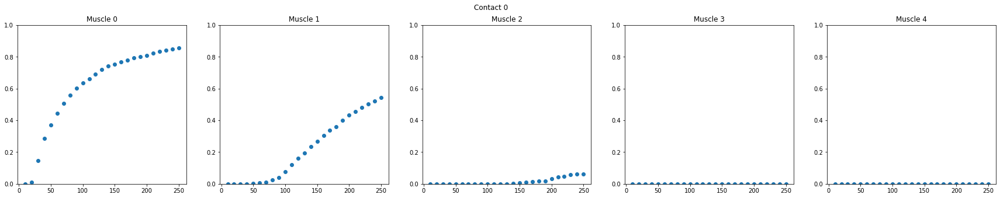

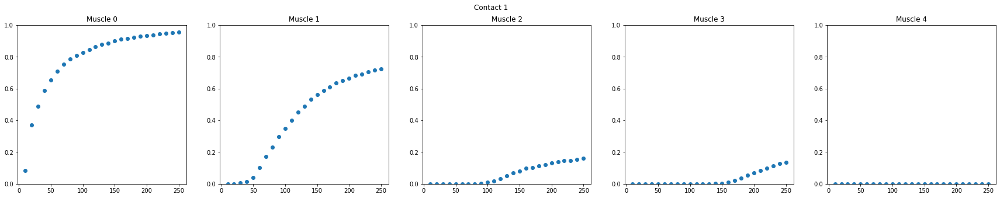

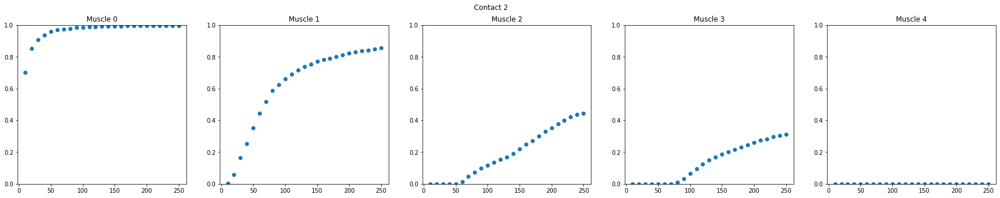

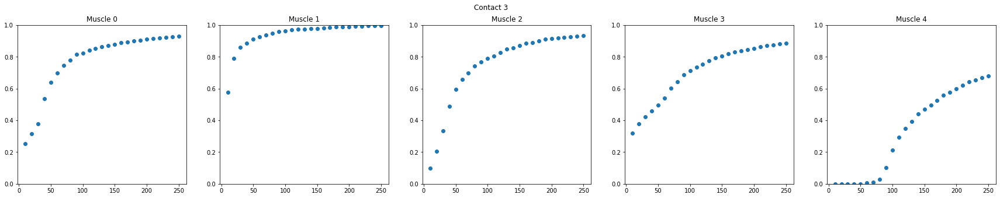

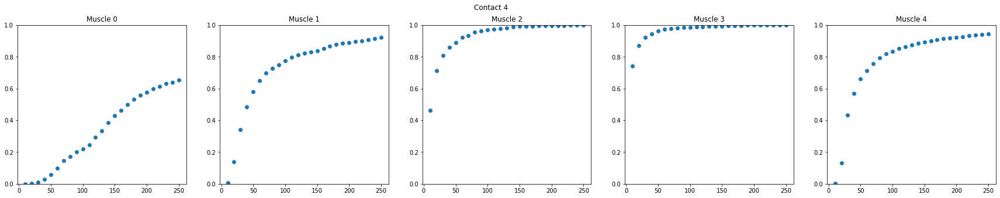

...

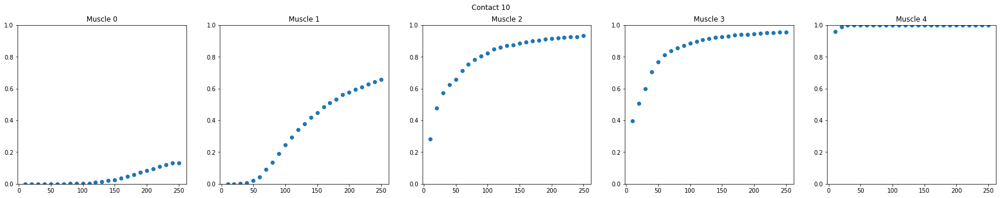

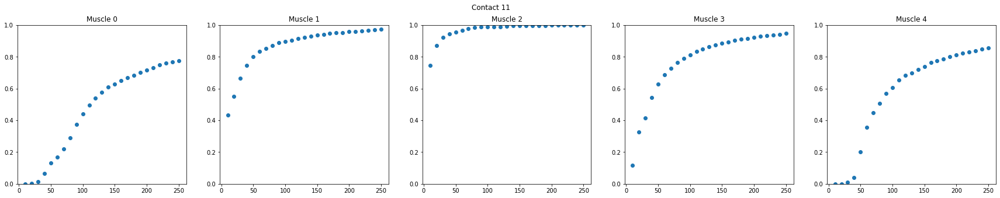

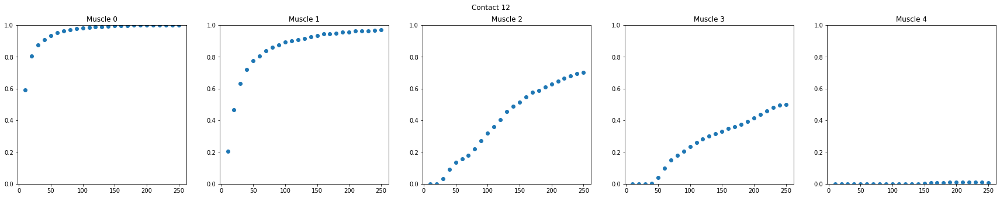

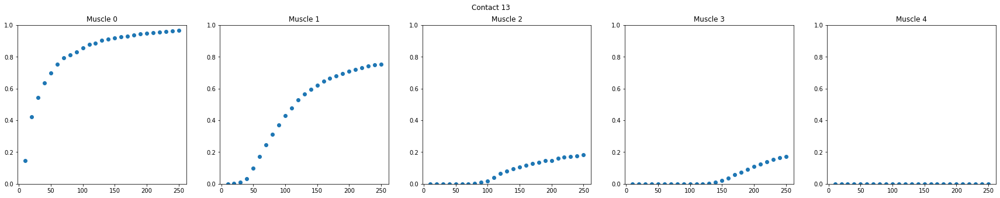

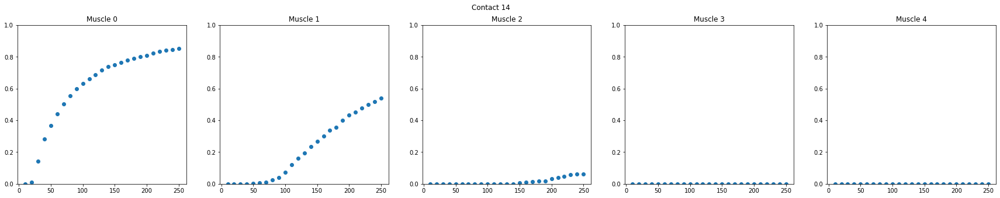

Pulse Amplitude: 1.0


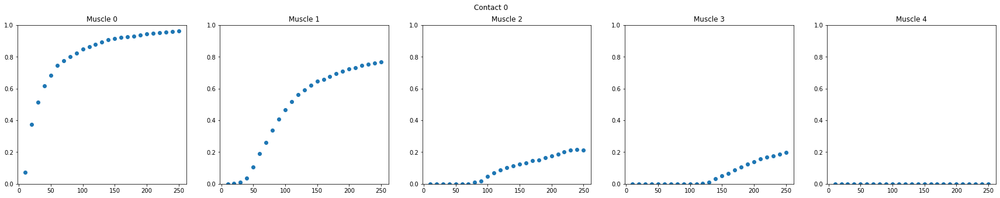

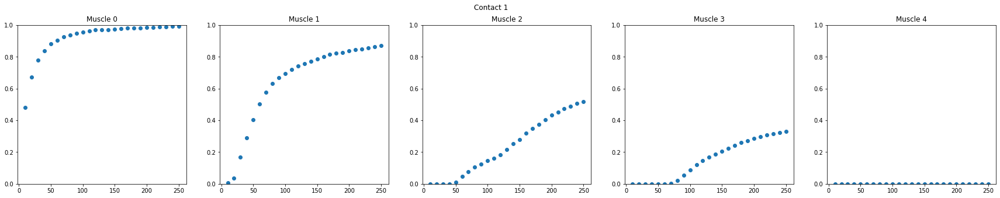

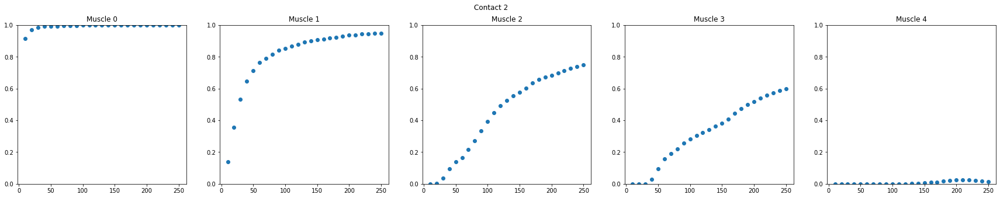

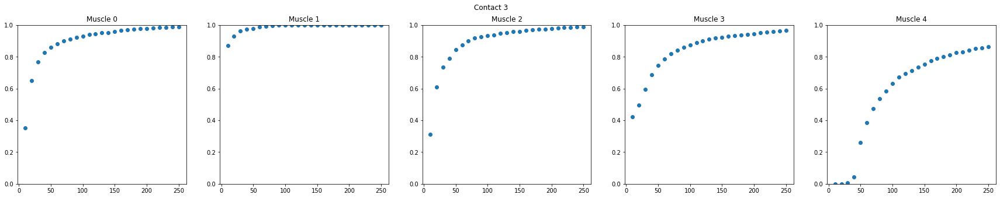

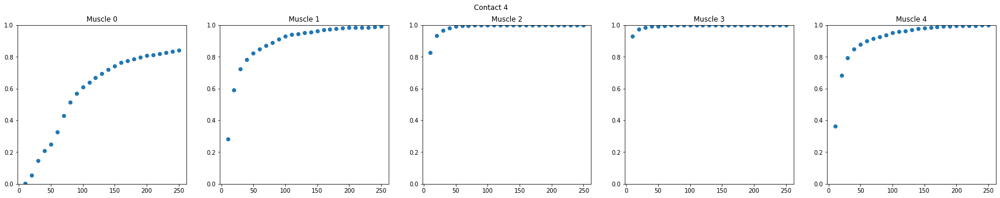

...

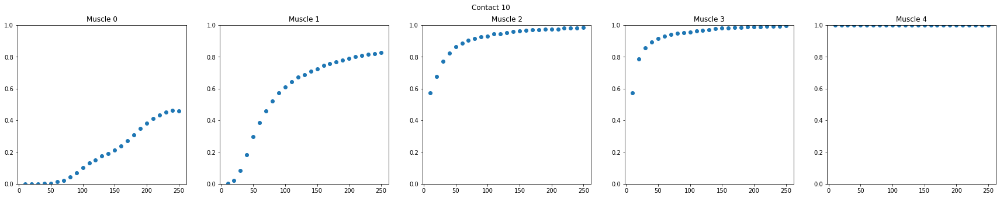

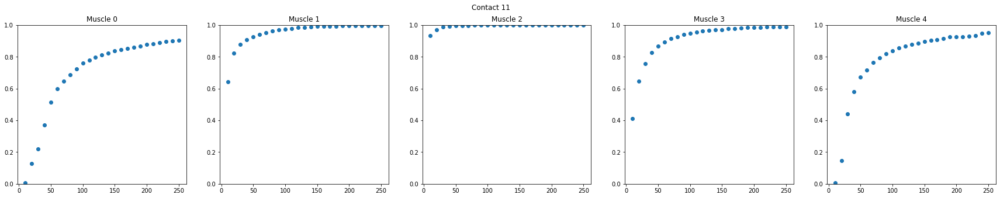

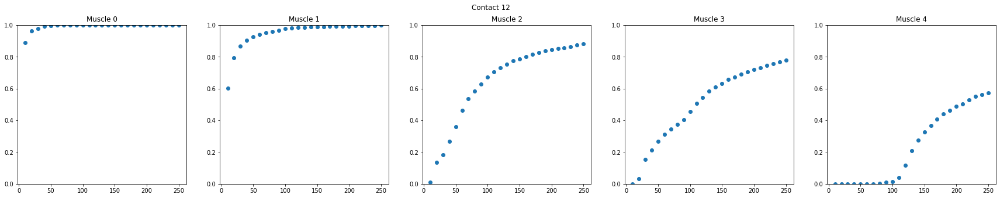

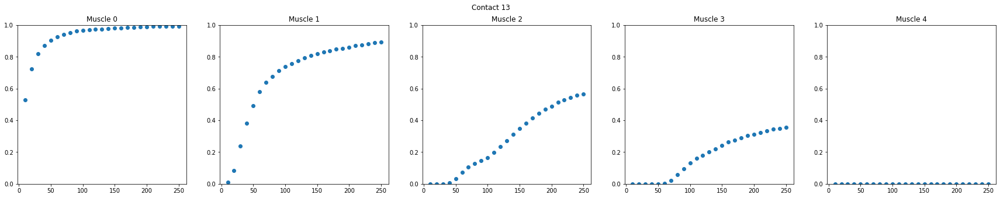

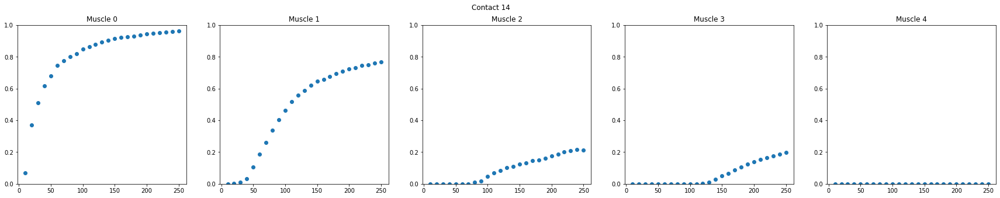

Pulse Amplitude: 1.5


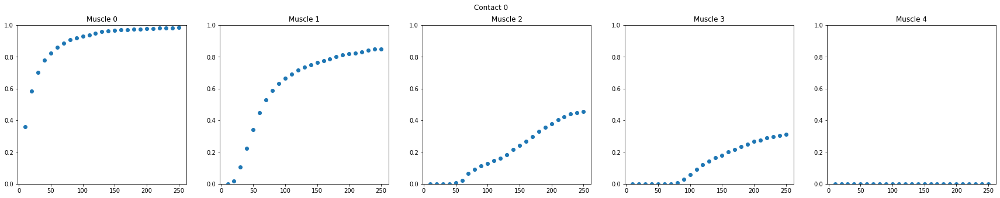

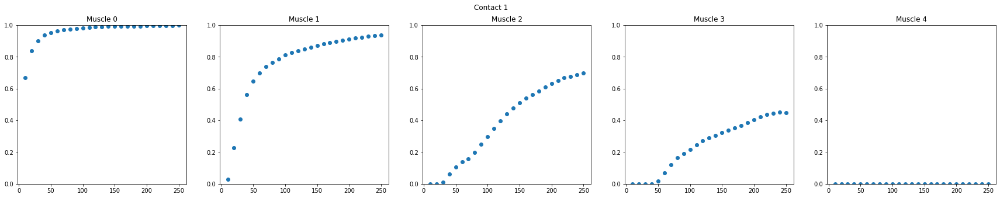

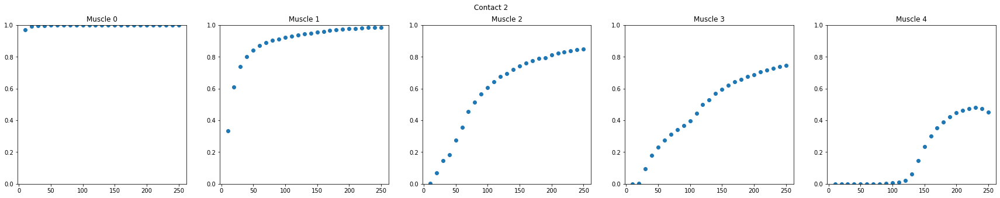

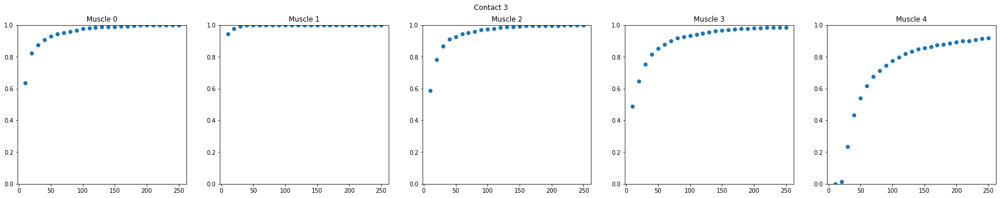

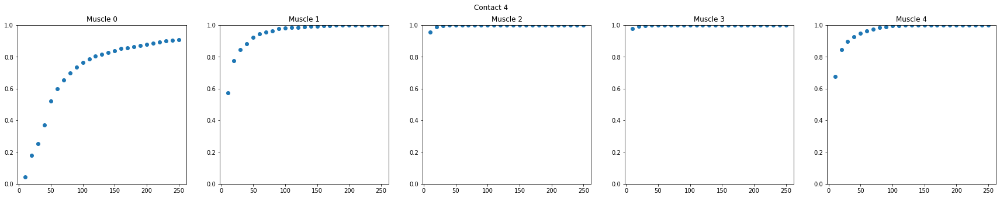

...

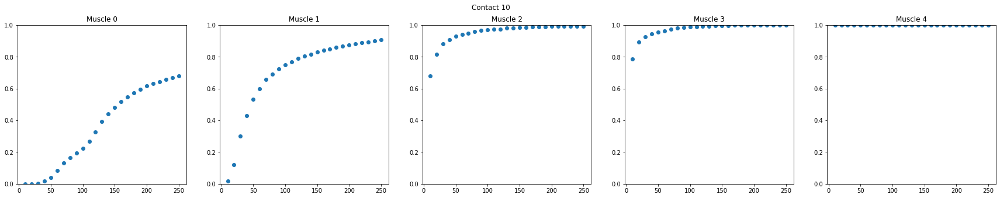

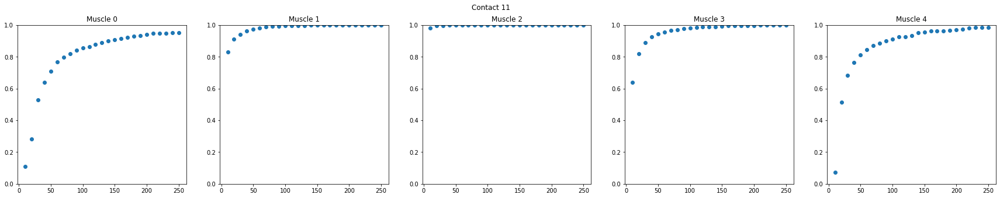

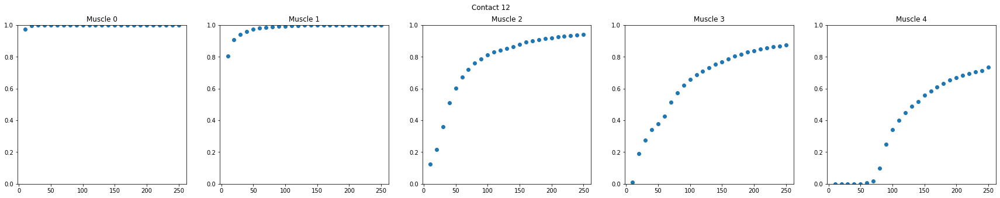

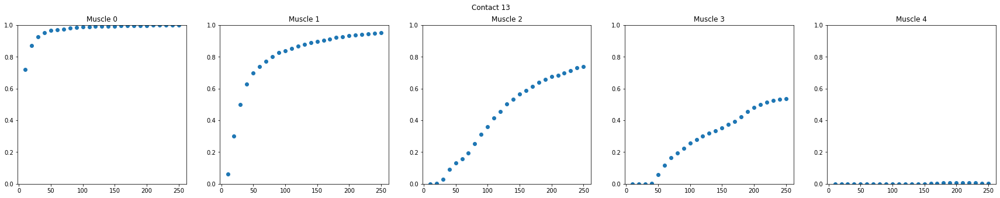

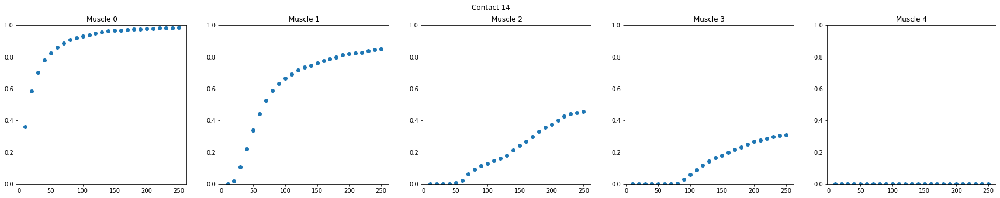

Pulse Amplitude: 2.0


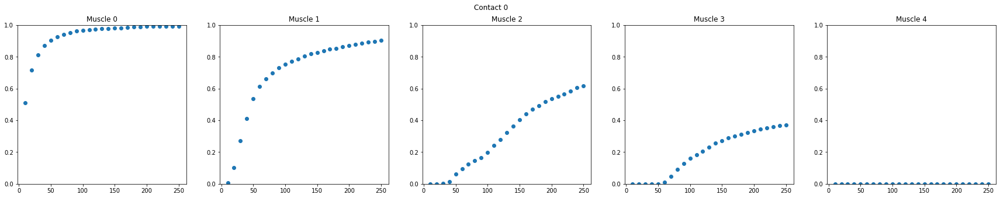

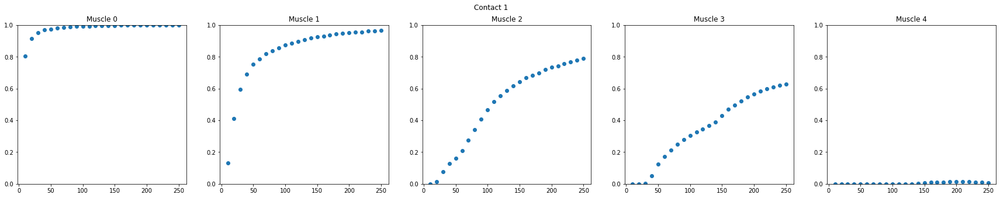

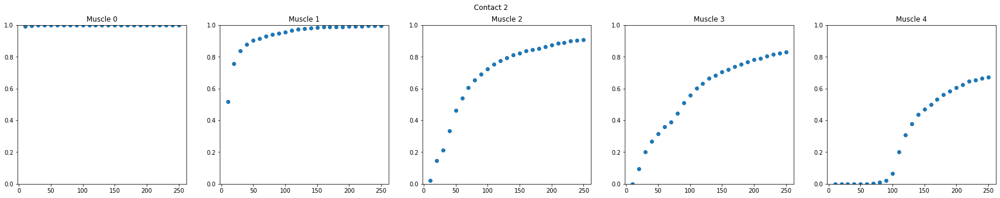

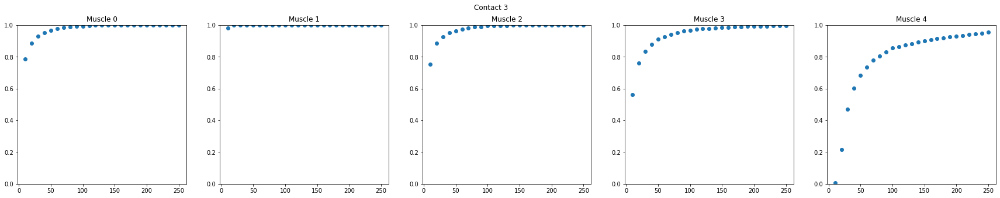

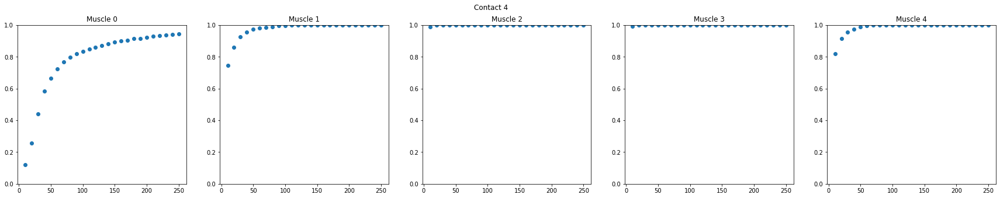

...

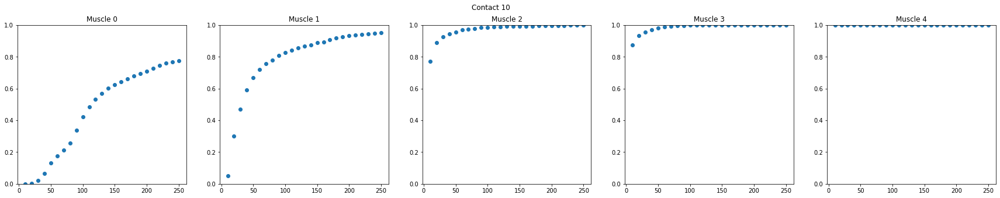

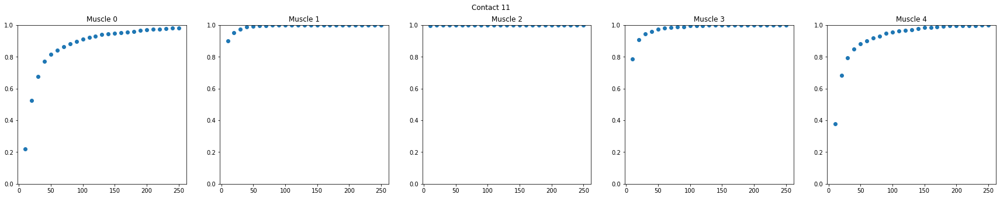

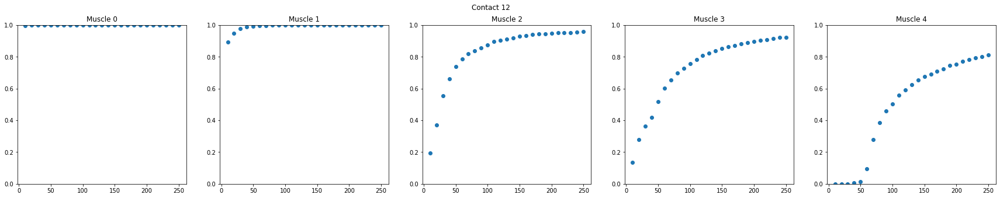

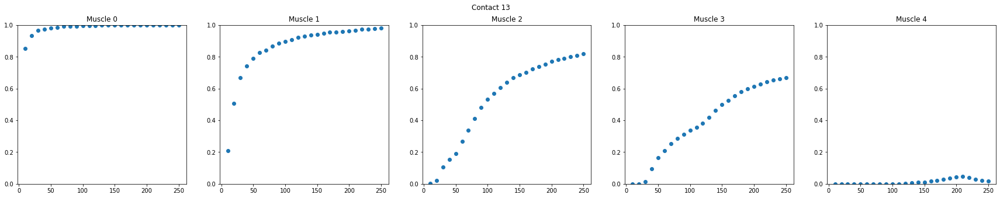

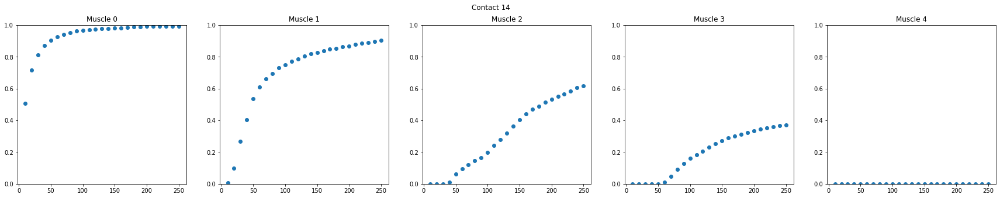

Pulse Amplitude: 2.5


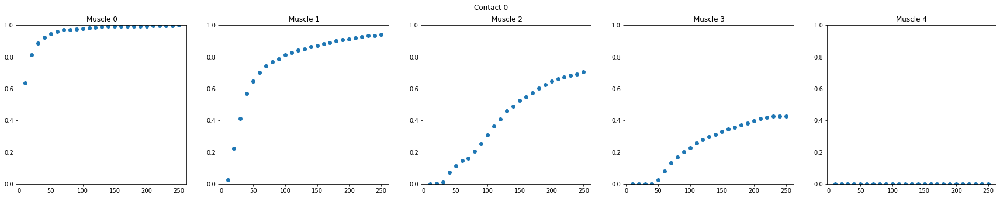

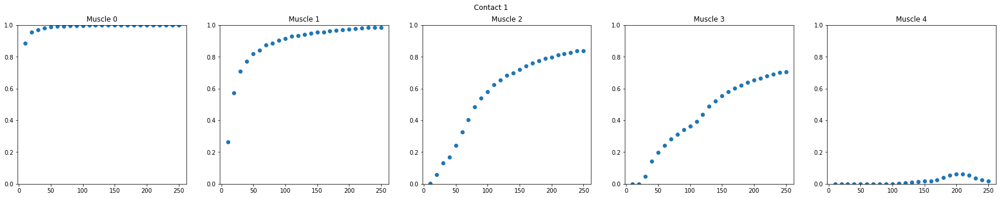

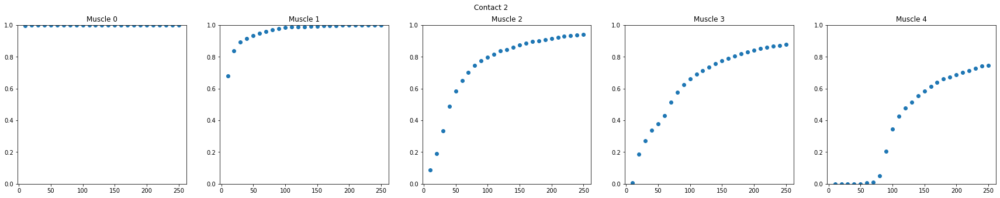

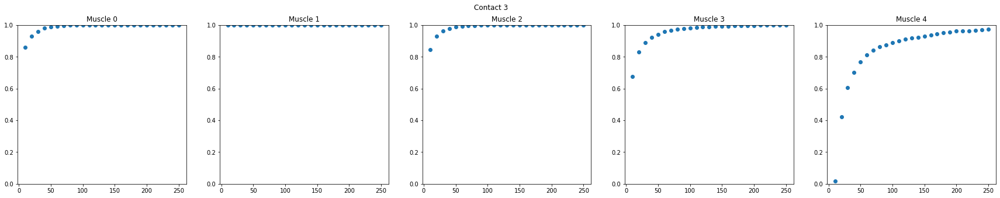

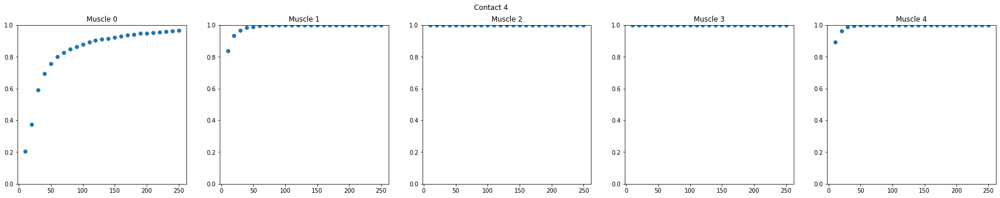

...

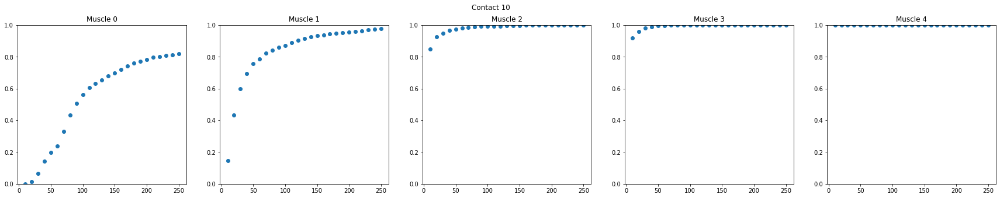

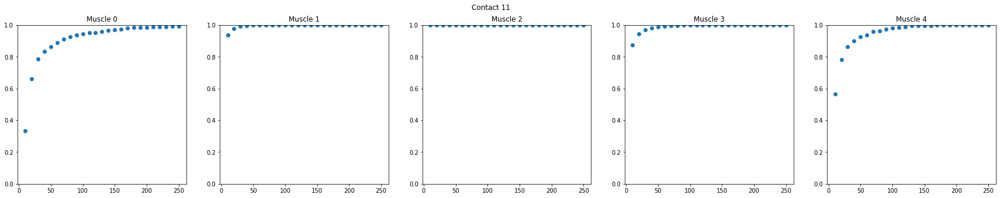

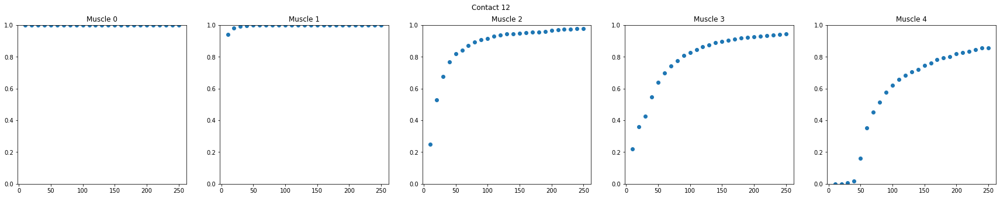

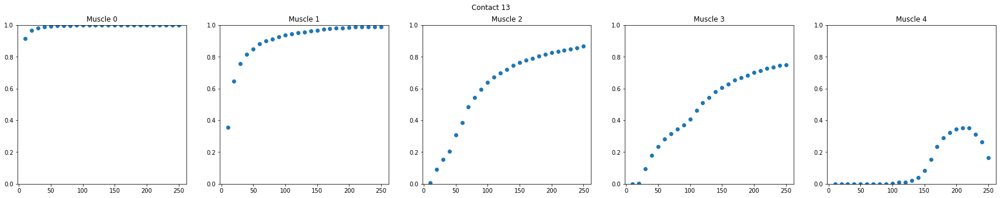

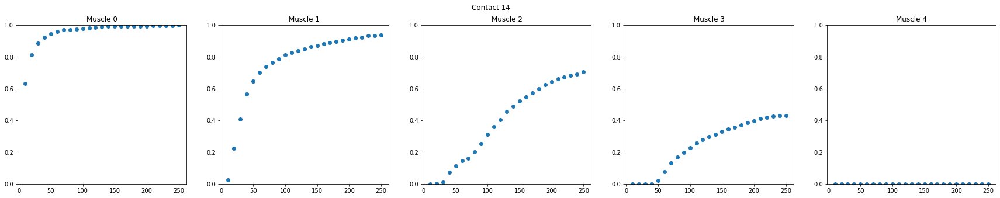

Pulse Amplitude: 3.0


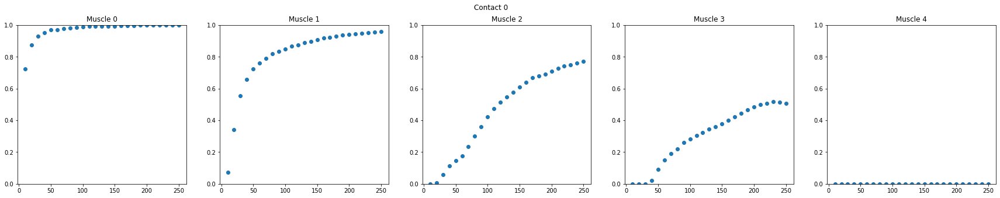

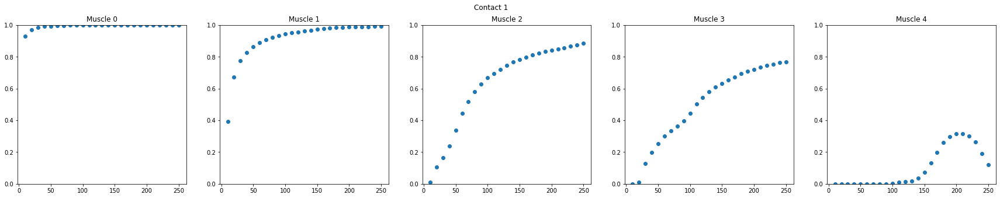

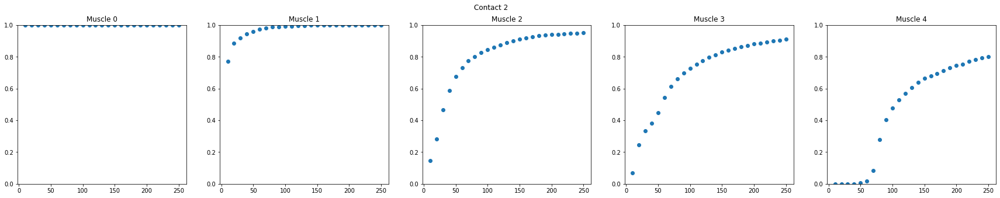

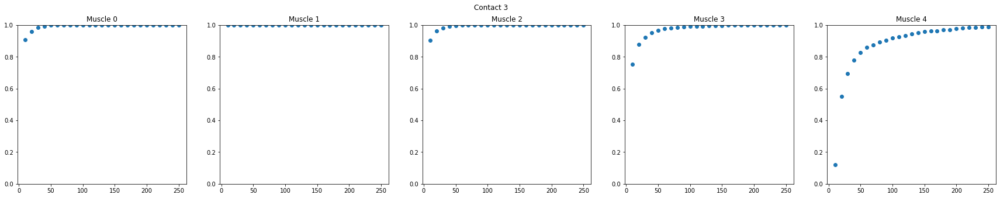

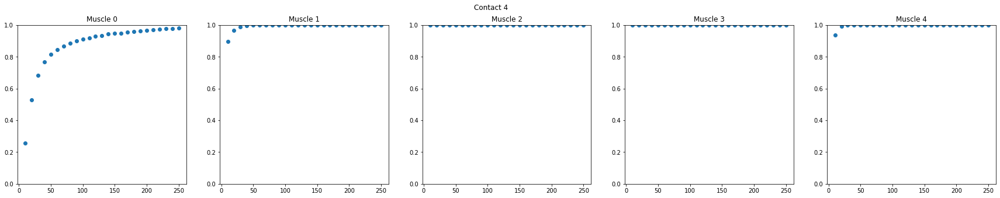

...

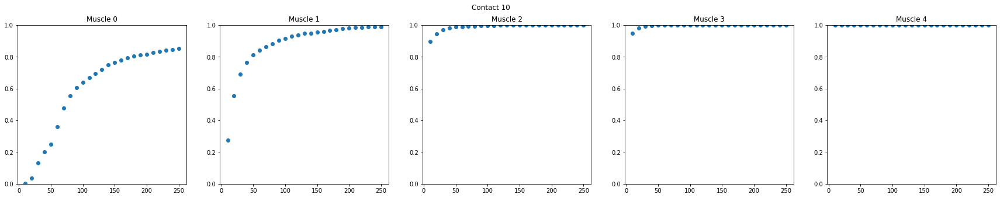

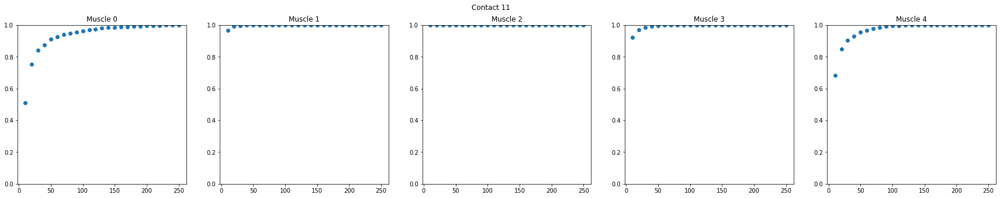

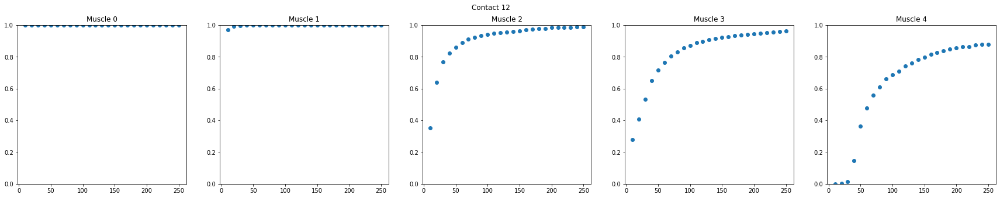

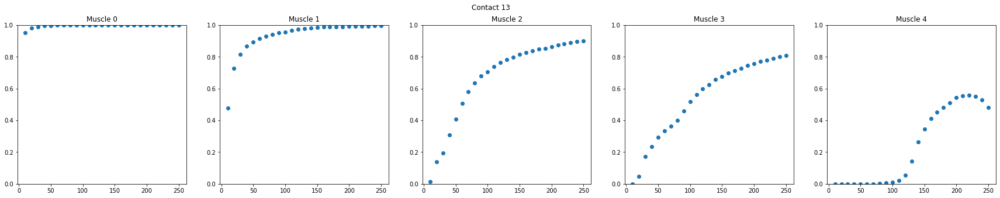

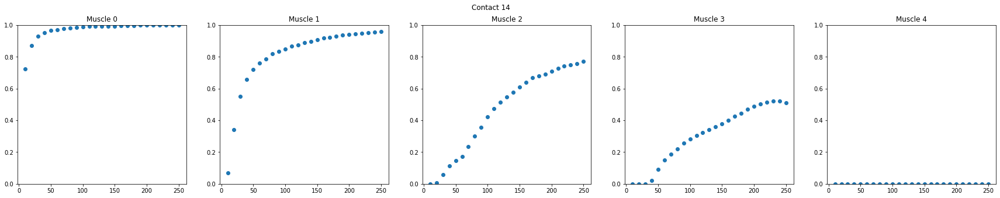

In [5]:
pw_x = np.arange(10,260,10)
pulse_amplitudes = np.arange(0.5,3.5,0.5)
for pulse_amplitude in pulse_amplitudes:
    print('Pulse Amplitude: {}'.format(str(pulse_amplitude)))
    for contact in range(15):
        curves = get_curves(singlemuscle_singlecontact_sweeppw,pulse_amplitude,contact)
        fig, ax = plt.subplots(nrows = 1, ncols = 5)
        fig.set_size_inches(30, 5)
        fig.suptitle('Contact {}'.format(contact))

        for muscle in range(5):
            ax[muscle].set_title('Muscle {}'.format(muscle))
            ax[muscle].set_ylim(0, 1)
            ax[muscle].scatter(pw_x,curves[:,muscle])
        plt.show()

# Ben's Ulnar Data (5 Muscles)

Ulnar700uA_10_1.csv


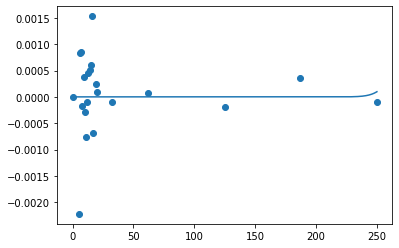

Ulnar700uA_10_2.csv


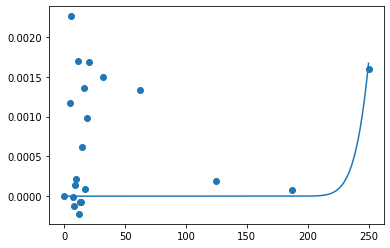

Ulnar700uA_10_3.csv


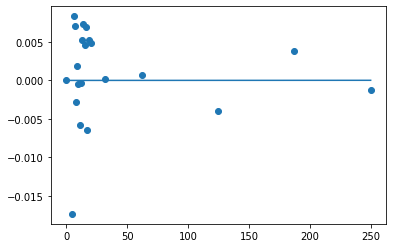

Ulnar700uA_10_4.csv


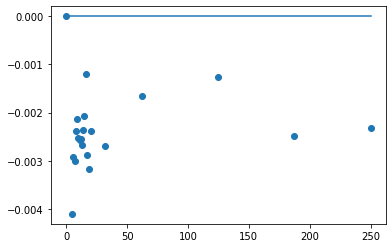

Ulnar700uA_10_5.csv


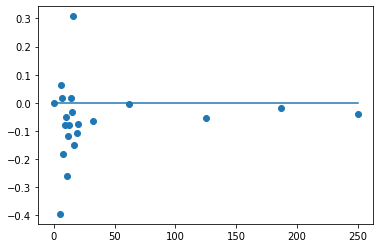

Ulnar700uA_11_1.csv


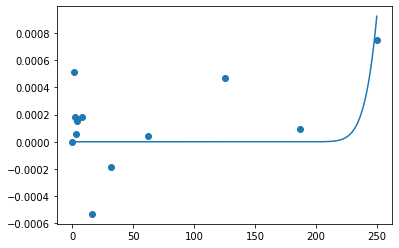

Ulnar700uA_11_2.csv


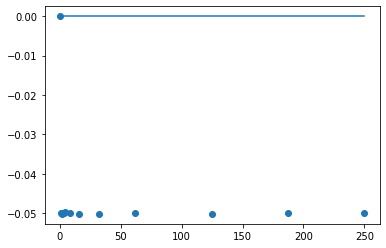

Ulnar700uA_11_3.csv


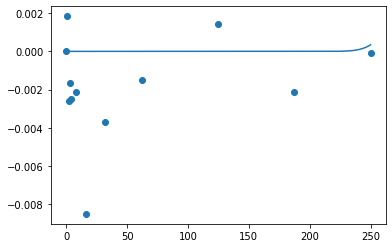

Ulnar700uA_11_4.csv


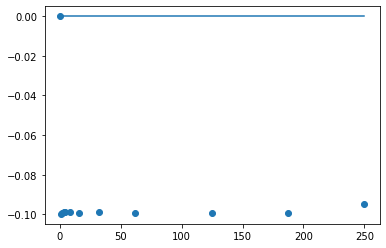

Ulnar700uA_11_5.csv


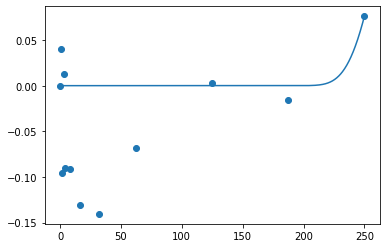

Ulnar700uA_12_1.csv


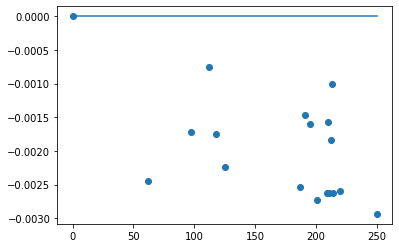

Ulnar700uA_12_2.csv


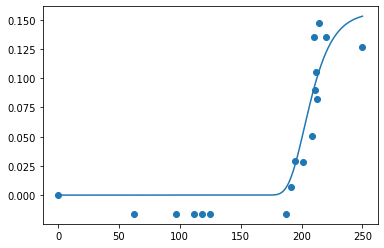

Ulnar700uA_12_3.csv


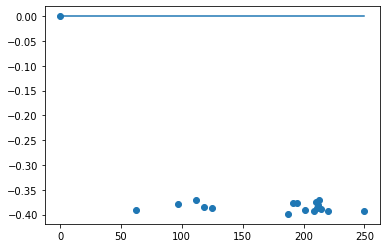

Ulnar700uA_12_4.csv


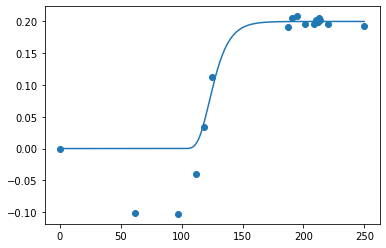

Ulnar700uA_12_5.csv


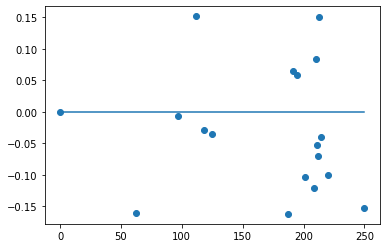

Ulnar700uA_13_1.csv


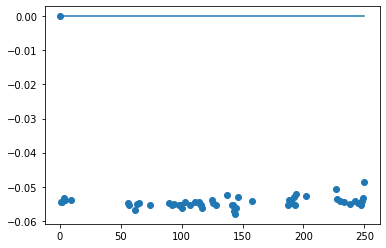

Ulnar700uA_13_2.csv


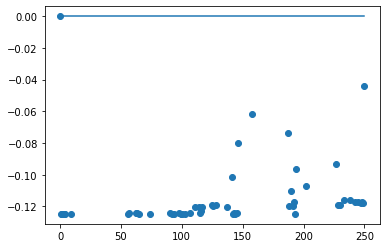

Ulnar700uA_13_3.csv


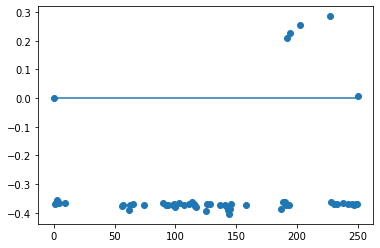

Ulnar700uA_13_4.csv


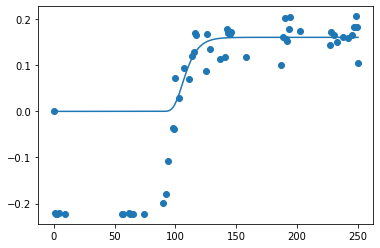

Ulnar700uA_13_5.csv


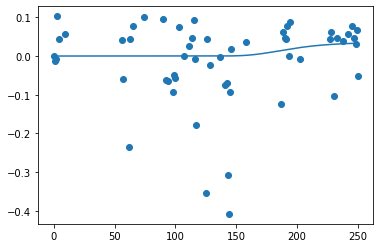

Ulnar700uA_14_1.csv


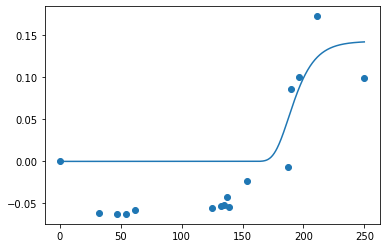

Ulnar700uA_14_2.csv


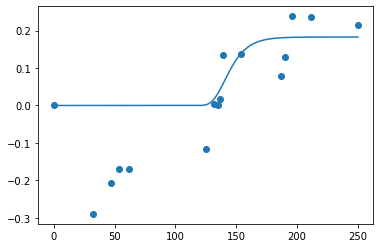

Ulnar700uA_14_3.csv


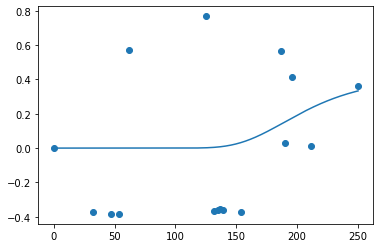

Ulnar700uA_14_4.csv


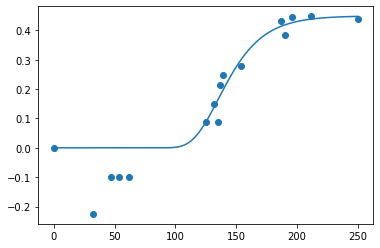

Ulnar700uA_14_5.csv


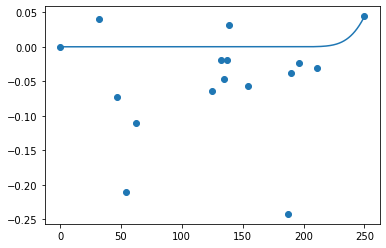

Ulnar700uA_15_1.csv


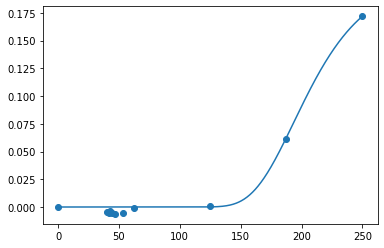

Ulnar700uA_15_2.csv


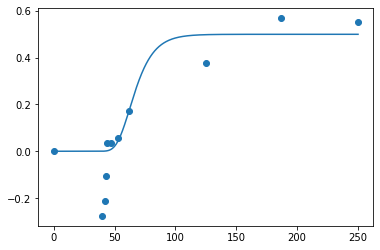

Ulnar700uA_15_3.csv


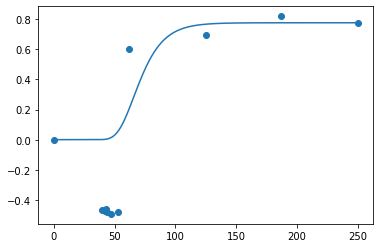

Ulnar700uA_15_4.csv


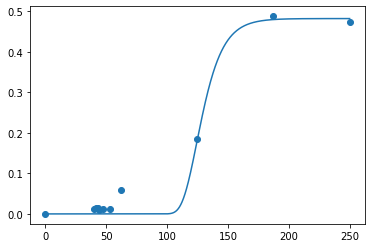

Ulnar700uA_15_5.csv


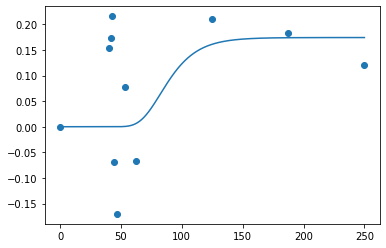

Ulnar700uA_16_1.csv


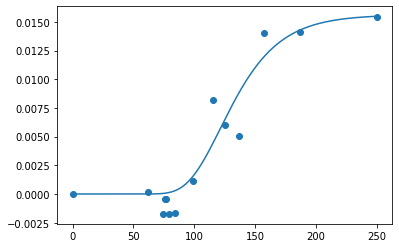

Ulnar700uA_16_2.csv


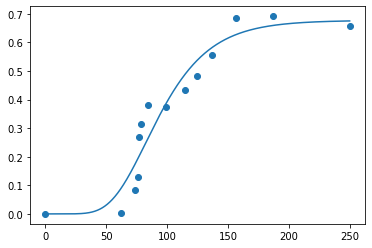

Ulnar700uA_16_3.csv


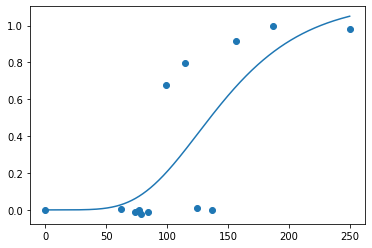

Ulnar700uA_16_4.csv


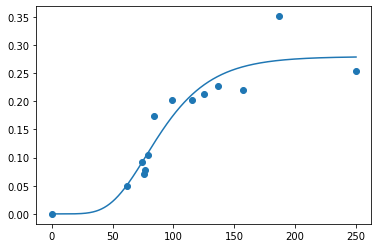

Ulnar700uA_16_5.csv


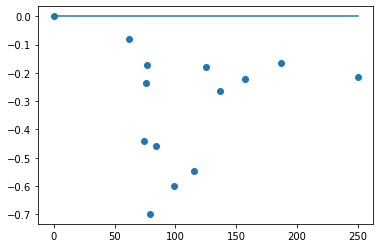

Ulnar700uA_17_1.csv


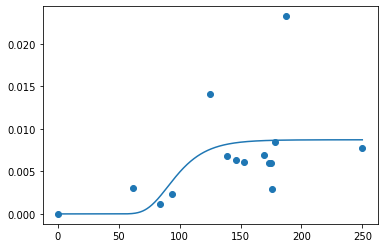

Ulnar700uA_17_2.csv


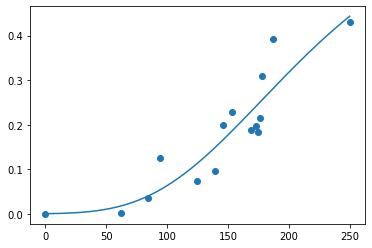

Ulnar700uA_17_3.csv


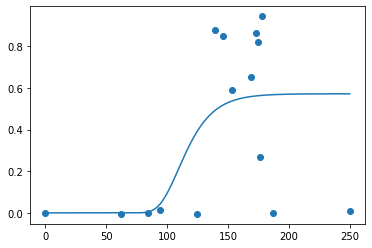

Ulnar700uA_17_4.csv


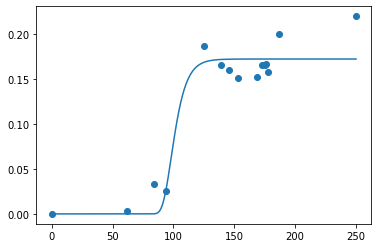

Ulnar700uA_17_5.csv


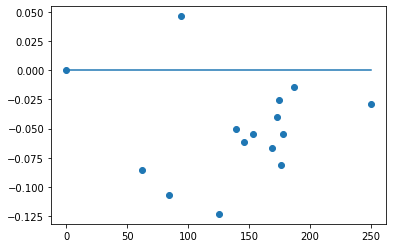

Ulnar700uA_4_1.csv


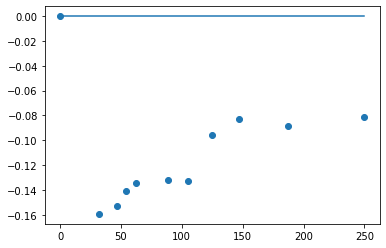

Ulnar700uA_4_2.csv


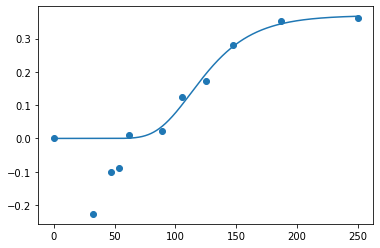

Ulnar700uA_4_3.csv


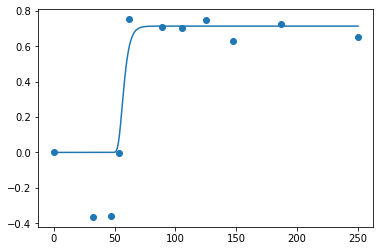

Ulnar700uA_4_4.csv


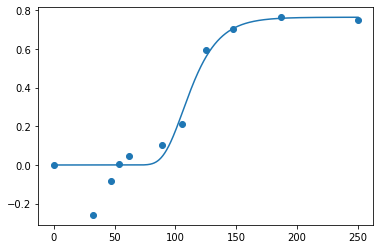

Ulnar700uA_4_5.csv


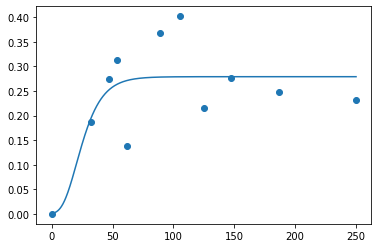

Ulnar700uA_5_1.csv


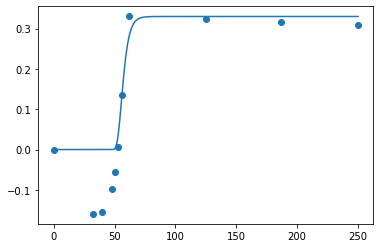

Ulnar700uA_5_2.csv


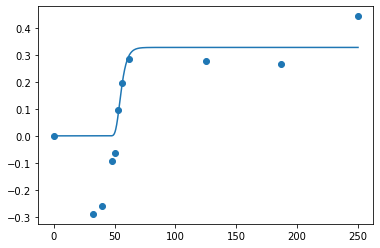

Ulnar700uA_5_3.csv


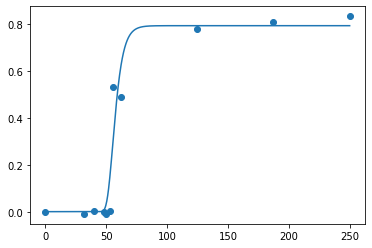

Ulnar700uA_5_4.csv


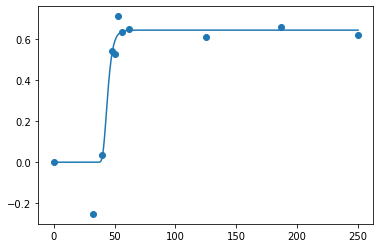

Ulnar700uA_5_5.csv


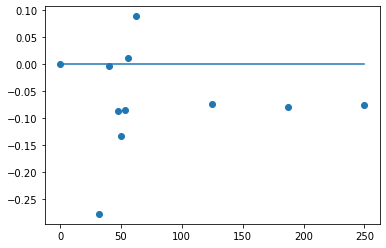

Ulnar700uA_6_1.csv


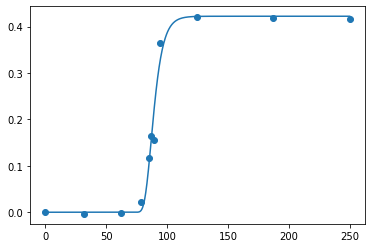

Ulnar700uA_6_2.csv


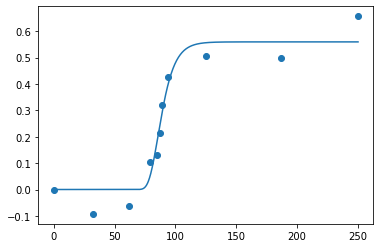

Ulnar700uA_6_3.csv


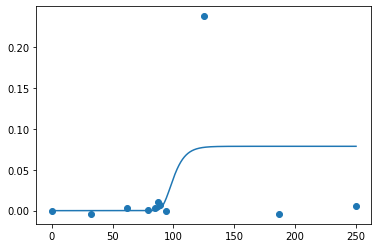

Ulnar700uA_6_4.csv


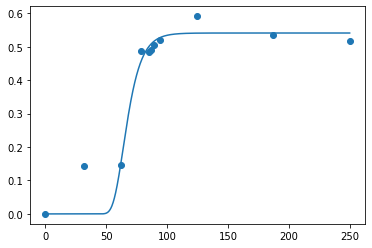

Ulnar700uA_6_5.csv


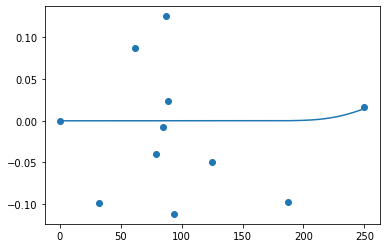

Ulnar700uA_7_1.csv


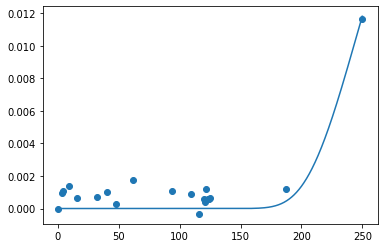

Ulnar700uA_7_2.csv


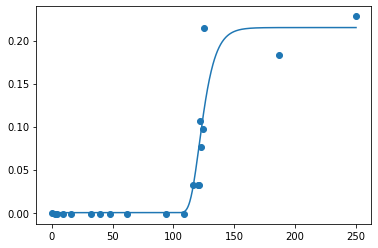

Ulnar700uA_7_3.csv


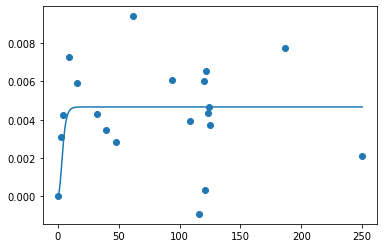

Ulnar700uA_7_4.csv


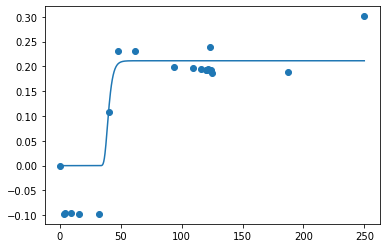

Ulnar700uA_7_5.csv


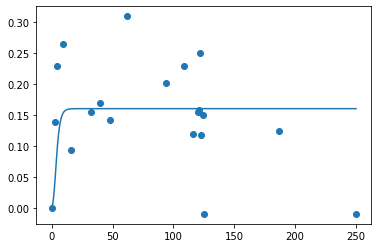

Ulnar700uA_8_1.csv


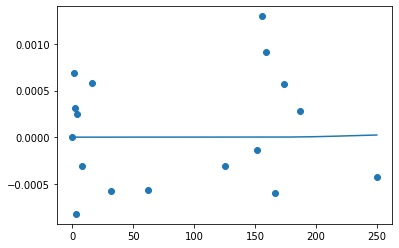

Ulnar700uA_8_2.csv


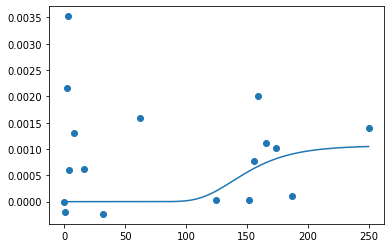

Ulnar700uA_8_3.csv


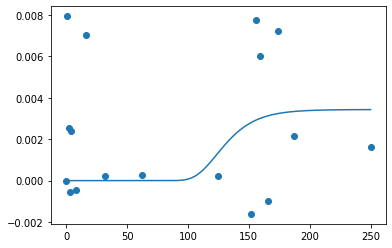

Ulnar700uA_8_4.csv


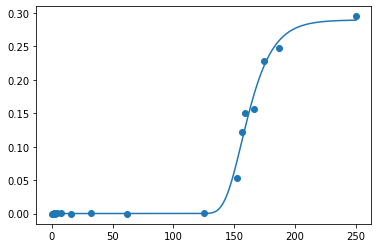

Ulnar700uA_8_5.csv


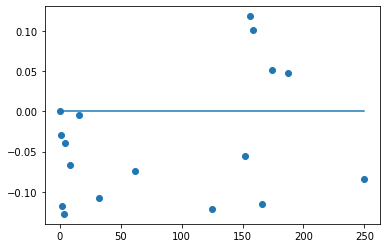

Ulnar700uA_9_1.csv


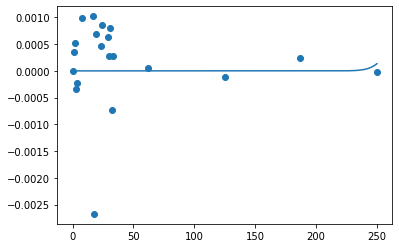

Ulnar700uA_9_2.csv


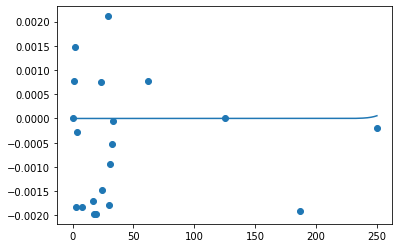

Ulnar700uA_9_3.csv


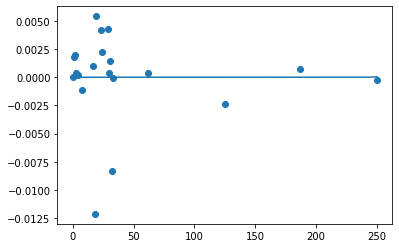

Ulnar700uA_9_4.csv


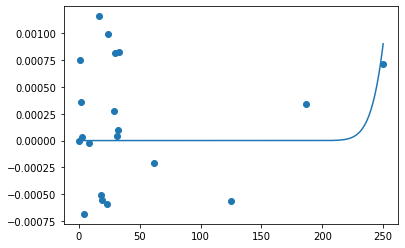

Ulnar700uA_9_5.csv


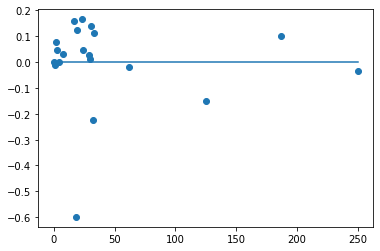

In [7]:
import os
path = '/Volumes/L_MillerLab/limblab/User_folders/Aajan/RecruitmentCurveFigures/Ulnar700uA'
filenames = sorted([filename for filename in os.listdir(path)])
for filename in filenames:
    if 'sigmoid' not in filename:
        print(filename)
        f = os.path.join(path,filename)
        f2 = os.path.join(path,filename[:-4]+'_sigmoid.csv')
        curve = np.genfromtxt(f, delimiter = ',')
        sigmoid = np.genfromtxt(f2, delimiter = ',')
        plt.scatter(curve[:,0],curve[:,1])
        plt.plot(sigmoid[:,0],sigmoid[:,1])
        plt.show()

# Fit Single Sigmoid

In [261]:
def single_sig_model(xi, theta):
    a1, a2, a3, a4 = theta[0], theta[1], theta[2], theta[3]
    return a1 + (a2-a1)/(1+math.exp(-a3*(xi-a4)))

def compute_square_loss_single_sig(xi, yi, theta):
    loss = (single_sig_model(xi, theta)-yi)**2
    return(loss)

def compute_square_loss_gradient_single_sig(xi, yi, theta):
    a1, a2, a3, a4 = theta[0], theta[1], theta[2], theta[3]
    
    df_da1 = 0#1-1/(1+math.exp(-a3*(xi-a4)))
    df_da2 = 1/(1+math.exp(-a3*(xi-a4)))
    df_da3 = (-1*(a2-a1)/((1+math.exp(-a3*(xi-a4)))**2)) * math.exp(-a3*(xi-a4))*(a4-xi)
    df_da4 = (-1*(a2-a1)/((1+math.exp(-a3*(xi-a4)))**2)) * math.exp(-a3*(xi-a4))*a3
    
    grad_J = np.array([2*df_da1*(single_sig_model(xi, theta)-yi), 2*df_da2*(single_sig_model(xi, theta)-yi),\
                       2*df_da3*(single_sig_model(xi, theta)-yi), 2*df_da4*(single_sig_model(xi, theta)-yi)])
    return(grad_J)

In [178]:
def stochastic_grad_descent_single_sig(X, y, theta, num_epoch=10000):
    num_instances = len(X)
    loss_hist = np.zeros(num_epoch)
    theta_hist = []
    
    for n in range(num_epoch):
        loss = 0
        for i in range(len(X)):
            xi = X[i]
            yi = y[i]
            grad_f = compute_square_loss_gradient_single_sig(xi,yi,theta)
            #step size changes with 1/sqrt(t)
            theta -= 0.01*grad_f
            loss += compute_square_loss_single_sig(xi,yi,theta)
        theta_hist.append(theta)
        loss_hist[n]=loss/num_instances
        
    best_theta = theta_hist[np.argmin(loss_hist)]
        
    return(best_theta,loss_hist)

In [181]:
def fit_and_plot(X, y, theta, num_epoch=10000):
    best_theta, loss_hist = stochastic_grad_descent_single_sig(X, y, theta, num_epoch)
    lowest_loss = round(min(loss_hist),7)
    best_theta = np.round(best_theta,3)
    print('Lowest loss: {}'.format(lowest_loss))
    print('a1: {}, a2: {}, a3: {}, a4: {}'.format(best_theta[0],best_theta[1],best_theta[2],best_theta[3]))
    fig, ax = plt.subplots(nrows = 1, ncols = 2)
    fig.set_size_inches(8, 3)
    ax[0].plot(loss_hist)
    ax[0].set_xlabel('Epoch')
    ax[0].set_ylabel('Loss')
    
    pw_x = np.arange(0,260,10)
    preds = [single_sig_model(xi, best_theta) for xi in pw_x]
    ax[1].plot(pw_x, preds)
    ax[1].scatter(X, y)
    ax[1].set_xlabel('Pulse Width')
    ax[1].set_ylabel('Activation')
    plt.show()
    
    return(best_theta, lowest_loss)

### Fit Single Sigmoid to Vlad's Data

Final loss: 0.0018933
a1: -0.711, a2: 0.809, a3: 0.031, a4: 18.116


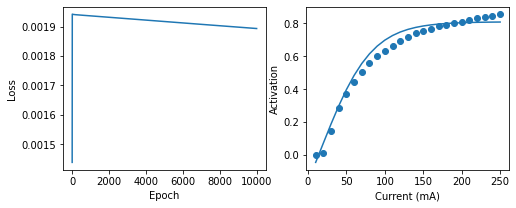

Final loss: 0.0151009
a1: 0.364, a2: -0.392, a3: -0.046, a4: 18.643


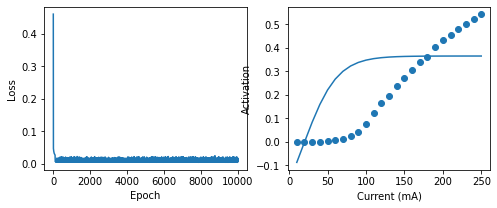

Final loss: 2.62e-05
a1: 0.092, a2: -0.116, a3: -0.008, a4: 18.643


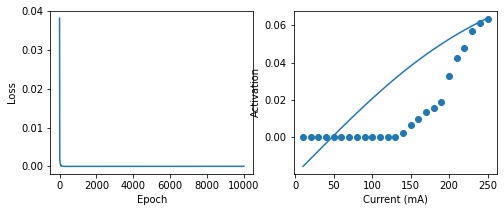

Final loss: 0.0
a1: 0.103, a2: -0.103, a3: 0.0, a4: 18.643


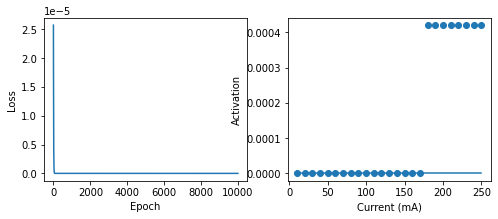

Final loss: 0.0
a1: 0.103, a2: -0.103, a3: 0.0, a4: 18.643


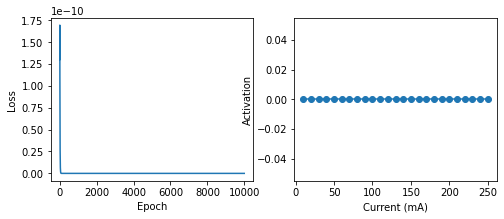

In [23]:
curves = get_curves(0.5,0)
for muscle in range(7):
    fit_and_plot(pw_x,curves[:,muscle])

Final loss: 7.03e-05
a1: 0.917, a2: -0.272, a3: -0.028, a4: 18.65


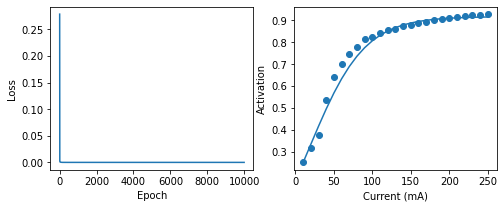

Final loss: 0.0004193
a1: 0.979, a2: 0.448, a3: -0.078, a4: 18.581


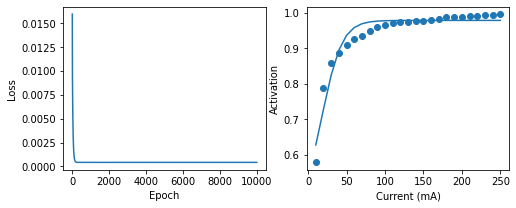

Final loss: 6.53e-05
a1: 0.93, a2: -0.517, a3: -0.026, a4: 18.593


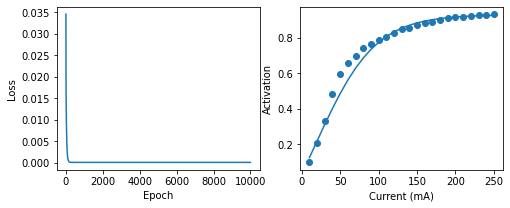

Final loss: 0.0003112
a1: 0.876, a2: -0.155, a3: -0.023, a4: 18.617


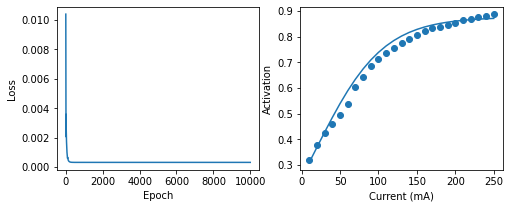

Final loss: 0.0498491
a1: 0.481, a2: -0.408, a3: -0.059, a4: 20.108


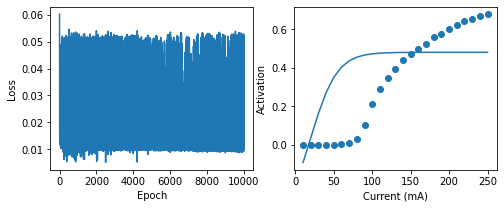

In [24]:
curves = get_curves(0.5,3)
for muscle in range(5):
    fit_and_plot(pw_x,curves[:,muscle], num_epoch = 10000)

Normal
Final loss: 0.0001373
a1: -0.167, a2: 0.914, a3: 0.03, a4: 25.044


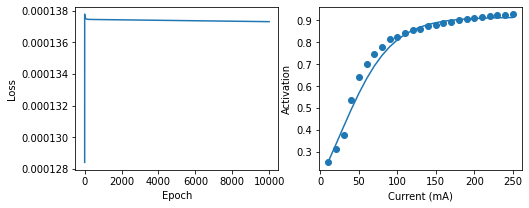

Normal
Final loss: 0.0005494
a1: 0.552, a2: 0.98, a3: 0.081, a4: 24.955


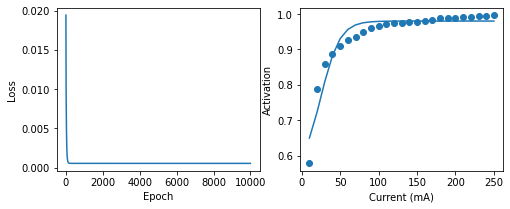

Normal
Final loss: 9.04e-05
a1: -0.393, a2: 0.928, a3: 0.026, a4: 24.943


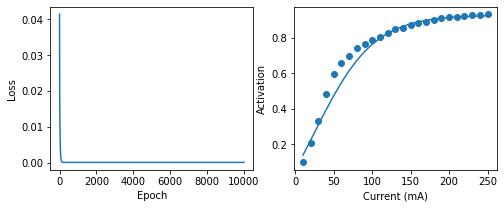

Normal
Final loss: 0.0001656
a1: -0.093, a2: 0.883, a3: 0.022, a4: 24.959


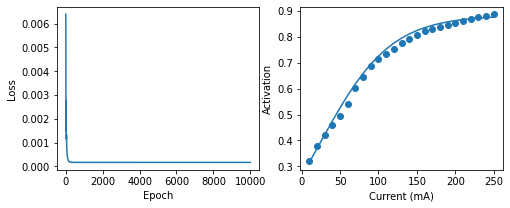

Modified: 120
Final loss: 0.0168987
a1: -0.352, a2: 0.518, a3: 0.042, a4: 26.511


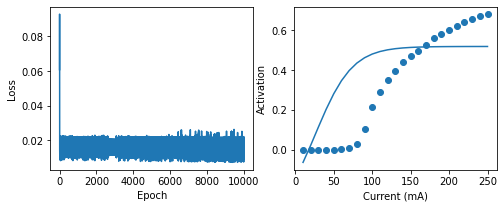

In [34]:
curves = get_curves(0.5,3)
for muscle in range(5):
    m = np.absolute(curves[:,muscle]-0.5*np.max(curves[:,muscle]))
    ind = np.argmin(m)
    if pw_x[ind] <= 100:
        print('Normal')
        fit_and_plot(pw_x,curves[:,muscle])
    else:
        print('Modified: {}'.format(pw_x[ind]))
        fit_and_plot(pw_x,curves[:,muscle], theta=np.array([0.0,1.0,1.0,pw_x[ind]]))

### Fit Single Sigmoid to Ben's Data

Ulnar700uA_10_1.csv
Final loss: 1e-07
a1: 0.001, a2: 0.0, a3: 0.07, a4: 29.406


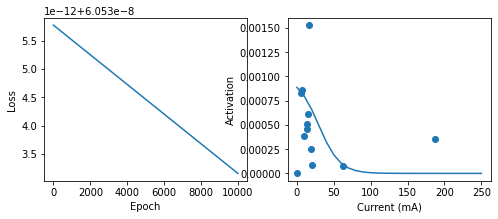

Ulnar700uA_10_2.csv
Final loss: 3e-07
a1: 0.001, a2: 0.001, a3: 0.07, a4: 29.406


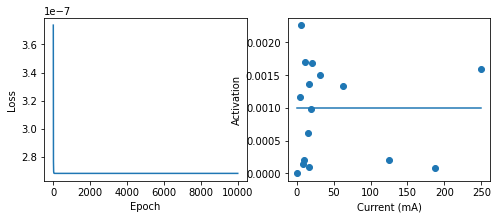

Ulnar700uA_10_3.csv
Final loss: 2.7e-06
a1: 0.006, a2: 0.002, a3: 0.081, a4: 29.406


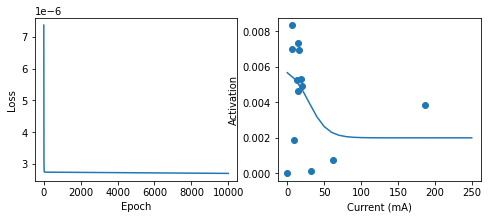

Ulnar700uA_10_4.csv
Final loss: 0.0
a1: -0.0, a2: 0.001, a3: 0.081, a4: 29.406


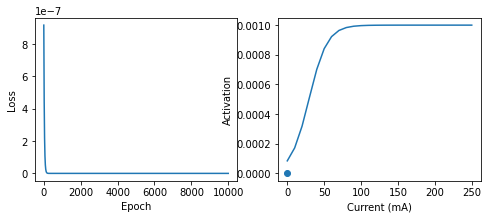

Ulnar700uA_10_5.csv
Final loss: 0.0009031
a1: -0.034, a2: 1.492, a3: 0.131, a4: 29.297


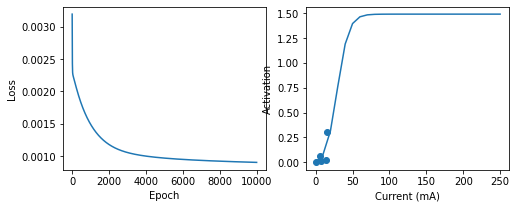

Ulnar700uA_11_1.csv
Final loss: 0.0
a1: 0.0, a2: 0.0, a3: -0.511, a4: 29.299


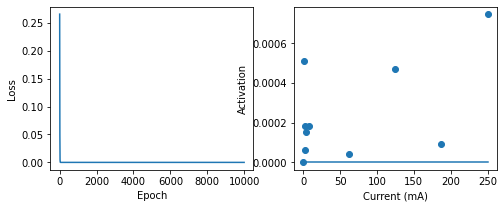

Ulnar700uA_11_2.csv
Final loss: 0.0
a1: 0.0, a2: -0.0, a3: -0.511, a4: 29.299


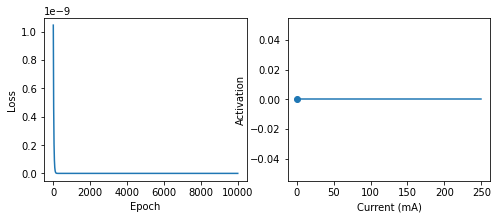

Ulnar700uA_11_3.csv
Final loss: 1e-07
a1: 0.001, a2: 0.001, a3: -0.511, a4: 29.299


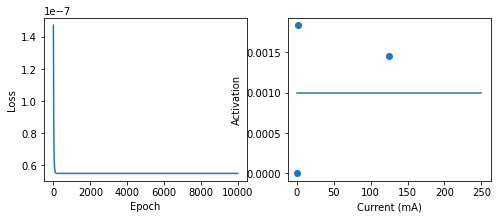

Ulnar700uA_11_4.csv
Final loss: 0.0
a1: 0.001, a2: -0.0, a3: -0.511, a4: 29.299


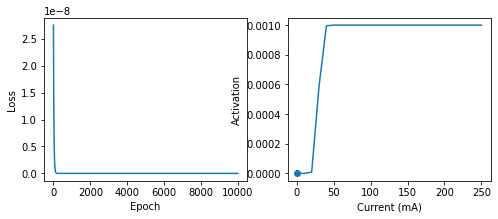

Ulnar700uA_11_5.csv
Final loss: 0.0001133
a1: 0.04, a2: 0.017, a3: -0.511, a4: 29.299


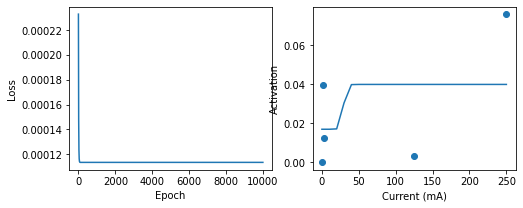

Ulnar700uA_12_1.csv
Final loss: 0.0
a1: 0.04, a2: -0.0, a3: -0.511, a4: 29.299


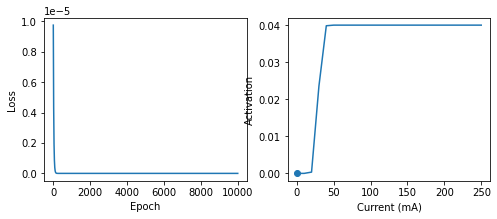

Ulnar700uA_12_2.csv
Final loss: 0.0008086
a1: 0.088, a2: -0.0, a3: -0.511, a4: 29.299


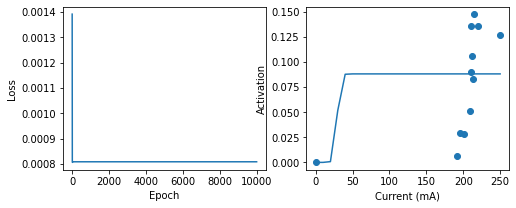

Ulnar700uA_12_3.csv
Final loss: 0.0
a1: 0.088, a2: -0.0, a3: -0.511, a4: 29.299


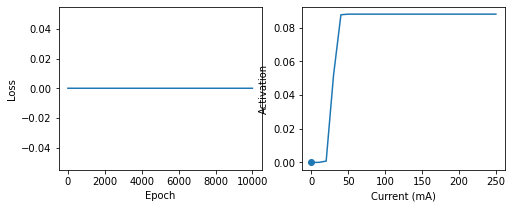

Ulnar700uA_12_4.csv
Final loss: 0.0010007
a1: 0.183, a2: -0.0, a3: -0.511, a4: 29.299


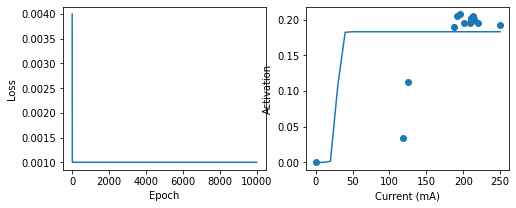

Ulnar700uA_12_5.csv
Final loss: 0.0002759
a1: 0.102, a2: -0.0, a3: -0.511, a4: 29.299


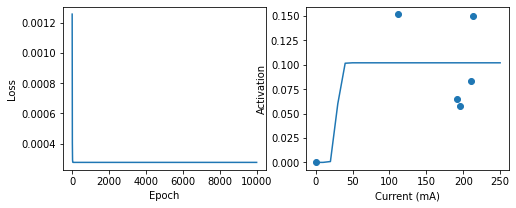

Ulnar700uA_13_1.csv
Final loss: 0.0
a1: 0.102, a2: -0.0, a3: -0.511, a4: 29.299


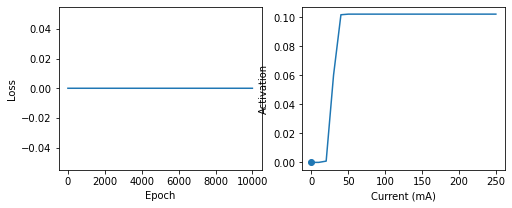

Ulnar700uA_13_2.csv
Final loss: 0.0
a1: 0.102, a2: -0.0, a3: -0.511, a4: 29.299


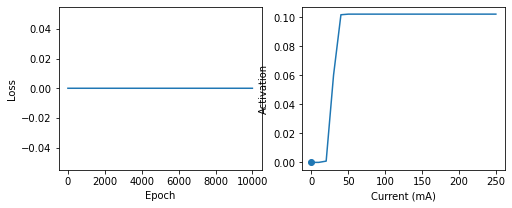

Ulnar700uA_13_3.csv
Final loss: 0.0015835
a1: 0.196, a2: -0.0, a3: -0.511, a4: 29.299


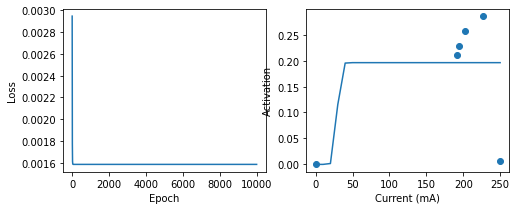

Ulnar700uA_13_4.csv
Final loss: 0.0019665
a1: 0.151, a2: -0.0, a3: -0.511, a4: 29.299


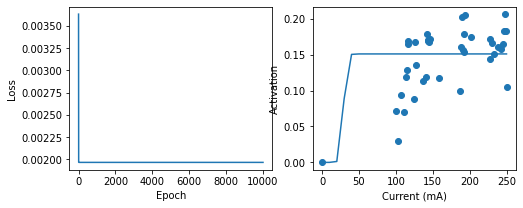

Ulnar700uA_13_5.csv
Final loss: 0.0005973
a1: 0.057, a2: 0.052, a3: -0.511, a4: 29.299


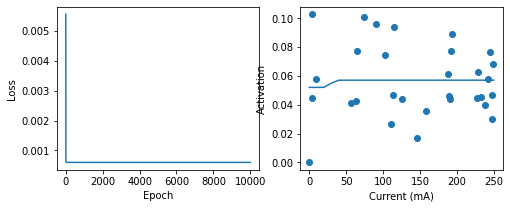

Ulnar700uA_14_1.csv
Final loss: 0.0001519
a1: 0.115, a2: -0.0, a3: -0.511, a4: 29.299


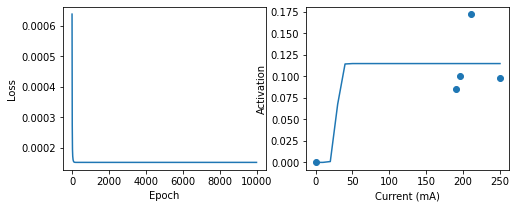

Ulnar700uA_14_2.csv
Final loss: 0.0024939
a1: 0.124, a2: -0.0, a3: -0.511, a4: 29.299


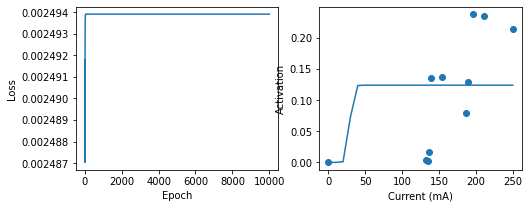

Ulnar700uA_14_3.csv
Final loss: 0.015728
a1: 0.383, a2: -0.0, a3: -0.511, a4: 29.299


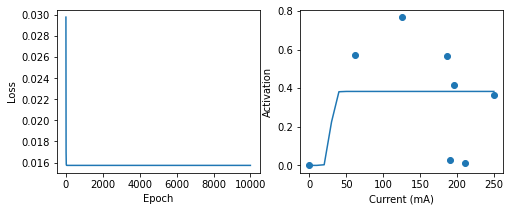

Ulnar700uA_14_4.csv
Final loss: 0.0068717
a1: 0.3, a2: -0.0, a3: -0.511, a4: 29.299


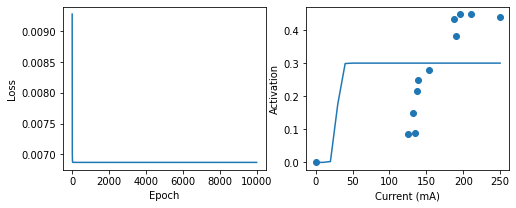

Ulnar700uA_14_5.csv
Final loss: 4.9e-06
a1: 0.041, a2: 0.001, a3: -0.53, a4: 29.295


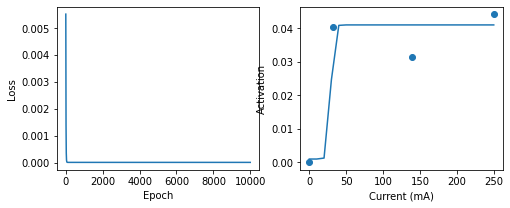

Ulnar700uA_15_1.csv
Final loss: 0.0004904
a1: 0.079, a2: -0.0, a3: -0.53, a4: 29.295


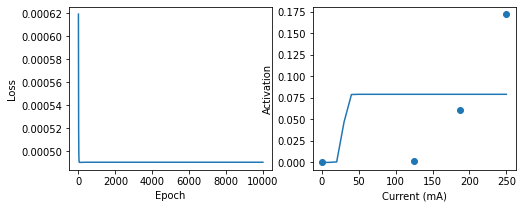

Ulnar700uA_15_2.csv
Final loss: 0.0006823
a1: 0.553, a2: -0.369, a3: -0.026, a4: 29.325


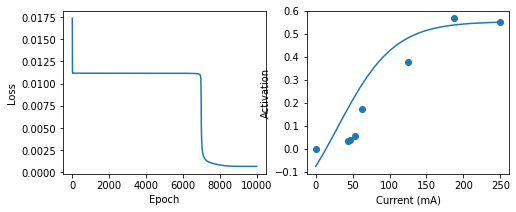

Ulnar700uA_15_3.csv
Final loss: 0.0002074
a1: 0.77, a2: -0.197, a3: -0.046, a4: 29.317


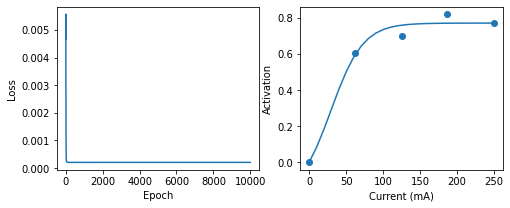

Ulnar700uA_15_4.csv
Final loss: 0.0025822
a1: 0.435, a2: -0.363, a3: -0.036, a4: 29.342


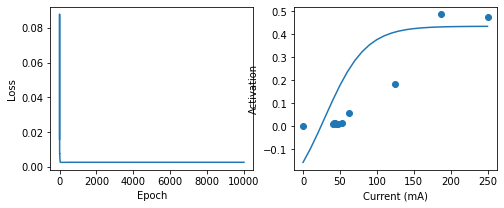

Ulnar700uA_15_5.csv
Final loss: 0.0004844
a1: 0.162, a2: 0.0, a3: -0.424, a4: 29.334


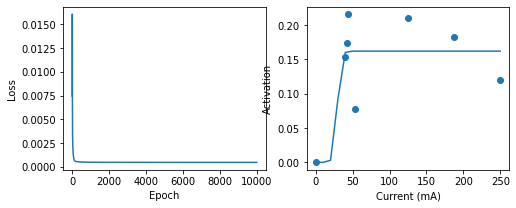

Ulnar700uA_16_1.csv
Final loss: 8.2e-06
a1: 0.008, a2: -0.0, a3: -0.424, a4: 29.334


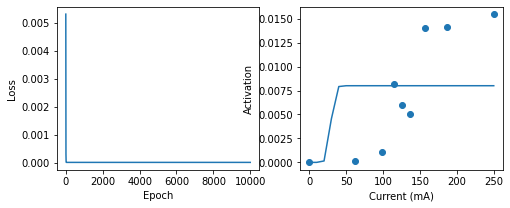

Ulnar700uA_16_2.csv
Final loss: 0.0203027
a1: 0.406, a2: -0.0, a3: -0.423, a4: 29.334


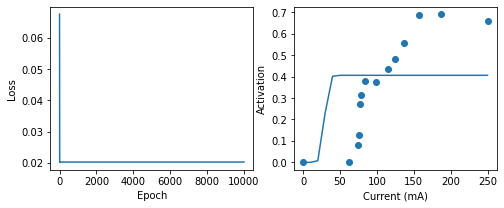

Ulnar700uA_16_3.csv
Final loss: 0.0485656
a1: 0.561, a2: -0.0, a3: -0.42, a4: 29.334


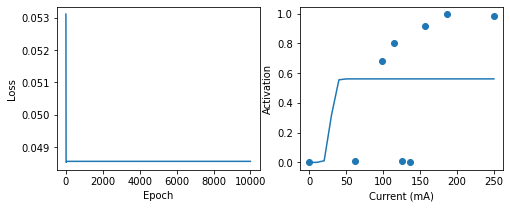

Ulnar700uA_16_4.csv
Final loss: 0.0030106
a1: 0.178, a2: -0.0, a3: -0.42, a4: 29.334


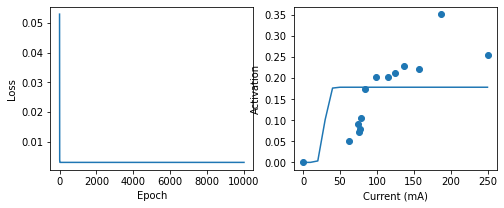

Ulnar700uA_16_5.csv
Final loss: 0.0
a1: 0.178, a2: -0.0, a3: -0.42, a4: 29.334


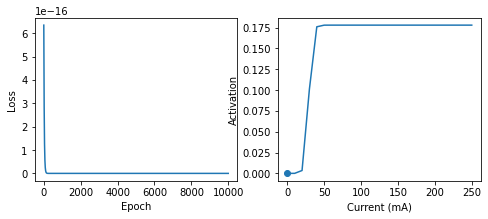

Ulnar700uA_17_1.csv
Final loss: 1.33e-05
a1: 0.007, a2: -0.0, a3: -0.42, a4: 29.334


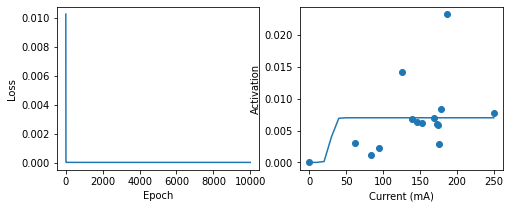

Ulnar700uA_17_2.csv
Final loss: 0.0065577
a1: 0.2, a2: -0.0, a3: -0.42, a4: 29.334


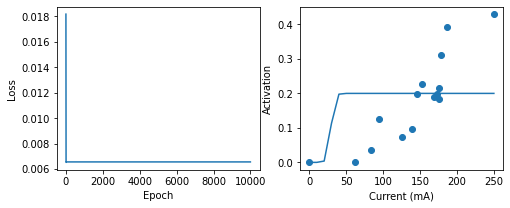

Ulnar700uA_17_3.csv
Final loss: 0.0490852
a1: 0.529, a2: -0.0, a3: -0.42, a4: 29.334


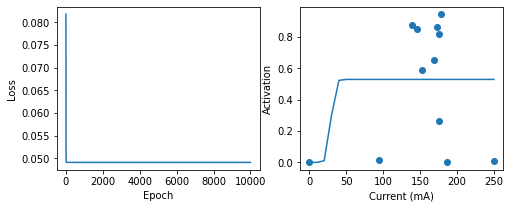

Ulnar700uA_17_4.csv
Final loss: 0.0019252
a1: 0.144, a2: -0.0, a3: -0.42, a4: 29.334


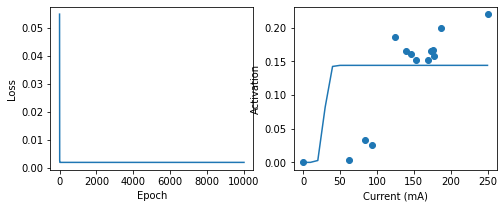

Ulnar700uA_17_5.csv
Final loss: 0.0
a1: 0.046, a2: -0.0, a3: -0.42, a4: 29.334


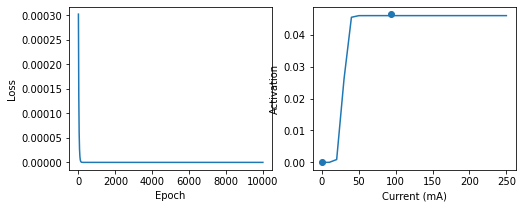

Ulnar700uA_4_1.csv
Final loss: 0.0
a1: 0.046, a2: -0.0, a3: -0.42, a4: 29.334


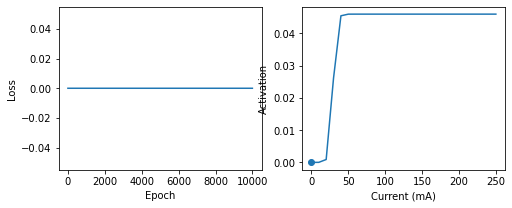

Ulnar700uA_4_2.csv
Final loss: 0.0042218
a1: 0.194, a2: -0.0, a3: -0.42, a4: 29.334


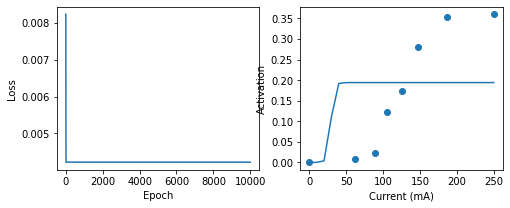

Ulnar700uA_4_3.csv
Final loss: 0.0004287
a1: 0.701, a2: -0.0, a3: -0.42, a4: 29.334


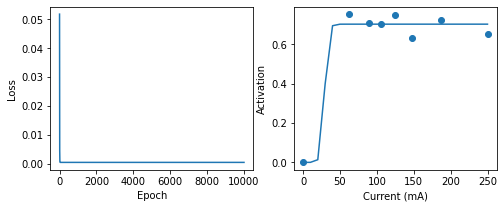

Ulnar700uA_4_4.csv
Final loss: 0.0258152
a1: 0.41, a2: -0.0, a3: -0.374, a4: 29.335


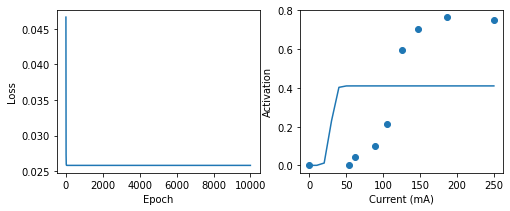

Ulnar700uA_4_5.csv
Final loss: 0.0016645
a1: 0.274, a2: -0.0, a3: -0.301, a4: 29.347


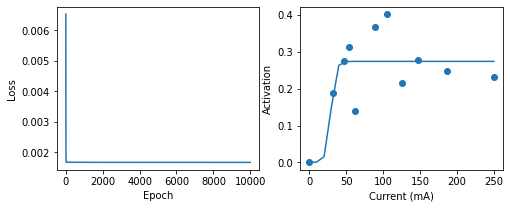

Ulnar700uA_5_1.csv
Final loss: 0.0013377
a1: 0.313, a2: -0.135, a3: -0.036, a4: 29.382


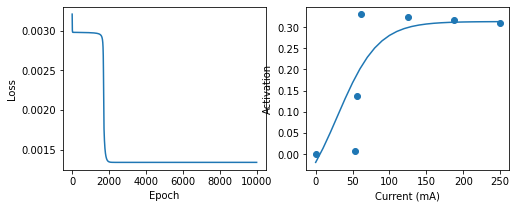

Ulnar700uA_5_2.csv
Final loss: 0.0009101
a1: 0.345, a2: -0.143, a3: -0.03, a4: 29.39


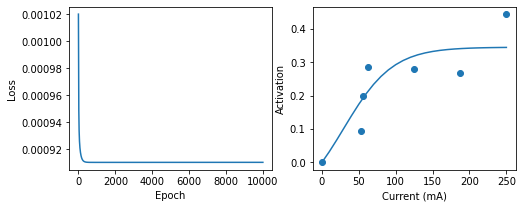

Ulnar700uA_5_3.csv
Final loss: 0.0043183
a1: 0.743, a2: -0.26, a3: -0.04, a4: 30.594


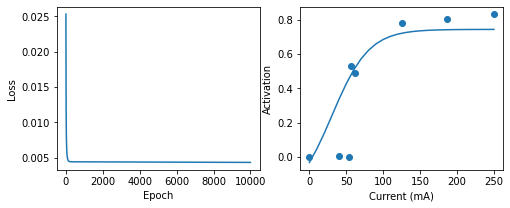

Ulnar700uA_5_4.csv
Final loss: 0.0056512
a1: 0.642, a2: -0.112, a3: -0.095, a4: 31.16


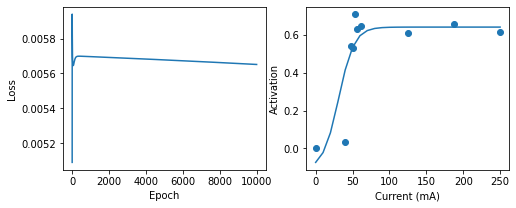

Ulnar700uA_5_5.csv
Final loss: 7.73e-05
a1: 0.204, a2: -0.149, a3: -0.011, a4: 31.163


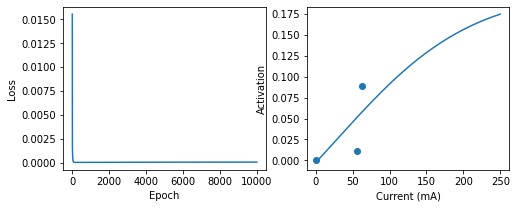

Ulnar700uA_6_1.csv
Final loss: 0.0024147
a1: 0.348, a2: -0.108, a3: -0.037, a4: 31.288


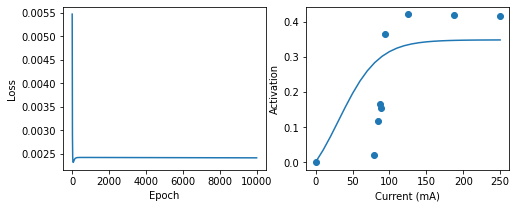

Ulnar700uA_6_2.csv
Final loss: 0.0019756
a1: 0.497, a2: -0.131, a3: -0.034, a4: 31.516


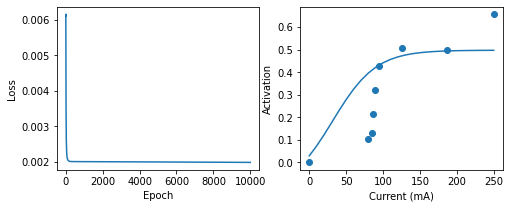

Ulnar700uA_6_3.csv
Final loss: 0.0013773
a1: 0.062, a2: -0.057, a3: -0.028, a4: 31.521


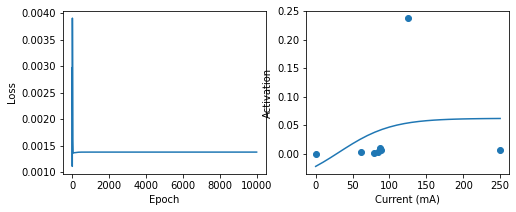

Ulnar700uA_6_4.csv
Final loss: 0.0012297
a1: 0.542, a2: -0.18, a3: -0.046, a4: 31.67


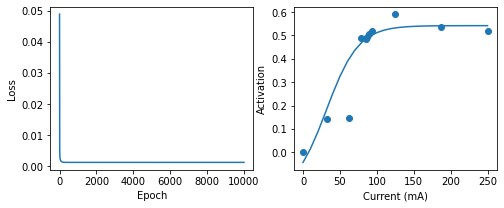

Ulnar700uA_6_5.csv
Final loss: 0.0003741
a1: 0.066, a2: 0.039, a3: 0.005, a4: 31.67


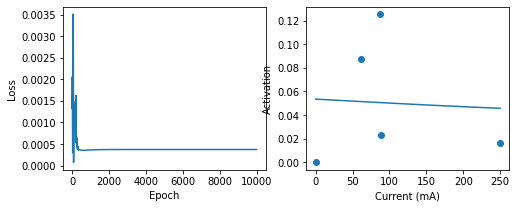

Ulnar700uA_7_1.csv
Final loss: 2.5e-06
a1: 0.015, a2: -0.015, a3: -0.003, a4: 31.67


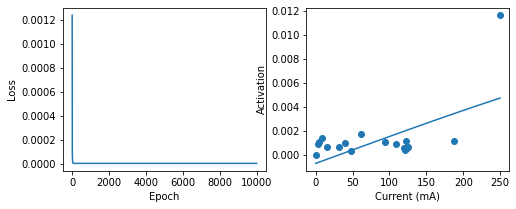

Ulnar700uA_7_2.csv
Final loss: 0.0009234
a1: 0.159, a2: -0.076, a3: -0.022, a4: 31.684


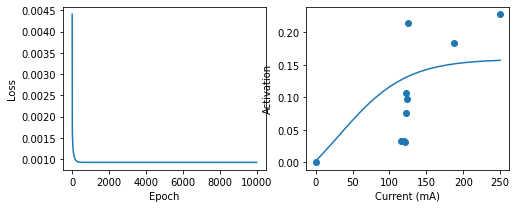

Ulnar700uA_7_3.csv
Final loss: 2.9e-06
a1: 0.067, a2: -0.057, a3: 0.0, a4: 31.684


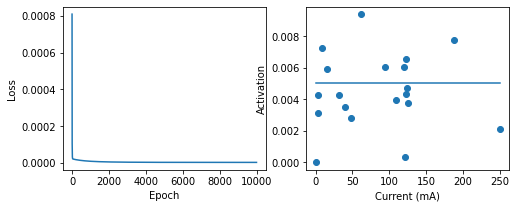

Ulnar700uA_7_4.csv
Final loss: 0.0005417
a1: 0.211, a2: -0.01, a3: -0.134, a4: 31.71


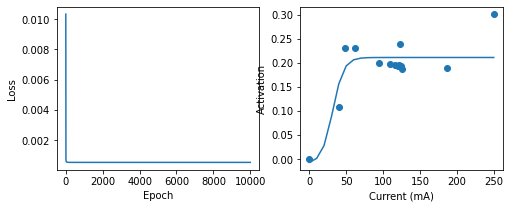

Ulnar700uA_7_5.csv
Final loss: 0.0027376
a1: 0.176, a2: 0.144, a3: -0.119, a4: 31.71


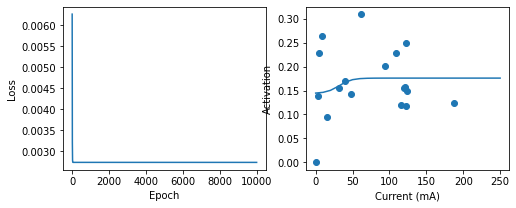

Ulnar700uA_8_1.csv
Final loss: 0.0
a1: 0.001, a2: 0.0, a3: -0.123, a4: 31.71


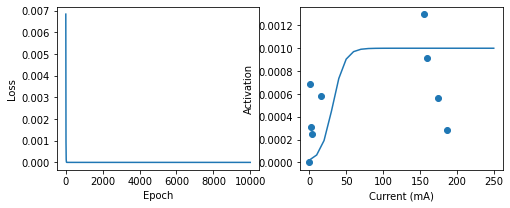

Ulnar700uA_8_2.csv
Final loss: 4e-07
a1: 0.001, a2: 0.001, a3: -0.123, a4: 31.71


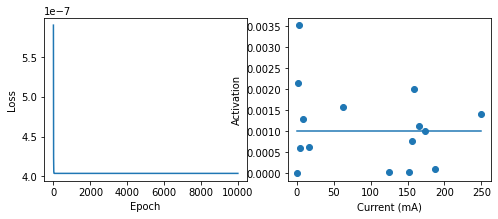

Ulnar700uA_8_3.csv
Final loss: 4e-06
a1: 0.003, a2: 0.004, a3: -0.123, a4: 31.71


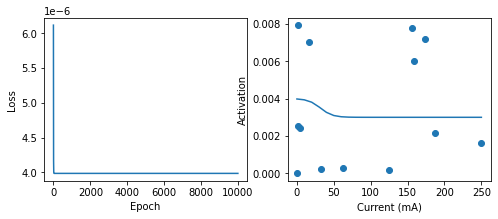

Ulnar700uA_8_4.csv
Final loss: 0.0010656
a1: 0.205, a2: -0.12, a3: -0.024, a4: 31.743


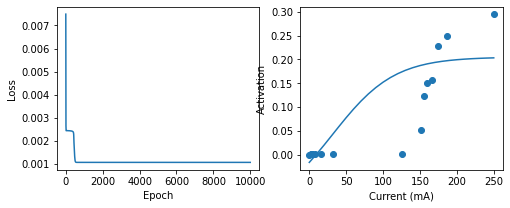

Ulnar700uA_8_5.csv
Final loss: 0.0001237
a1: 0.079, a2: -0.007, a3: -0.074, a4: 31.743


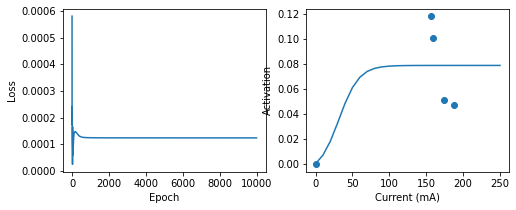

Ulnar700uA_9_1.csv
Final loss: 0.0
a1: 0.0, a2: 0.001, a3: -0.068, a4: 31.743


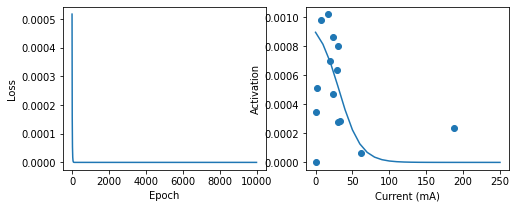

Ulnar700uA_9_2.csv
Final loss: 1e-07
a1: 0.001, a2: 0.001, a3: -0.067, a4: 31.743


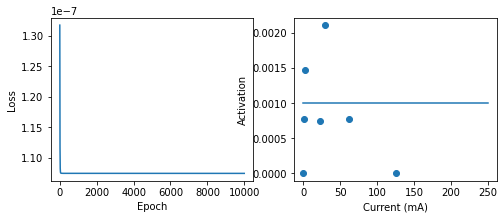

Ulnar700uA_9_3.csv
Final loss: 1.3e-06
a1: 0.001, a2: 0.002, a3: -0.068, a4: 31.743


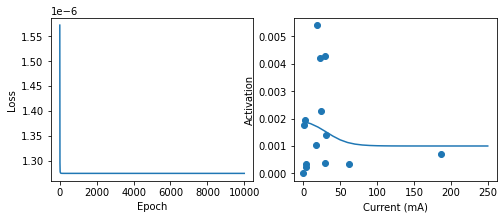

Ulnar700uA_9_4.csv
Final loss: 1e-07
a1: 0.001, a2: 0.0, a3: -0.068, a4: 31.743


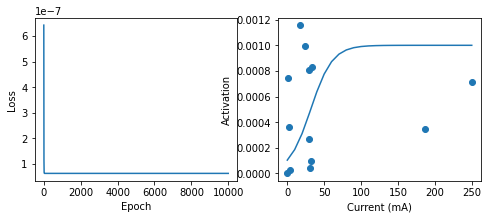

Ulnar700uA_9_5.csv
Final loss: 0.0013168
a1: 0.125, a2: 0.045, a3: -0.058, a4: 31.728


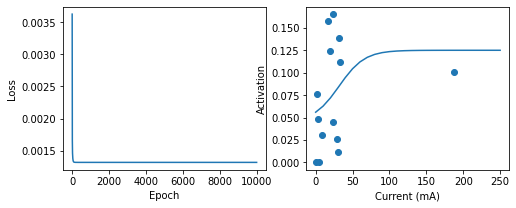

In [41]:
filenames = sorted([filename for filename in os.listdir(path)])
for filename in filenames:
    if 'sigmoid' not in filename:
        print(filename)
        f = os.path.join(path,filename)
        curve = np.genfromtxt(f, delimiter = ',')
        inds = curve[:,1]>=0
        fit_and_plot(curve[inds,0],curve[inds,1], theta=np.array([0.0,1.0,1.0,10]))

# Plot Vlad's Data - 2 Drawn Muscles

In [42]:
singlemuscle_singlecontact_sweeppw_2muscles = np.genfromtxt('/Volumes/L_MillerLab/limblab/User_folders/Aajan/PNS_Modeling_Toolbox-main/COMSOL_Modeling/mmActivationMatrix_SweepPW_2muscles.csv', delimiter=',')

Pulse Amplitude: 0.5


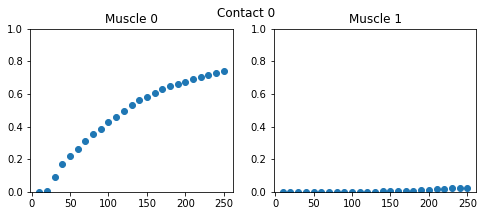

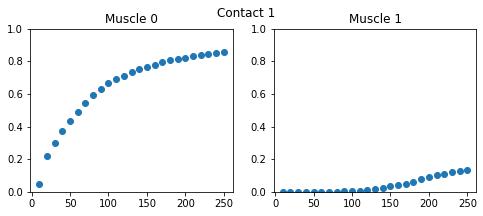

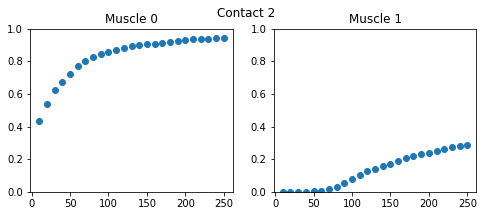

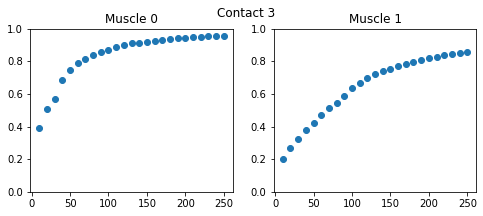

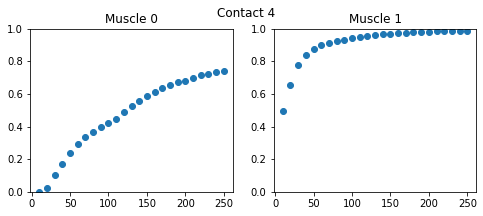

...

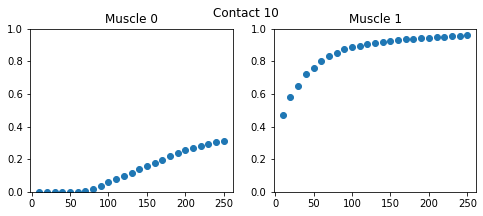

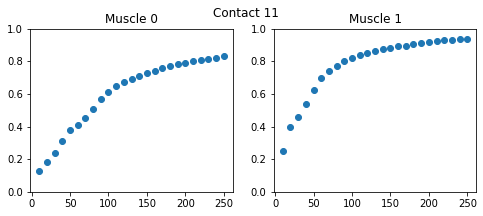

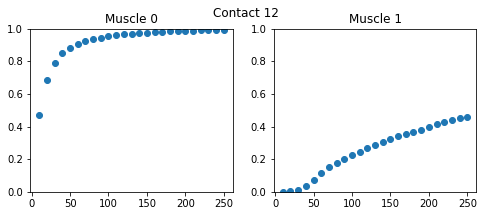

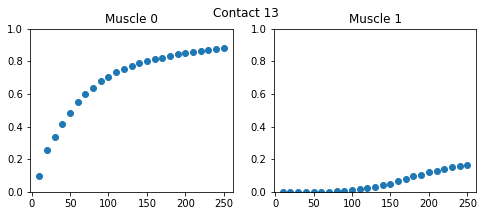

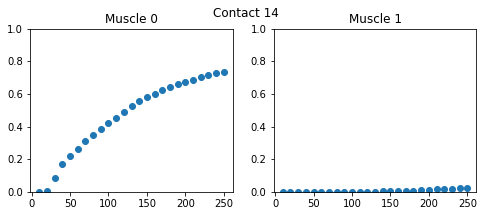

Pulse Amplitude: 1.0


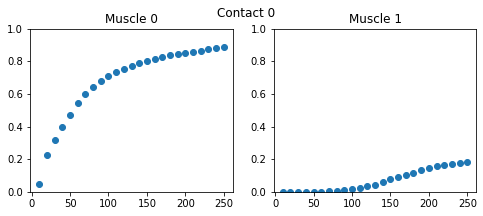

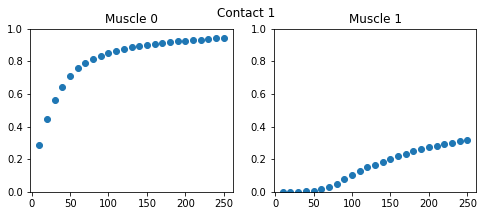

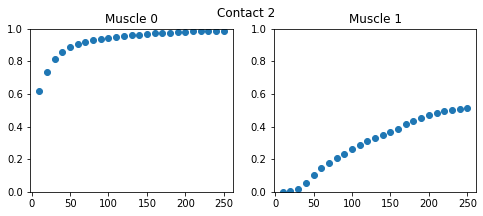

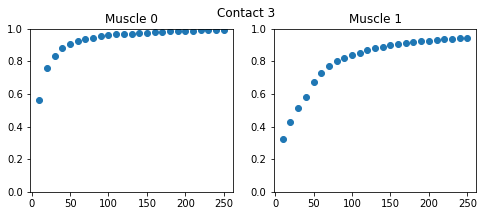

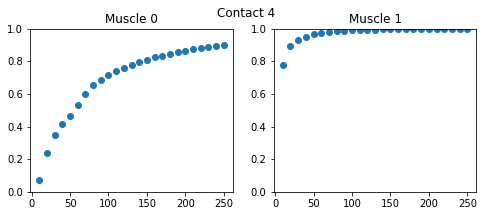

...

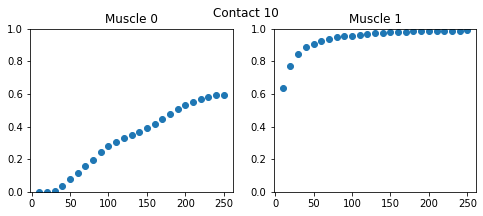

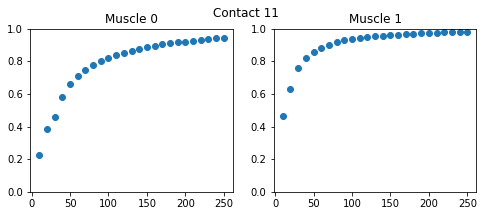

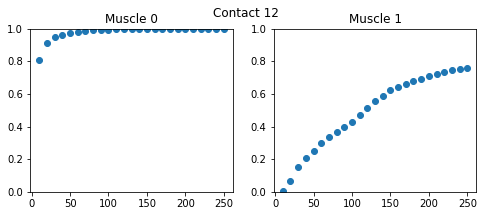

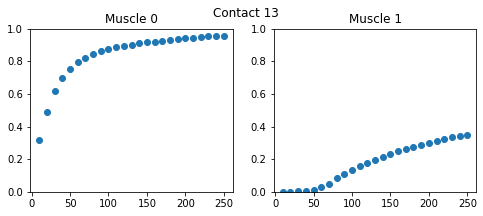

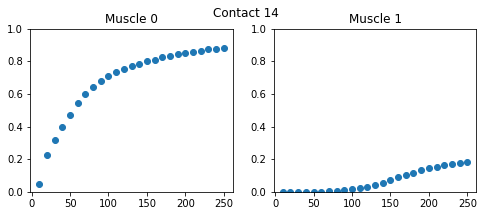

Pulse Amplitude: 1.5


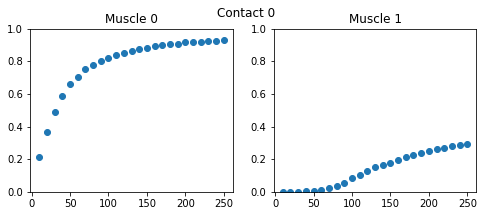

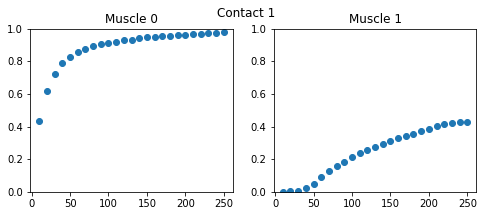

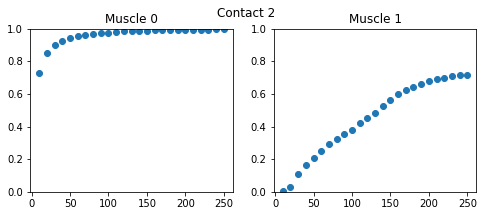

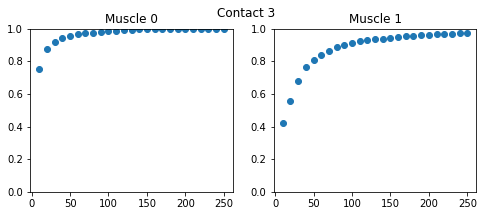

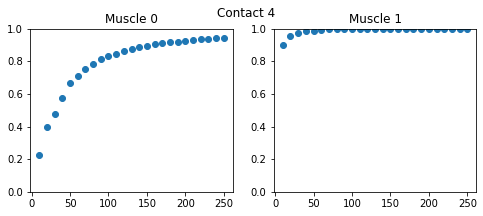

...

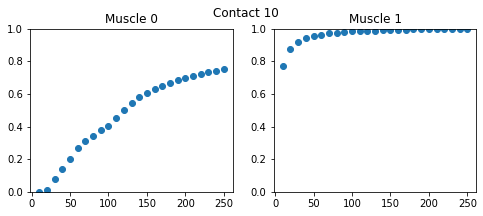

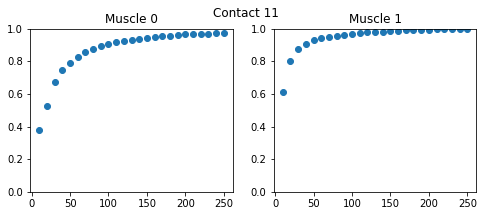

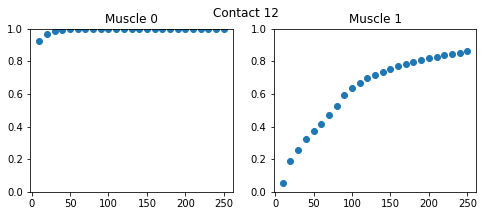

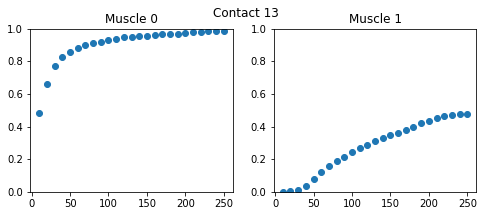

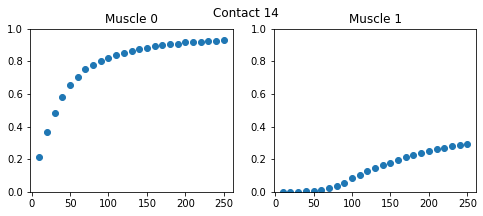

Pulse Amplitude: 2.0


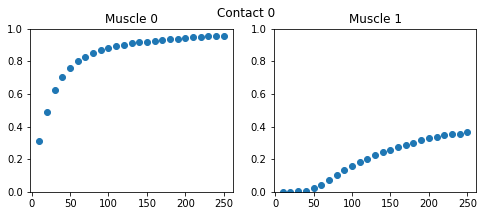

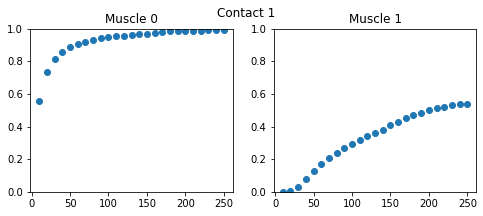

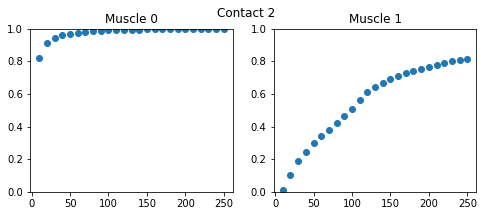

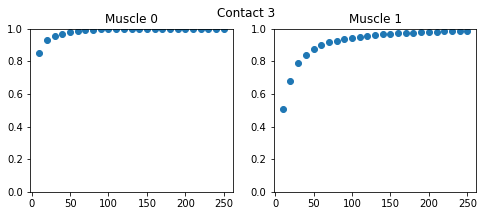

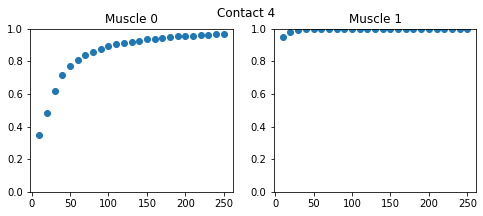

...

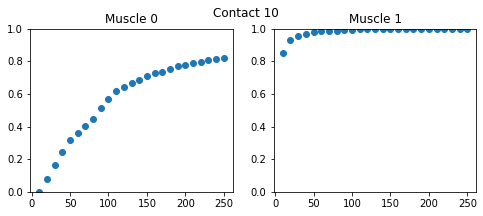

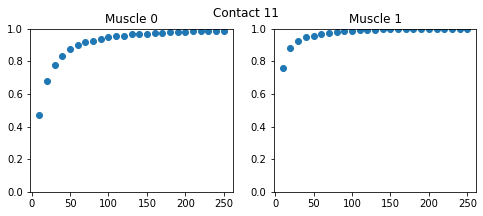

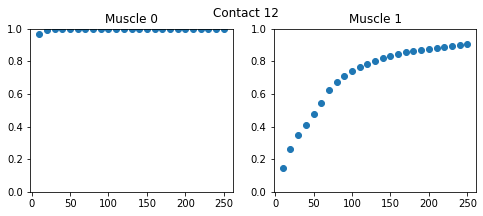

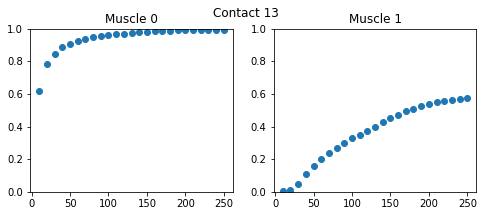

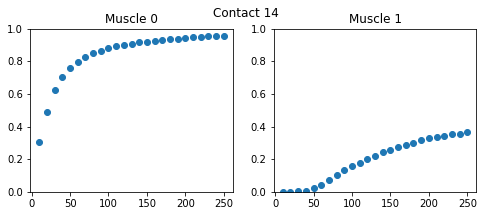

Pulse Amplitude: 2.5


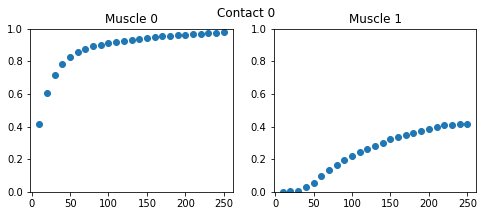

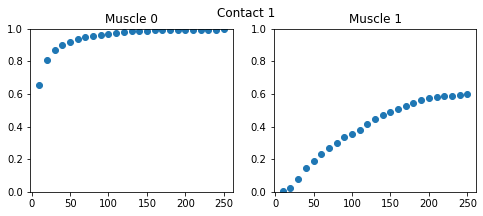

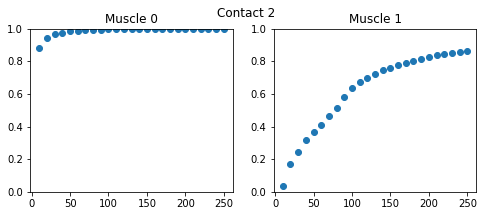

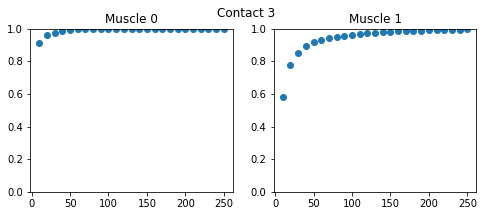

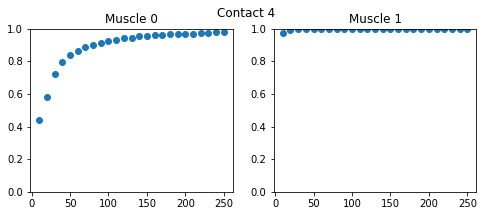

...

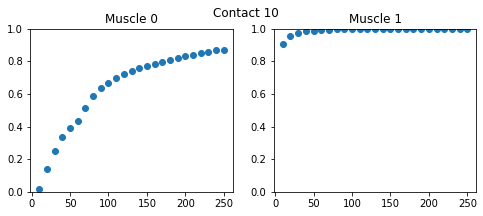

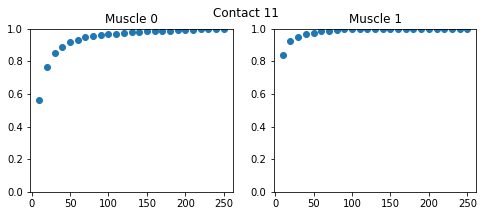

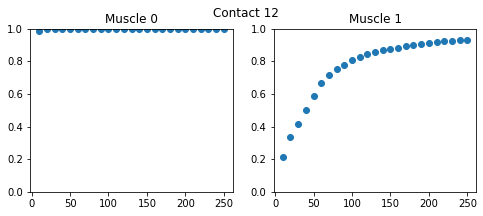

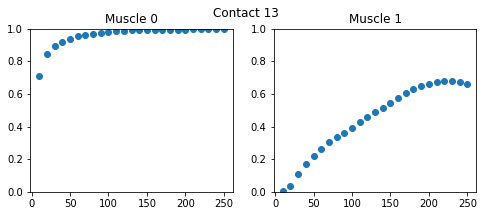

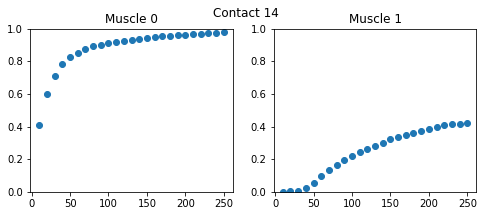

Pulse Amplitude: 3.0


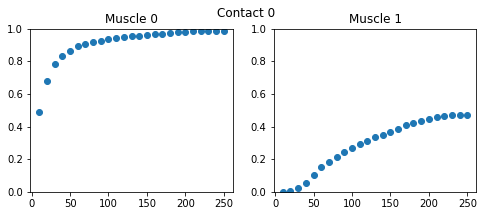

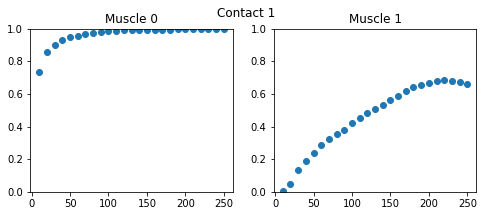

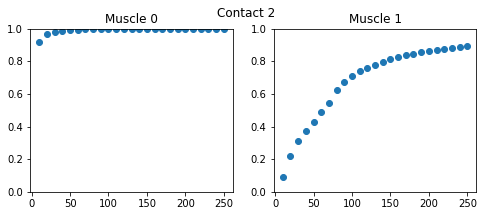

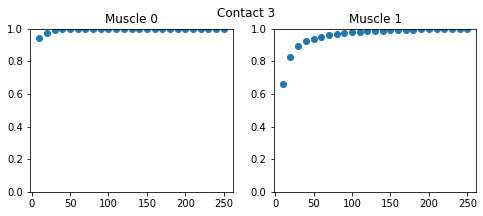

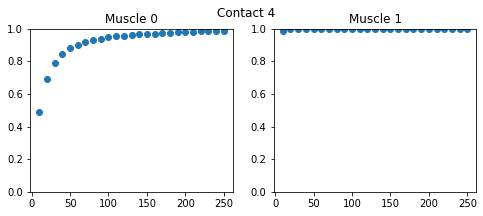

...

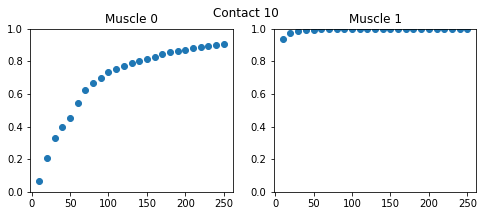

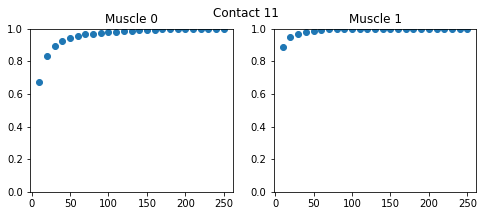

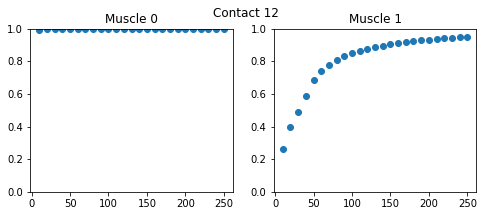

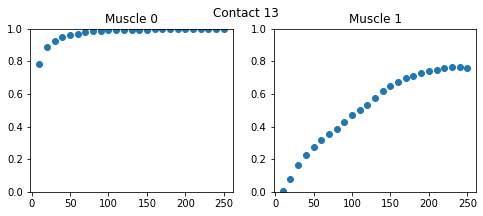

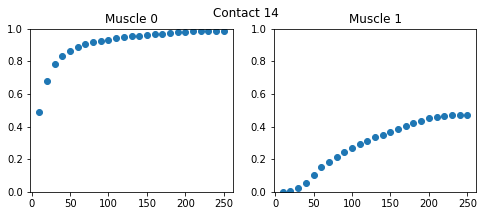

In [49]:
pw_x = np.arange(10,260,10)
pulse_amplitudes = np.arange(0.5,3.5,0.5)
for pulse_amplitude in pulse_amplitudes:
    print('Pulse Amplitude: {}'.format(str(pulse_amplitude)))
    for contact in range(15):
        curves = get_curves(singlemuscle_singlecontact_sweeppw_2muscles, pulse_amplitude,contact)
        fig, ax = plt.subplots(nrows = 1, ncols = 2)
        fig.set_size_inches(8, 3)
        fig.suptitle('Contact {}'.format(contact))

        for muscle in range(2):
            ax[muscle].set_title('Muscle {}'.format(muscle))
            ax[muscle].set_ylim(0, 1)
            ax[muscle].scatter(pw_x,curves[:,muscle])
        plt.show()

Contact: 0, Muscle: 0
Final loss: 0.0006419
a1: 0.191, a2: 0.934, a3: 0.047, a4: 30.234


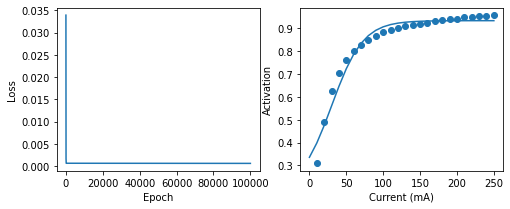

Contact: 0, Muscle: 1
Final loss: 0.0002668
a1: 0.365, a2: -0.335, a3: -0.019, a4: 30.292


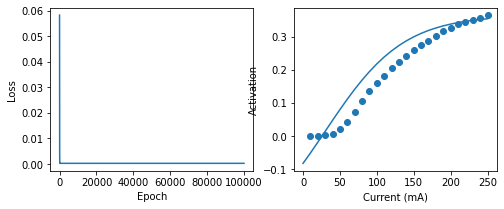

Contact: 1, Muscle: 0
Final loss: 0.0005533
a1: 0.975, a2: 0.539, a3: -0.065, a4: 29.548


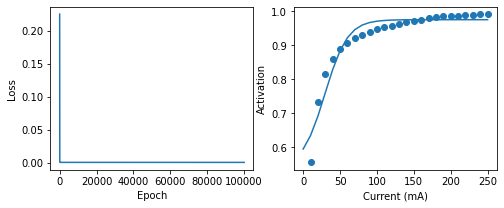

Contact: 1, Muscle: 1
Final loss: 0.0007101
a1: -0.405, a2: 0.519, a3: 0.025, a4: 29.802


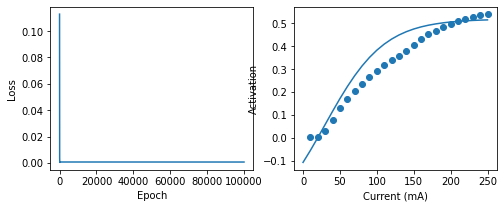

Contact: 2, Muscle: 0
Final loss: 0.0001106
a1: 0.836, a2: 0.996, a3: 0.093, a4: 29.578


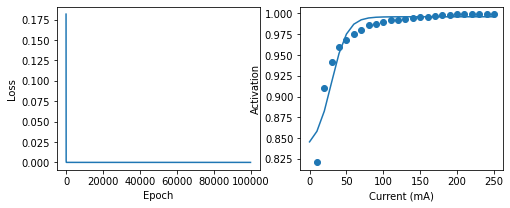

Contact: 2, Muscle: 1
Final loss: 0.0010993
a1: -0.429, a2: 0.776, a3: 0.029, a4: 30.082


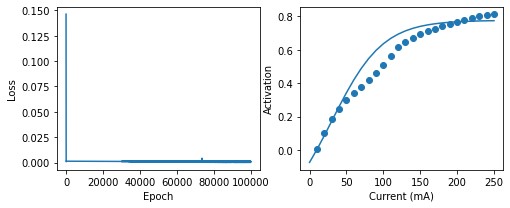

Contact: 3, Muscle: 0
Final loss: 8.19e-05
a1: 0.871, a2: 0.999, a3: 0.099, a4: 29.903


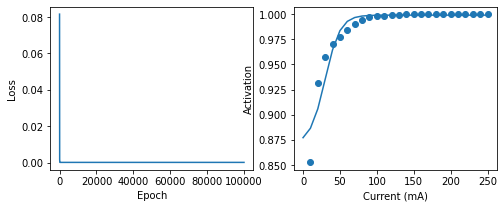

Contact: 3, Muscle: 1
Final loss: 0.0004917
a1: 0.476, a2: 0.97, a3: 0.071, a4: 29.026


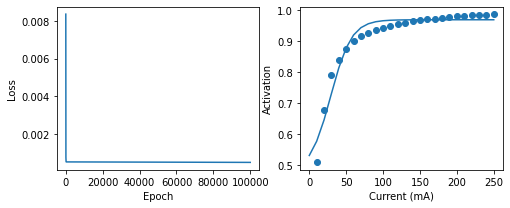

Contact: 4, Muscle: 0
Final loss: 0.0004086
a1: 0.166, a2: 0.946, a3: 0.044, a4: 28.357


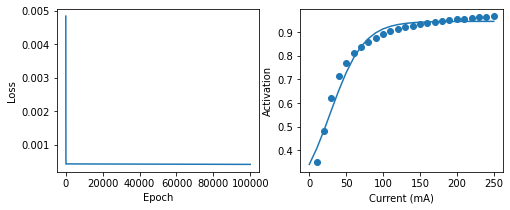

Contact: 4, Muscle: 1
Final loss: 1.46e-05
a1: 0.959, a2: 1.0, a3: 0.154, a4: 28.317


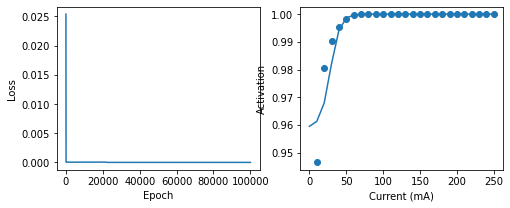

Contact: 5, Muscle: 0
Final loss: 0.0050344
a1: -0.434, a2: 0.603, a3: 0.036, a4: 30.03


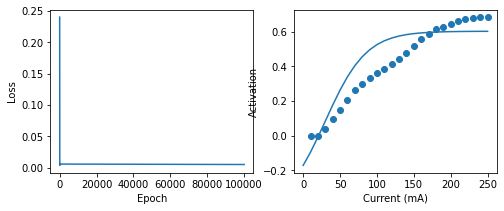

Contact: 5, Muscle: 1
Final loss: 0.0002215
a1: 0.697, a2: 0.988, a3: 0.078, a4: 29.609


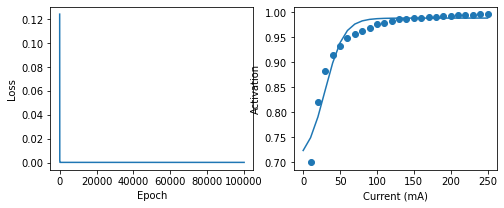

Contact: 6, Muscle: 0
Final loss: 0.0007444
a1: 0.35, a2: -0.334, a3: -0.023, a4: 29.79


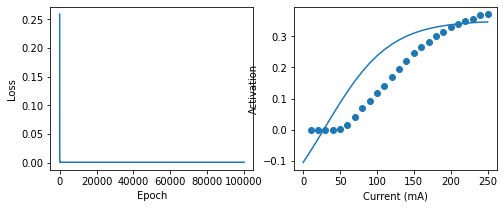

Contact: 6, Muscle: 1
Final loss: 0.0002978
a1: 0.947, a2: 0.298, a3: -0.041, a4: 29.35


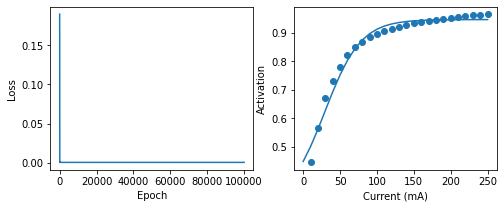

Contact: 7, Muscle: 0
Final loss: 5.49e-05
a1: -0.154, a2: 0.138, a3: 0.011, a4: 29.345


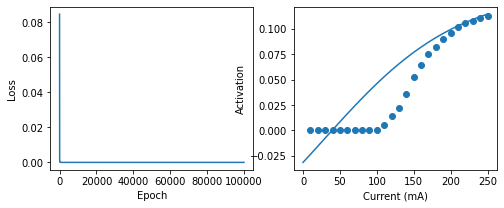

Contact: 7, Muscle: 1
Final loss: 9.19e-05
a1: -0.126, a2: 0.906, a3: 0.022, a4: 29.121


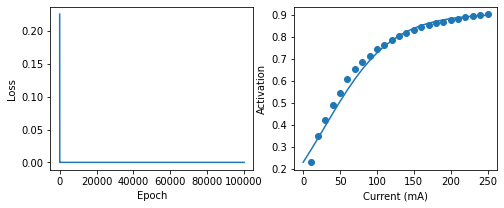

Contact: 8, Muscle: 0
Final loss: 6.68e-05
a1: 0.165, a2: -0.18, a3: -0.012, a4: 29.117


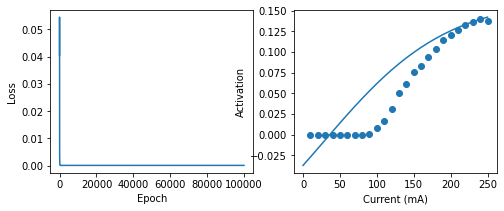

Contact: 8, Muscle: 1
Final loss: 8.15e-05
a1: 0.916, a2: -0.054, a3: -0.023, a4: 28.908


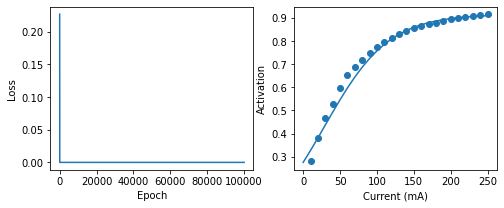

Contact: 9, Muscle: 0
Final loss: 0.0004351
a1: -0.371, a2: 0.394, a3: 0.022, a4: 28.966


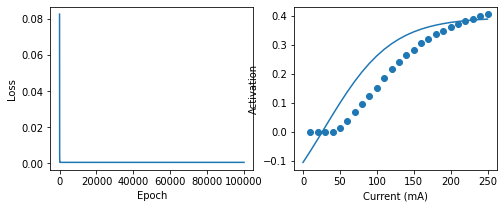

Contact: 9, Muscle: 1
Final loss: 0.0003227
a1: 0.355, a2: 0.955, a3: 0.046, a4: 28.512


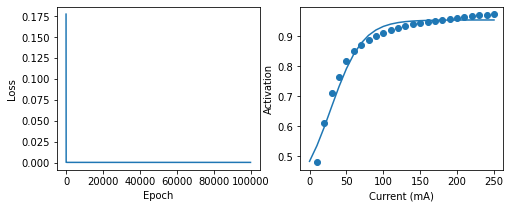

Contact: 10, Muscle: 0
Final loss: 0.0011082
a1: -0.468, a2: 0.78, a3: 0.03, a4: 29.129


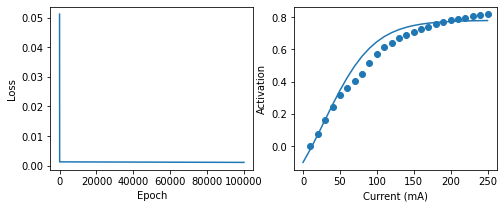

Contact: 10, Muscle: 1
Final loss: 8.23e-05
a1: 0.866, a2: 0.998, a3: 0.098, a4: 28.958


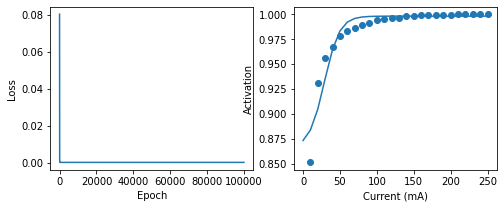

Contact: 11, Muscle: 0
Final loss: 0.0005775
a1: 0.43, a2: 0.971, a3: 0.071, a4: 27.965


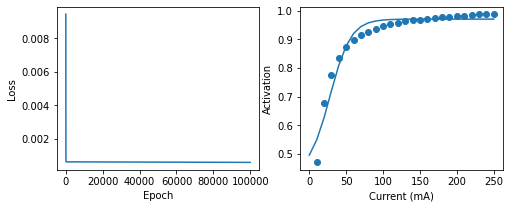

Contact: 11, Muscle: 1
Final loss: 0.0001985
a1: 0.769, a2: 0.995, a3: 0.092, a4: 27.603


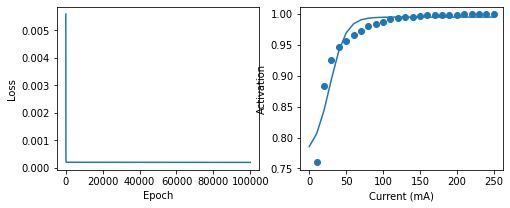

Contact: 12, Muscle: 0
Final loss: 8.2e-06
a1: 0.975, a2: 1.0, a3: 0.157, a4: 27.581


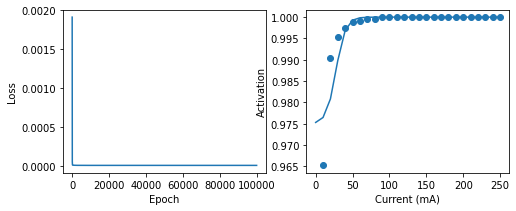

Contact: 12, Muscle: 1
Final loss: 8.89e-05
a1: -0.298, a2: 0.905, a3: 0.023, a4: 27.471


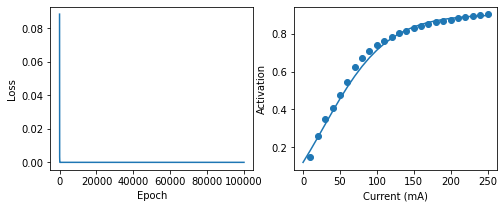

Contact: 13, Muscle: 0
Final loss: 0.0003789
a1: 0.585, a2: 0.982, a3: 0.066, a4: 26.974


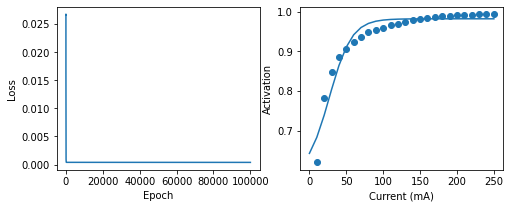

Contact: 13, Muscle: 1
Final loss: 0.0008181
a1: 0.543, a2: -0.422, a3: -0.028, a4: 27.256


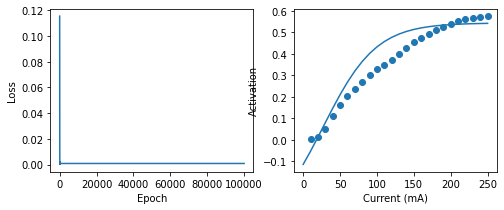

Contact: 14, Muscle: 0
Final loss: 0.0005426
a1: 0.934, a2: 0.121, a3: -0.044, a4: 26.452


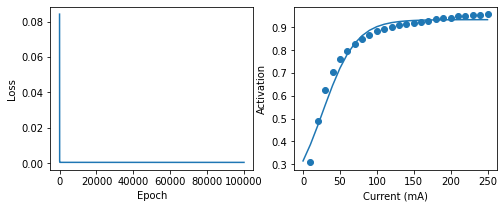

Contact: 14, Muscle: 1
Final loss: 0.0003692
a1: -0.346, a2: 0.357, a3: 0.021, a4: 26.566


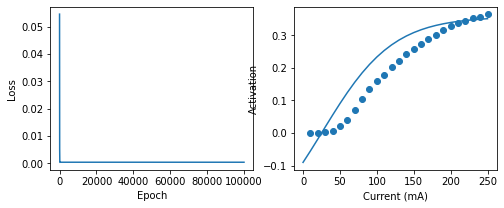

In [52]:
for contact in range(15):
    curves = get_curves(singlemuscle_singlecontact_sweeppw_2muscles, 2.0,contact)
    for muscle in range(2):
        print('Contact: {}, Muscle: {}'.format(contact, muscle))
        fit_and_plot(pw_x,curves[:,muscle],np.array([0,1.0,0,10]), num_epoch=100000)

# Fitting Sigmoids to ben's data

## Radial Cuff, 1mA - 8 Muscles

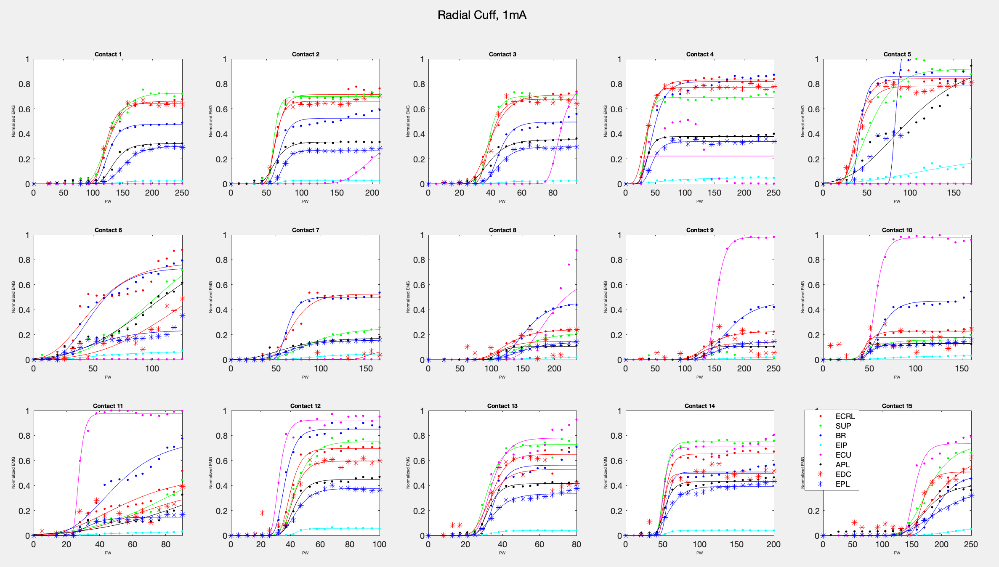

### Replotting Radial Cuff Data Overlayed with Ben's Single Sigmoids

Radial1000uA_10_1.csv


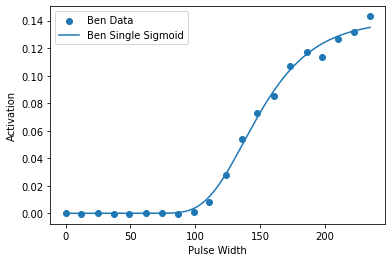

Radial1000uA_10_2.csv


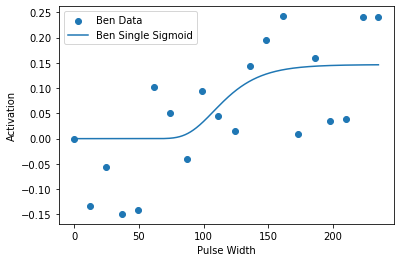

Radial1000uA_10_3.csv


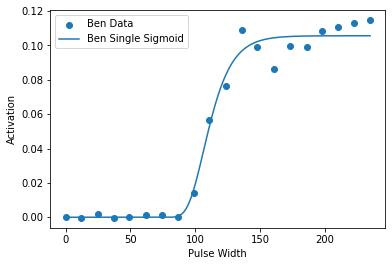

Radial1000uA_10_4.csv


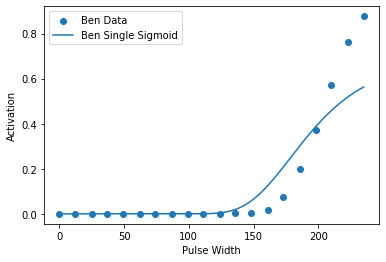

Radial1000uA_10_5.csv


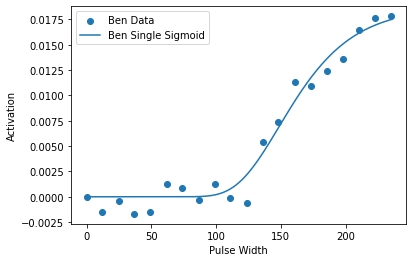

Radial1000uA_10_6.csv


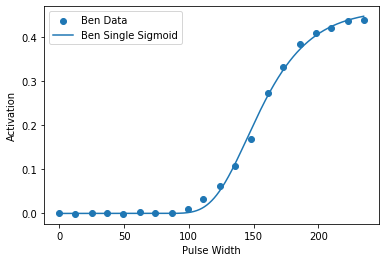

Radial1000uA_10_7.csv


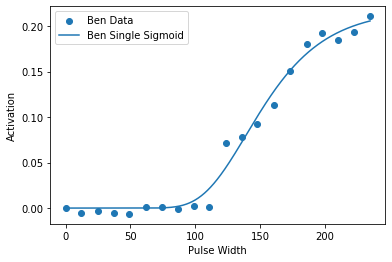

Radial1000uA_10_8.csv


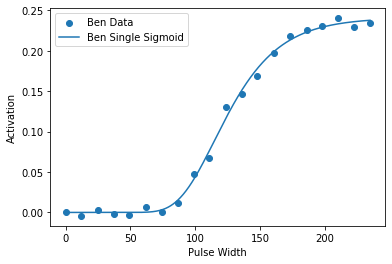

Radial1000uA_11_1.csv


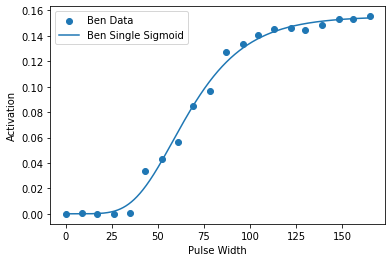

Radial1000uA_11_2.csv


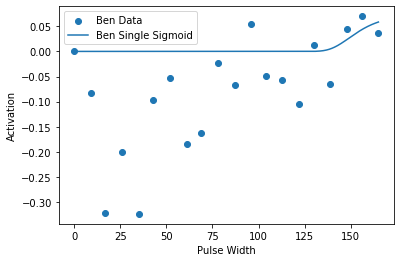

Radial1000uA_11_3.csv


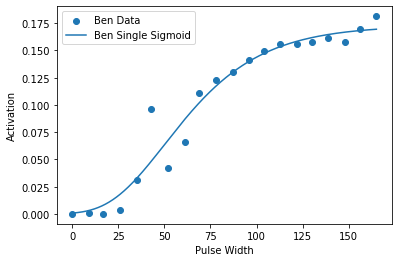

Radial1000uA_11_4.csv


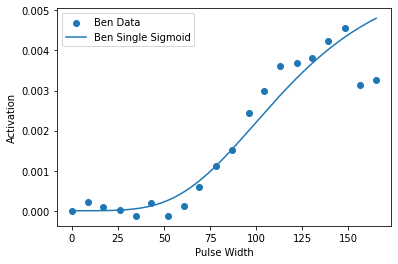

Radial1000uA_11_5.csv


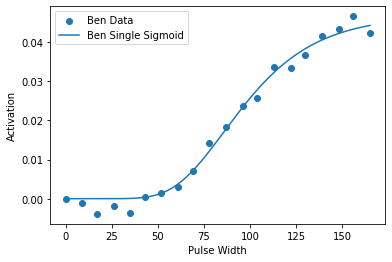

Radial1000uA_11_6.csv


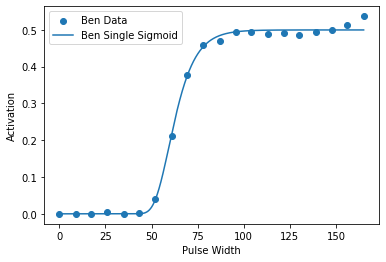

Radial1000uA_11_7.csv


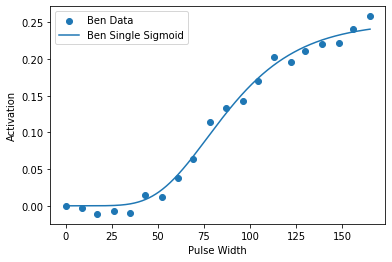

Radial1000uA_11_8.csv


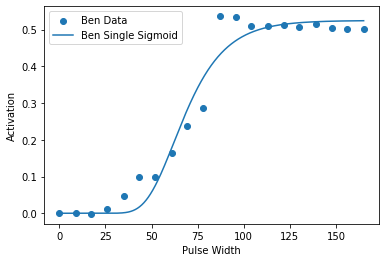

Radial1000uA_12_1.csv


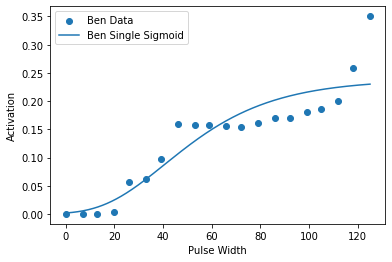

Radial1000uA_12_2.csv


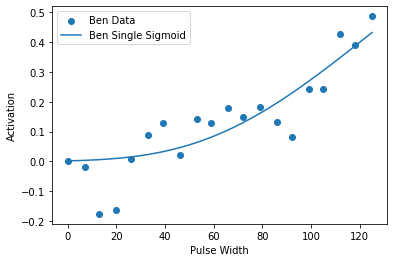

Radial1000uA_12_3.csv


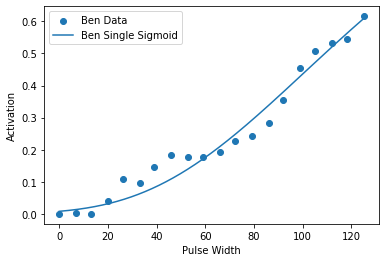

Radial1000uA_12_4.csv


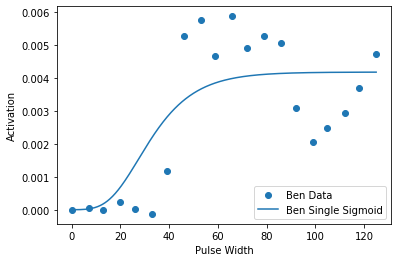

Radial1000uA_12_5.csv


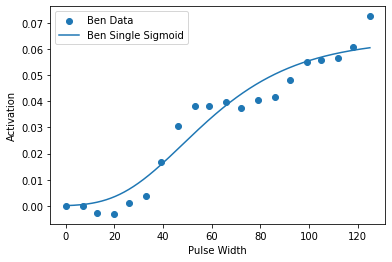

Radial1000uA_12_6.csv


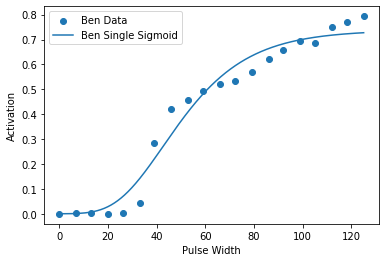

Radial1000uA_12_7.csv


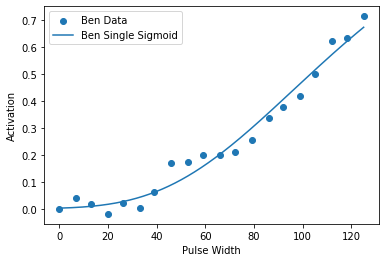

Radial1000uA_12_8.csv


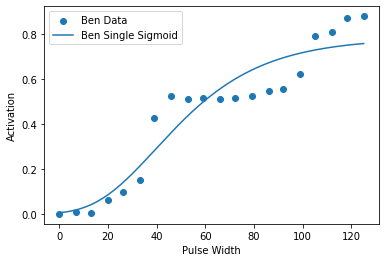

Radial1000uA_13_1.csv


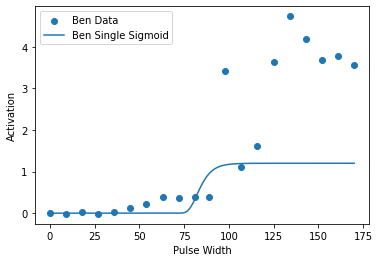

Radial1000uA_13_2.csv


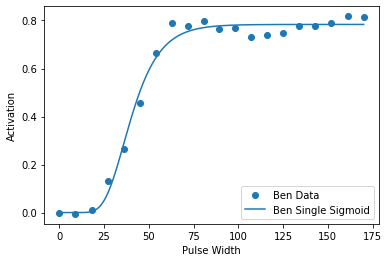

Radial1000uA_13_3.csv


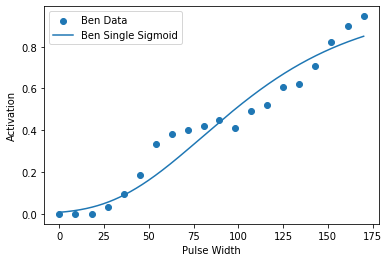

Radial1000uA_13_4.csv


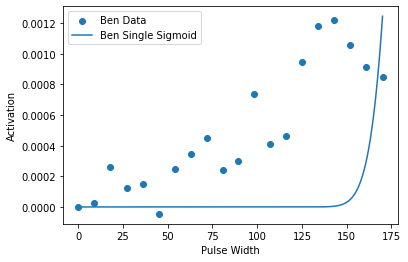

Radial1000uA_13_5.csv


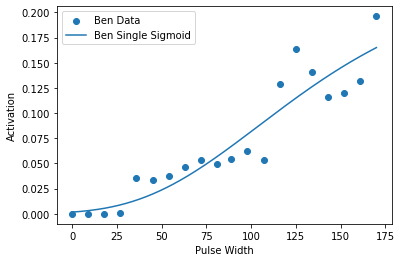

Radial1000uA_13_6.csv


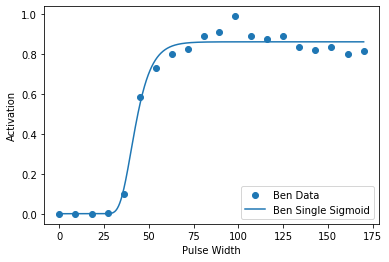

Radial1000uA_13_7.csv


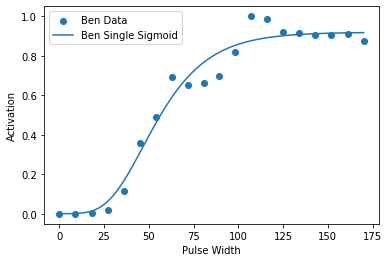

Radial1000uA_13_8.csv


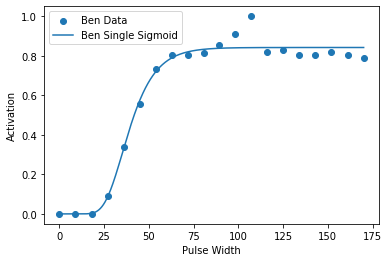

Radial1000uA_14_1.csv


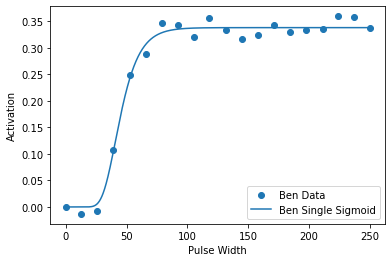

Radial1000uA_14_2.csv


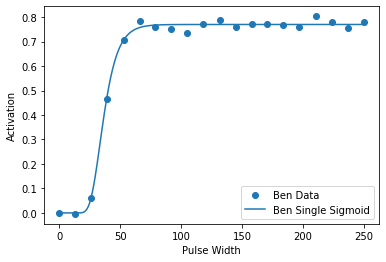

Radial1000uA_14_3.csv


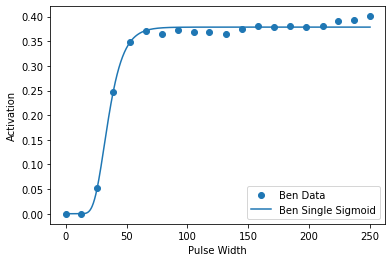

Radial1000uA_14_4.csv


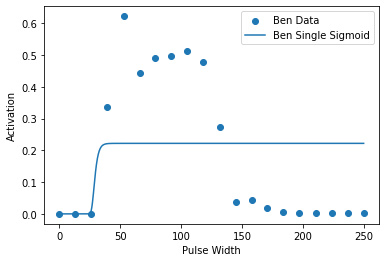

Radial1000uA_14_5.csv


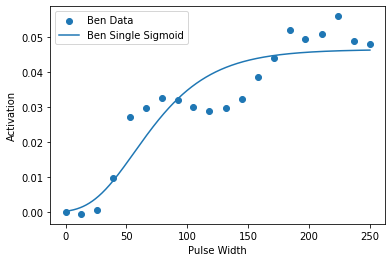

Radial1000uA_14_6.csv


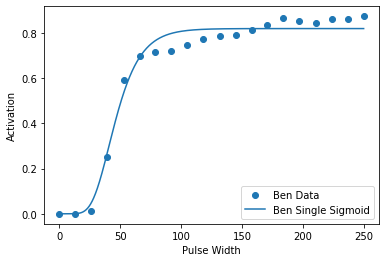

Radial1000uA_14_7.csv


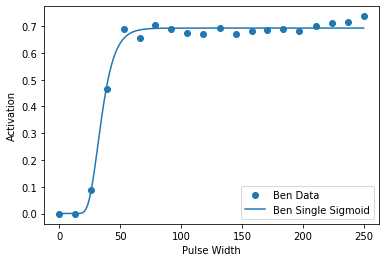

Radial1000uA_14_8.csv


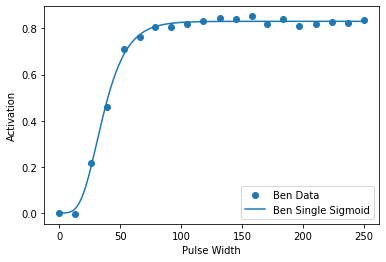

Radial1000uA_15_1.csv


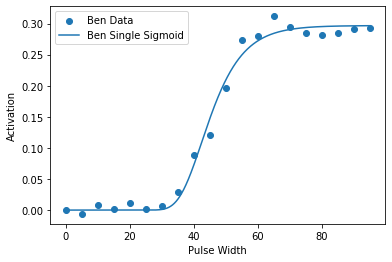

Radial1000uA_15_2.csv


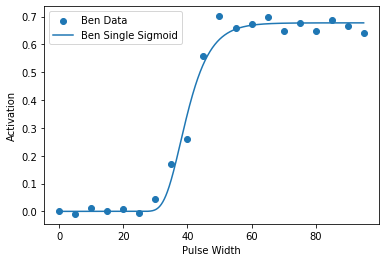

Radial1000uA_15_3.csv


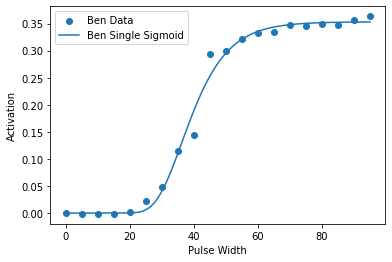

Radial1000uA_15_4.csv


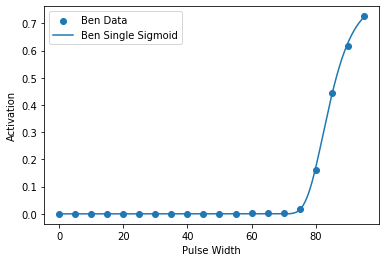

Radial1000uA_15_5.csv


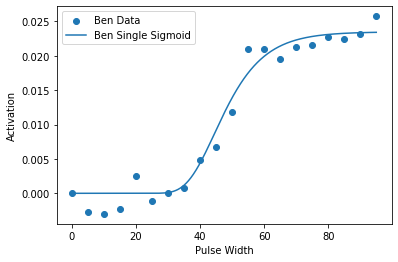

Radial1000uA_15_6.csv


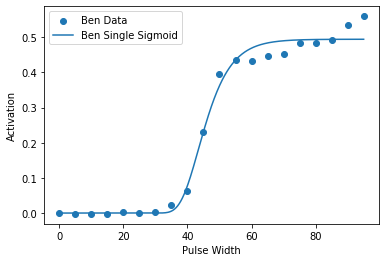

Radial1000uA_15_7.csv


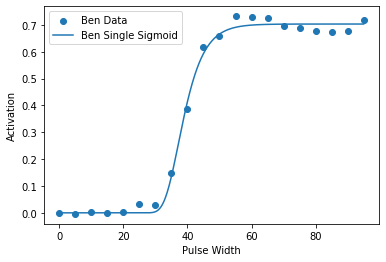

Radial1000uA_15_8.csv


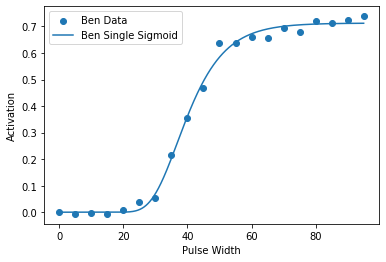

Radial1000uA_16_1.csv


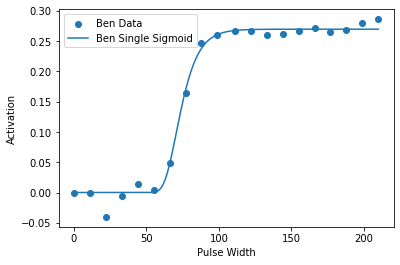

Radial1000uA_16_2.csv


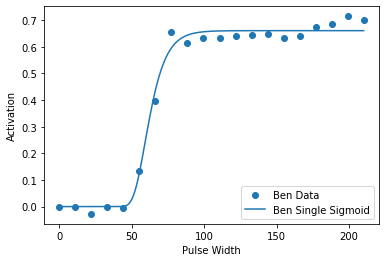

Radial1000uA_16_3.csv


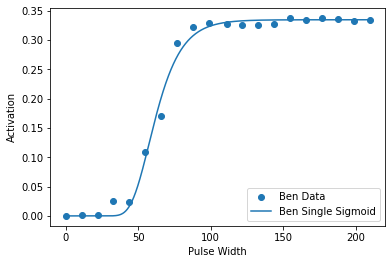

Radial1000uA_16_4.csv


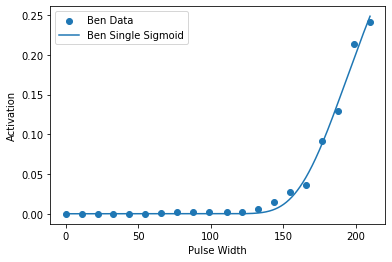

Radial1000uA_16_5.csv


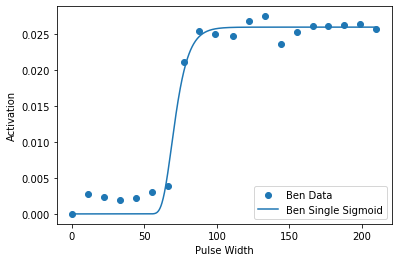

Radial1000uA_16_6.csv


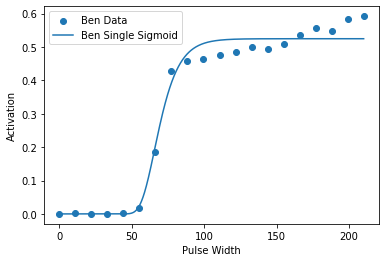

Radial1000uA_16_7.csv


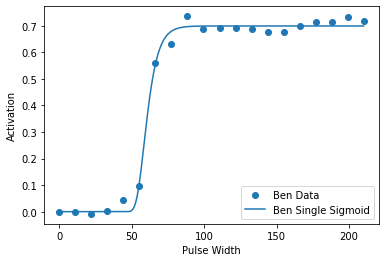

Radial1000uA_16_8.csv


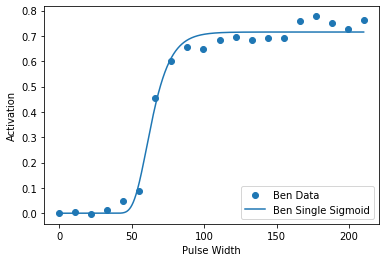

Radial1000uA_17_1.csv


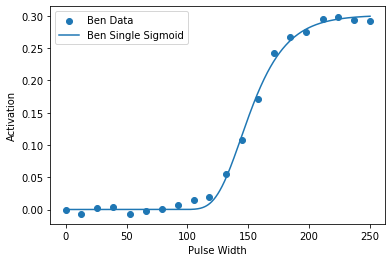

Radial1000uA_17_2.csv


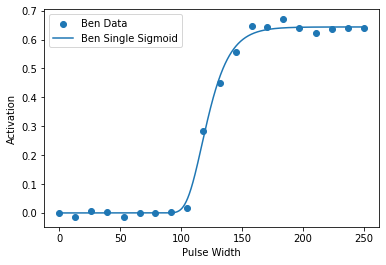

Radial1000uA_17_3.csv


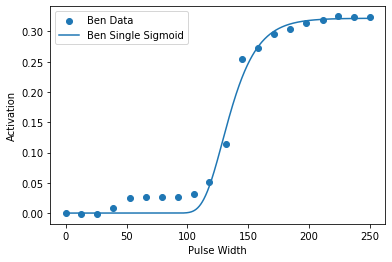

Radial1000uA_17_4.csv


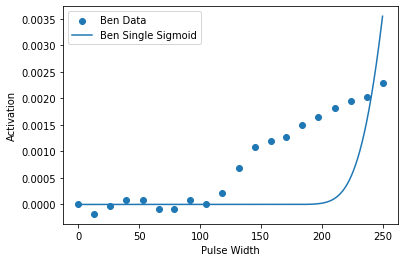

Radial1000uA_17_5.csv


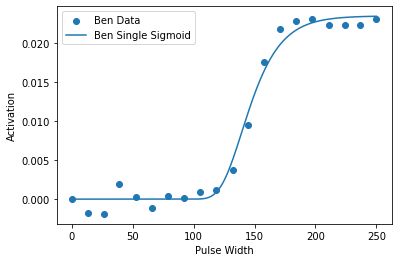

Radial1000uA_17_6.csv


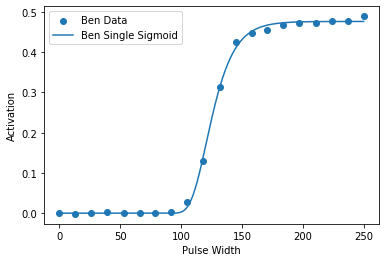

Radial1000uA_17_7.csv


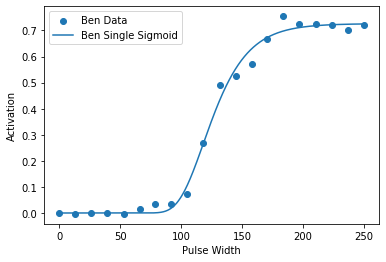

Radial1000uA_17_8.csv


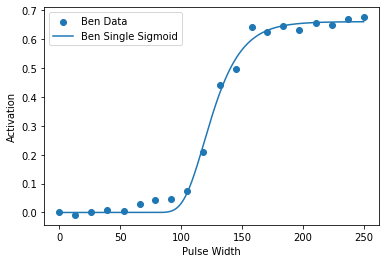

Radial1000uA_4_1.csv


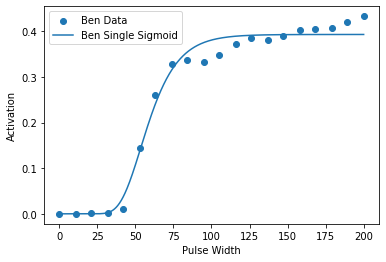

Radial1000uA_4_2.csv


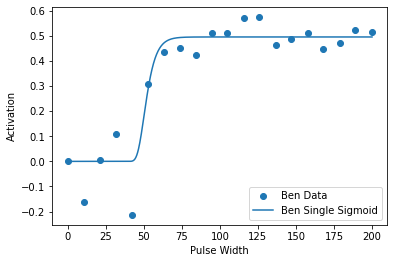

Radial1000uA_4_3.csv


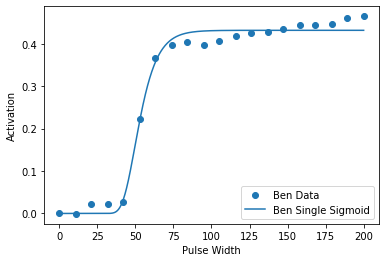

Radial1000uA_4_4.csv


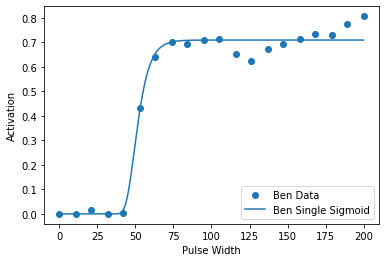

Radial1000uA_4_5.csv


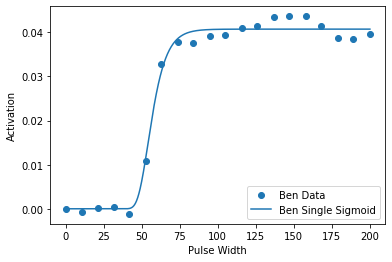

Radial1000uA_4_6.csv


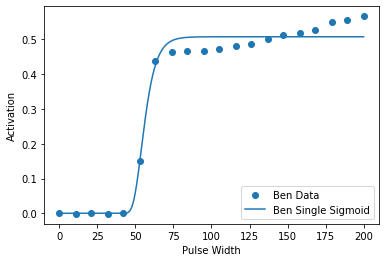

Radial1000uA_4_7.csv


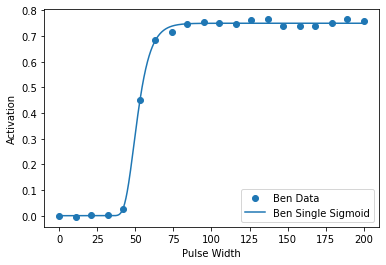

Radial1000uA_4_8.csv


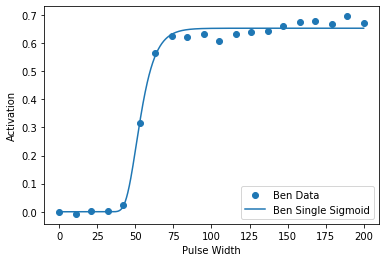

Radial1000uA_5_1.csv


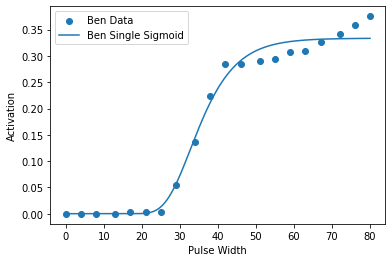

Radial1000uA_5_2.csv


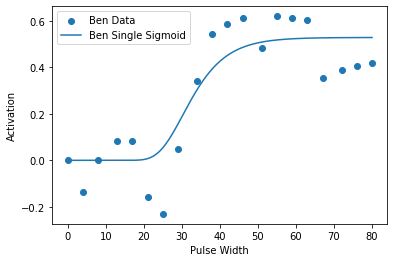

Radial1000uA_5_3.csv


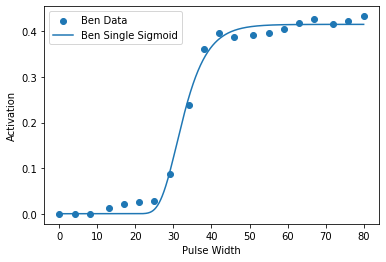

Radial1000uA_5_4.csv


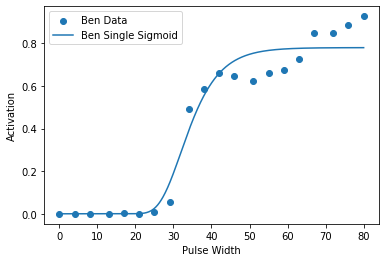

Radial1000uA_5_5.csv


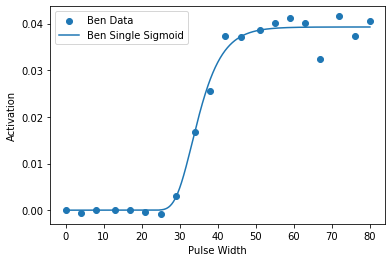

Radial1000uA_5_6.csv


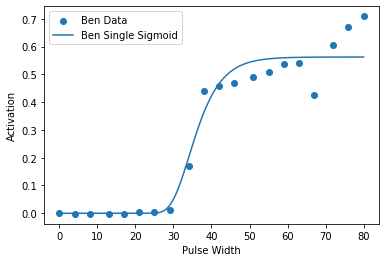

Radial1000uA_5_7.csv


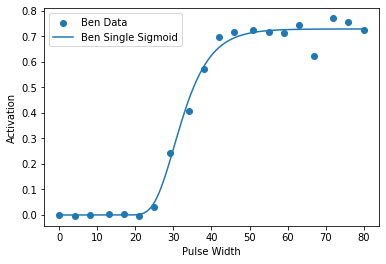

Radial1000uA_5_8.csv


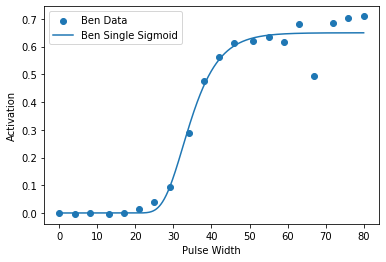

Radial1000uA_6_1.csv


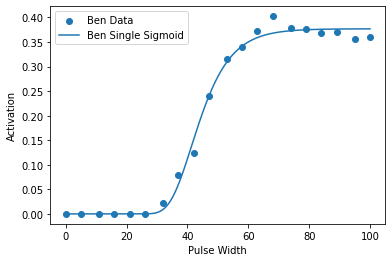

Radial1000uA_6_2.csv


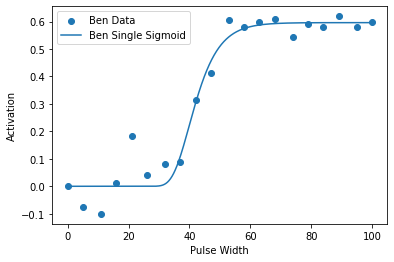

Radial1000uA_6_3.csv


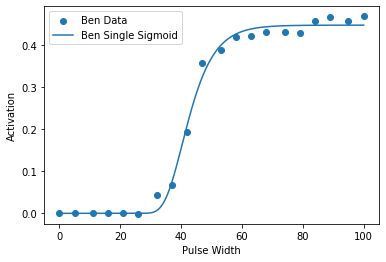

Radial1000uA_6_4.csv


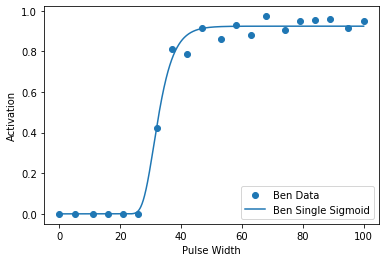

Radial1000uA_6_5.csv


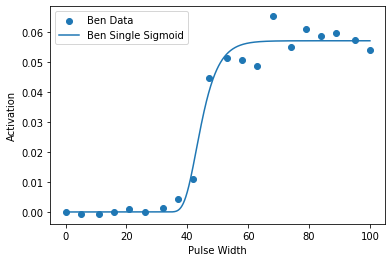

Radial1000uA_6_6.csv


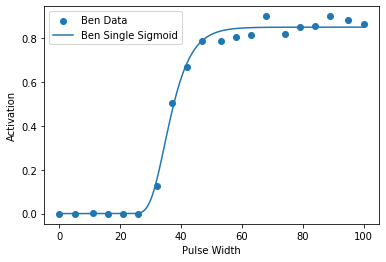

Radial1000uA_6_7.csv


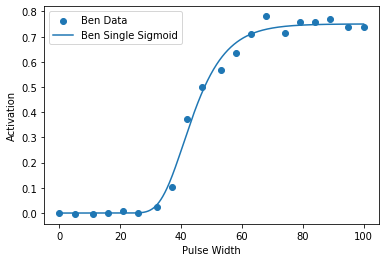

Radial1000uA_6_8.csv


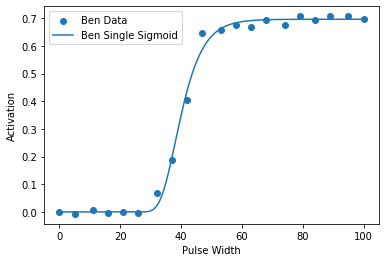

Radial1000uA_7_1.csv


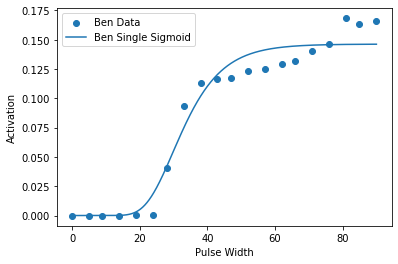

Radial1000uA_7_2.csv


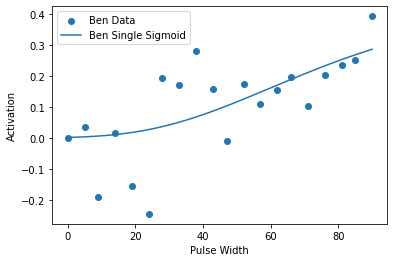

Radial1000uA_7_3.csv


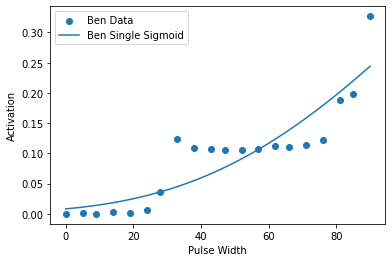

Radial1000uA_7_4.csv


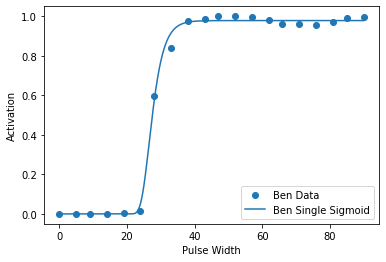

Radial1000uA_7_5.csv


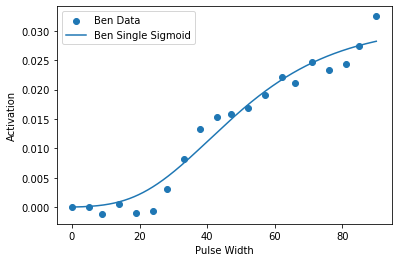

Radial1000uA_7_6.csv


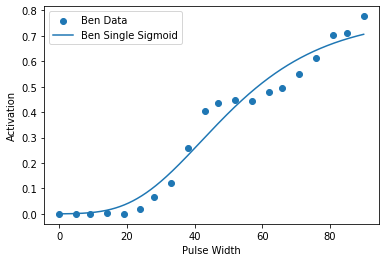

Radial1000uA_7_7.csv


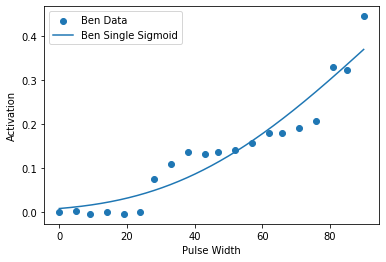

Radial1000uA_7_8.csv


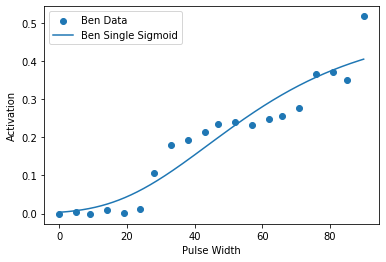

Radial1000uA_8_1.csv


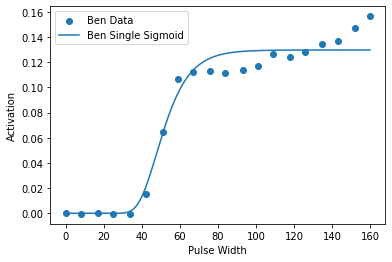

Radial1000uA_8_2.csv


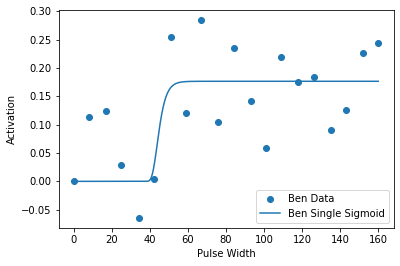

Radial1000uA_8_3.csv


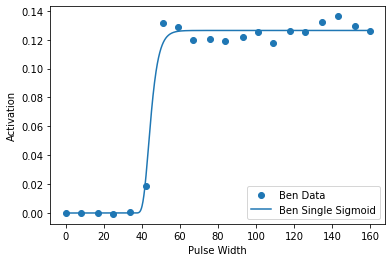

Radial1000uA_8_4.csv


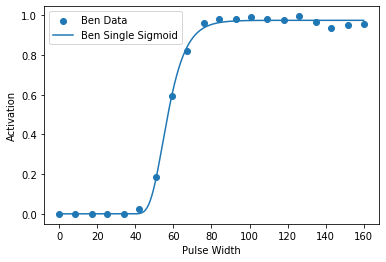

Radial1000uA_8_5.csv


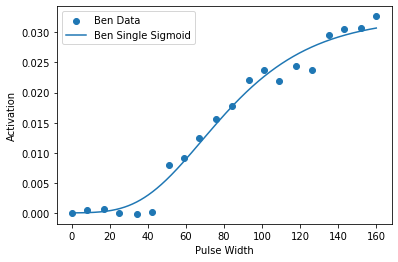

Radial1000uA_8_6.csv


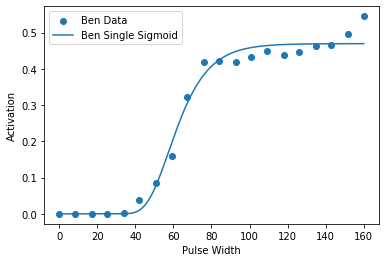

Radial1000uA_8_7.csv


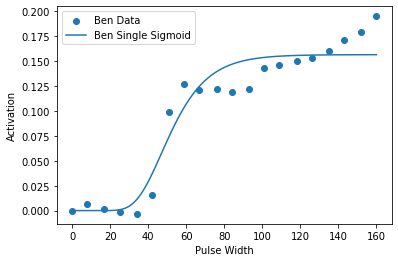

Radial1000uA_8_8.csv


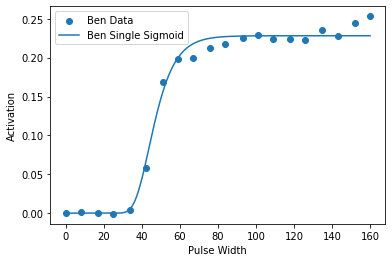

Radial1000uA_9_1.csv


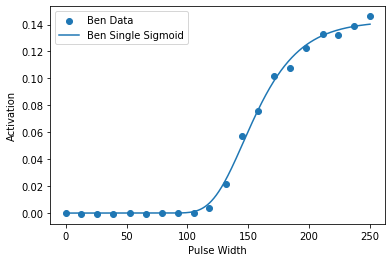

Radial1000uA_9_2.csv


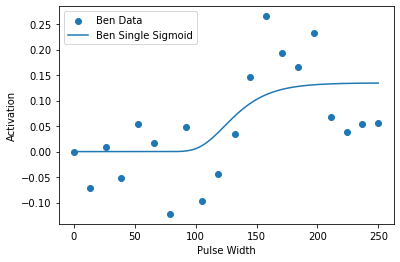

Radial1000uA_9_3.csv


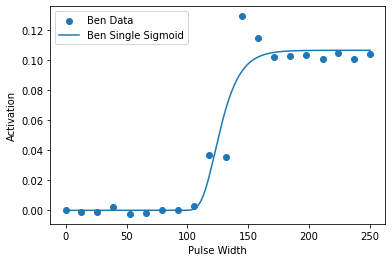

Radial1000uA_9_4.csv


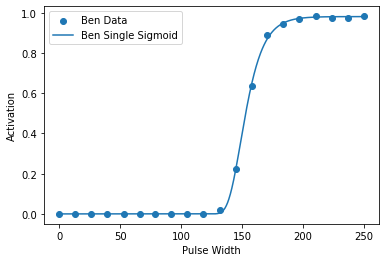

Radial1000uA_9_5.csv


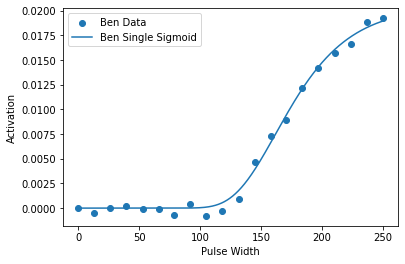

Radial1000uA_9_6.csv


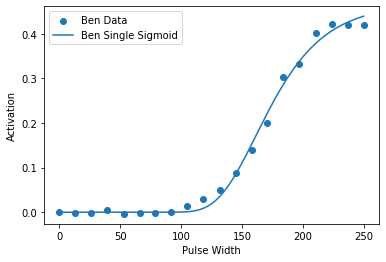

Radial1000uA_9_7.csv


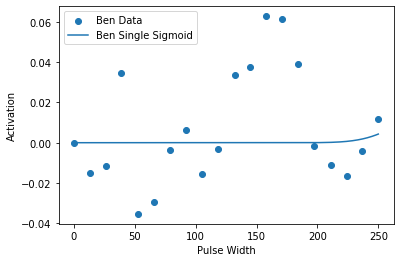

Radial1000uA_9_8.csv


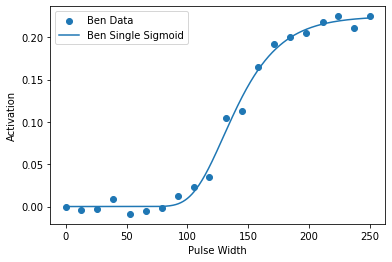

In [117]:
import os
path = '/Volumes/L_MillerLab/limblab/User_folders/Aajan/RecruitmentCurveFigures/Radial1000uA'
filenames = sorted([filename for filename in os.listdir(path)])
for filename in filenames:
    if 'sigmoid' not in filename:
        print(filename)
        f = os.path.join(path,filename)
        f2 = os.path.join(path,filename[:-4]+'_sigmoid.csv')
        curve = np.genfromtxt(f, delimiter = ',')
        sigmoid = np.genfromtxt(f2, delimiter = ',')
        plt.scatter(curve[:,0],curve[:,1], label = 'Ben Data')
        plt.plot(sigmoid[:,0],sigmoid[:,1], label = 'Ben Single Sigmoid')
        plt.xlabel('Pulse Width')
        plt.ylabel('Activation')
        plt.legend()
        plt.show()

### Fitting single sigmoids to Ben's Data

Radial1000uA_10_1.csv
Lowest loss: 3.19e-05
a1: -0.005, a2: 0.136, a3: 0.049, a4: 147.992


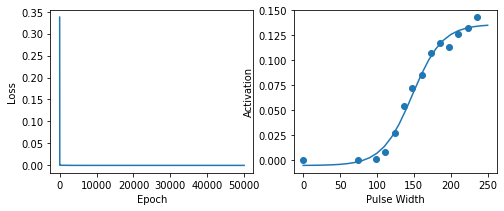

Time to fit plot:  14.896172046661377
Radial1000uA_10_2.csv
Lowest loss: 0.0057173
a1: -0.028, a2: 0.144, a3: 0.024, a4: 62.021


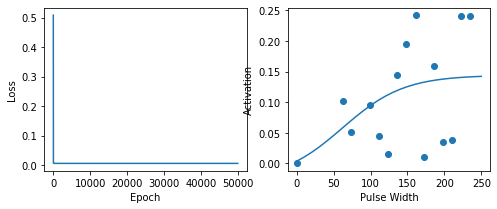

Time to fit plot:  15.703735113143921
Radial1000uA_10_3.csv
Lowest loss: 4.85e-05
a1: -0.001, a2: 0.105, a3: 0.122, a4: 111.013


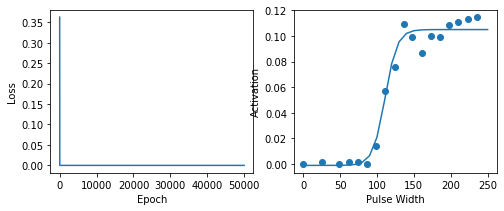

Time to fit plot:  18.246116876602173
Radial1000uA_10_4.csv
Lowest loss: 0.0004188
a1: -0.007, a2: 0.865, a3: 0.087, a4: 199.407


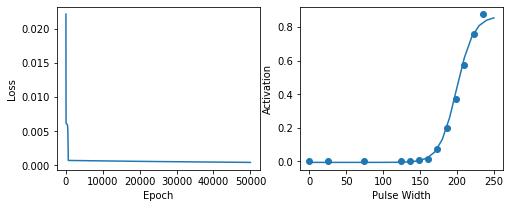

Time to fit plot:  12.953632116317749
Radial1000uA_10_5.csv
Lowest loss: 5.2e-06
a1: 0.002, a2: 0.014, a3: 0.348, a4: 148.004


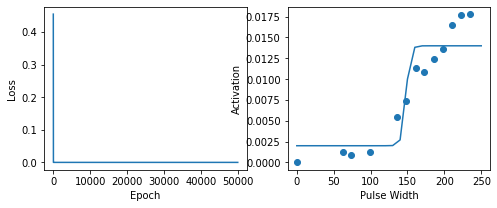

Time to fit plot:  13.11459994316101
Radial1000uA_10_6.csv
Lowest loss: 0.0001717
a1: -0.009, a2: 0.423, a3: 0.063, a4: 148.535


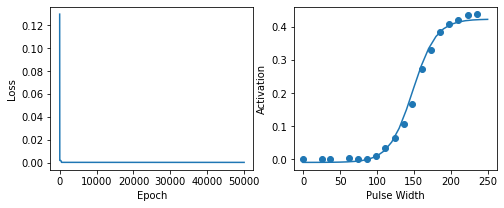

Time to fit plot:  16.69766402244568
Radial1000uA_10_7.csv
Lowest loss: 0.0001859
a1: -0.004, a2: 0.232, a3: 0.036, a4: 160.937


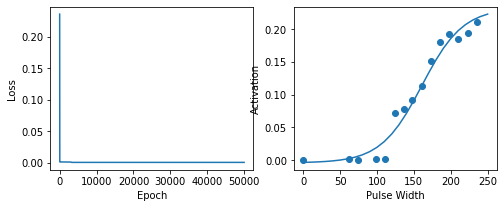

Time to fit plot:  15.272962093353271
Radial1000uA_10_8.csv
Lowest loss: 5.58e-05
a1: -0.006, a2: 0.234, a3: 0.053, a4: 124.021


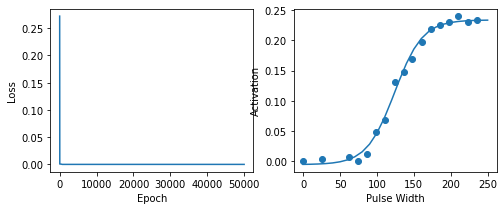

Time to fit plot:  16.032241106033325
Radial1000uA_11_1.csv
Lowest loss: 3.24e-05
a1: -0.0, a2: 0.153, a3: 0.068, a4: 68.961


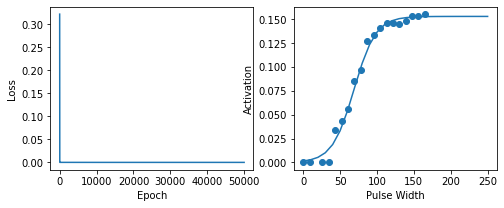

Time to fit plot:  17.724263906478882
Radial1000uA_11_2.csv
Lowest loss: 0.00055
a1: 0.035, a2: 0.052, a3: 0.241, a4: 165.094


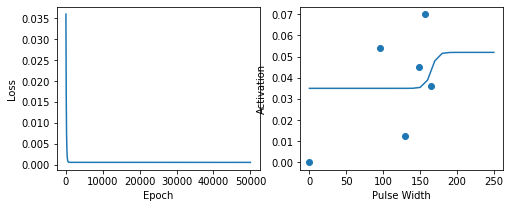

Time to fit plot:  7.114407062530518
Radial1000uA_11_3.csv
Lowest loss: 0.00021
a1: -0.066, a2: 0.175, a3: 0.032, a4: 43.019


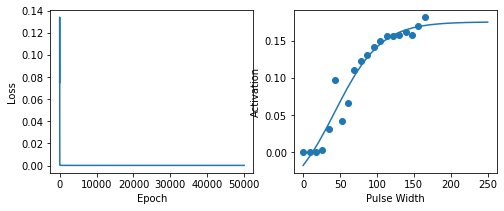

Time to fit plot:  18.55226969718933
Radial1000uA_11_4.csv
Lowest loss: 1e-07
a1: 0.0, a2: 0.004, a3: 0.068, a4: 96.004


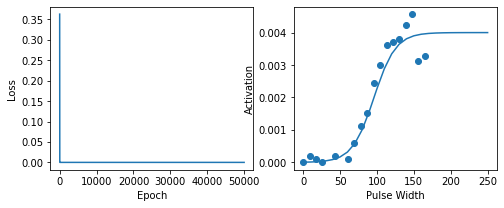

Time to fit plot:  16.57715678215027
Radial1000uA_11_5.csv
Lowest loss: 2.9e-06
a1: -0.002, a2: 0.046, a3: 0.05, a4: 96.004


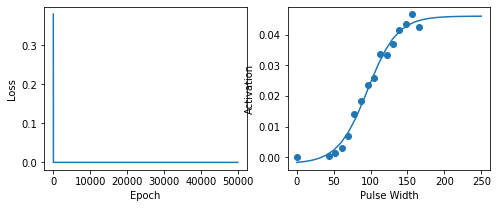

Time to fit plot:  15.315676927566528
Radial1000uA_11_6.csv
Lowest loss: 0.0001893
a1: -0.007, a2: 0.495, a3: 0.186, a4: 61.984


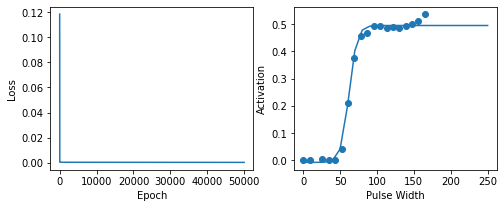

Time to fit plot:  17.935111045837402
Radial1000uA_11_7.csv
Lowest loss: 0.0001277
a1: -0.009, a2: 0.247, a3: 0.049, a4: 86.964


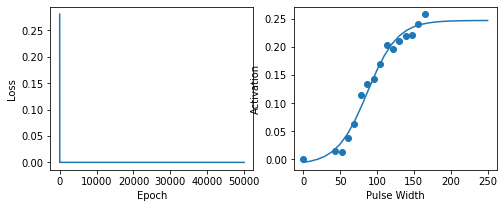

Time to fit plot:  14.845772981643677
Radial1000uA_11_8.csv
Lowest loss: 0.0015374
a1: 0.055, a2: 0.523, a3: 0.136, a4: 75.976


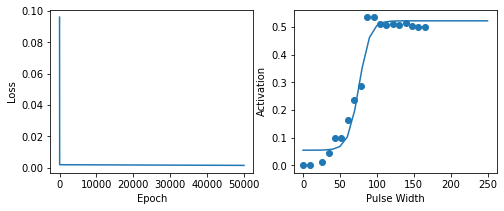

Time to fit plot:  17.60026502609253
Radial1000uA_12_1.csv
Lowest loss: 0.0004393
a1: -0.024, a2: 0.429, a3: 0.021, a4: 91.954


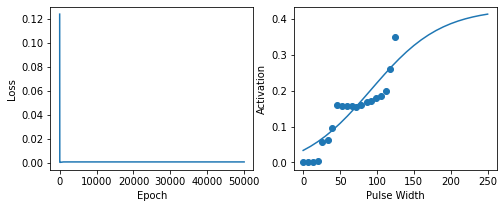

Time to fit plot:  18.639787912368774
Radial1000uA_12_2.csv
Lowest loss: 0.0030835
a1: 0.101, a2: 0.48, a3: 0.156, a4: 105.199


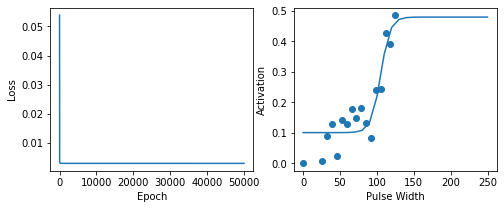

Time to fit plot:  16.50803565979004
Radial1000uA_12_3.csv
Lowest loss: 0.0007355
a1: 0.026, a2: 0.67, a3: 0.049, a4: 86.396


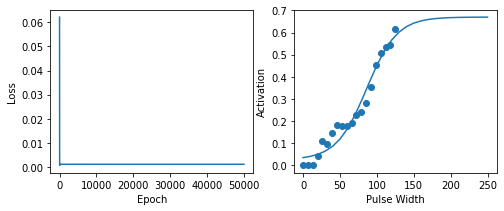

Time to fit plot:  18.290584087371826
Radial1000uA_12_4.csv
Lowest loss: 1.2e-06
a1: -0.104, a2: 0.113, a3: 0.0, a4: 112.015


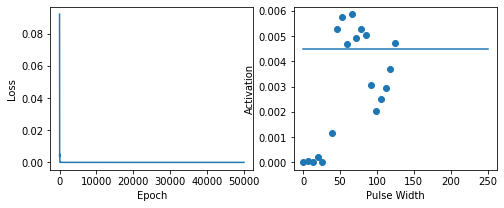

Time to fit plot:  17.854225873947144
Radial1000uA_12_5.csv
Lowest loss: 1.77e-05
a1: -0.094, a2: 0.17, a3: 0.009, a4: 72.003


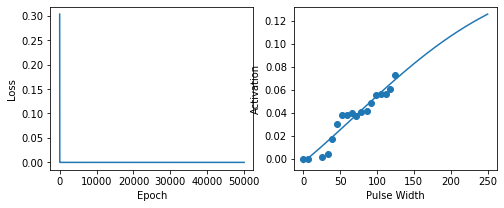

Time to fit plot:  22.034596920013428
Radial1000uA_12_6.csv
Lowest loss: 0.0021629
a1: -0.152, a2: 0.766, a3: 0.049, a4: 45.882


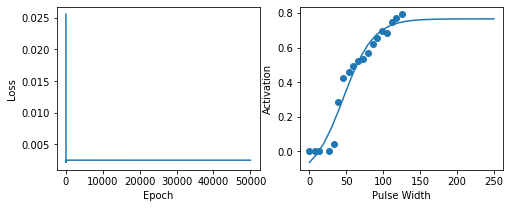

Time to fit plot:  22.09404420852661
Radial1000uA_12_7.csv
Lowest loss: 0.0010582
a1: 0.02, a2: 0.804, a3: 0.053, a4: 92.491


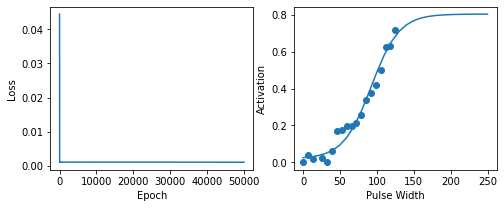

Time to fit plot:  21.940638065338135
Radial1000uA_12_8.csv
Lowest loss: 0.0029546
a1: -0.221, a2: 0.852, a3: 0.047, a4: 39.796


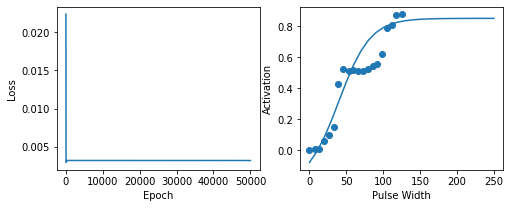

Time to fit plot:  23.0706889629364
Skipping Radial1000uA_13_1.csv
Radial1000uA_13_2.csv
Lowest loss: 0.0007868
a1: 0.026, a2: 0.782, a3: 0.143, a4: 42.927


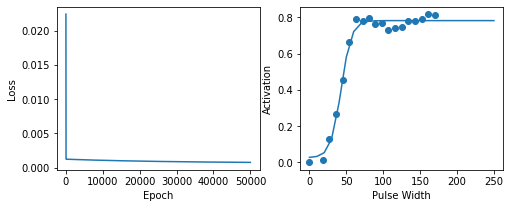

Time to fit plot:  22.30307698249817
Radial1000uA_13_3.csv
Lowest loss: 0.0017971
a1: 0.072, a2: 1.007, a3: 0.039, a4: 106.962


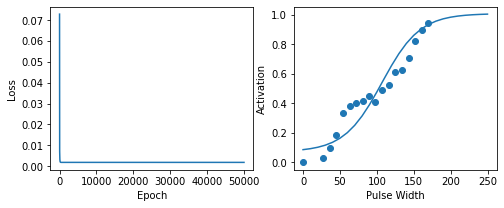

Time to fit plot:  19.398139715194702
Radial1000uA_13_4.csv
Lowest loss: 0.0
a1: 0.0, a2: 0.001, a3: 0.131, a4: 98.004


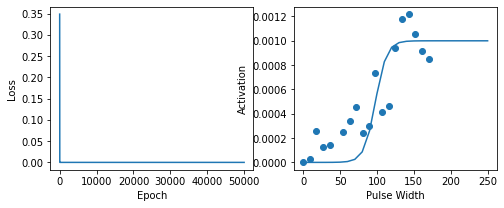

Time to fit plot:  20.900469064712524
Radial1000uA_13_5.csv
Lowest loss: 0.0004159
a1: -0.021, a2: 0.293, a3: 0.017, a4: 142.99


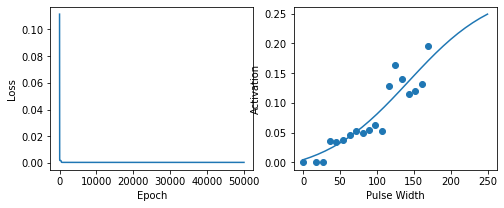

Time to fit plot:  21.971449851989746
Radial1000uA_13_6.csv
Lowest loss: 0.0023436
a1: -0.014, a2: 0.857, a3: 0.239, a4: 42.727


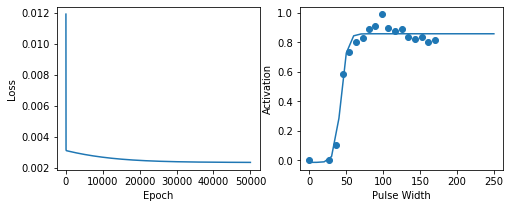

Time to fit plot:  17.42507290840149
Radial1000uA_13_7.csv
Lowest loss: 0.0036493
a1: -0.072, a2: 0.915, a3: 0.063, a4: 53.197


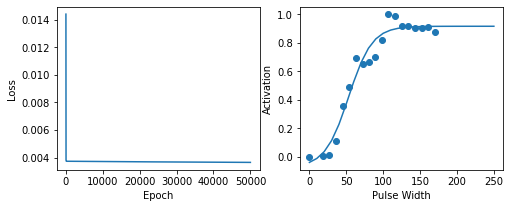

Time to fit plot:  18.849414825439453
Radial1000uA_13_8.csv
Lowest loss: 0.00218
a1: 0.001, a2: 0.84, a3: 0.141, a4: 41.091


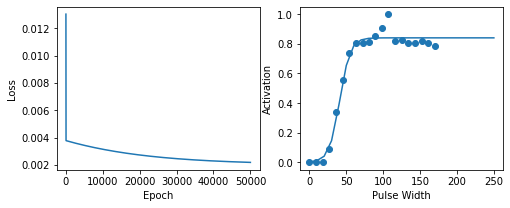

Time to fit plot:  18.983044862747192
Radial1000uA_14_1.csv
Lowest loss: 0.0004111
a1: 0.039, a2: 0.341, a3: 0.115, a4: 52.427


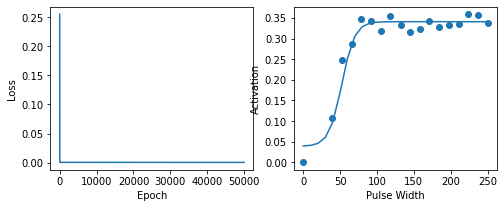

Time to fit plot:  17.449697017669678
Radial1000uA_14_2.csv
Lowest loss: 0.0002863
a1: 0.003, a2: 0.769, a3: 0.2, a4: 37.595


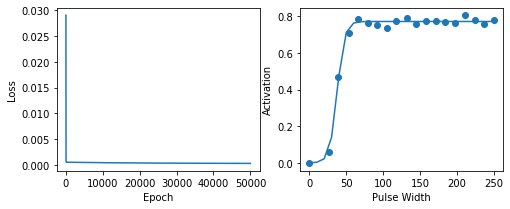

Time to fit plot:  17.58520007133484
Radial1000uA_14_3.csv
Lowest loss: 0.0001761
a1: 0.017, a2: 0.38, a3: 0.178, a4: 38.355


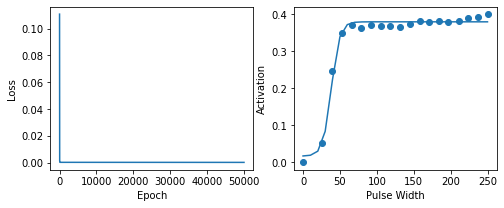

Time to fit plot:  17.52047109603882
Radial1000uA_14_4.csv
Lowest loss: 0.0071692
a1: 0.0, a2: 0.202, a3: 2.287, a4: 36.764


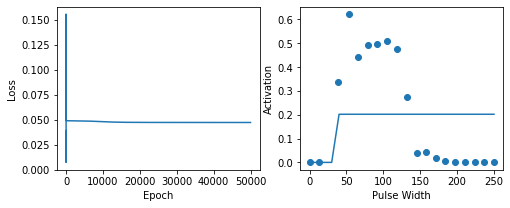

Time to fit plot:  17.397737979888916
Radial1000uA_14_5.csv
Lowest loss: 2.91e-05
a1: -0.022, a2: 0.056, a3: 0.015, a4: 53.001


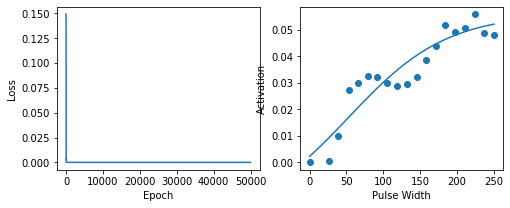

Time to fit plot:  17.859928846359253
Radial1000uA_14_6.csv
Lowest loss: 0.0026346
a1: 0.008, a2: 0.824, a3: 0.094, a4: 50.346


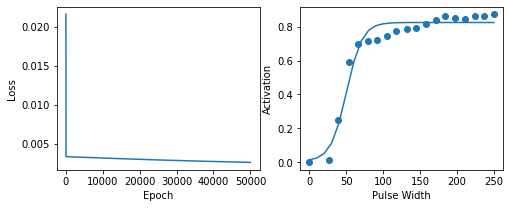

Time to fit plot:  17.71485996246338
Radial1000uA_14_7.csv
Lowest loss: 0.0005144
a1: 0.044, a2: 0.692, a3: 0.699, a4: 38.113


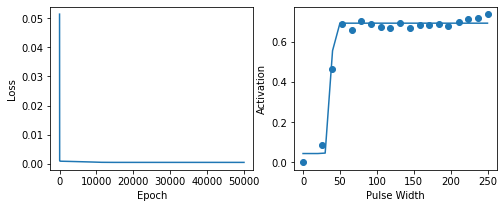

Time to fit plot:  17.88815999031067
Radial1000uA_14_8.csv
Lowest loss: 0.0002545
a1: 0.011, a2: 0.83, a3: 0.102, a4: 37.968


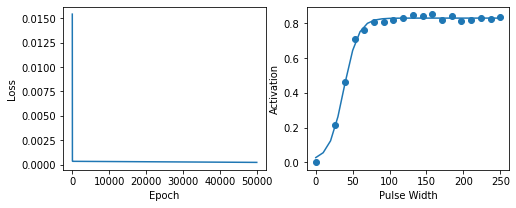

Time to fit plot:  17.660235166549683
Radial1000uA_15_1.csv
Lowest loss: 0.0001116
a1: 0.001, a2: 0.292, a3: 0.211, a4: 45.319


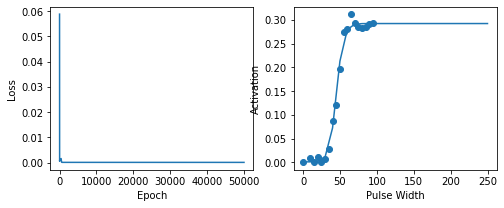

Time to fit plot:  17.770696878433228
Radial1000uA_15_2.csv
Lowest loss: 0.0007743
a1: 0.015, a2: 0.673, a3: 0.315, a4: 40.571


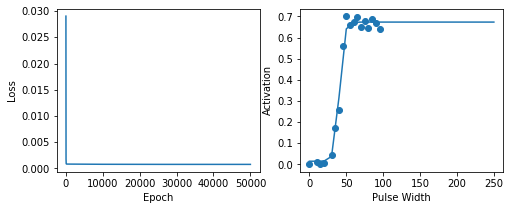

Time to fit plot:  17.50063395500183
Radial1000uA_15_3.csv
Lowest loss: 0.0002055
a1: 0.001, a2: 0.349, a3: 0.195, a4: 39.87


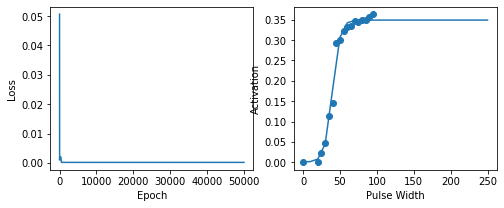

Time to fit plot:  16.11103582382202
Radial1000uA_15_4.csv
Lowest loss: 0.0001078
a1: -0.002, a2: 0.738, a3: 0.316, a4: 84.033


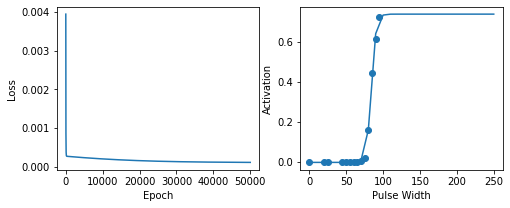

Time to fit plot:  13.795236110687256
Radial1000uA_15_5.csv
Lowest loss: 6.8e-06
a1: -0.316, a2: 0.338, a3: 0.002, a4: 50.005


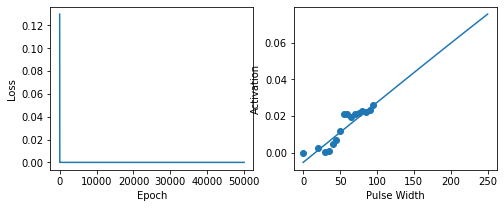

Time to fit plot:  15.222763061523438
Radial1000uA_15_6.csv
Lowest loss: 0.0007898
a1: -0.004, a2: 0.488, a3: 0.28, a4: 45.505


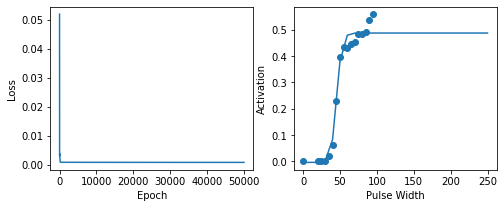

Time to fit plot:  15.824709177017212
Radial1000uA_15_7.csv
Lowest loss: 0.000331
a1: 0.006, a2: 0.7, a3: 0.328, a4: 39.314


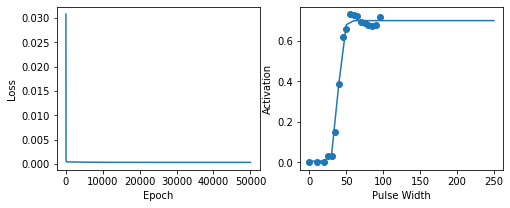

Time to fit plot:  16.992363929748535
Radial1000uA_15_8.csv
Lowest loss: 0.0005313
a1: -0.013, a2: 0.704, a3: 0.177, a4: 40.055


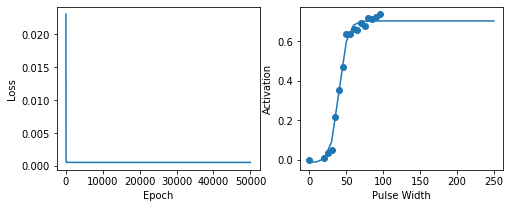

Time to fit plot:  15.660322904586792
Radial1000uA_16_1.csv
Lowest loss: 7.77e-05
a1: 0.01, a2: 0.27, a3: 0.183, a4: 76.698


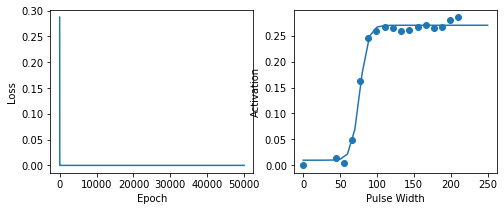

Time to fit plot:  16.189500093460083
Radial1000uA_16_2.csv
Lowest loss: 0.0008427
a1: 0.029, a2: 0.661, a3: 0.205, a4: 64.612


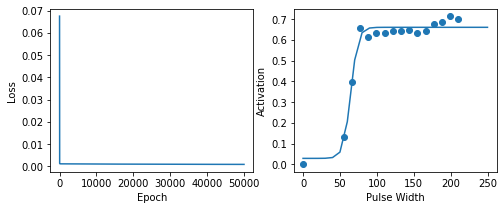

Time to fit plot:  15.534656763076782
Radial1000uA_16_3.csv
Lowest loss: 0.0001113
a1: 0.011, a2: 0.335, a3: 0.125, a4: 65.678


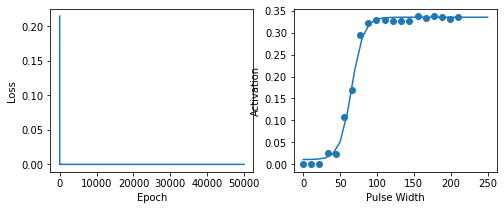

Time to fit plot:  19.699063062667847
Radial1000uA_16_4.csv
Lowest loss: 3.06e-05
a1: 0.002, a2: 0.285, a3: 0.081, a4: 188.009


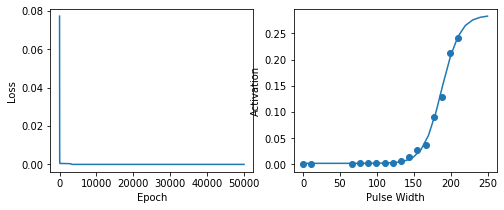

Time to fit plot:  14.96844220161438
Radial1000uA_16_5.csv
Lowest loss: 3.4e-06
a1: 0.003, a2: 0.026, a3: 0.2, a4: 76.997


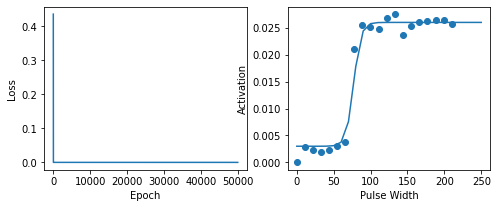

Time to fit plot:  18.893845081329346
Radial1000uA_16_6.csv
Lowest loss: 0.0011448
a1: -0.01, a2: 0.52, a3: 0.174, a4: 67.602


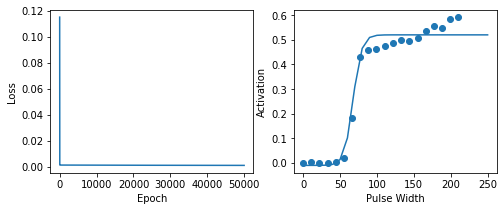

Time to fit plot:  18.502752780914307
Radial1000uA_16_7.csv
Lowest loss: 0.0008277
a1: 0.036, a2: 0.697, a3: 0.938, a4: 64.581


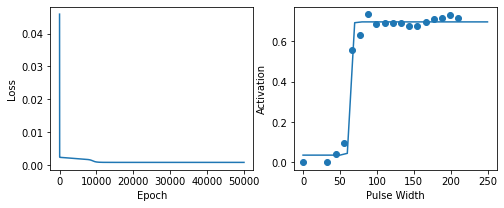

Time to fit plot:  16.47703719139099
Radial1000uA_16_8.csv
Lowest loss: 0.0013101
a1: 0.006, a2: 0.716, a3: 0.154, a4: 64.913


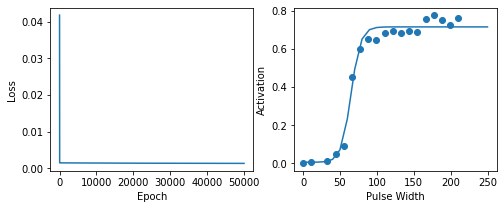

Time to fit plot:  17.63930082321167
Radial1000uA_17_1.csv
Lowest loss: 8.51e-05
a1: 0.008, a2: 0.303, a3: 0.07, a4: 157.749


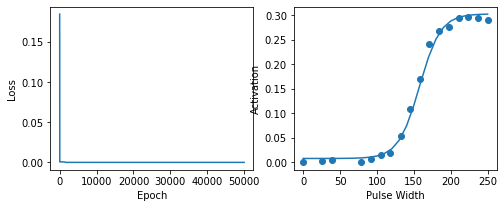

Time to fit plot:  15.686020135879517
Radial1000uA_17_2.csv
Lowest loss: 0.0008067
a1: -0.02, a2: 0.633, a3: 0.112, a4: 119.665


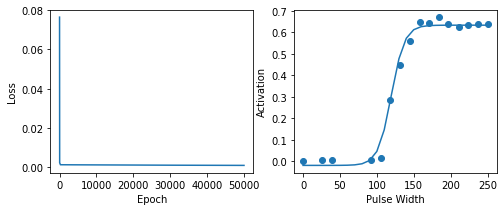

Time to fit plot:  15.1404390335083
Radial1000uA_17_3.csv
Lowest loss: 0.0002248
a1: 0.012, a2: 0.311, a3: 0.107, a4: 132.453


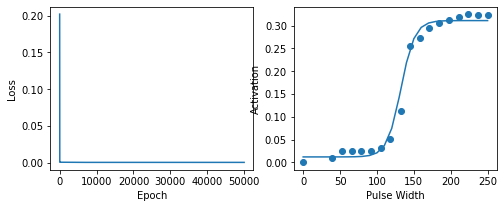

Time to fit plot:  17.072832107543945
Radial1000uA_17_4.csv
Lowest loss: 1e-07
a1: 0.0, a2: 0.002, a3: 0.389, a4: 158.004


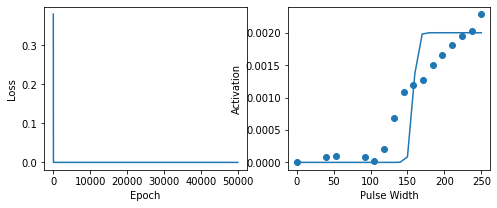

Time to fit plot:  15.131877183914185
Radial1000uA_17_5.csv
Lowest loss: 2e-06
a1: 0.001, a2: 0.022, a3: 0.334, a4: 145.007


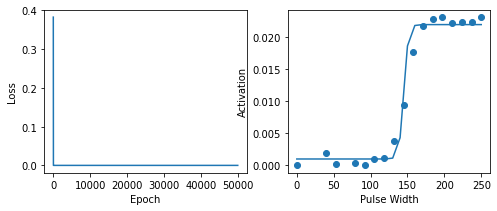

Time to fit plot:  15.857777118682861
Radial1000uA_17_6.csv
Lowest loss: 0.0003001
a1: 0.007, a2: 0.481, a3: 0.108, a4: 130.8


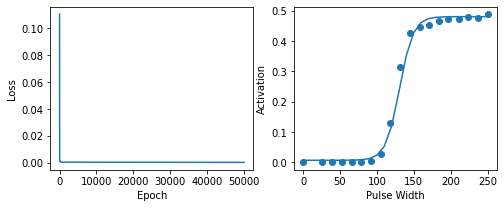

Time to fit plot:  17.34572410583496
Radial1000uA_17_7.csv
Lowest loss: 0.0015523
a1: -0.029, a2: 0.7, a3: 0.068, a4: 120.327


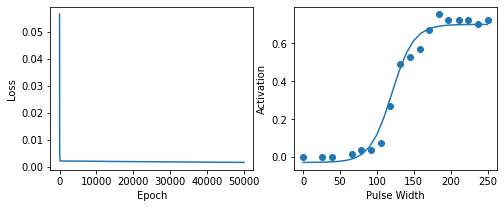

Time to fit plot:  16.71364998817444
Radial1000uA_17_8.csv
Lowest loss: 0.0006243
a1: 0.02, a2: 0.664, a3: 0.083, a4: 130.597


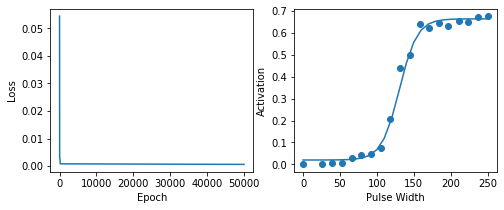

Time to fit plot:  17.669572114944458
Radial1000uA_4_1.csv
Lowest loss: 0.0007263
a1: -0.002, a2: 0.397, a3: 0.094, a4: 62.334


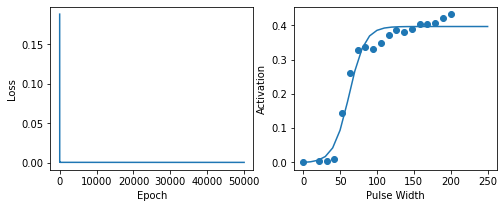

Time to fit plot:  17.663928985595703
Radial1000uA_4_2.csv
Lowest loss: 0.0014491
a1: 0.02, a2: 0.507, a3: 0.104, a4: 52.113


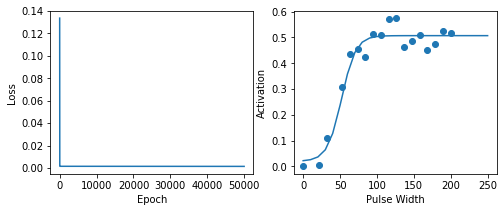

Time to fit plot:  17.76094698905945
Radial1000uA_4_3.csv
Lowest loss: 0.0003608
a1: 0.006, a2: 0.431, a3: 0.192, a4: 53.172


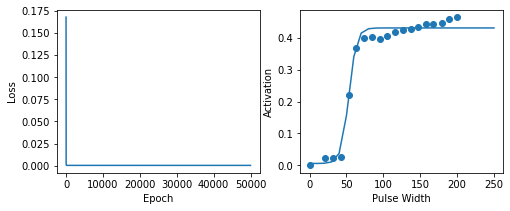

Time to fit plot:  18.220637798309326
Radial1000uA_4_4.csv
Lowest loss: 0.0014921
a1: -0.002, a2: 0.709, a3: 0.31, a4: 51.826


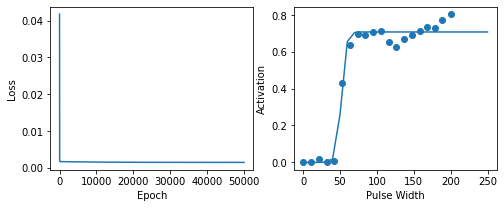

Time to fit plot:  18.890766143798828
Radial1000uA_4_5.csv
Lowest loss: 1.04e-05
a1: 0.002, a2: 0.041, a3: 0.149, a4: 62.992


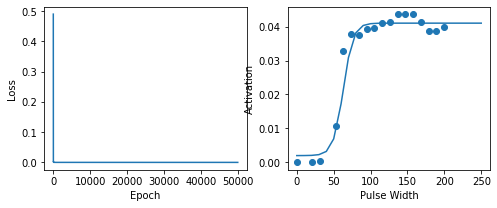

Time to fit plot:  16.779439210891724
Radial1000uA_4_6.csv
Lowest loss: 0.000998
a1: -0.013, a2: 0.507, a3: 0.256, a4: 54.828


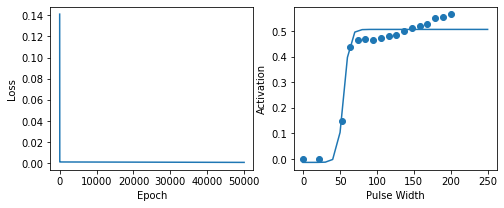

Time to fit plot:  16.120985746383667
Radial1000uA_4_7.csv
Lowest loss: 0.0002021
a1: -0.004, a2: 0.747, a3: 0.274, a4: 51.75


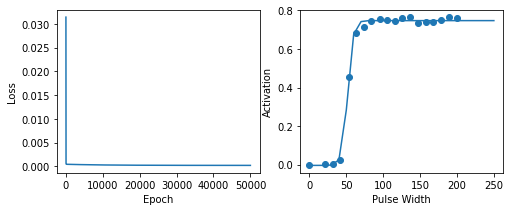

Time to fit plot:  17.470205783843994
Radial1000uA_4_8.csv
Lowest loss: 0.0004593
a1: -0.007, a2: 0.652, a3: 0.215, a4: 53.348


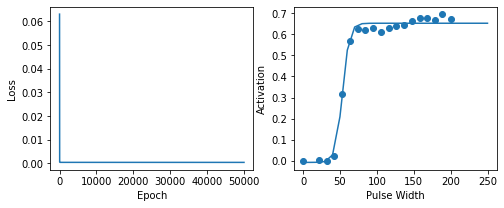

Time to fit plot:  18.333997011184692
Radial1000uA_5_1.csv
Lowest loss: 0.0004765
a1: 0.001, a2: 0.334, a3: 0.219, a4: 36.768


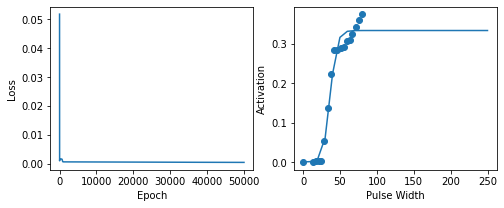

Time to fit plot:  16.660643100738525
Radial1000uA_5_2.csv
Lowest loss: 0.0065935
a1: 0.043, a2: 0.508, a3: 1.303, a4: 33.539


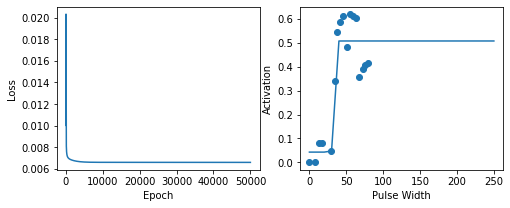

Time to fit plot:  16.13651990890503
Radial1000uA_5_3.csv
Lowest loss: 0.000127
a1: 0.014, a2: 0.413, a3: 0.364, a4: 33.315


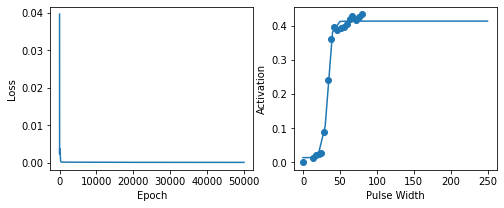

Time to fit plot:  16.891725063323975
Radial1000uA_5_4.csv
Lowest loss: 0.0066657
a1: -0.02, a2: 0.766, a3: 0.298, a4: 33.632


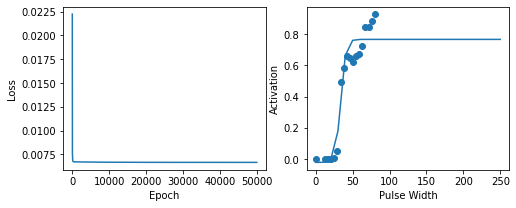

Time to fit plot:  16.818700075149536
Radial1000uA_5_5.csv
Lowest loss: 3.03e-05
a1: -0.24, a2: 0.275, a3: 0.004, a4: 34.005


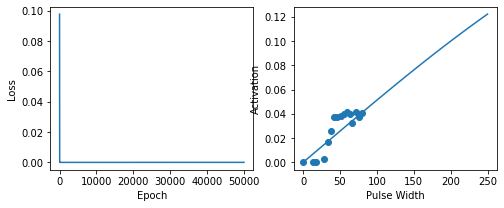

Time to fit plot:  15.004090785980225
Radial1000uA_5_6.csv
Lowest loss: 0.006992
a1: 0.032, a2: 1.114, a3: 0.029, a4: 64.611


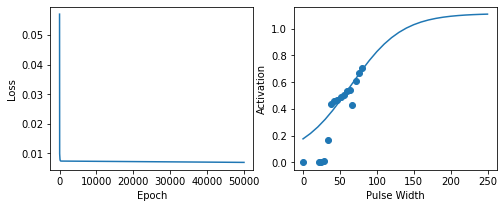

Time to fit plot:  15.327140092849731
Radial1000uA_5_7.csv
Lowest loss: 0.0010875
a1: -0.006, a2: 0.725, a3: 0.269, a4: 32.614


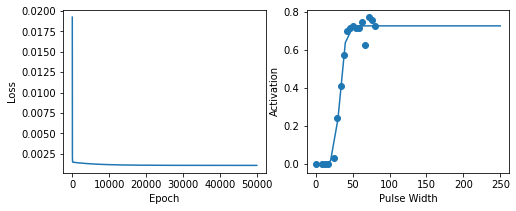

Time to fit plot:  16.927335262298584
Radial1000uA_5_8.csv
Lowest loss: 0.0021056
a1: -0.002, a2: 0.644, a3: 0.284, a4: 34.697


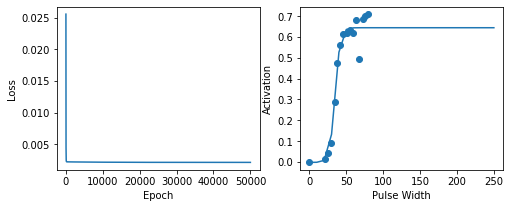

Time to fit plot:  15.334694147109985
Radial1000uA_6_1.csv
Lowest loss: 0.0001675
a1: 0.004, a2: 0.377, a3: 0.202, a4: 45.845


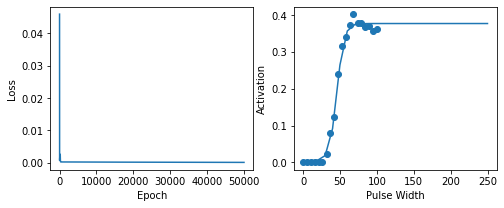

Time to fit plot:  18.449732065200806
Radial1000uA_6_2.csv
Lowest loss: 0.0017416
a1: 0.055, a2: 0.592, a3: 0.294, a4: 43.168


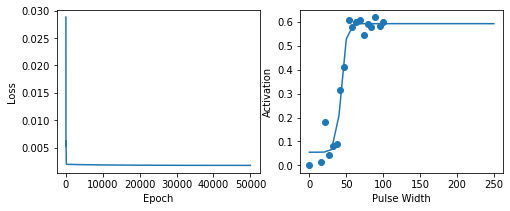

Time to fit plot:  17.23906898498535
Radial1000uA_6_3.csv
Lowest loss: 0.0002649
a1: 0.0, a2: 0.444, a3: 0.263, a4: 42.59


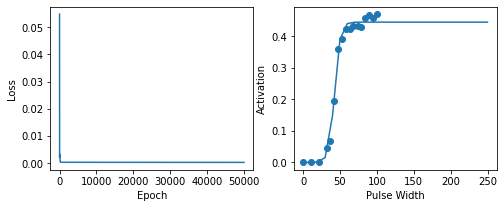

Time to fit plot:  15.793596982955933
Radial1000uA_6_4.csv
Lowest loss: 0.0015312
a1: -0.009, a2: 0.92, a3: 0.428, a4: 32.488


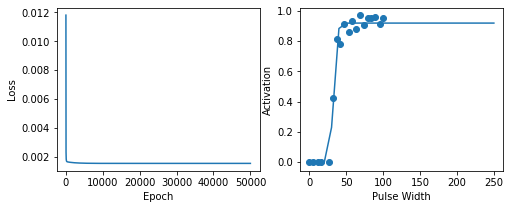

Time to fit plot:  17.477802991867065
Radial1000uA_6_5.csv
Lowest loss: 2.79e-05
a1: 0.001, a2: 0.059, a3: 0.216, a4: 46.998


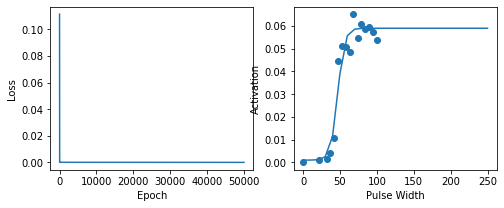

Time to fit plot:  15.237047910690308
Radial1000uA_6_6.csv
Lowest loss: 0.0013028
a1: -0.009, a2: 0.849, a3: 0.285, a4: 36.547


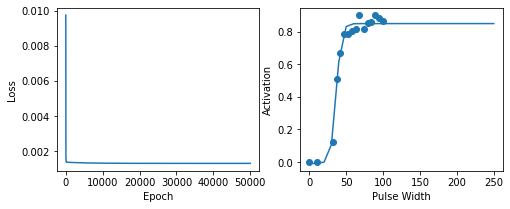

Time to fit plot:  15.618611812591553
Radial1000uA_6_7.csv
Lowest loss: 0.0011333
a1: -0.024, a2: 0.743, a3: 0.177, a4: 43.532


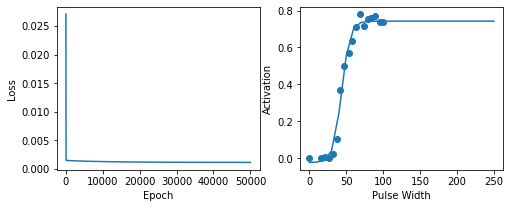

Time to fit plot:  17.27006721496582
Radial1000uA_6_8.csv
Lowest loss: 0.0002565
a1: 0.006, a2: 0.692, a3: 0.306, a4: 40.536


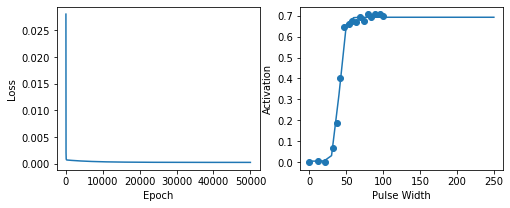

Time to fit plot:  15.816367149353027
Radial1000uA_7_1.csv
Lowest loss: 0.0002057
a1: -0.009, a2: 0.146, a3: 0.158, a4: 32.949


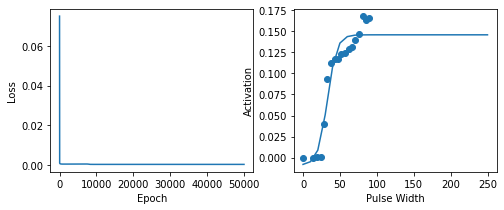

Time to fit plot:  16.636881113052368
Radial1000uA_7_2.csv
Lowest loss: 0.0025063
a1: 0.014, a2: 0.403, a3: 0.028, a4: 65.883


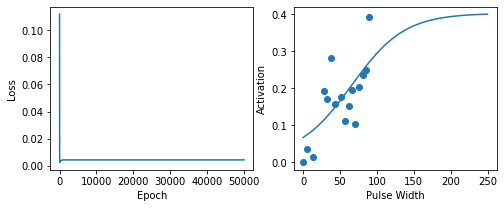

Time to fit plot:  15.444581747055054
Radial1000uA_7_3.csv
Lowest loss: 0.0009038
a1: -0.001, a2: 0.396, a3: 0.041, a4: 81.048


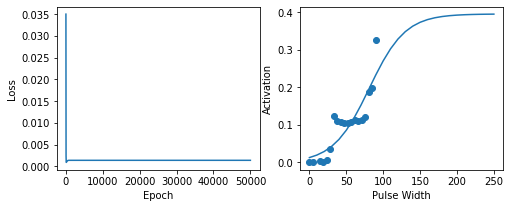

Time to fit plot:  17.53055500984192
Radial1000uA_7_4.csv
Lowest loss: 0.0010804
a1: -0.006, a2: 0.973, a3: 0.825, a4: 27.486


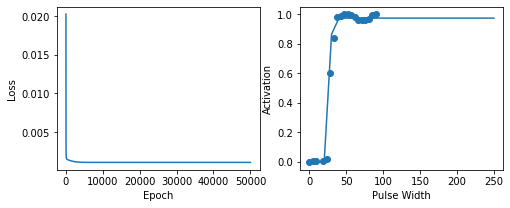

Time to fit plot:  17.55032181739807
Radial1000uA_7_5.csv
Lowest loss: 2.2e-06
a1: -0.326, a2: 0.355, a3: 0.002, a4: 47.006


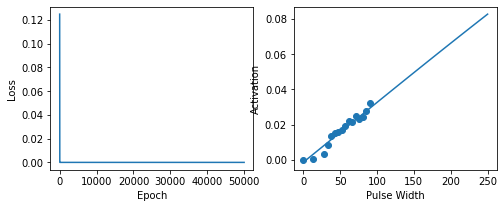

Time to fit plot:  15.209975004196167
Radial1000uA_7_6.csv
Lowest loss: 0.0019438
a1: -0.114, a2: 0.75, a3: 0.063, a4: 43.783


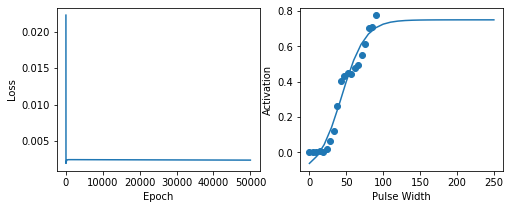

Time to fit plot:  19.82473373413086
Radial1000uA_7_7.csv
Lowest loss: 0.0010665
a1: 0.011, a2: 0.542, a3: 0.051, a4: 76.166


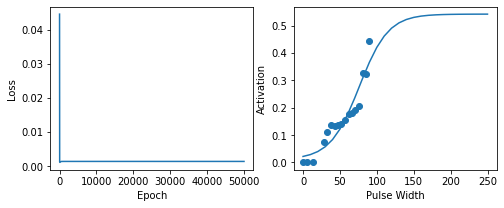

Time to fit plot:  16.070680618286133
Radial1000uA_7_8.csv
Lowest loss: 0.0007392
a1: -0.058, a2: 0.668, a3: 0.033, a4: 65.904


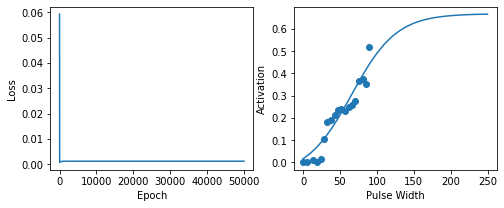

Time to fit plot:  17.52982187271118
Radial1000uA_8_1.csv
Lowest loss: 0.0001285
a1: -0.003, a2: 0.129, a3: 0.161, a4: 51.013


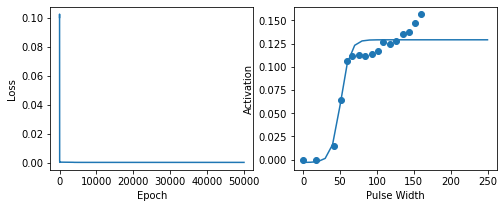

Time to fit plot:  16.03441286087036
Radial1000uA_8_2.csv
Lowest loss: 0.004598
a1: 0.073, a2: 0.234, a3: 0.019, a4: 92.94


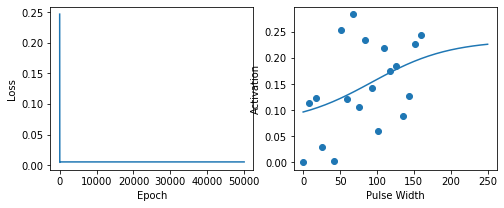

Time to fit plot:  17.37177610397339
Radial1000uA_8_3.csv
Lowest loss: 8.48e-05
a1: -0.009, a2: 0.125, a3: 0.612, a4: 42.476


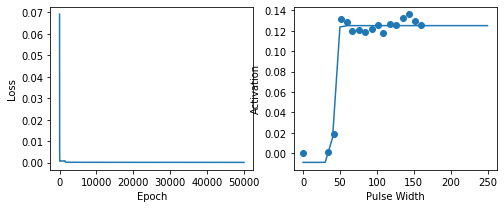

Time to fit plot:  16.049829959869385
Radial1000uA_8_4.csv
Lowest loss: 0.000338
a1: -0.008, a2: 0.972, a3: 0.207, a4: 57.393


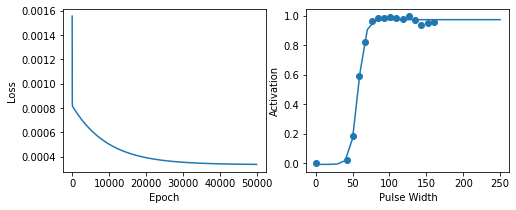

Time to fit plot:  15.323997259140015
Radial1000uA_8_5.csv
Lowest loss: 1.4e-06
a1: -0.171, a2: 0.199, a3: 0.002, a4: 76.004


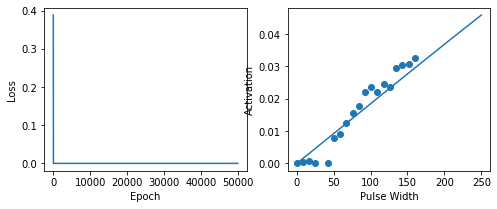

Time to fit plot:  17.857024908065796
Radial1000uA_8_6.csv
Lowest loss: 0.0008879
a1: 0.013, a2: 0.471, a3: 0.13, a4: 65.485


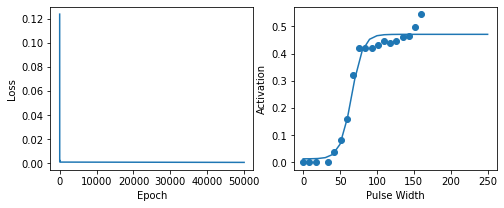

Time to fit plot:  18.435084104537964
Radial1000uA_8_7.csv
Lowest loss: 0.0002435
a1: -0.035, a2: 0.179, a3: 0.034, a4: 50.98


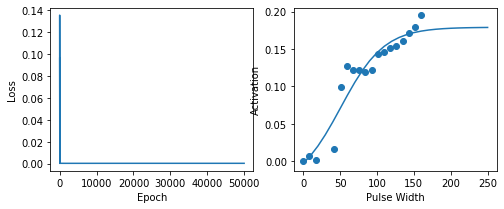

Time to fit plot:  17.523178815841675
Radial1000uA_8_8.csv
Lowest loss: 0.0002165
a1: 0.006, a2: 0.231, a3: 0.163, a4: 50.53


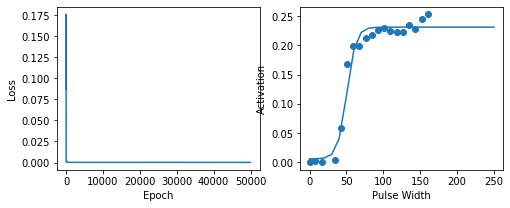

Time to fit plot:  17.807263135910034
Radial1000uA_9_1.csv
Lowest loss: 3.7e-05
a1: -0.002, a2: 0.142, a3: 0.053, a4: 157.984


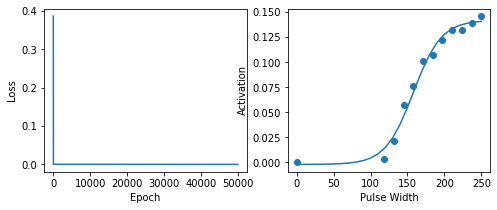

Time to fit plot:  11.90605902671814
Radial1000uA_9_2.csv
Lowest loss: 0.0040386
a1: 0.03, a2: 0.134, a3: 1.031, a4: 144.107


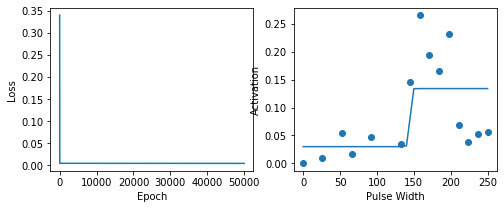

Time to fit plot:  14.13649606704712
Radial1000uA_9_3.csv
Lowest loss: 0.0002515
a1: -0.01, a2: 0.103, a3: 0.095, a4: 118.106


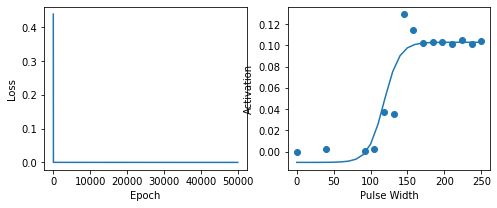

Time to fit plot:  14.069357872009277
Radial1000uA_9_4.csv
Lowest loss: 0.0001525
a1: 0.002, a2: 0.98, a3: 0.139, a4: 154.735


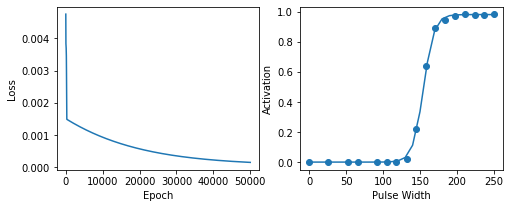

Time to fit plot:  15.846392154693604
Radial1000uA_9_5.csv
Lowest loss: 6.1e-06
a1: 0.002, a2: 0.016, a3: 0.416, a4: 171.005


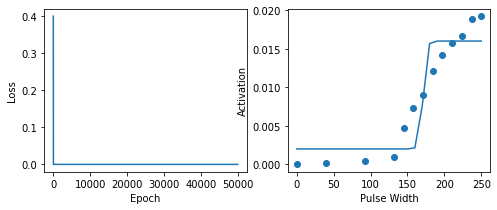

Time to fit plot:  12.523571968078613
Radial1000uA_9_6.csv
Lowest loss: 6.83e-05
a1: 0.001, a2: 0.432, a3: 0.055, a4: 171.057


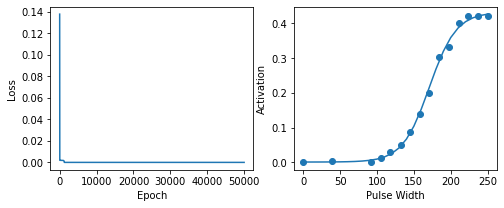

Time to fit plot:  14.533271789550781
Radial1000uA_9_7.csv
Lowest loss: 0.0002675
a1: 0.014, a2: 0.043, a3: 0.28, a4: 131.995


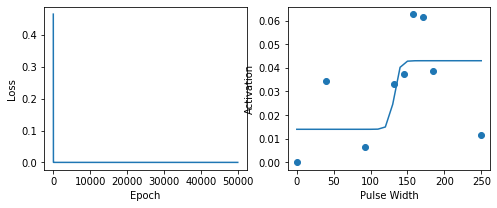

Time to fit plot:  9.067145824432373
Radial1000uA_9_8.csv
Lowest loss: 9.09e-05
a1: 0.007, a2: 0.223, a3: 0.058, a4: 144.925


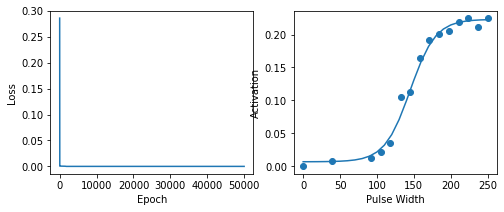

Time to fit plot:  13.999552965164185


In [208]:
import time

losses_single_sigs = []
best_thetas_single_sigs = []

path = '/Volumes/L_MillerLab/limblab/User_folders/Aajan/RecruitmentCurveFigures/Radial1000uA'
filenames = sorted([filename for filename in os.listdir(path)])
for filename in filenames:
    if 'sigmoid' not in filename:
        if filename == 'Radial1000uA_13_1.csv':
            print('Skipping {}'.format(filename))
            continue
            
        start = time.time()
        print(filename)
        
        f = os.path.join(path,filename)
        curve = np.genfromtxt(f, delimiter = ',')
        inds = curve[:,1]>=0
        curve_no_negative = curve[inds,:]
        
        max_val = max(curve_no_negative[:,1])
        halfmax = max_val*0.5
        
        arg = np.argmin(np.absolute(curve[inds,1]-halfmax))
        a4 = curve_no_negative[arg,0]
        
        best_theta, lowest_loss = fit_and_plot(curve[inds,0],curve[inds,1], theta=np.array([0.0,1.0,0.0,a4]), num_epoch = 50000)
        end = time.time()
        print("Time to fit plot: ", end - start)
        losses_single_sigs.append(lowest_loss)
        best_thetas_single_sigs.append(best_theta)

In [209]:
len(losses_single_sigs)

111

### Fitting double sigmoids to Ben's Data (most plots look like single sigmoids)

In [318]:
def double_sig_model(xi, theta):
    a1, a2, a3, a4, a5, a6, a7 = theta[0], theta[1], theta[2], theta[3], theta[4], theta[5], theta[6]
    return a1 + (a2-a1)/(1+math.exp(-a3*(xi-a4))) + (a5-a2)/(1+math.exp(-a6*(xi-a7)))

def compute_square_loss_double_sig(xi, yi, theta):
    loss = (double_sig_model(xi, theta)-yi)**2
    return(loss)

def compute_square_loss_gradient_double_sig(xi, yi, theta):
    a1, a2, a3, a4, a5, a6, a7 = theta[0], theta[1], theta[2], theta[3], theta[4], theta[5], theta[6]
    
    df_da1 = 0#1 - 1/(1+math.exp(-a3*(xi-a4)))
    df_da2 = 1/(1+math.exp(-a3*(xi-a4))) - 1/(1+math.exp(-a6*(xi-a7)))
    df_da3 = (-1*(a2-a1)/((1+math.exp(-a3*(xi-a4)))**2)) * math.exp(-a3*(xi-a4))*(a4-xi)
    df_da4 = (-1*(a2-a1)/((1+math.exp(-a3*(xi-a4)))**2)) * math.exp(-a3*(xi-a4))*a3
    df_da5 = 1/(1+math.exp(-a6*(xi-a7)))
    df_da6 = (-1*(a5-a2)/((1+math.exp(-a6*(xi-a7)))**2)) * math.exp(-a6*(xi-a7))*(a7-xi)
    df_da7 = (-1*(a5-a2)/((1+math.exp(-a6*(xi-a7)))**2)) * math.exp(-a6*(xi-a7))*a6
    
    grad_f = np.array([2*df_da1*(double_sig_model(xi, theta)-yi), 2*df_da2*(double_sig_model(xi, theta)-yi), \
                       2*df_da3*(double_sig_model(xi, theta)-yi), 2*df_da4*(double_sig_model(xi, theta)-yi), \
                       2*df_da5*(double_sig_model(xi, theta)-yi), 2*df_da6*(double_sig_model(xi, theta)-yi), \
                       2*df_da7*(double_sig_model(xi, theta)-yi)])
    return(grad_f)


def stochastic_grad_descent_double_sig(X, y, theta, num_epoch=10000, mod_step_size = 1):
    num_instances = len(X)
    loss_hist = np.zeros(num_epoch)
    theta_hist = []
    
    for n in range(num_epoch):
        loss = 0
        for i in range(len(X)):
            xi = X[i]
            yi = y[i]
            grad_f = compute_square_loss_gradient_double_sig(xi,yi,theta)
            step_size = np.ones(7)*.01
            step_size[3] *= mod_step_size
            step_size[6] *= mod_step_size
            theta -= np.multiply(step_size, grad_f)
            loss += compute_square_loss_double_sig(xi,yi,theta)
        theta_hist.append(theta)
        loss_hist[n]=loss/num_instances
    
    best_theta = theta_hist[np.argmin(loss_hist)]
    
    return(best_theta,loss_hist)

In [313]:
def fit_and_plot_double_sig(X, y, initial_theta, num_epoch=10000, mod_step_size = False):
    best_theta, loss_hist = stochastic_grad_descent_double_sig(X, y, theta=initial_theta, num_epoch=num_epoch, mod_step_size=mod_step_size)
    lowest_loss = round(min(loss_hist),7)
    best_theta = np.round(best_theta,3)
    print('Lowest loss: {}'.format(lowest_loss))
    print('a1: {}, a2: {}, a3: {}, a4: {}, a5: {}, a6: {}, a7: {}'.format(best_theta[0],best_theta[1],best_theta[2],best_theta[3],best_theta[4],best_theta[5],best_theta[6]))
    fig, ax = plt.subplots(nrows = 1, ncols = 2)
    fig.set_size_inches(8, 3)
    ax[0].plot(loss_hist)
    ax[0].set_xlabel('Epoch')
    ax[0].set_ylabel('Loss')
    
    pw_x = np.arange(250)
    preds = [double_sig_model(xi, best_theta) for xi in pw_x]
    ax[1].plot(pw_x, preds)
    ax[1].scatter(X, y)
    ax[1].set_xlabel('Pulse Width')
    ax[1].set_ylabel('Activation')
    
    plt.show()
    
    return(best_theta, lowest_loss)

Radial1000uA_10_1.csv
Lowest loss: 1.51e-05
a1: 0.0, a2: 0.049, a3: 0.15, a4: 129.132, a5: 0.14, a6: 0.046, a7: 166.78


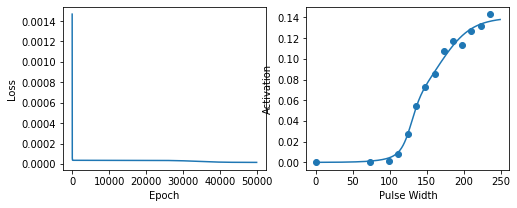

Time to fit plot:  32.87336587905884
Radial1000uA_10_2.csv
Lowest loss: 0.0042698
a1: 0.0, a2: 0.094, a3: 0.021, a4: 141.204, a5: 0.17, a6: 0.023, a7: 68.087


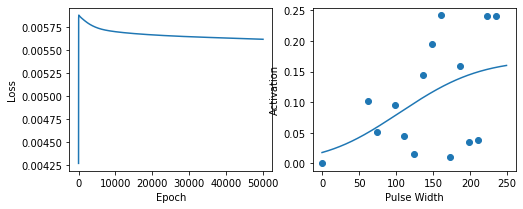

Time to fit plot:  33.901849031448364
Radial1000uA_10_3.csv
Lowest loss: 4.06e-05
a1: 0.0, a2: 0.058, a3: 0.261, a4: 103.162, a5: 0.105, a6: 0.179, a7: 124.38


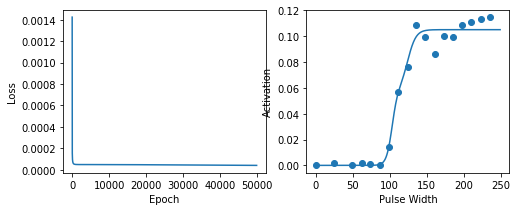

Time to fit plot:  74.39075684547424
Radial1000uA_10_4.csv
Lowest loss: 6.8e-06
a1: 0.0, a2: 0.37, a3: 0.105, a4: 189.086, a5: 0.956, a6: 0.091, a7: 214.361


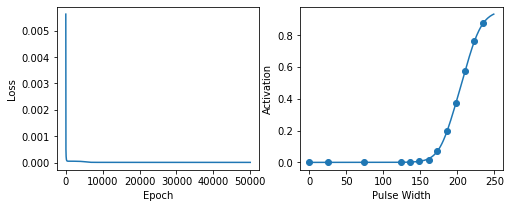

Time to fit plot:  59.76983404159546
Radial1000uA_10_5.csv
Lowest loss: 6e-07
a1: 0.0, a2: -0.029, a3: 0.03, a4: 147.002, a5: 0.019, a6: 0.032, a7: 152.312


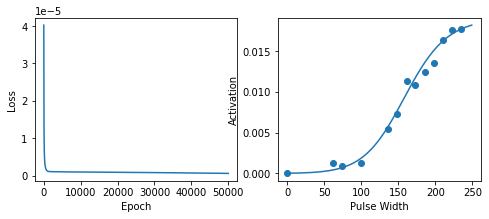

Time to fit plot:  63.17351222038269
Radial1000uA_10_6.csv
Lowest loss: 1.63e-05
a1: 0.0, a2: 0.2, a3: 0.075, a4: 153.259, a5: 0.442, a6: 0.052, a7: 156.029


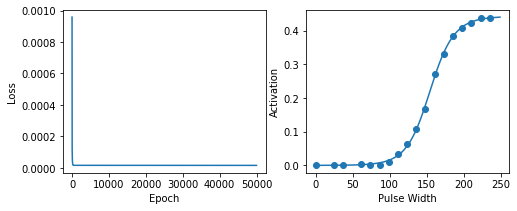

Time to fit plot:  73.29734778404236
Radial1000uA_10_7.csv
Lowest loss: 0.0001378
a1: 0.0, a2: 0.113, a3: 0.046, a4: 160.62, a5: 0.206, a6: 0.055, a7: 140.761


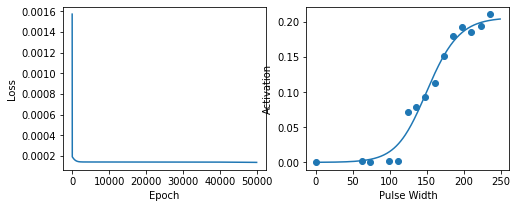

Time to fit plot:  69.4651346206665
Radial1000uA_10_8.csv
Lowest loss: 2.82e-05
a1: 0.0, a2: 0.108, a3: 0.069, a4: 151.129, a5: 0.236, a6: 0.101, a7: 108.283


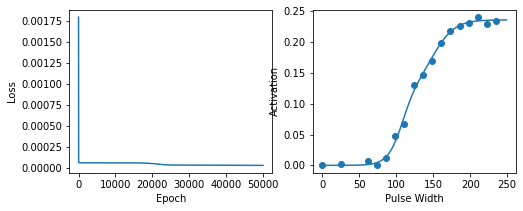

Time to fit plot:  55.292466163635254
Radial1000uA_11_1.csv
Lowest loss: 2.84e-05
a1: 0.0, a2: 0.077, a3: 0.072, a4: 66.845, a5: 0.151, a6: 0.072, a7: 67.189


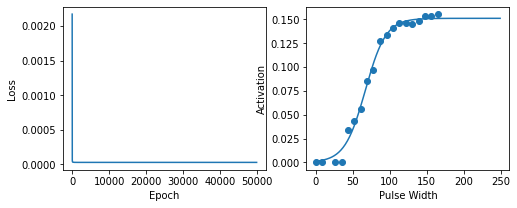

Time to fit plot:  50.73760986328125
Radial1000uA_11_2.csv
Lowest loss: 0.0003549
a1: 0.0, a2: 0.048, a3: 0.013, a4: 162.755, a5: 0.098, a6: 0.013, a7: 162.425


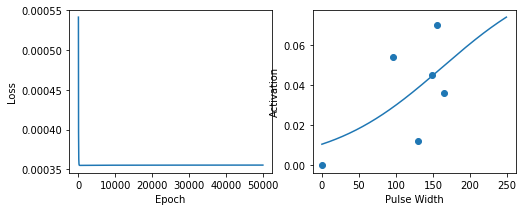

Time to fit plot:  21.27347183227539
Radial1000uA_11_3.csv
Lowest loss: 0.0001412
a1: 0.0, a2: 0.104, a3: 0.08, a4: 77.416, a5: 0.164, a6: 0.536, a7: 35.072


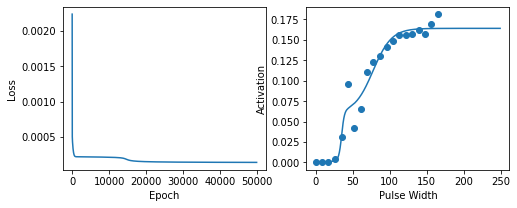

Time to fit plot:  67.87608504295349
Radial1000uA_11_4.csv
Lowest loss: 2e-07
a1: 0.0, a2: 0.005, a3: 0.053, a4: 95.648, a5: 0.004, a6: 0.016, a7: 96.011


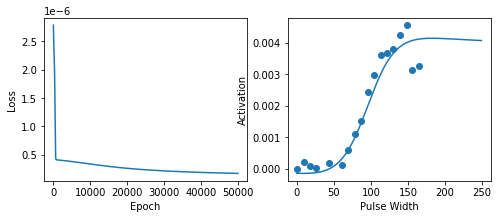

Time to fit plot:  48.28670001029968
Radial1000uA_11_5.csv
Lowest loss: 3.4e-06
a1: 0.0, a2: 0.018, a3: 0.056, a4: 96.319, a5: 0.045, a6: 0.056, a7: 96.341


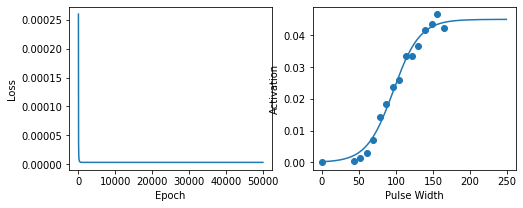

Time to fit plot:  49.7354691028595
Radial1000uA_11_6.csv
Lowest loss: 7.01e-05
a1: 0.0, a2: 0.465, a3: 0.216, a4: 62.272, a5: 0.527, a6: 0.039, a7: 125.758


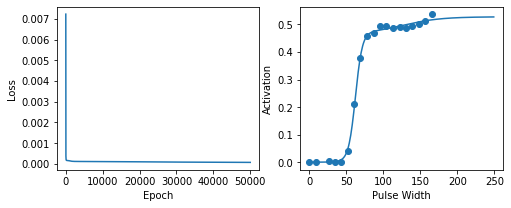

Time to fit plot:  59.42500591278076
Radial1000uA_11_7.csv
Lowest loss: 5.45e-05
a1: 0.0, a2: 0.082, a3: 0.222, a4: 70.451, a5: 0.263, a6: 0.041, a7: 106.675


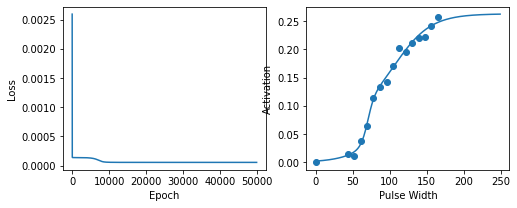

Time to fit plot:  46.721513986587524
Radial1000uA_11_8.csv
Lowest loss: 0.0002224
a1: 0.0, a2: 0.257, a3: 0.101, a4: 52.632, a5: 0.514, a6: 0.87, a7: 79.651


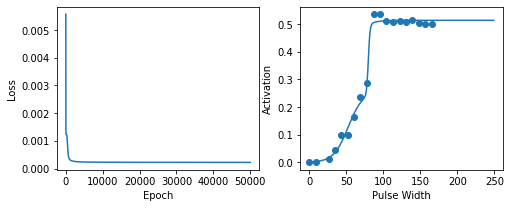

Time to fit plot:  51.07885193824768
Radial1000uA_12_1.csv
Lowest loss: 8.22e-05
a1: 0.0, a2: 0.165, a3: 0.158, a4: 34.823, a5: 0.547, a6: 0.154, a7: 125.425


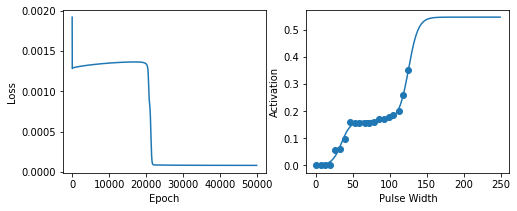

Time to fit plot:  61.40603280067444
Radial1000uA_12_2.csv
Lowest loss: 0.0016087
a1: 0.0, a2: 0.147, a3: 0.101, a4: 36.464, a5: 0.461, a6: 0.242, a7: 106.652


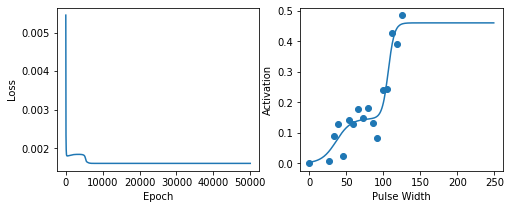

Time to fit plot:  50.10268974304199
Radial1000uA_12_3.csv
Lowest loss: 0.0002316
a1: 0.0, a2: 0.428, a3: 0.108, a4: 94.774, a5: 0.605, a6: 0.146, a7: 27.711


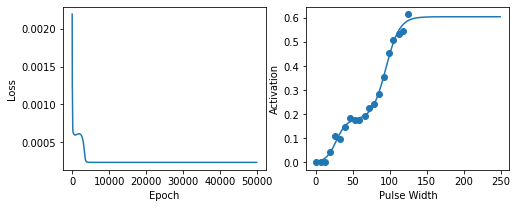

Time to fit plot:  60.35859131813049
Radial1000uA_12_4.csv
Lowest loss: 3.1e-06
a1: 0.0, a2: -0.017, a3: -0.003, a4: 111.985, a5: 0.009, a6: 0.003, a7: 111.956


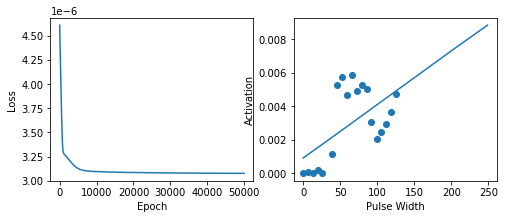

Time to fit plot:  65.1623899936676
Radial1000uA_12_5.csv
Lowest loss: 4.09e-05
a1: 0.0, a2: 0.019, a3: 0.042, a4: 65.801, a5: 0.065, a6: 0.049, a7: 59.062


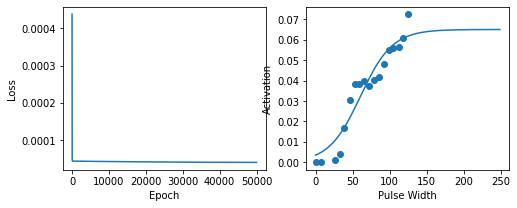

Time to fit plot:  55.11900496482849
Radial1000uA_12_6.csv
Lowest loss: 0.0001073
a1: 0.0, a2: 0.425, a3: 0.055, a4: 86.74, a5: 0.831, a6: 0.53, a7: 38.013


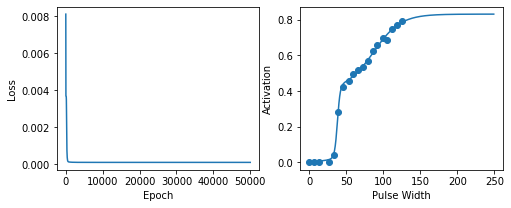

Time to fit plot:  54.040531873703
Radial1000uA_12_7.csv
Lowest loss: 0.0002594
a1: 0.0, a2: 0.719, a3: 0.064, a4: 104.952, a5: 0.869, a6: 0.679, a7: 39.917


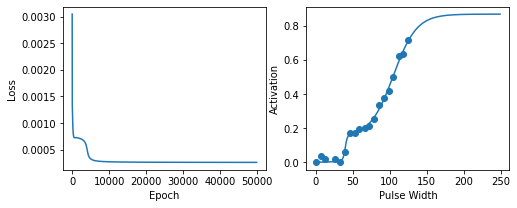

Time to fit plot:  57.766685962677
Radial1000uA_12_8.csv
Lowest loss: 0.0005969
a1: 0.0, a2: 0.525, a3: 0.287, a4: 34.834, a5: 0.867, a6: 0.259, a7: 101.621


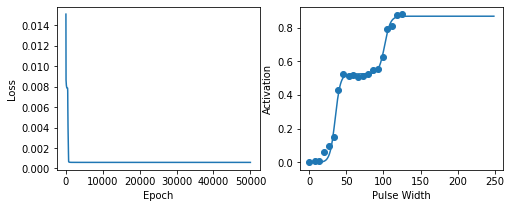

Time to fit plot:  64.55073094367981
Skipping Radial1000uA_13_1.csv
Radial1000uA_13_2.csv
Lowest loss: 0.0004756
a1: 0.0, a2: 0.224, a3: 0.332, a4: 26.552, a5: 0.778, a6: 0.208, a7: 46.754


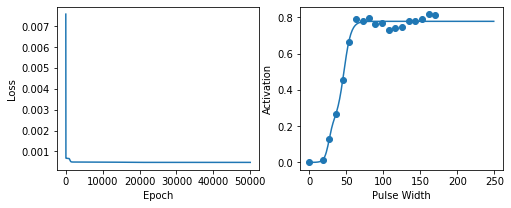

Time to fit plot:  56.724100828170776
Radial1000uA_13_3.csv
Lowest loss: 0.0002394
a1: 0.0, a2: 0.695, a3: 0.054, a4: 145.269, a5: 1.096, a6: 0.146, a7: 45.107


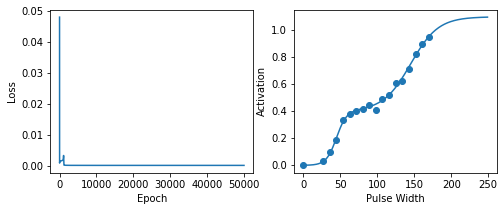

Time to fit plot:  52.843201637268066
Radial1000uA_13_4.csv
Lowest loss: 0.0
a1: 0.0, a2: 0.004, a3: 0.005, a4: 98.0, a5: 0.001, a6: -0.001, a7: 98.0


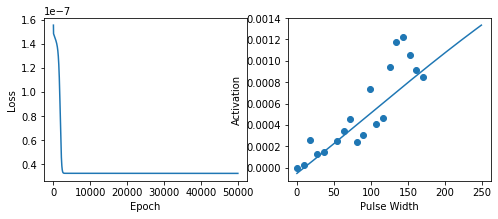

Time to fit plot:  63.57679533958435
Radial1000uA_13_5.csv
Lowest loss: 0.0004531
a1: 0.0, a2: 0.094, a3: 0.022, a4: 127.533, a5: 0.2, a6: 0.035, a7: 106.663


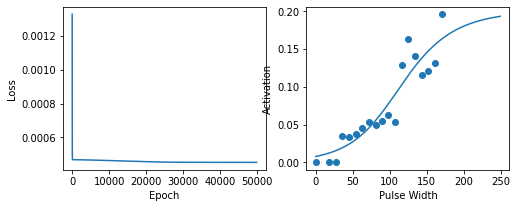

Time to fit plot:  64.23592877388
Radial1000uA_13_6.csv
Lowest loss: 0.0016506
a1: 0.0, a2: 0.715, a3: 0.367, a4: 40.951, a5: 0.866, a6: 0.208, a7: 62.286


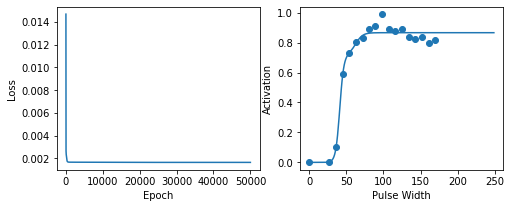

Time to fit plot:  61.821115255355835
Radial1000uA_13_7.csv
Lowest loss: 0.0010566
a1: 0.0, a2: 0.682, a3: 0.157, a4: 45.601, a5: 0.926, a6: 0.734, a7: 97.669


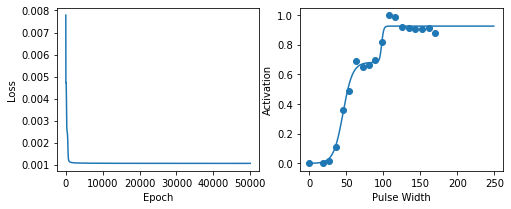

Time to fit plot:  75.32365322113037
Radial1000uA_13_8.csv
Lowest loss: 0.0019269
a1: 0.0, a2: 0.271, a3: 0.324, a4: 31.094, a5: 0.837, a6: 0.158, a7: 44.789


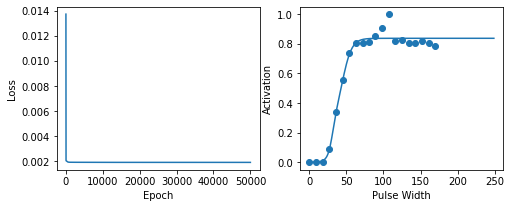

Time to fit plot:  66.36609888076782
Radial1000uA_14_1.csv
Lowest loss: 0.0001354
a1: 0.0, a2: 0.253, a3: 0.295, a4: 40.056, a5: 0.338, a6: 0.374, a7: 66.953


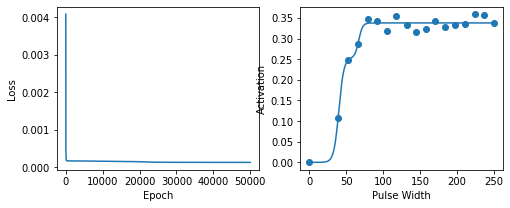

Time to fit plot:  59.94779586791992
Radial1000uA_14_2.csv
Lowest loss: 0.0001983
a1: 0.0, a2: 0.488, a3: 0.368, a4: 31.183, a5: 0.769, a6: 0.389, a7: 49.789


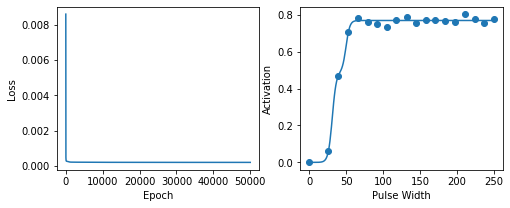

Time to fit plot:  69.09476113319397
Radial1000uA_14_3.csv
Lowest loss: 3.44e-05
a1: 0.0, a2: 0.34, a3: 0.215, a4: 35.571, a5: 0.39, a6: 0.017, a7: 77.006


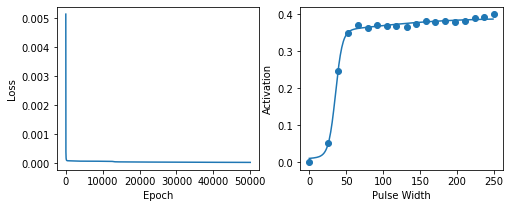

Time to fit plot:  86.17768907546997
Radial1000uA_14_4.csv
Lowest loss: 0.0102323
a1: 0.0, a2: 0.077, a3: 0.629, a4: 39.863, a5: 0.406, a6: -0.662, a7: 132.483


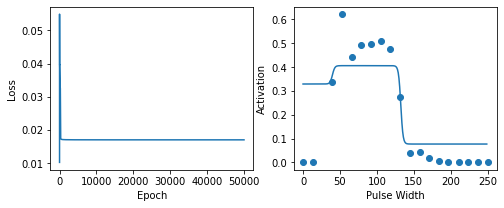

Time to fit plot:  77.36571502685547
Radial1000uA_14_5.csv
Lowest loss: 2.02e-05
a1: 0.0, a2: 0.056, a3: 0.011, a4: 63.938, a5: 0.036, a6: -0.172, a7: 42.991


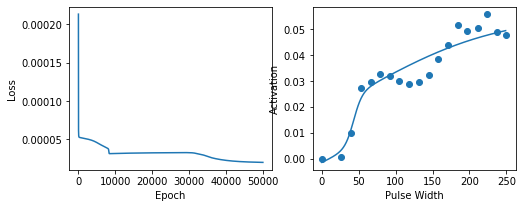

Time to fit plot:  89.95491003990173
Radial1000uA_14_6.csv
Lowest loss: 0.0001092
a1: 0.0, a2: 0.689, a3: 0.174, a4: 42.843, a5: 0.867, a6: 0.036, a7: 128.677


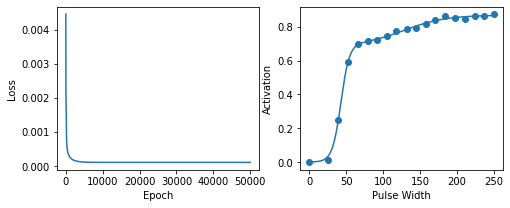

Time to fit plot:  81.02490592002869
Radial1000uA_14_7.csv
Lowest loss: 0.0003156
a1: 0.0, a2: 0.415, a3: 0.393, a4: 37.873, a5: 0.692, a6: 0.156, a7: 31.356


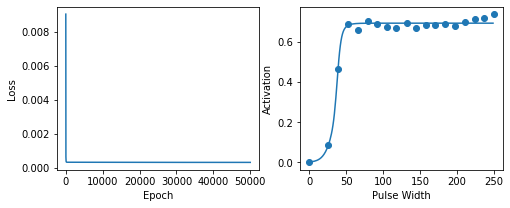

Time to fit plot:  60.61173701286316
Radial1000uA_14_8.csv
Lowest loss: 0.0001408
a1: 0.0, a2: 0.766, a3: 0.114, a4: 35.147, a5: 0.832, a6: 0.059, a7: 69.342


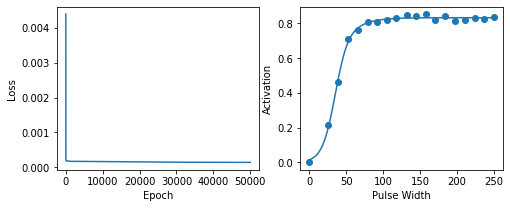

Time to fit plot:  84.87239217758179
Radial1000uA_15_1.csv
Lowest loss: 4.47e-05
a1: 0.0, a2: 0.182, a3: 0.466, a4: 50.145, a5: 0.291, a6: 0.45, a7: 37.158


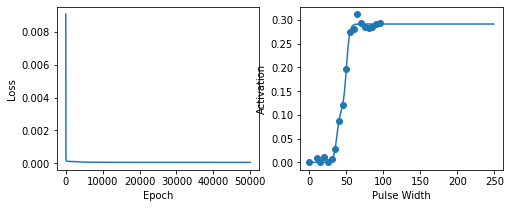

Time to fit plot:  69.13034391403198
Radial1000uA_15_2.csv
Lowest loss: 0.0002381
a1: 0.0, a2: 0.402, a3: 0.989, a4: 44.005, a5: 0.67, a6: 0.437, a7: 33.647


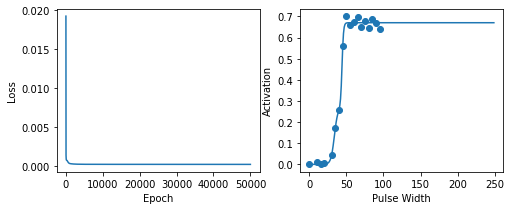

Time to fit plot:  61.397915840148926
Radial1000uA_15_3.csv
Lowest loss: 9.93e-05
a1: 0.0, a2: 0.248, a3: 0.151, a4: 38.107, a5: 0.348, a6: 0.987, a7: 42.081


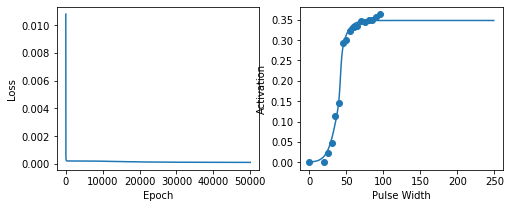

Time to fit plot:  51.65320110321045
Radial1000uA_15_4.csv
Lowest loss: 1e-06
a1: 0.0, a2: 0.347, a3: 0.317, a4: 89.314, a5: 0.776, a6: 0.518, a7: 81.304


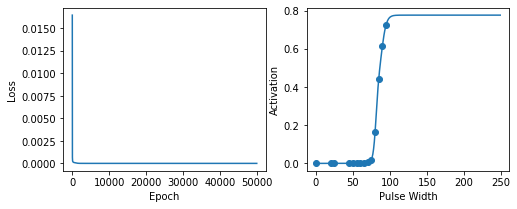

Time to fit plot:  56.59639096260071
Radial1000uA_15_5.csv
Lowest loss: 2.2e-06
a1: 0.0, a2: 0.003, a3: 0.057, a4: 50.111, a5: 0.023, a6: 0.2, a7: 48.672


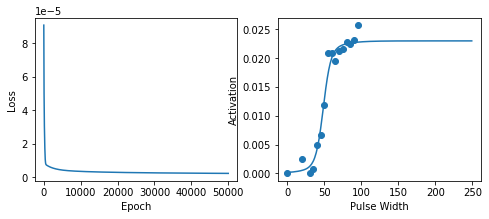

Time to fit plot:  68.22952389717102
Radial1000uA_15_6.csv
Lowest loss: 3.88e-05
a1: 0.0, a2: 0.427, a3: 0.403, a4: 44.66, a5: 0.752, a6: 0.076, a7: 99.988


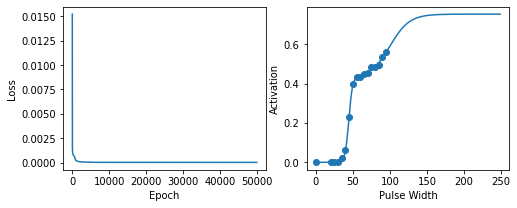

Time to fit plot:  77.48283290863037
Radial1000uA_15_7.csv
Lowest loss: 0.0003324
a1: 0.0, a2: 0.403, a3: 0.393, a4: 40.403, a5: 0.699, a6: 0.279, a7: 37.273


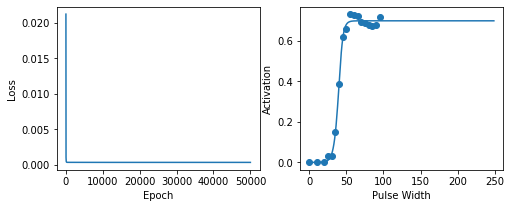

Time to fit plot:  90.9701759815216
Radial1000uA_15_8.csv
Lowest loss: 0.0002888
a1: 0.0, a2: 0.671, a3: 0.204, a4: 39.585, a5: 0.735, a6: 0.191, a7: 78.491


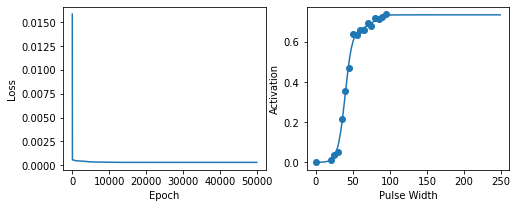

Time to fit plot:  75.67068123817444
Radial1000uA_16_1.csv
Lowest loss: 3.26e-05
a1: 0.0, a2: 0.243, a3: 0.21, a4: 74.734, a5: 0.274, a6: 0.023, a7: 84.391


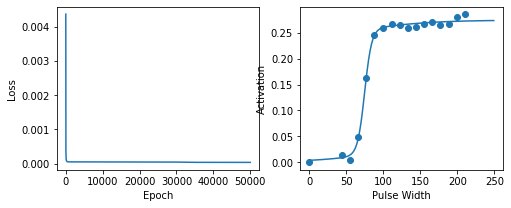

Time to fit plot:  52.76664900779724
Radial1000uA_16_2.csv
Lowest loss: 0.0005664
a1: 0.0, a2: 0.457, a3: 0.595, a4: 65.539, a5: 0.672, a6: 0.034, a7: 49.575


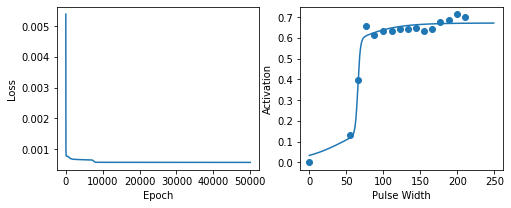

Time to fit plot:  45.333600759506226
Radial1000uA_16_3.csv
Lowest loss: 3.45e-05
a1: 0.0, a2: 0.197, a3: 0.142, a4: 54.423, a5: 0.332, a6: 0.386, a7: 73.687


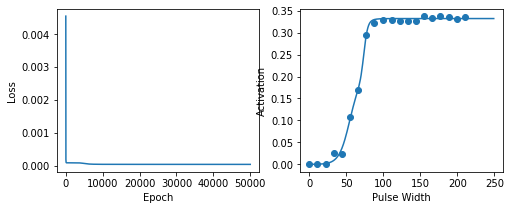

Time to fit plot:  56.58653283119202
Radial1000uA_16_4.csv
Lowest loss: 1.4e-05
a1: 0.0, a2: 0.178, a3: 0.082, a4: 178.414, a5: 0.255, a6: 0.318, a7: 194.55


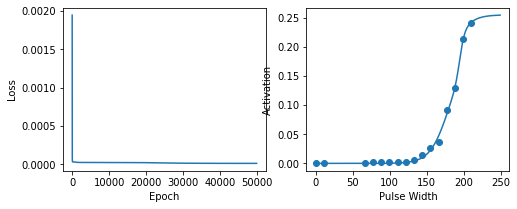

Time to fit plot:  47.03521800041199
Radial1000uA_16_5.csv
Lowest loss: 2.3e-06
a1: 0.0, a2: -0.004, a3: 0.108, a4: 78.345, a5: 0.026, a6: 0.197, a7: 72.26


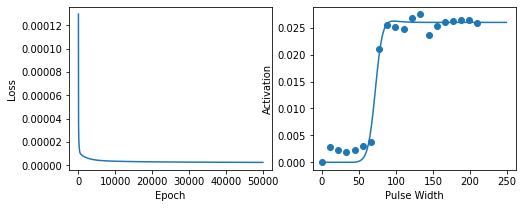

Time to fit plot:  68.22398519515991
Radial1000uA_16_6.csv
Lowest loss: 3.05e-05
a1: 0.0, a2: 0.451, a3: 0.275, a4: 67.535, a5: 0.64, a6: 0.031, a7: 175.706


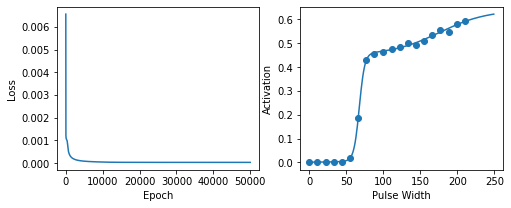

Time to fit plot:  65.65702295303345
Radial1000uA_16_7.csv
Lowest loss: 0.0003414
a1: 0.0, a2: 0.354, a3: 0.796, a4: 60.772, a5: 0.702, a6: 0.124, a7: 62.783


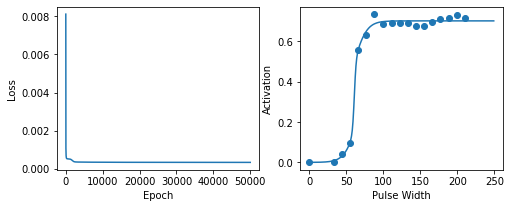

Time to fit plot:  62.49519419670105
Radial1000uA_16_8.csv
Lowest loss: 0.0002897
a1: 0.0, a2: 0.57, a3: 0.279, a4: 62.691, a5: 0.77, a6: 0.028, a7: 111.057


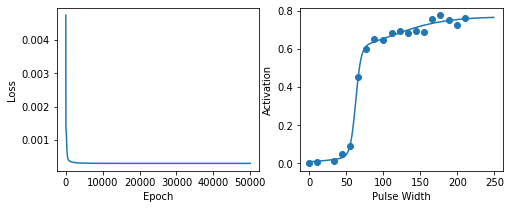

Time to fit plot:  60.430046796798706
Radial1000uA_17_1.csv
Lowest loss: 1.45e-05
a1: 0.0, a2: 0.148, a3: 0.057, a4: 149.722, a5: 0.295, a6: 0.098, a7: 154.792


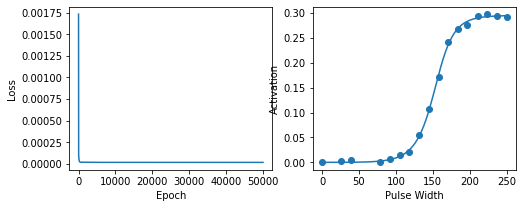

Time to fit plot:  51.40901803970337
Radial1000uA_17_2.csv
Lowest loss: 8.24e-05
a1: 0.0, a2: 0.191, a3: 0.396, a4: 144.401, a5: 0.642, a6: 0.292, a7: 116.154


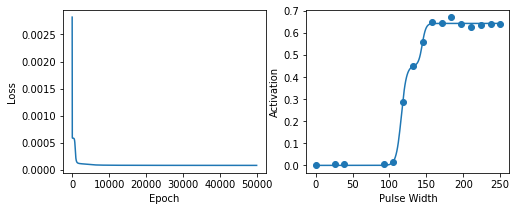

Time to fit plot:  51.122092962265015
Radial1000uA_17_3.csv
Lowest loss: 2.42e-05
a1: 0.0, a2: 0.206, a3: 0.249, a4: 135.912, a5: 0.34, a6: 0.023, a7: 144.22


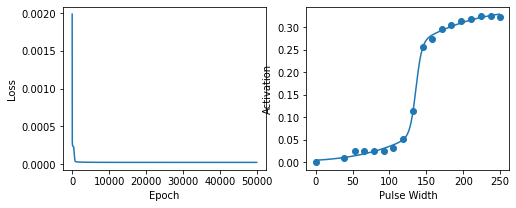

Time to fit plot:  63.67151093482971
Radial1000uA_17_4.csv
Lowest loss: 0.0
a1: 0.0, a2: 0.003, a3: 0.021, a4: 158.031, a5: 0.002, a6: 0.008, a7: 158.0


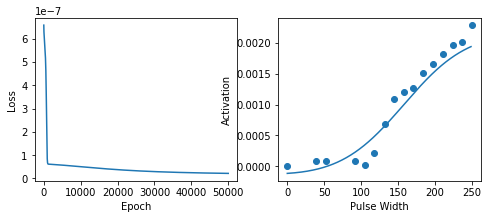

Time to fit plot:  62.60827684402466
Radial1000uA_17_5.csv
Lowest loss: 4e-07
a1: 0.0, a2: -0.0, a3: 0.058, a4: 145.326, a5: 0.023, a6: 0.109, a7: 147.213


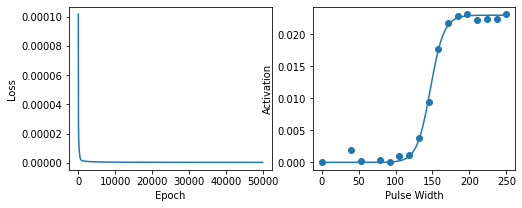

Time to fit plot:  58.346299171447754
Radial1000uA_17_6.csv
Lowest loss: 1.2e-05
a1: 0.0, a2: 0.429, a3: 0.134, a4: 125.178, a5: 0.484, a6: 0.04, a7: 163.378


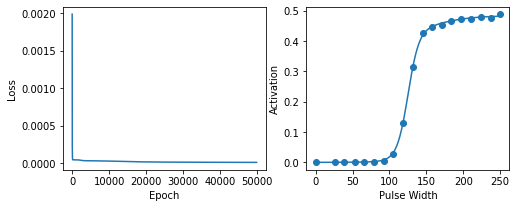

Time to fit plot:  71.52944612503052
Radial1000uA_17_7.csv
Lowest loss: 0.0003939
a1: 0.0, a2: 0.458, a3: 0.053, a4: 137.854, a5: 0.732, a6: 0.477, a7: 117.64


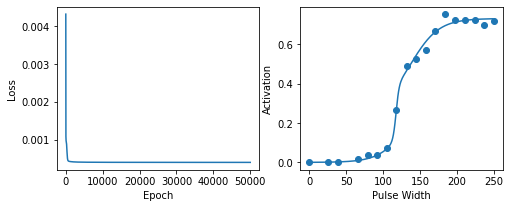

Time to fit plot:  80.63952279090881
Radial1000uA_17_8.csv
Lowest loss: 0.000278
a1: 0.0, a2: 0.18, a3: 0.425, a4: 120.236, a5: 0.662, a6: 0.063, a7: 129.479


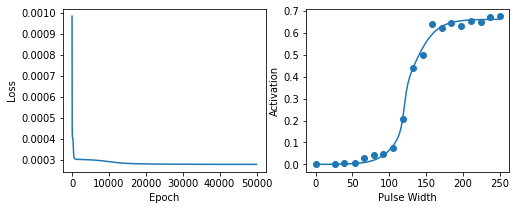

Time to fit plot:  86.45157766342163
Radial1000uA_4_1.csv
Lowest loss: 6.29e-05
a1: 0.0, a2: 0.317, a3: 0.198, a4: 55.01, a5: 0.428, a6: 0.04, a7: 124.967


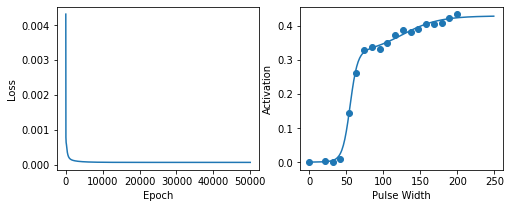

Time to fit plot:  61.177403926849365
Radial1000uA_4_2.csv
Lowest loss: 0.0010453
a1: 0.0, a2: 0.452, a3: 0.118, a4: 44.264, a5: 0.508, a6: 0.613, a7: 90.443


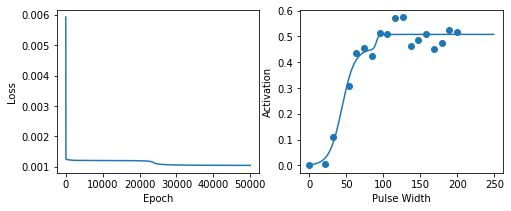

Time to fit plot:  57.966909885406494
Radial1000uA_4_3.csv
Lowest loss: 2.76e-05
a1: 0.0, a2: 0.354, a3: 0.331, a4: 52.401, a5: 0.478, a6: 0.021, a7: 114.523


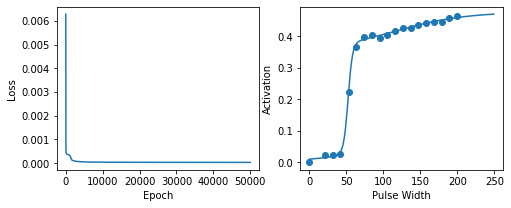

Time to fit plot:  62.057693004608154
Radial1000uA_4_4.csv
Lowest loss: 0.0013245
a1: 0.0, a2: 0.57, a3: 0.616, a4: 51.495, a5: 0.713, a6: 0.158, a7: 63.109


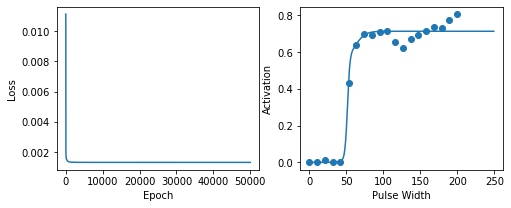

Time to fit plot:  66.33343720436096
Radial1000uA_4_5.csv
Lowest loss: 2.4e-06
a1: 0.0, a2: 0.006, a3: 0.055, a4: 63.939, a5: 0.041, a6: 0.248, a7: 56.921


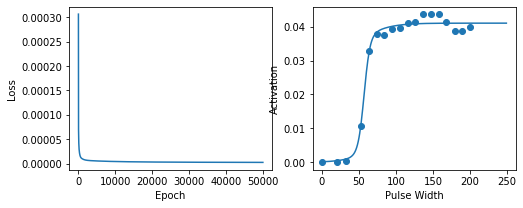

Time to fit plot:  59.22390699386597
Radial1000uA_4_6.csv
Lowest loss: 5.7e-06
a1: 0.0, a2: 0.459, a3: 0.357, a4: 55.108, a5: 0.593, a6: 0.037, a7: 161.234


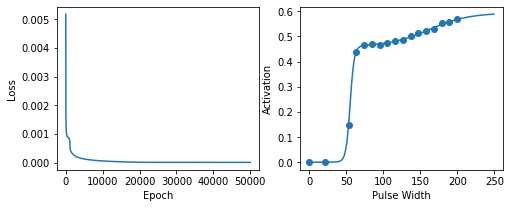

Time to fit plot:  56.405190229415894
Radial1000uA_4_7.csv
Lowest loss: 6.25e-05
a1: 0.0, a2: 0.615, a3: 0.427, a4: 51.248, a5: 0.752, a6: 0.112, a7: 62.612


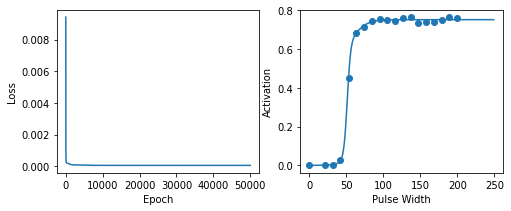

Time to fit plot:  59.28378701210022
Radial1000uA_4_8.csv
Lowest loss: 6.04e-05
a1: 0.0, a2: 0.621, a3: 0.257, a4: 52.942, a5: 0.68, a6: 0.095, a7: 139.032


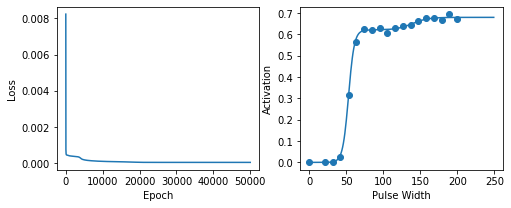

Time to fit plot:  47.54266810417175
Radial1000uA_5_1.csv
Lowest loss: 2.46e-05
a1: 0.0, a2: 0.292, a3: 0.33, a4: 34.241, a5: 0.4, a6: 0.161, a7: 72.632


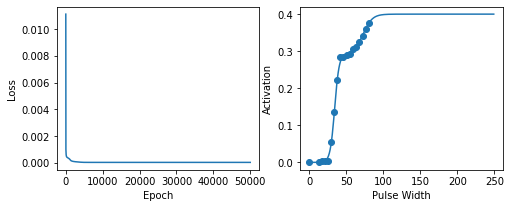

Time to fit plot:  43.244709968566895
Radial1000uA_5_2.csv
Lowest loss: 0.0063172
a1: 0.0, a2: 0.438, a3: 1.029, a4: 33.811, a5: 0.507, a6: 0.999, a7: 10.035


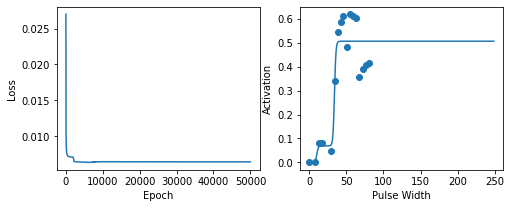

Time to fit plot:  42.59029197692871
Radial1000uA_5_3.csv
Lowest loss: 4.55e-05
a1: 0.0, a2: 0.352, a3: 0.442, a4: 32.95, a5: 0.451, a6: 0.044, a7: 51.779


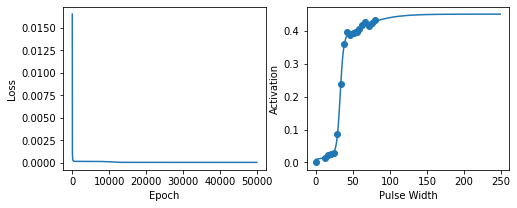

Time to fit plot:  44.5458881855011
Radial1000uA_5_4.csv
Lowest loss: 0.0002934
a1: 0.0, a2: 0.633, a3: 0.698, a4: 32.254, a5: 0.906, a6: 0.284, a7: 64.485


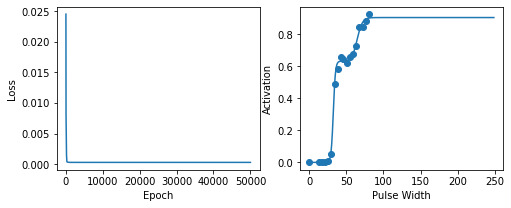

Time to fit plot:  46.30854415893555
Radial1000uA_5_5.csv
Lowest loss: 4.5e-06
a1: 0.0, a2: -0.024, a3: 0.144, a4: 35.596, a5: 0.039, a6: 0.245, a7: 35.345


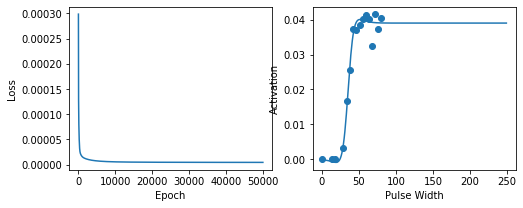

Time to fit plot:  40.88021492958069
Radial1000uA_5_6.csv
Lowest loss: 0.0006763
a1: 0.0, a2: 0.199, a3: 1.1, a4: 71.756, a5: 0.691, a6: 0.663, a7: 34.958


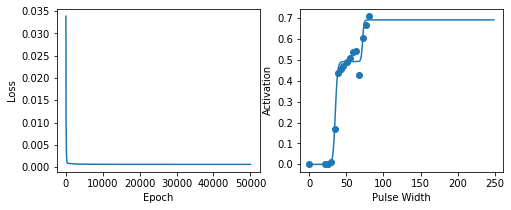

Time to fit plot:  40.30219912528992
Radial1000uA_5_7.csv
Lowest loss: 0.0007592
a1: 0.0, a2: 0.375, a3: 0.741, a4: 28.195, a5: 0.722, a6: 0.579, a7: 37.559


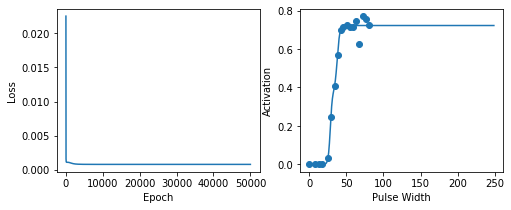

Time to fit plot:  46.138344049453735
Radial1000uA_5_8.csv
Lowest loss: 0.0012017
a1: 0.0, a2: 0.611, a3: 0.326, a4: 34.276, a5: 0.707, a6: 1.213, a7: 71.15


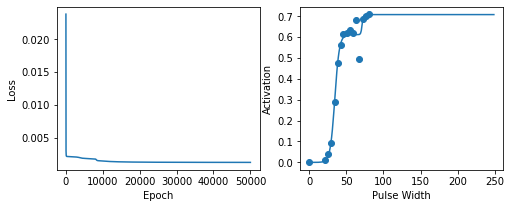

Time to fit plot:  38.21815299987793
Radial1000uA_6_1.csv
Lowest loss: 0.000112
a1: 0.0, a2: 0.252, a3: 0.231, a4: 46.848, a5: 0.373, a6: 0.227, a7: 39.557


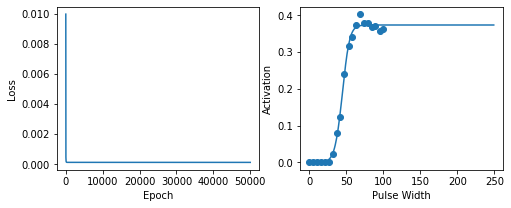

Time to fit plot:  46.66439127922058
Radial1000uA_6_2.csv
Lowest loss: 0.0011945
a1: 0.0, a2: 0.502, a3: 0.315, a4: 43.92, a5: 0.592, a6: 1.255, a7: 17.145


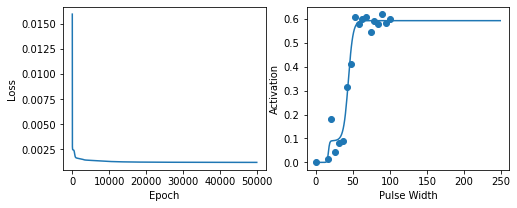

Time to fit plot:  60.57006287574768
Radial1000uA_6_3.csv
Lowest loss: 7.67e-05
a1: 0.0, a2: 0.333, a3: 0.459, a4: 42.386, a5: 0.472, a6: 0.061, a7: 54.086


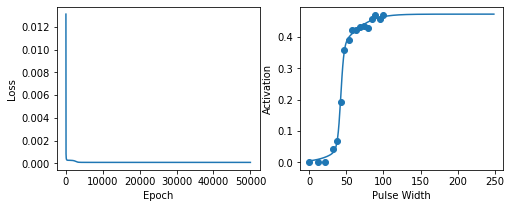

Time to fit plot:  53.85950803756714
Radial1000uA_6_4.csv
Lowest loss: 0.0008443
a1: 0.0, a2: 0.783, a3: 0.593, a4: 30.66, a5: 0.942, a6: 0.135, a7: 46.946


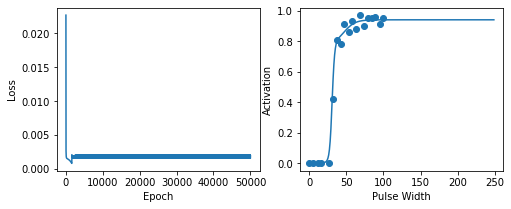

Time to fit plot:  50.108814001083374
Radial1000uA_6_5.csv
Lowest loss: 1.37e-05
a1: 0.0, a2: 0.009, a3: 0.091, a4: 48.355, a5: 0.058, a6: 0.435, a7: 44.564


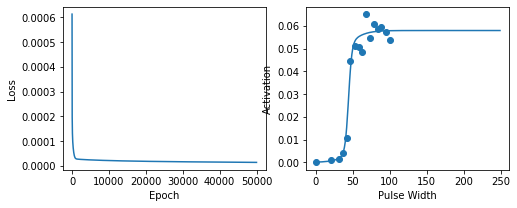

Time to fit plot:  41.80570697784424
Radial1000uA_6_6.csv
Lowest loss: 0.0005452
a1: 0.0, a2: 0.632, a3: 0.522, a4: 35.36, a5: 0.873, a6: 0.109, a7: 47.363


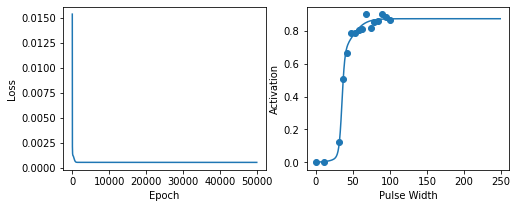

Time to fit plot:  40.34850788116455
Radial1000uA_6_7.csv
Lowest loss: 0.0002002
a1: 0.0, a2: 0.527, a3: 0.444, a4: 40.096, a5: 0.751, a6: 0.346, a7: 57.919


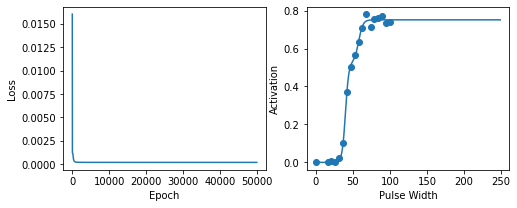

Time to fit plot:  44.0671329498291
Radial1000uA_6_8.csv
Lowest loss: 0.0001385
a1: 0.0, a2: 0.451, a3: 0.254, a4: 38.507, a5: 0.691, a6: 0.878, a7: 42.677


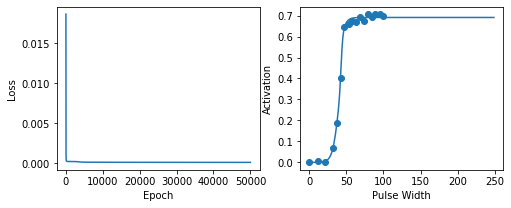

Time to fit plot:  42.21195602416992
Radial1000uA_7_1.csv
Lowest loss: 1.19e-05
a1: 0.0, a2: 0.117, a3: 0.459, a4: 29.723, a5: 0.173, a6: 0.134, a7: 72.608


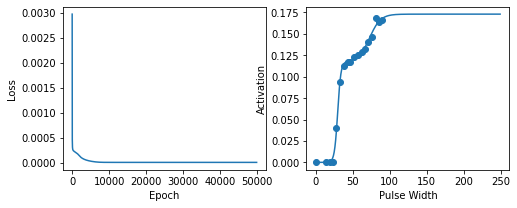

Time to fit plot:  53.54292297363281
Radial1000uA_7_2.csv
Lowest loss: 0.0015232
a1: 0.0, a2: 0.173, a3: 0.575, a4: 17.891, a5: 0.681, a6: 0.245, a7: 91.174


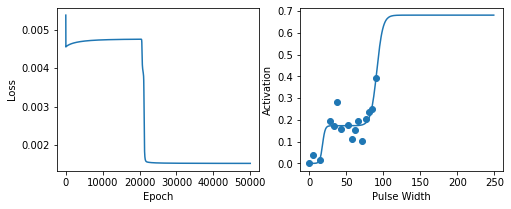

Time to fit plot:  42.00157690048218
Radial1000uA_7_3.csv
Lowest loss: 7.1e-05
a1: 0.0, a2: 0.109, a3: 0.877, a4: 28.748, a5: 0.704, a6: 0.192, a7: 92.973


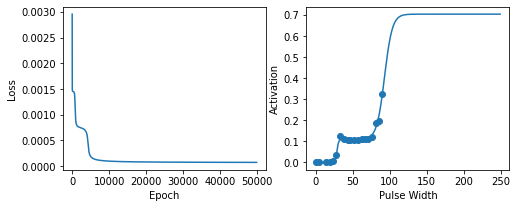

Time to fit plot:  53.05547118186951
Radial1000uA_7_4.csv
Lowest loss: 0.0003091
a1: 0.0, a2: 0.492, a3: 0.981, a4: 32.254, a5: 0.981, a6: 0.606, a7: 23.143


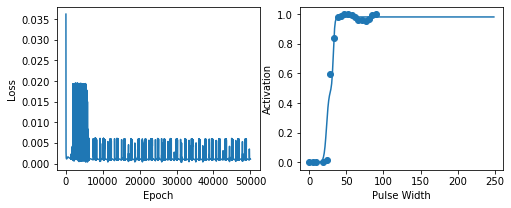

Time to fit plot:  48.96354079246521
Radial1000uA_7_5.csv
Lowest loss: 3.7e-06
a1: 0.0, a2: -0.02, a3: 0.009, a4: 47.017, a5: 0.027, a6: 0.041, a7: 44.825


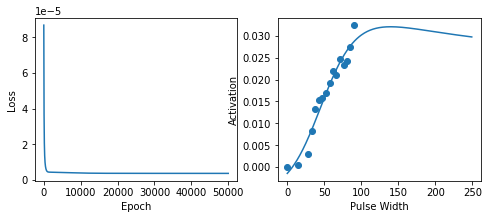

Time to fit plot:  40.0775830745697
Radial1000uA_7_6.csv
Lowest loss: 0.0001127
a1: 0.0, a2: 0.341, a3: 0.18, a4: 76.454, a5: 0.793, a6: 0.271, a7: 36.457


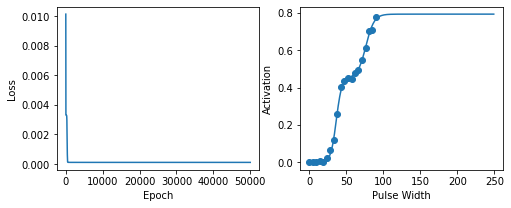

Time to fit plot:  49.22970390319824
Radial1000uA_7_7.csv
Lowest loss: 0.0001974
a1: 0.0, a2: 0.14, a3: 0.251, a4: 27.675, a5: 0.814, a6: 0.114, a7: 92.044


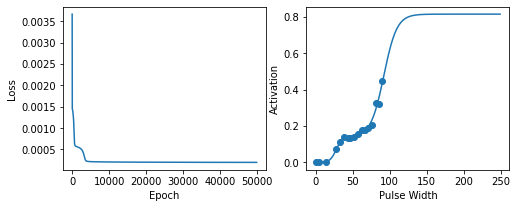

Time to fit plot:  41.90095520019531
Radial1000uA_7_8.csv
Lowest loss: 0.0004231
a1: 0.0, a2: 0.703, a3: 0.089, a4: 95.113, a5: 0.915, a6: 0.409, a7: 28.602


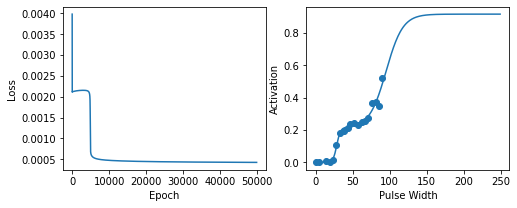

Time to fit plot:  46.50919699668884
Radial1000uA_8_1.csv
Lowest loss: 1.66e-05
a1: 0.0, a2: 0.094, a3: 0.393, a4: 49.909, a5: 0.162, a6: 0.03, a7: 115.637


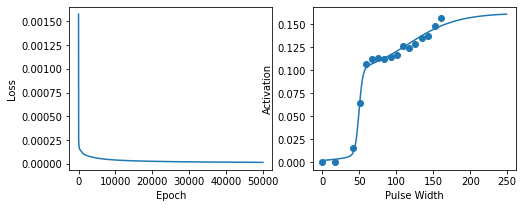

Time to fit plot:  41.932735204696655
Radial1000uA_8_2.csv
Lowest loss: 0.0037571
a1: 0.0, a2: 0.171, a3: 1.266, a4: 46.356, a5: 0.242, a6: -0.08, a7: 45.992


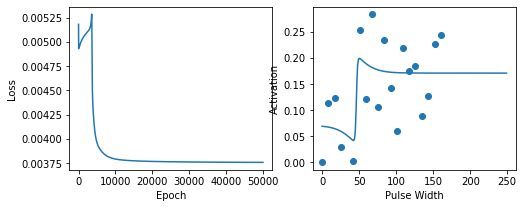

Time to fit plot:  46.75039076805115
Radial1000uA_8_3.csv
Lowest loss: 2e-05
a1: 0.0, a2: -0.072, a3: 0.302, a4: 49.237, a5: 0.125, a6: 0.451, a7: 46.202


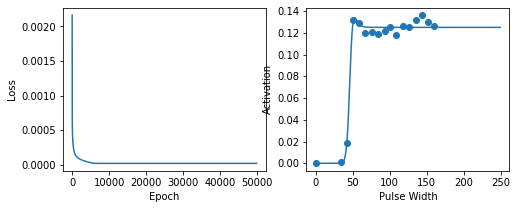

Time to fit plot:  49.31375002861023
Radial1000uA_8_4.csv
Lowest loss: 0.0001825
a1: 0.0, a2: 0.804, a3: 0.277, a4: 55.329, a5: 0.972, a6: 0.457, a7: 69.095


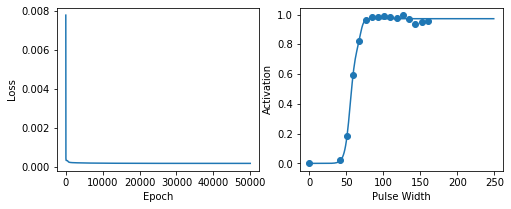

Time to fit plot:  43.28811311721802
Radial1000uA_8_5.csv
Lowest loss: 3.8e-06
a1: 0.0, a2: 0.008, a3: 0.05, a4: 77.688, a5: 0.031, a6: 0.047, a7: 78.819


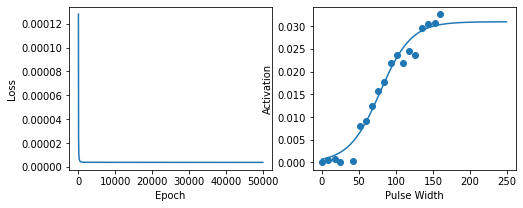

Time to fit plot:  48.71638298034668
Radial1000uA_8_6.csv
Lowest loss: 0.0001007
a1: 0.0, a2: 0.438, a3: 0.162, a4: 61.201, a5: 0.705, a6: 0.094, a7: 164.638


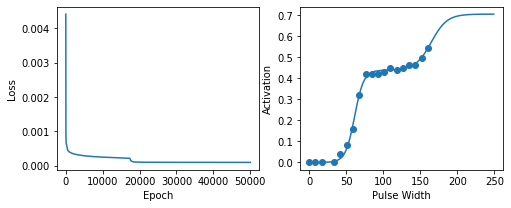

Time to fit plot:  48.90061593055725
Radial1000uA_8_7.csv
Lowest loss: 2.12e-05
a1: 0.0, a2: 0.116, a3: 0.413, a4: 46.993, a5: 0.221, a6: 0.04, a7: 138.476


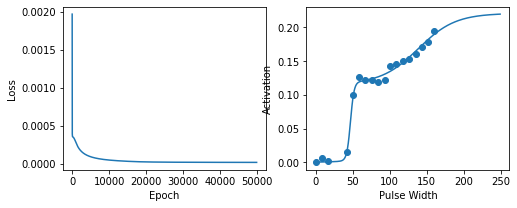

Time to fit plot:  46.074126958847046
Radial1000uA_8_8.csv
Lowest loss: 3.54e-05
a1: 0.0, a2: 0.19, a3: 0.299, a4: 45.479, a5: 0.243, a6: 0.04, a7: 88.641


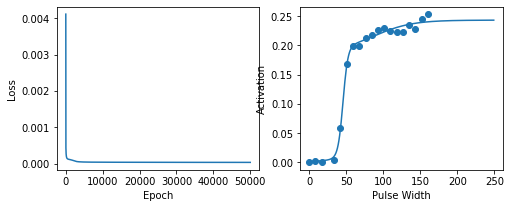

Time to fit plot:  48.41689205169678
Radial1000uA_9_1.csv
Lowest loss: 9.1e-06
a1: 0.0, a2: 0.056, a3: 0.171, a4: 139.468, a5: 0.144, a6: 0.05, a7: 174.645


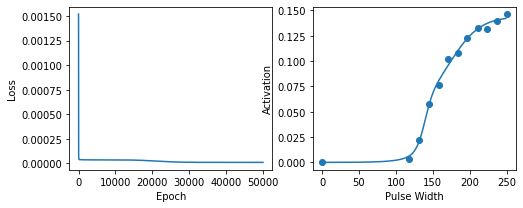

Time to fit plot:  27.509382247924805
Radial1000uA_9_2.csv
Lowest loss: 0.0022969
a1: 0.0, a2: 0.101, a3: 0.601, a4: 142.171, a5: 0.166, a6: -0.805, a7: 204.364


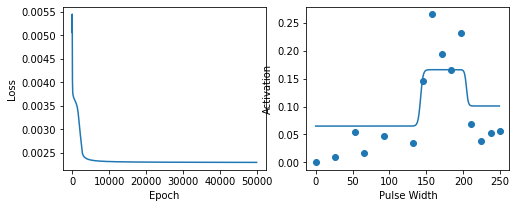

Time to fit plot:  36.54802417755127
Radial1000uA_9_3.csv
Lowest loss: 4.91e-05
a1: 0.0, a2: 0.071, a3: 0.629, a4: 136.925, a5: 0.107, a6: 0.359, a7: 110.396


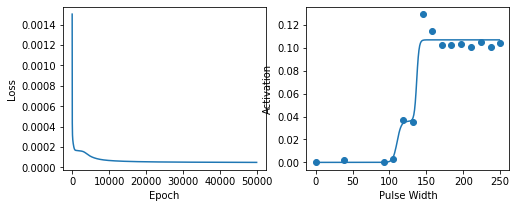

Time to fit plot:  35.61701703071594
Radial1000uA_9_4.csv
Lowest loss: 1.75e-05
a1: 0.0, a2: 0.58, a3: 0.14, a4: 159.057, a5: 0.977, a6: 0.237, a7: 146.975


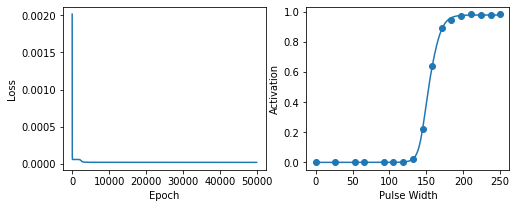

Time to fit plot:  41.27720499038696
Radial1000uA_9_5.csv
Lowest loss: 4e-07
a1: 0.0, a2: -0.01, a3: 0.023, a4: 170.868, a5: 0.019, a6: 0.037, a7: 171.9


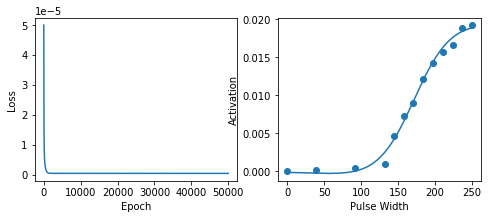

Time to fit plot:  28.737547159194946
Radial1000uA_9_6.csv
Lowest loss: 5.76e-05
a1: 0.0, a2: 0.199, a3: 0.054, a4: 155.083, a5: 0.428, a6: 0.074, a7: 182.289


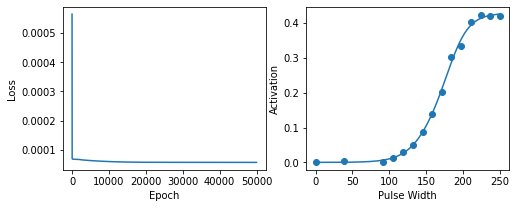

Time to fit plot:  37.308241844177246
Radial1000uA_9_7.csv
Lowest loss: 0.0002279
a1: 0.0, a2: 0.037, a3: 0.166, a4: 130.37, a5: 0.055, a6: -0.028, a7: 149.138


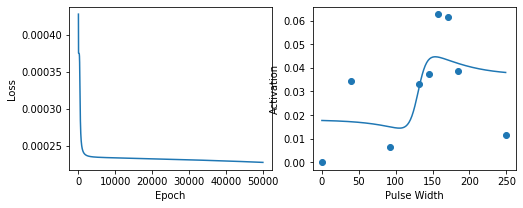

Time to fit plot:  23.446762323379517
Radial1000uA_9_8.csv
Lowest loss: 6.35e-05
a1: 0.0, a2: 0.141, a3: 0.053, a4: 148.973, a5: 0.221, a6: 0.089, a7: 128.535


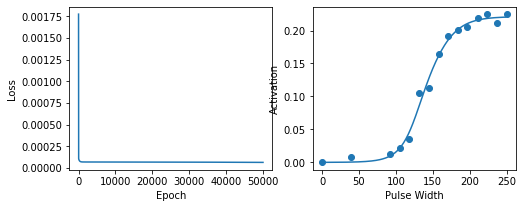

Time to fit plot:  35.93835711479187


In [322]:
losses_double_sigs_mod = [] 
best_thetas_double_sigs_mod = []

path = '/Volumes/L_MillerLab/limblab/User_folders/Aajan/RecruitmentCurveFigures/Radial1000uA'
filenames = sorted([filename for filename in os.listdir(path)])
for filename in filenames:
    if 'sigmoid' not in filename:
        if filename == 'Radial1000uA_13_1.csv':
            print('Skipping {}'.format(filename))
            continue

        start = time.time()
        print(filename)

        f = os.path.join(path,filename)
        curve = np.genfromtxt(f, delimiter = ',')
#         curve[:,0] = curve[:,0]/250
        inds = curve[:,1]>=0
        curve_no_negative = curve[inds,:]

        max_val = max(curve_no_negative[:,1])
        halfmax = max_val*0.5

        arg = np.argmin(np.absolute(curve[inds,1]-halfmax))
        a4a7 = curve_no_negative[arg,0]
        init_theta = np.array([0.0,halfmax,0,a4a7,max_val,0,a4a7])

        best_theta, lowest_loss = fit_and_plot_double_sig(curve[inds,0],curve[inds,1], initial_theta=init_theta, num_epoch = 50000, mod_step_size = 10000)
        end = time.time()
        print("Time to fit plot: ", end - start)
        losses_double_sigs_mod.append(lowest_loss)
        best_thetas_double_sigs_mod.append(best_theta)

In [324]:
len(losses_double_sigs)

0

Radial1000uA_10_1.csv
Lowest loss: 3.54e-05
a1: 0.0, a2: 0.072, a3: 0.054, a4: 147.687, a5: 0.133, a6: 0.054, a7: 147.814


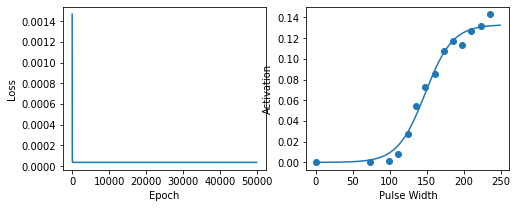

Time to fit plot:  37.874804973602295
Radial1000uA_11_3.csv
Lowest loss: 0.0001982
a1: 0.0, a2: 0.332, a3: 0.036, a4: 53.799, a5: 0.165, a6: 0.024, a7: 40.663


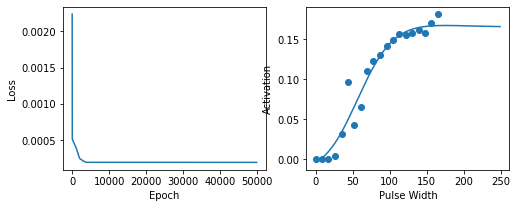

Time to fit plot:  69.59449100494385
Radial1000uA_17_2.csv
Lowest loss: 8.32e-05
a1: 0.0, a2: 0.193, a3: 0.337, a4: 144.237, a5: 0.642, a6: 0.293, a7: 116.121


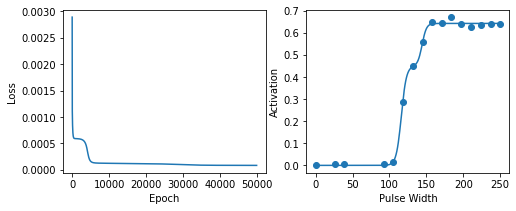

Time to fit plot:  57.66088104248047


In [325]:
path = '/Volumes/L_MillerLab/limblab/User_folders/Aajan/RecruitmentCurveFigures/Radial1000uA'
filenames = sorted([filename for filename in os.listdir(path)])
for filename in filenames:
    if ((filename == 'Radial1000uA_10_1.csv') or (filename == 'Radial1000uA_11_3.csv') or (filename == 'Radial1000uA_17_2.csv')):
        if 'sigmoid' not in filename:
            if filename == 'Radial1000uA_13_1.csv':
                print('Skipping {}'.format(filename))
                continue

            start = time.time()
            print(filename)

            f = os.path.join(path,filename)
            curve = np.genfromtxt(f, delimiter = ',')
    #         curve[:,0] = curve[:,0]/250
            inds = curve[:,1]>=0
            curve_no_negative = curve[inds,:]

            max_val = max(curve_no_negative[:,1])
            halfmax = max_val*0.5

            arg = np.argmin(np.absolute(curve[inds,1]-halfmax))
            a4a7 = curve_no_negative[arg,0]
            init_theta = np.array([0.0,halfmax,0,a4a7,max_val,0,a4a7])

            best_theta, lowest_loss = fit_and_plot_double_sig(curve[inds,0],curve[inds,1], initial_theta=init_theta, num_epoch = 50000, mod_step_size = 1000)
            end = time.time()
            print("Time to fit plot: ", end - start)
            losses_double_sigs_mod.append(lowest_loss)
            best_thetas_double_sigs_mod.append(best_theta)

### Two examples of non-monotonic behavior: negative a6 parameter, a5 < a2

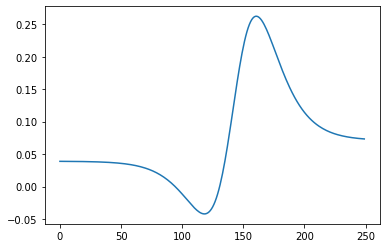

In [257]:
th = np.array([-1.509, 0.071, 0.093, 143.058, 1.619, -0.063, 146.437])
x = np.arange(250)
p = [double_sig_model(xi, th) for xi in x]
plt.plot(x, p)

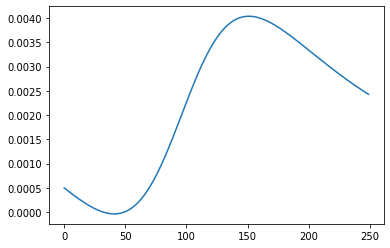

In [256]:
th = np.array([0.003, 0.013, 0.042, 96.0, 0.001, 0.013, 96.0])
x = np.arange(250)
p = [double_sig_model(xi, th) for xi in x]
plt.plot(x, p)

### Compare Losses of Single to Double Sigs

In [213]:
comp_diff = [i-j for i,j in zip(losses_single_sigs, losses_double_sigs)]
comp_perc_diff = [(i-j)/i for i,j in zip(losses_single_sigs, losses_double_sigs)]

/var/folders/c0/0rqzqv5n0bg36m4j1jc_zv3w0000gn/T/ipykernel_21202/2141508449.py:2: RuntimeWarning: invalid value encountered in double_scalars
  comp_perc_diff = [(i-j)/i for i,j in zip(losses_single_sigs, losses_double_sigs)]


In [223]:
fnames = [f for f in filenames if 'sigmoid' not in f]

In [224]:
len(fnames)

112

In [225]:
fnames.pop(24)

'Radial1000uA_13_1.csv'

In [226]:
len(fnames)

111

In [229]:
import pandas as pd
df = pd.DataFrame(zip(losses_single_sigs, losses_double_sigs, fnames, comp_diff, comp_perc_diff),\
            columns = ['single sig loss', 'double sig loss', 'filename', 'difference', 'percent difference']).sort_values(by='difference')

In [230]:
df

,single sig loss,double sig loss,filename,difference,percent difference
34,0.007169,0.010194,Radial1000uA_14_4.csv,-0.003025,-0.421888
88,0.002506,0.004374,Radial1000uA_7_2.csv,-0.001868,-0.745402
92,0.001944,0.002663,Radial1000uA_7_6.csv,-0.000720,-0.370203
94,0.000739,0.001305,Radial1000uA_7_8.csv,-0.000566,-0.765016
29,0.003649,0.004122,Radial1000uA_13_7.csv,-0.000472,-0.129395
...,...,...,...,...,...
36,0.002635,0.001151,Radial1000uA_14_6.csv,0.001484,0.563159
1,0.005717,0.004140,Radial1000uA_10_2.csv,0.001578,0.275934
72,0.006594,0.004125,Radial1000uA_5_2.csv,0.002469,0.374414
104,0.004039,0.001218,Radial1000uA_9_2.csv,0.002821,0.698485


### Manually fitting double sigmoid produces better results - the double sigmoid model is very sensitive to initialization

Radial1000uA_12_3.csv
Lowest loss: 0.0003973
a1: 0.005, a2: 0.175, a3: 0.152, a4: 29.771, a5: 0.569, a6: 0.123, a7: 90.874


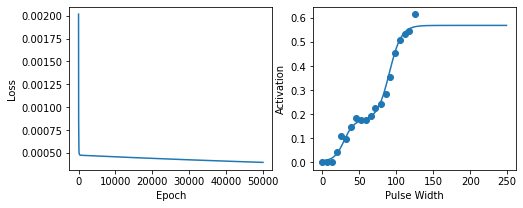

Time to fit plot:  35.16581082344055


In [113]:
filenames = sorted([filename for filename in os.listdir(path)])
for filename in filenames:
    if filename == 'Radial1000uA_12_3.csv':
            
        start = time.time()
        print(filename)
        
        f = os.path.join(path,filename)
        curve = np.genfromtxt(f, delimiter = ',')
        inds = curve[:,1]>=0
        curve_no_negative = curve[inds,:]
        
        max_val = max(curve_no_negative[:,1])
        halfmax = max_val*0.5
        
        arg = np.argmin(np.absolute(curve[inds,1]-halfmax))
        a4a7 = curve_no_negative[arg,0]
        
        fit_and_plot_double_sig(curve[inds,0],curve[inds,1], initial_theta=np.array([0.0,0.2,0.0,30,max_val,0.0,90]), num_epoch = 50000)
        end = time.time()
        print("Time to fit plot: ", end - start)

Radial1000uA_12_8.csv
Lowest loss: 0.0016385
a1: -0.038, a2: 0.513, a3: 0.161, a4: 30.131, a5: 0.865, a6: 0.233, a7: 100.597


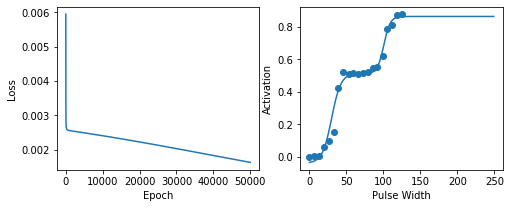

Time to fit plot:  44.19267678260803


In [260]:
filenames = sorted([filename for filename in os.listdir(path)])
for filename in filenames:
    if filename == 'Radial1000uA_12_8.csv':
            
        start = time.time()
        print(filename)
        
        f = os.path.join(path,filename)
        curve = np.genfromtxt(f, delimiter = ',')
        inds = curve[:,1]>=0
        curve_no_negative = curve[inds,:]
        
        max_val = max(curve_no_negative[:,1])
        halfmax = max_val*0.5
        
        arg = np.argmin(np.absolute(curve[inds,1]-halfmax))
        a4a7 = curve_no_negative[arg,0]
        
        fit_and_plot_double_sig(curve[inds,0],curve[inds,1], initial_theta=np.array([0.0,0.5,0.15,27,max_val,0.0,100]), num_epoch = 50000)
        end = time.time()
        print("Time to fit plot: ", end - start)

### Plot Vlad's Data - 8 Drawn Muscles

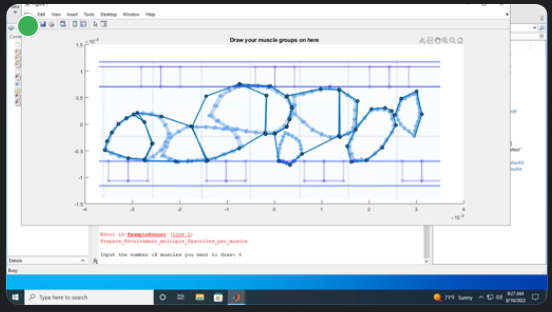

In [119]:
singlemuscle_singlecontact_sweeppw_8muscles = np.genfromtxt('/Volumes/L_MillerLab/limblab/User_folders/Aajan/PNS_Modeling_Toolbox-main/COMSOL_Modeling/mmActivationMatrix_SweepPW_8muscles.csv', delimiter=',')

In [120]:
singlemuscle_singlecontact_sweeppw_8muscles.shape

(2250, 8)

In [121]:
def get_curves(data, pulse_amplitude, contact):
    #this function returns the muscle activation as a function of pulse width for all muscles for a particular 
        #contact at a particular pulse amplitude
    #pulse amp values range between 0.5 and 3 mA (500 to 3000 uA) at an increment of 0.5mA
    #pulse width values range between 10 and 250 at an increment of 10
    start, finish = (contact)*(6*25), (contact+1)*(6*25)
    curves_contact = data[start:finish,:]
    i = pulse_amplitude/0.5
    begin, end = int((i-1)*25), int(i*25)
    curves_contact_amp = curves_contact[begin:end,:]
    return(curves_contact_amp)

Pulse Amplitude: 0.5


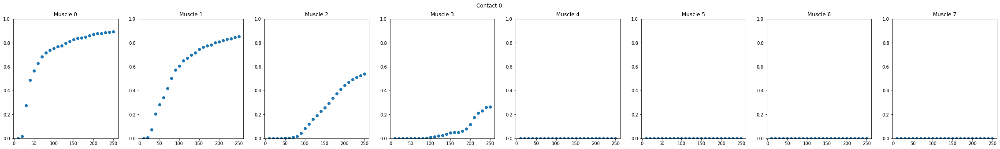

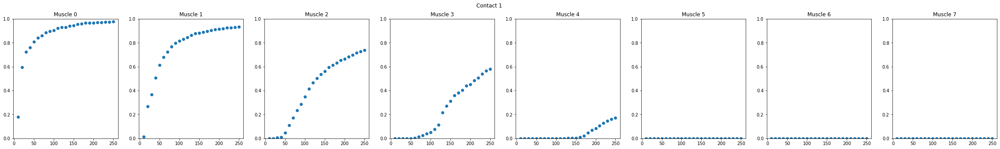

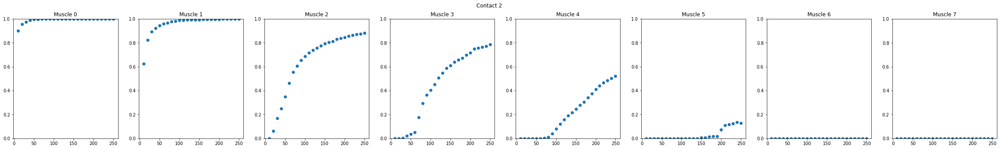

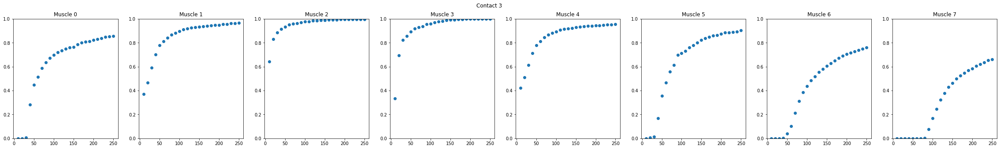

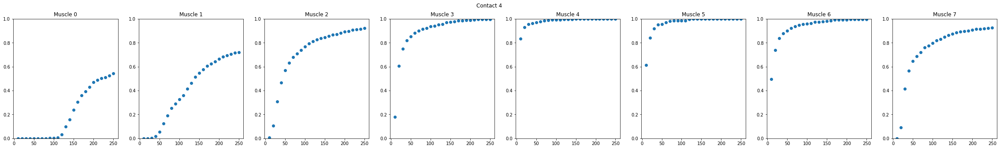

...

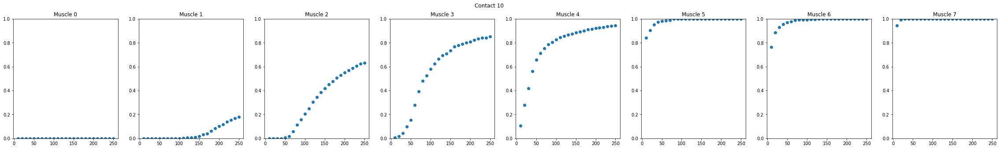

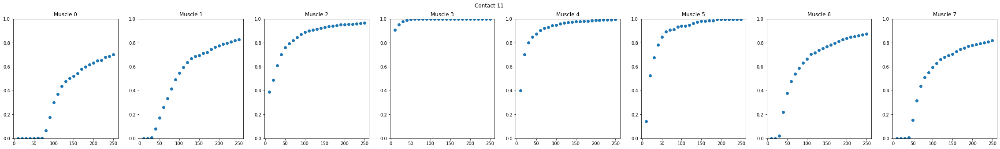

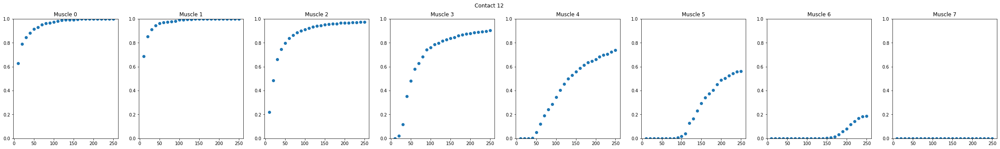

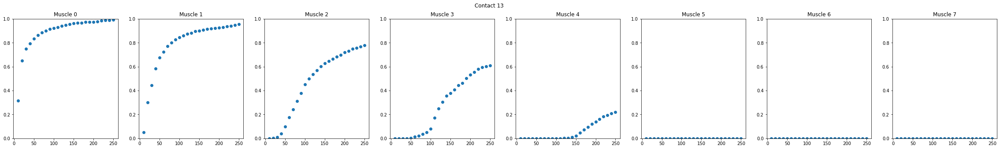

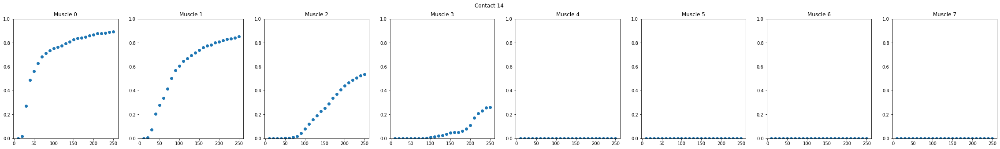

Pulse Amplitude: 1.0


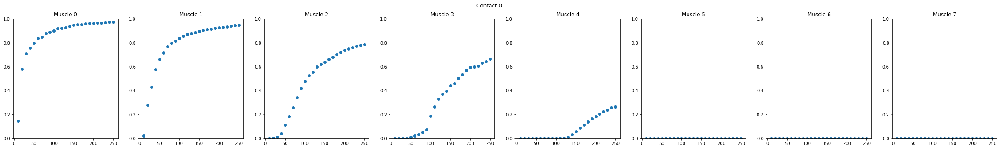

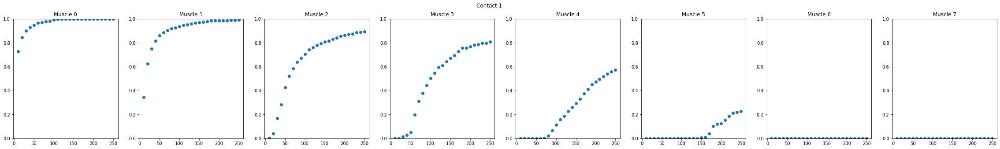

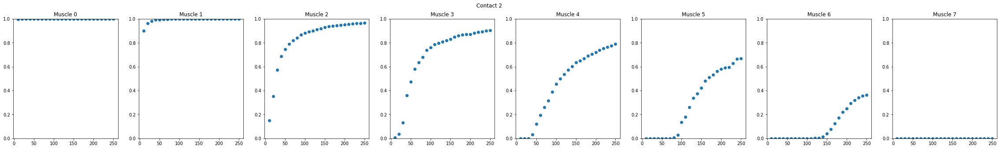

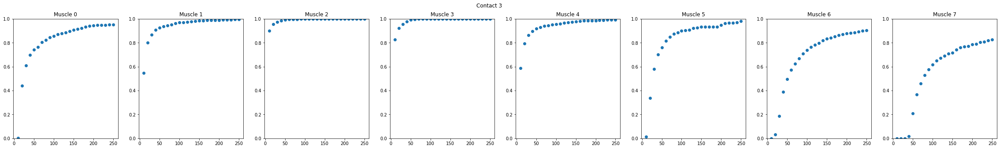

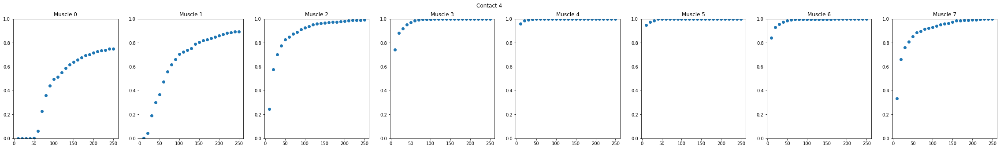

...

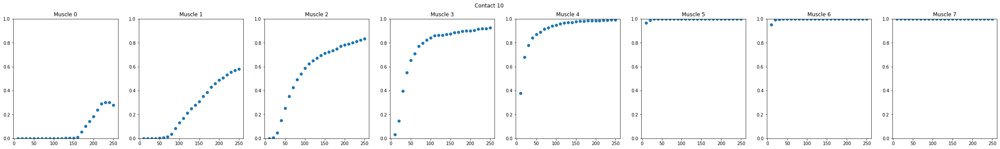

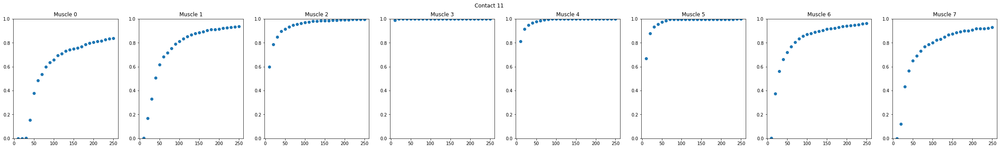

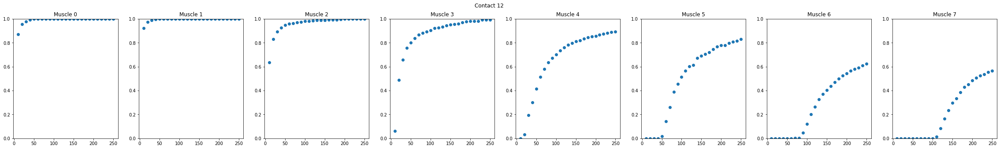

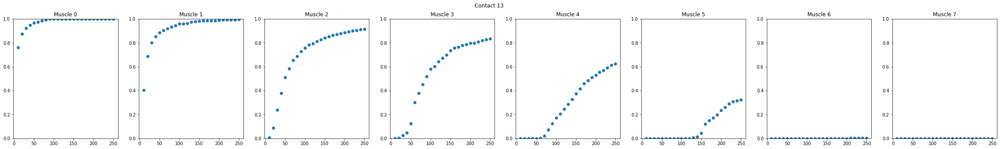

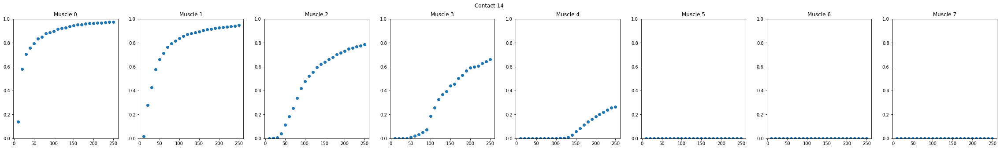

Pulse Amplitude: 1.5


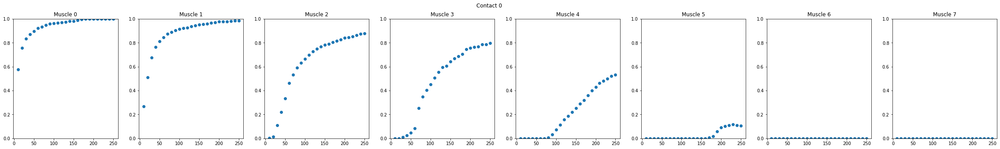

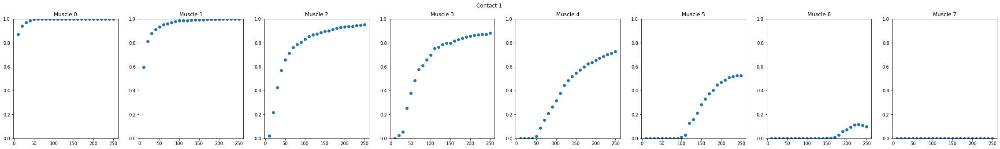

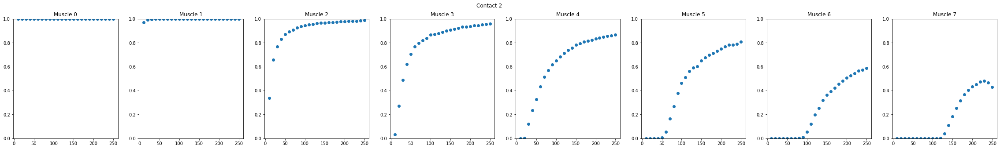

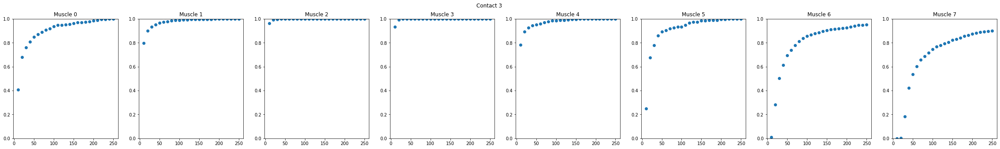

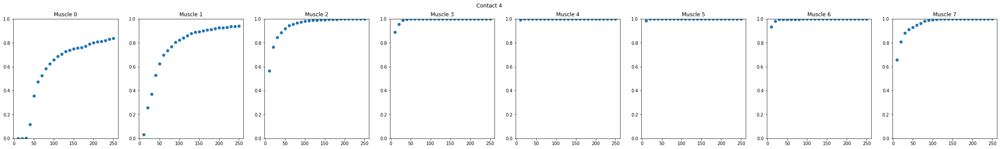

...

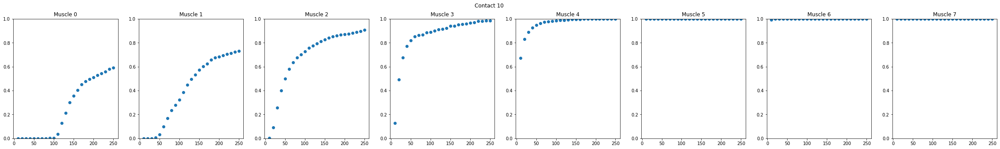

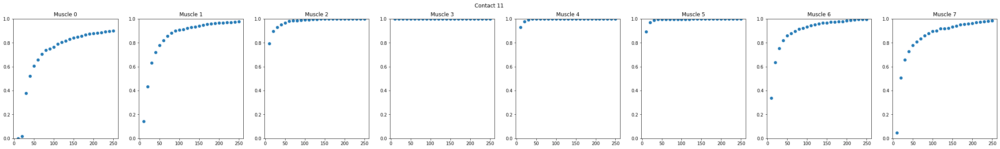

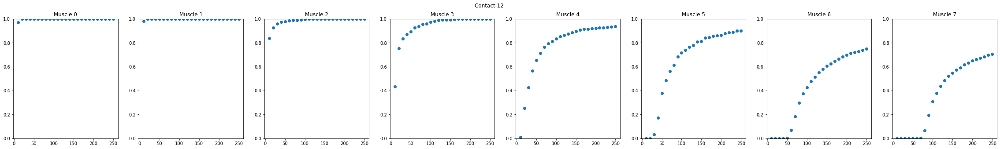

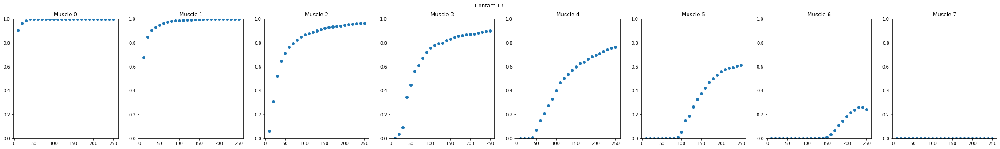

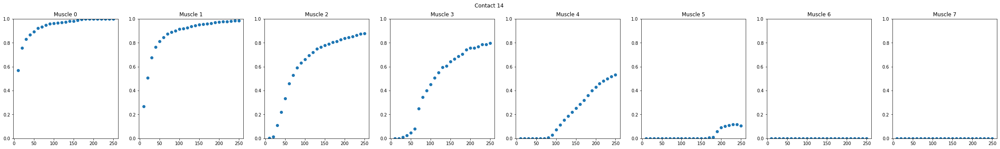

Pulse Amplitude: 2.0


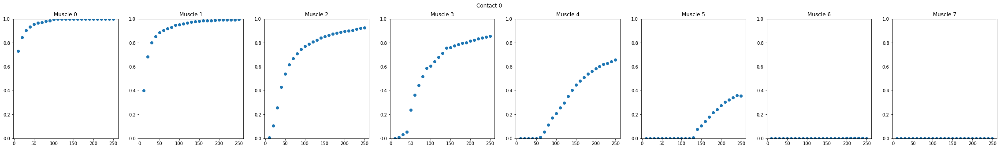

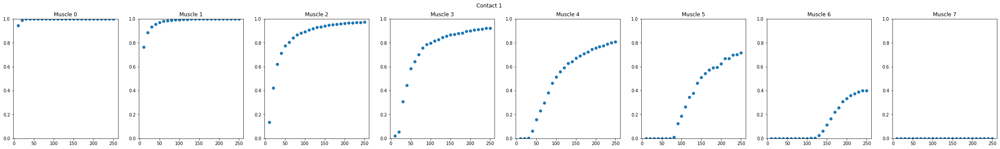

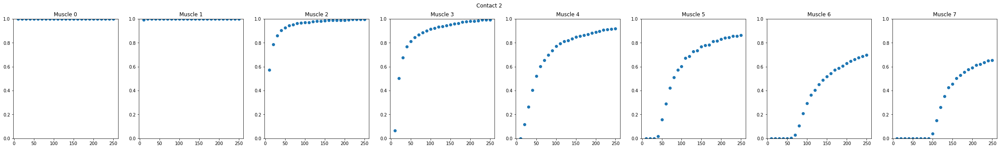

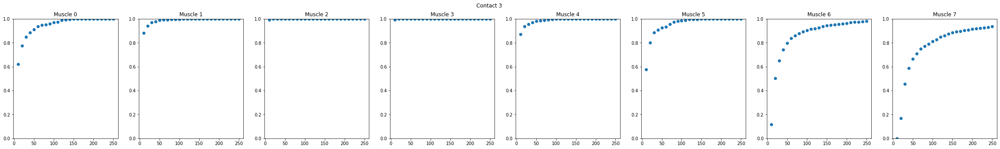

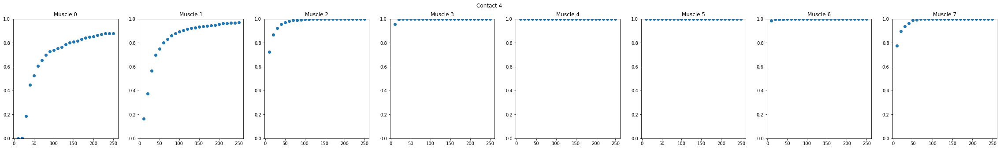

...

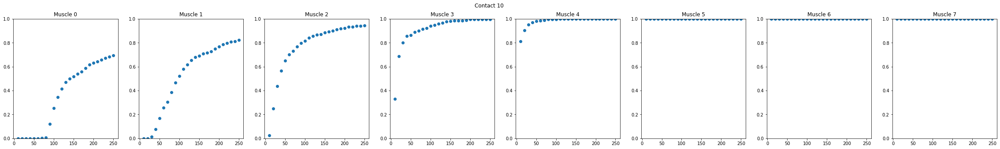

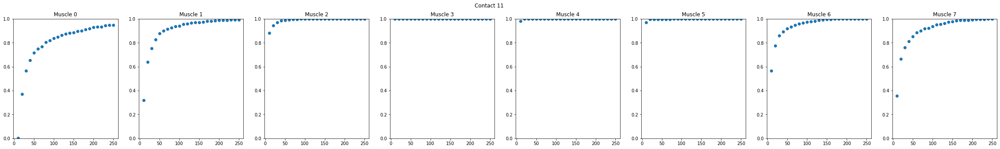

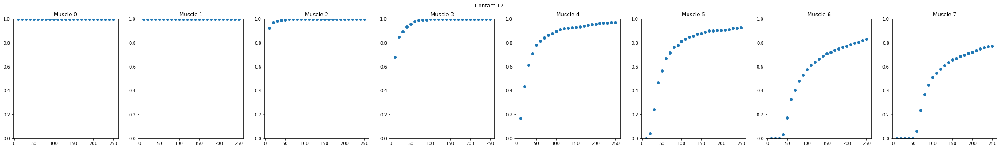

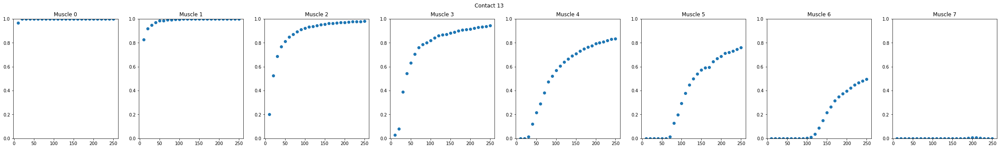

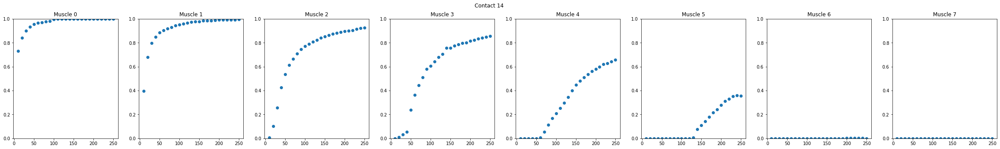

Pulse Amplitude: 2.5


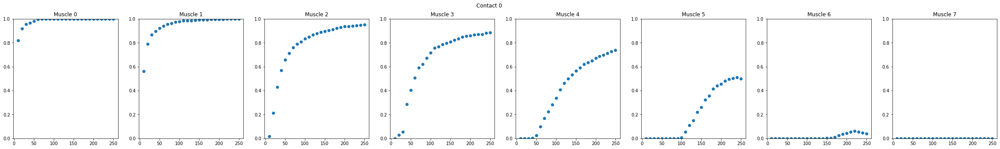

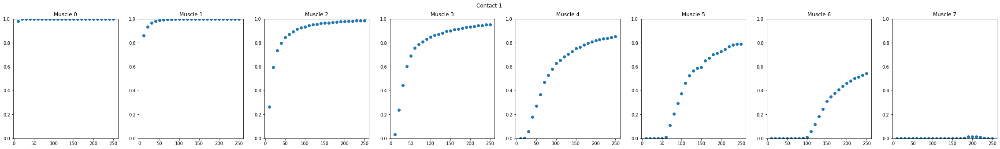

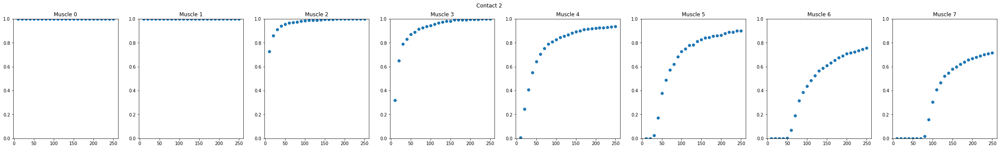

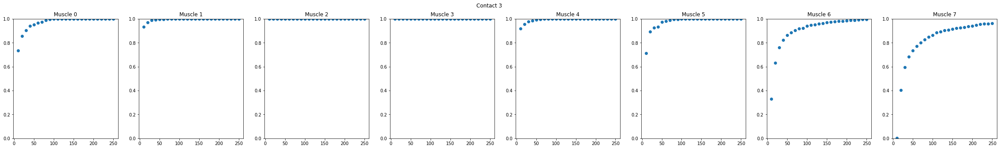

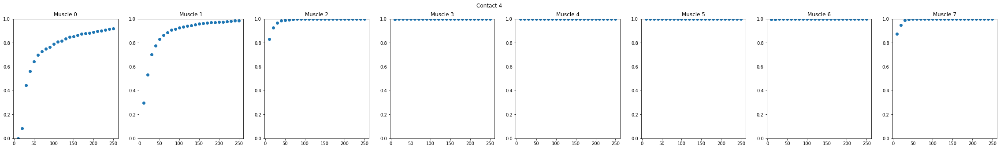

...

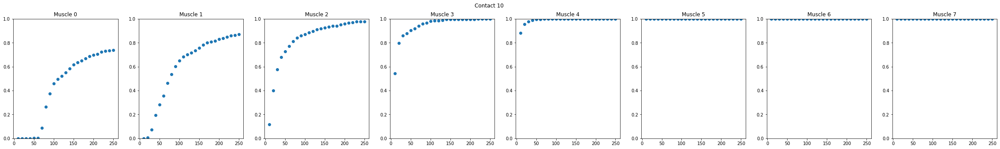

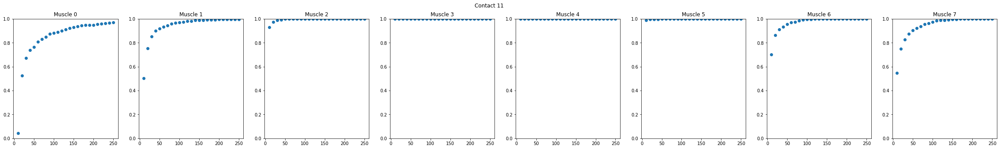

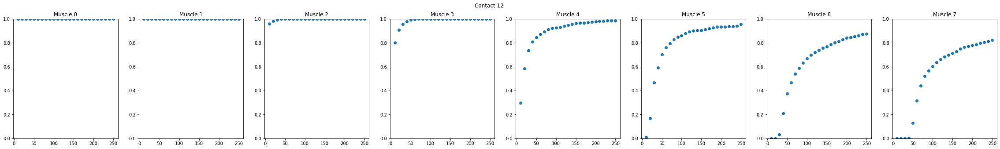

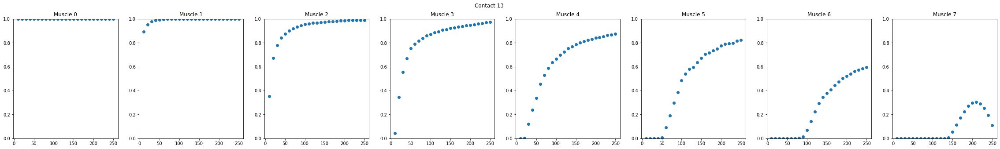

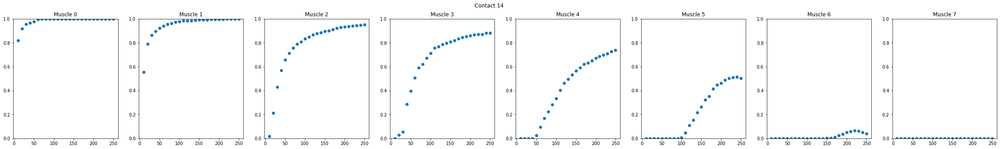

Pulse Amplitude: 3.0


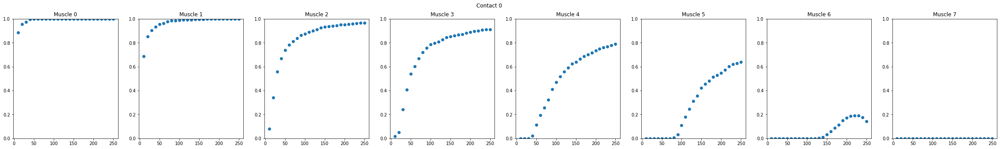

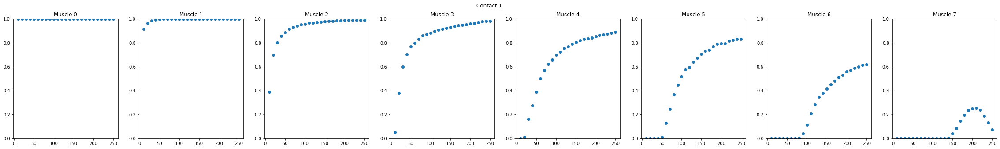

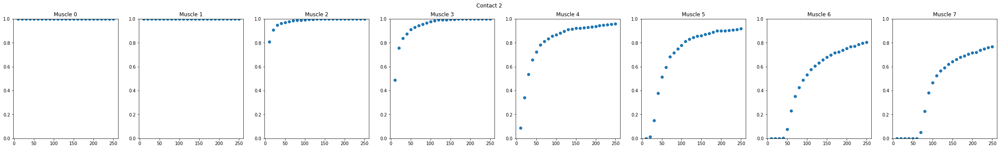

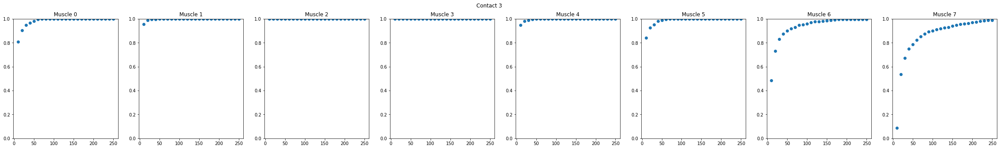

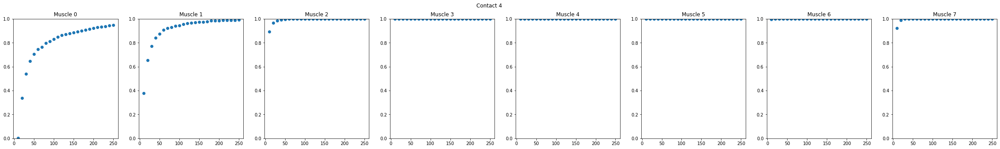

...

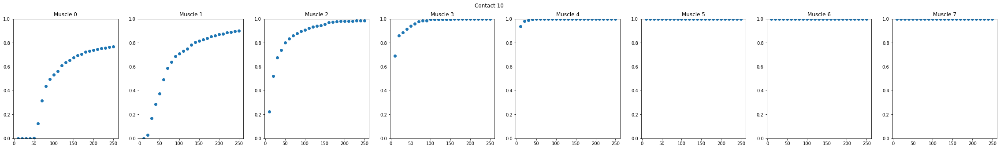

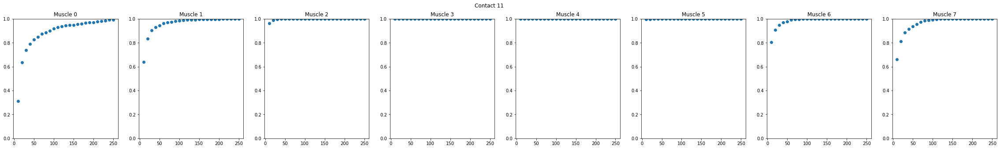

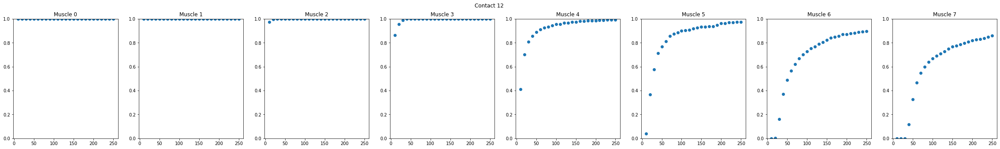

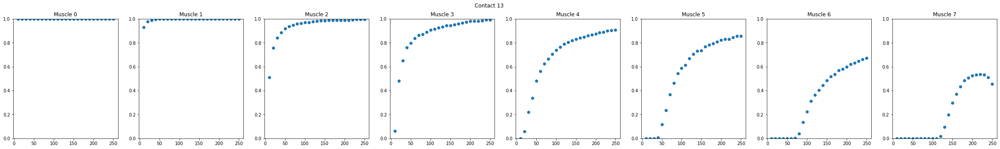

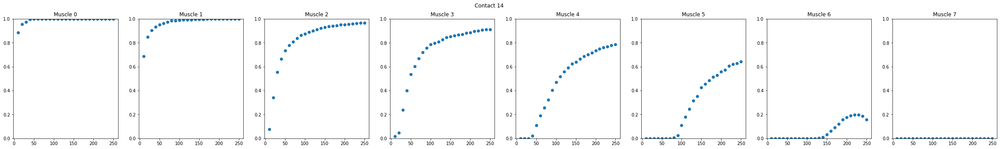

In [122]:
pw_x = np.arange(10,260,10)
num_muscles = 8
pulse_amplitudes = np.arange(0.5,3.5,0.5)
for pulse_amplitude in pulse_amplitudes:
    print('Pulse Amplitude: {}'.format(str(pulse_amplitude)))
    for contact in range(15):
        curves = get_curves(singlemuscle_singlecontact_sweeppw_8muscles,pulse_amplitude,contact)
        fig, ax = plt.subplots(nrows = 1, ncols = num_muscles)
        fig.set_size_inches(40, 5)
        fig.suptitle('Contact {}'.format(contact))

        for muscle in range(num_muscles):
            ax[muscle].set_title('Muscle {}'.format(muscle))
            ax[muscle].set_ylim(0, 1)
            ax[muscle].scatter(pw_x,curves[:,muscle])
        plt.show()

### Fitting double sigmoids to Vlad's Data - 1mA

Pulse Amplitude: 1.0
Contact: 0, Muscle: 0
Lowest loss: 5.4e-06
a1: -1.057, a2: 0.362, a3: 0.176, a4: 7.061, a5: 0.976, a6: 0.021, a7: 7.008


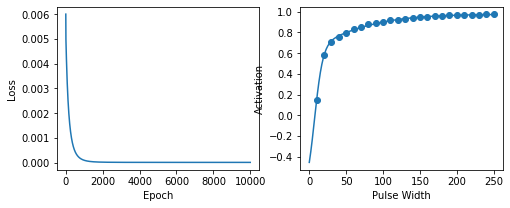

Time to fit plot:  40.736830949783325
Contact: 0, Muscle: 1
Lowest loss: 3.86e-05
a1: -0.762, a2: 0.375, a3: 0.069, a4: 13.004, a5: 0.963, a6: 0.015, a7: 13.006


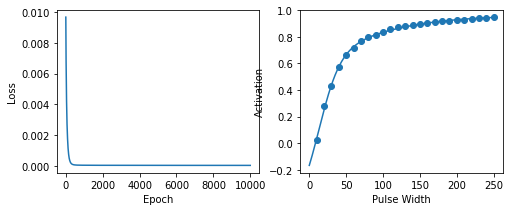

Time to fit plot:  40.06790590286255
Contact: 0, Muscle: 2
Lowest loss: 0.0001877
a1: -0.475, a2: 0.155, a3: 0.023, a4: 53.003, a5: 0.79, a6: 0.023, a7: 53.0


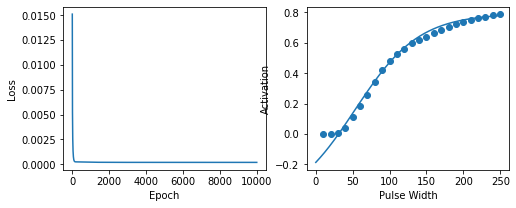

Time to fit plot:  39.28403091430664
Contact: 0, Muscle: 3
Lowest loss: 0.001257
a1: -0.397, a2: 0.119, a3: 0.026, a4: 72.062, a5: 0.635, a6: 0.026, a7: 72.053


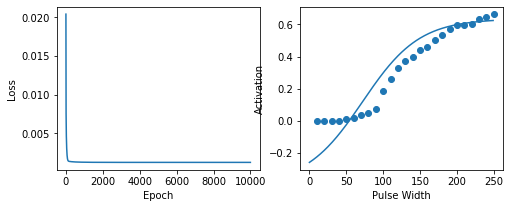

Time to fit plot:  41.2431206703186
Contact: 0, Muscle: 4
Lowest loss: 0.0014607
a1: -0.123, a2: 0.067, a3: 0.022, a4: 112.027, a5: 0.249, a6: 0.021, a7: 112.021


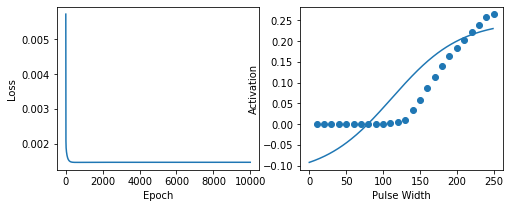

Time to fit plot:  40.48609471321106
Contact: 0, Muscle: 5
Lowest loss: 0.0
a1: 0.0, a2: 0.0, a3: 0.0, a4: 0.0, a5: 0.0, a6: 0.0, a7: 0.0


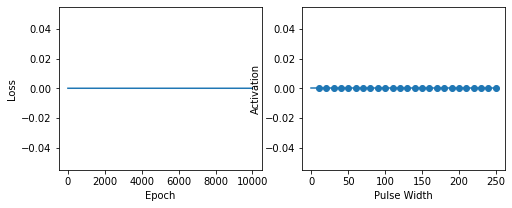

Time to fit plot:  38.617558002471924
Contact: 0, Muscle: 6
Lowest loss: 0.0
a1: 0.0, a2: 0.0, a3: 0.0, a4: 0.0, a5: 0.0, a6: 0.0, a7: 0.0


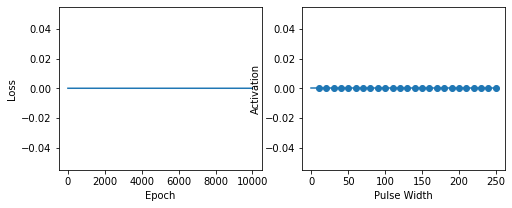

Time to fit plot:  38.36174917221069
Contact: 0, Muscle: 7
Lowest loss: 0.0
a1: 0.0, a2: 0.0, a3: 0.0, a4: 0.0, a5: 0.0, a6: 0.0, a7: 0.0


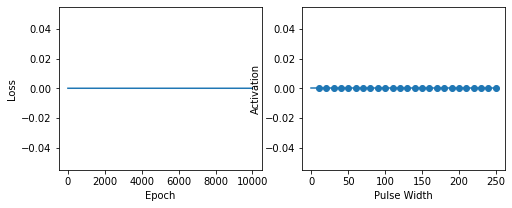

Time to fit plot:  32.4272837638855
Contact: 1, Muscle: 0
Lowest loss: 4e-06
a1: 0.062, a2: 0.411, a3: 0.036, a4: -0.001, a5: 1.001, a6: 0.127, a7: 0.002


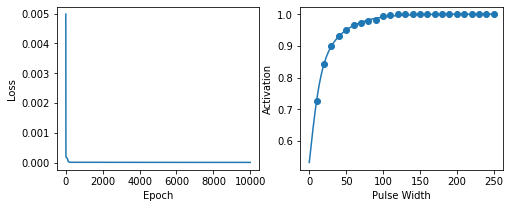

Time to fit plot:  32.181699991226196
Contact: 1, Muscle: 1
Lowest loss: 8.1e-06
a1: -0.496, a2: 0.546, a3: 0.118, a4: 7.017, a5: 0.993, a6: 0.021, a7: 7.003


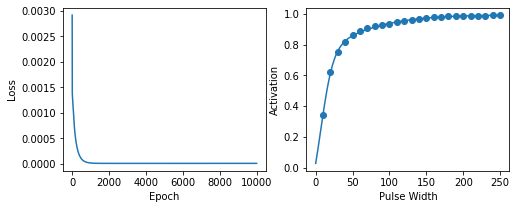

Time to fit plot:  31.825264930725098
Contact: 1, Muscle: 2
Lowest loss: 9.81e-05
a1: -0.619, a2: 0.248, a3: 0.041, a4: 26.015, a5: 0.908, a6: 0.016, a7: 26.006


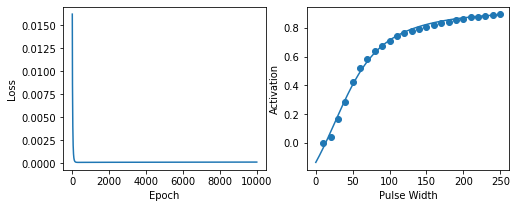

Time to fit plot:  32.335071086883545
Contact: 1, Muscle: 3
Lowest loss: 0.0007106
a1: -0.548, a2: 0.129, a3: 0.024, a4: 45.991, a5: 0.806, a6: 0.024, a7: 45.993


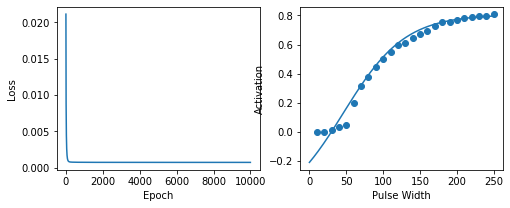

Time to fit plot:  32.30189299583435
Contact: 1, Muscle: 4
Lowest loss: 0.0010794
a1: -0.278, a2: 0.135, a3: 0.027, a4: 92.097, a5: 0.545, a6: 0.027, a7: 92.084


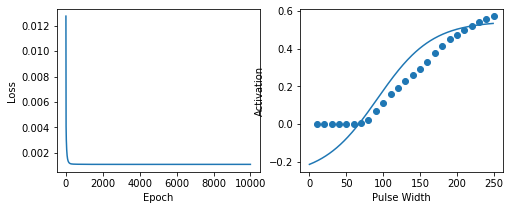

Time to fit plot:  32.149516105651855
Contact: 1, Muscle: 5
Lowest loss: 0.0018209
a1: -0.095, a2: 0.053, a3: 0.021, a4: 118.024, a5: 0.198, a6: 0.021, a7: 118.019


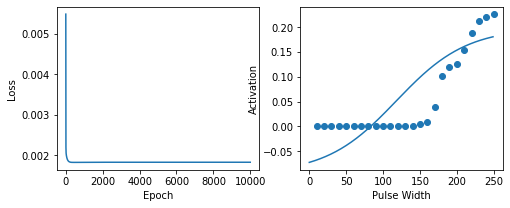

Time to fit plot:  32.0771222114563
Contact: 1, Muscle: 6
Lowest loss: 0.0
a1: 0.0, a2: 0.0, a3: 0.0, a4: 0.0, a5: 0.0, a6: 0.0, a7: 0.0


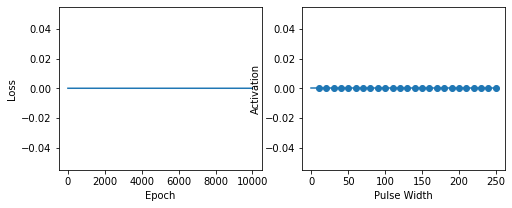

Time to fit plot:  32.14191675186157
Contact: 1, Muscle: 7
Lowest loss: 0.0
a1: 0.0, a2: 0.0, a3: 0.0, a4: 0.0, a5: 0.0, a6: 0.0, a7: 0.0


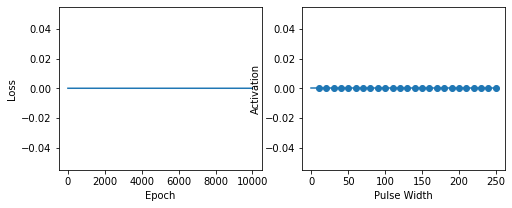

Time to fit plot:  31.70307993888855
Contact: 2, Muscle: 0
Lowest loss: 9e-07
a1: 0.108, a2: 0.491, a3: 0.451, a4: -0.01, a5: 1.0, a6: 0.473, a7: -0.011


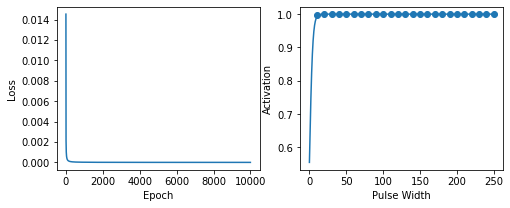

Time to fit plot:  32.237112045288086
Contact: 2, Muscle: 1
Lowest loss: 1.6e-06
a1: 0.147, a2: 0.447, a3: 0.097, a4: -0.006, a5: 1.0, a6: 0.349, a7: -0.008


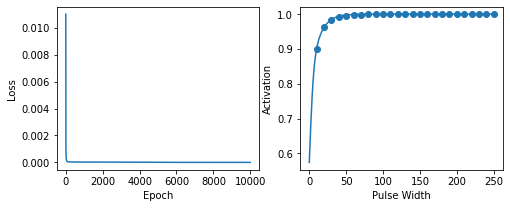

Time to fit plot:  31.818608045578003
Contact: 2, Muscle: 2
Lowest loss: 2.71e-05
a1: -0.548, a2: 0.452, a3: 0.086, a4: 13.02, a5: 0.975, a6: 0.017, a7: 13.004


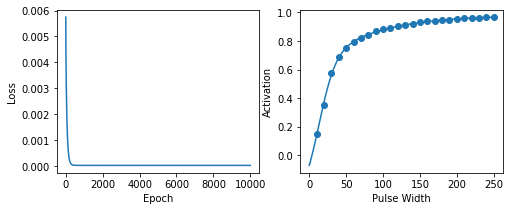

Time to fit plot:  32.50527000427246
Contact: 2, Muscle: 3
Lowest loss: 0.0003969
a1: -0.6, a2: 0.327, a3: 0.051, a4: 26.041, a5: 0.918, a6: 0.016, a7: 26.004


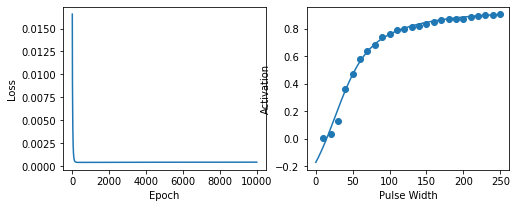

Time to fit plot:  31.72886037826538
Contact: 2, Muscle: 4
Lowest loss: 0.0001983
a1: -0.49, a2: 0.149, a3: 0.022, a4: 52.995, a5: 0.792, a6: 0.022, a7: 52.996


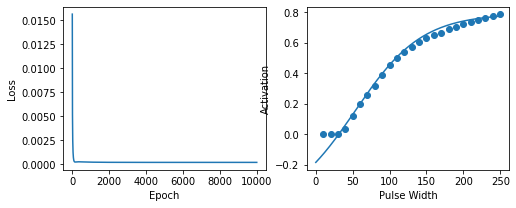

Time to fit plot:  32.094587087631226
Contact: 2, Muscle: 5
Lowest loss: 0.00179
a1: -0.393, a2: 0.12, a3: 0.028, a4: 79.109, a5: 0.629, a6: 0.028, a7: 79.086


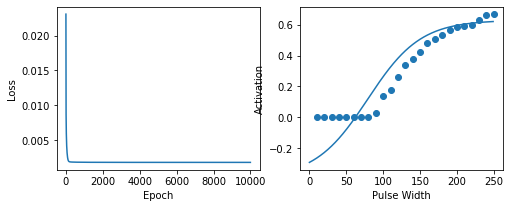

Time to fit plot:  31.42956781387329
Contact: 2, Muscle: 6
Lowest loss: 0.0035478
a1: -0.143, a2: 0.09, a3: 0.027, a4: 112.08, a5: 0.318, a6: 0.027, a7: 112.066


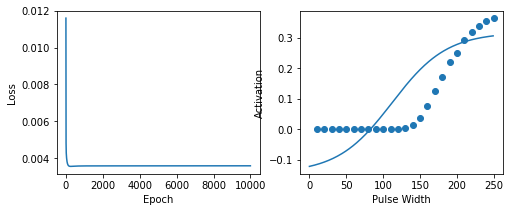

Time to fit plot:  31.9042489528656
Contact: 2, Muscle: 7
Lowest loss: 0.0
a1: 0.0, a2: 0.0, a3: 0.0, a4: 0.0, a5: 0.0, a6: 0.0, a7: 0.0


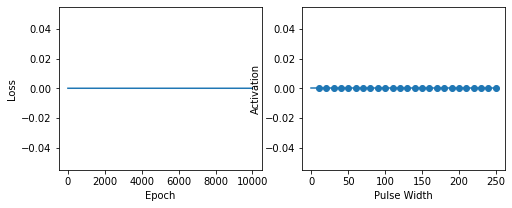

Time to fit plot:  33.893033266067505
Contact: 3, Muscle: 0
Lowest loss: 8.1e-06
a1: -1.293, a2: 0.246, a3: 0.142, a4: 7.056, a5: 0.962, a6: 0.019, a7: 7.011


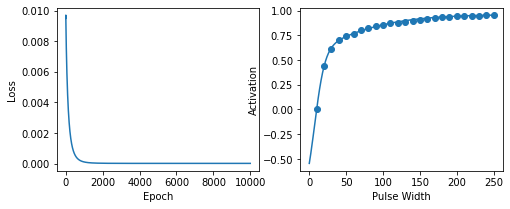

Time to fit plot:  31.70955491065979
Contact: 3, Muscle: 1
Lowest loss: 6.84e-05
a1: -0.476, a2: -0.187, a3: 0.024, a4: 0.005, a5: 0.993, a6: 0.114, a7: 0.071


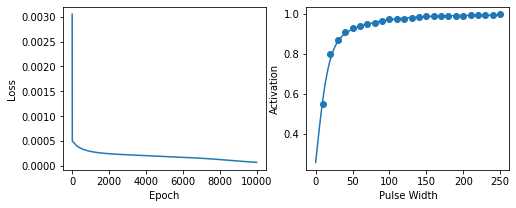

Time to fit plot:  31.774441957473755
Contact: 3, Muscle: 2
Lowest loss: 8e-07
a1: 0.171, a2: 0.423, a3: 0.073, a4: -0.006, a5: 1.0, a6: 0.346, a7: -0.008


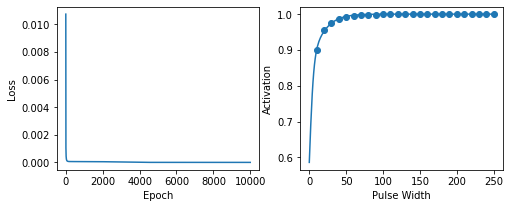

Time to fit plot:  32.035799980163574
Contact: 3, Muscle: 3
Lowest loss: 1.7e-06
a1: 0.09, a2: 0.476, a3: 0.072, a4: -0.003, a5: 1.0, a6: 0.23, a7: -0.003


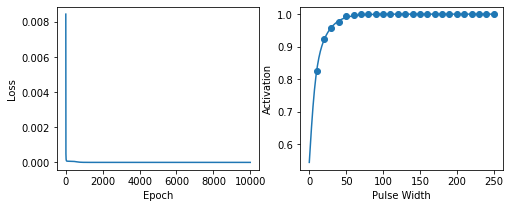

Time to fit plot:  31.90454411506653
Contact: 3, Muscle: 4
Lowest loss: 1.21e-05
a1: -0.37, a2: -0.132, a3: 0.016, a4: 0.001, a5: 0.997, a6: 0.109, a7: 0.056


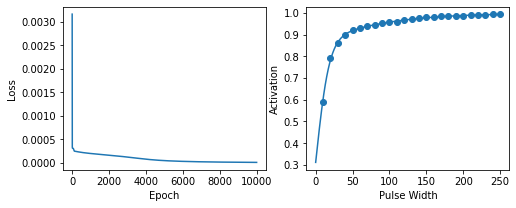

Time to fit plot:  32.02154493331909
Contact: 3, Muscle: 5
Lowest loss: 1.2e-05
a1: -0.761, a2: 0.523, a3: 0.095, a4: 13.016, a5: 0.99, a6: 0.015, a7: 13.006


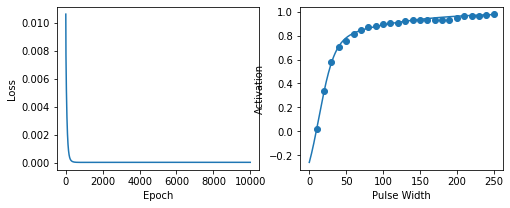

Time to fit plot:  32.63068509101868
Contact: 3, Muscle: 6
Lowest loss: 0.00024
a1: -0.581, a2: 0.193, a3: 0.061, a4: 26.029, a5: 0.921, a6: 0.016, a7: 26.004


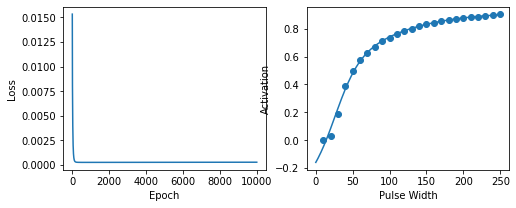

Time to fit plot:  32.298916816711426
Contact: 3, Muscle: 7
Lowest loss: 0.0009484
a1: -0.62, a2: 0.127, a3: 0.035, a4: 33.026, a5: 0.829, a6: 0.019, a7: 32.998


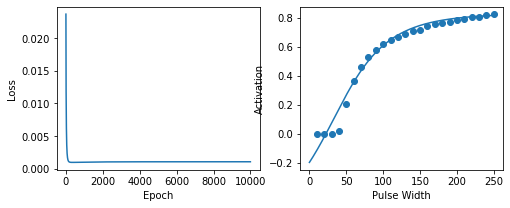

Time to fit plot:  31.946003913879395
Contact: 4, Muscle: 0
Lowest loss: 0.0011362
a1: -0.538, a2: 0.107, a3: 0.025, a4: 46.004, a5: 0.746, a6: 0.025, a7: 45.998


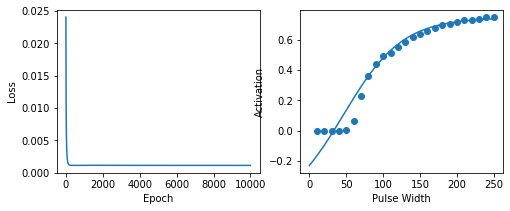

Time to fit plot:  32.04513096809387
Contact: 4, Muscle: 1
Lowest loss: 8.87e-05
a1: -0.497, a2: 0.317, a3: 0.037, a4: 32.997, a5: 0.909, a6: 0.016, a7: 33.005


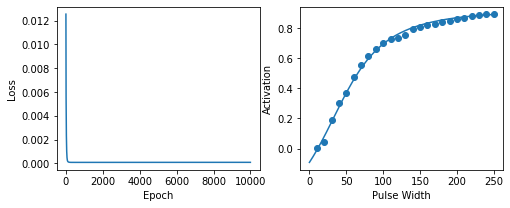

Time to fit plot:  32.34760785102844
Contact: 4, Muscle: 2
Lowest loss: 1.02e-05
a1: -0.745, a2: 0.368, a3: 0.14, a4: 7.026, a5: 0.991, a6: 0.023, a7: 7.006


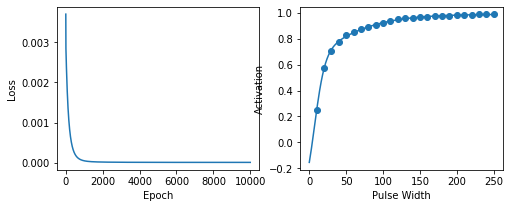

Time to fit plot:  31.9094500541687
Contact: 4, Muscle: 3
Lowest loss: 9.2e-06
a1: 0.008, a2: 0.443, a3: 0.055, a4: -0.001, a5: 1.0, a6: 0.162, a7: 0.004


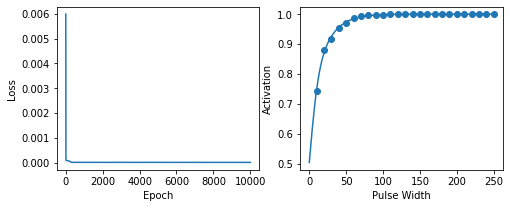

Time to fit plot:  31.998528003692627
Contact: 4, Muscle: 4
Lowest loss: 8.4e-06
a1: 0.077, a2: 0.496, a3: 0.299, a4: -0.005, a5: 0.999, a6: 0.321, a7: -0.006


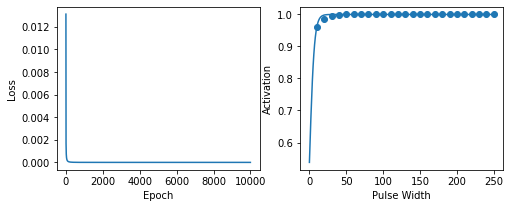

Time to fit plot:  32.10697078704834
Contact: 4, Muscle: 5
Lowest loss: 2.19e-05
a1: 0.083, a2: 0.497, a3: 0.244, a4: -0.005, a5: 0.999, a6: 0.308, a7: -0.006


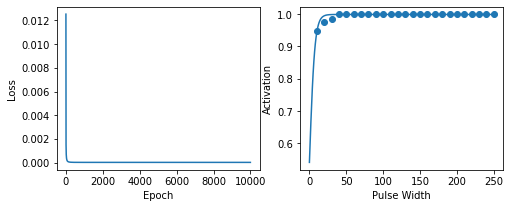

Time to fit plot:  32.83843994140625
Contact: 4, Muscle: 6
Lowest loss: 1.6e-06
a1: 0.134, a2: 0.433, a3: 0.061, a4: -0.004, a5: 0.999, a6: 0.233, a7: -0.003


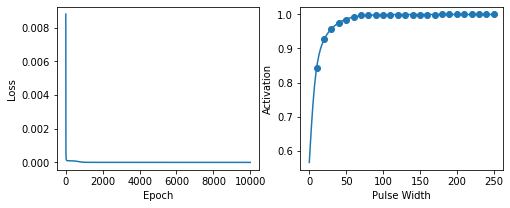

Time to fit plot:  32.509276151657104
Contact: 4, Muscle: 7
Lowest loss: 1.32e-05
a1: -0.595, a2: -0.067, a3: 0.02, a4: 7.004, a5: 1.004, a6: 0.161, a7: 7.071


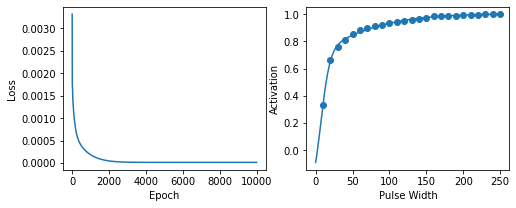

Time to fit plot:  31.715097904205322
Contact: 5, Muscle: 0
Lowest loss: 0.0
a1: 0.0, a2: 0.0, a3: 0.0, a4: 0.0, a5: 0.0, a6: 0.0, a7: 0.0


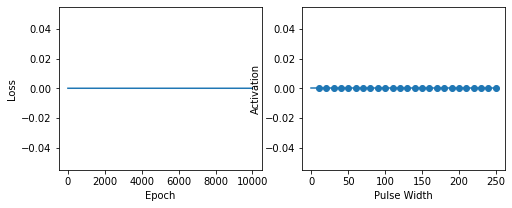

Time to fit plot:  31.794286727905273
Contact: 5, Muscle: 1
Lowest loss: 0.0010934
a1: -0.165, a2: 0.069, a3: 0.021, a4: 99.021, a5: 0.295, a6: 0.021, a7: 99.016


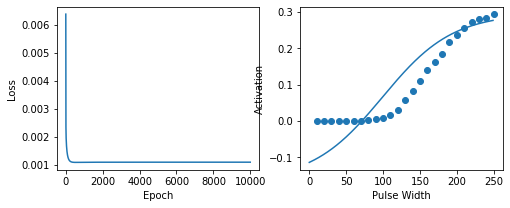

Time to fit plot:  32.21584367752075
Contact: 5, Muscle: 2
Lowest loss: 0.0003618
a1: -0.445, a2: 0.128, a3: 0.023, a4: 59.009, a5: 0.708, a6: 0.024, a7: 59.008


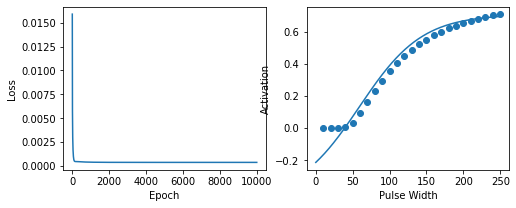

Time to fit plot:  32.153326988220215
Contact: 5, Muscle: 3
Lowest loss: 0.0003117
a1: -0.552, a2: 0.256, a3: 0.034, a4: 33.021, a5: 0.875, a6: 0.02, a7: 33.004


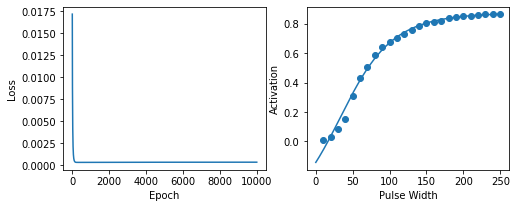

Time to fit plot:  31.692346811294556
Contact: 5, Muscle: 4
Lowest loss: 6.4e-06
a1: -0.746, a2: 0.363, a3: 0.092, a4: 13.019, a5: 0.98, a6: 0.016, a7: 13.006


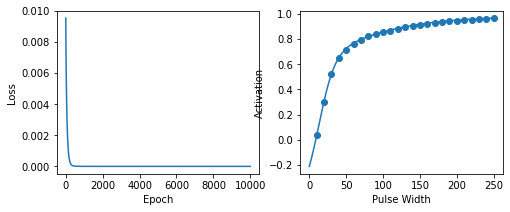

Time to fit plot:  32.043158769607544
Contact: 5, Muscle: 5
Lowest loss: 3.21e-05
a1: -0.55, a2: -0.223, a3: 0.022, a4: 0.004, a5: 1.003, a6: 0.112, a7: 0.076


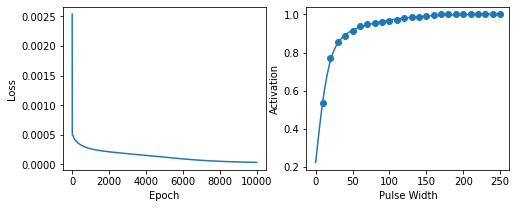

Time to fit plot:  35.062514781951904
Contact: 5, Muscle: 6
Lowest loss: 5.5e-06
a1: 0.073, a2: 0.497, a3: 0.28, a4: -0.005, a5: 1.0, a6: 0.303, a7: -0.005


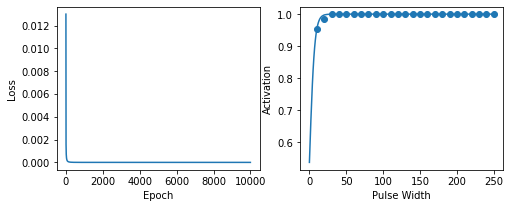

Time to fit plot:  32.35282301902771
Contact: 5, Muscle: 7
Lowest loss: 1e-06
a1: 0.109, a2: 0.49, a3: 0.454, a4: -0.01, a5: 1.0, a6: 0.476, a7: -0.011


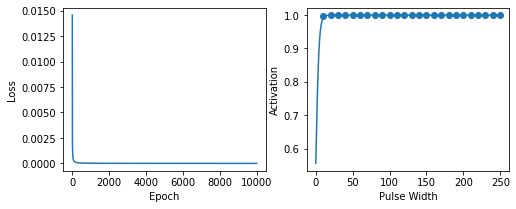

Time to fit plot:  31.725722789764404
Contact: 6, Muscle: 0
Lowest loss: 0.0
a1: 0.0, a2: 0.0, a3: 0.0, a4: 0.0, a5: 0.0, a6: 0.0, a7: 0.0


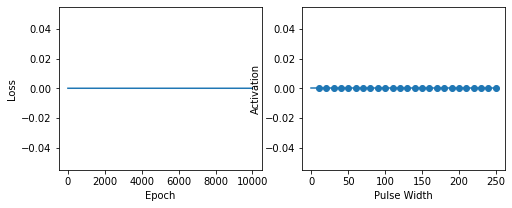

Time to fit plot:  32.10850787162781
Contact: 6, Muscle: 1
Lowest loss: 1.1e-06
a1: -0.004, a2: 0.006, a3: 0.007, a4: 118.0, a5: 0.006, a6: 0.0, a7: 118.0


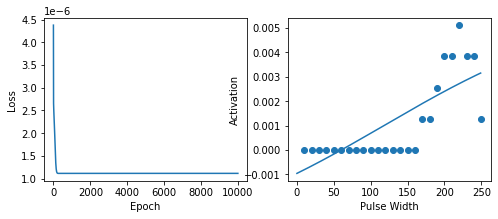

Time to fit plot:  32.069730043411255
Contact: 6, Muscle: 2
Lowest loss: 0.0014152
a1: -0.2, a2: 0.096, a3: 0.025, a4: 99.05, a5: 0.383, a6: 0.024, a7: 99.041


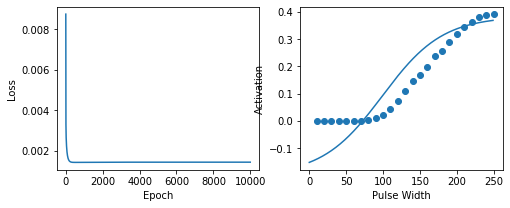

Time to fit plot:  31.94641613960266
Contact: 6, Muscle: 3
Lowest loss: 0.0007805
a1: -0.374, a2: 0.16, a3: 0.025, a4: 72.056, a5: 0.696, a6: 0.025, a7: 72.049


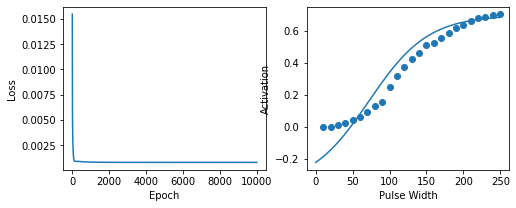

Time to fit plot:  36.26722478866577
Contact: 6, Muscle: 4
Lowest loss: 0.0001768
a1: -0.516, a2: 0.226, a3: 0.037, a4: 39.023, a5: 0.856, a6: 0.017, a7: 38.996


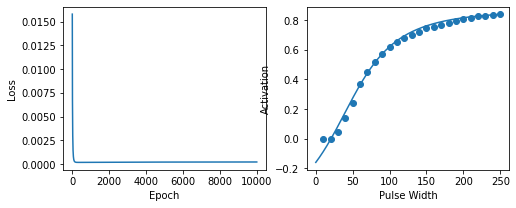

Time to fit plot:  40.99833703041077
Contact: 6, Muscle: 5
Lowest loss: 2.27e-05
a1: -0.63, a2: 0.467, a3: 0.074, a4: 13.021, a5: 0.975, a6: 0.015, a7: 13.005


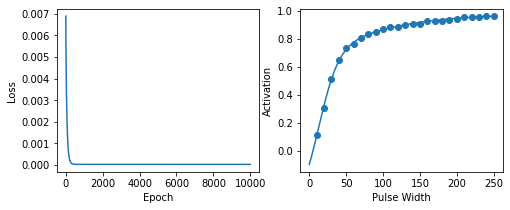

Time to fit plot:  34.9241259098053
Contact: 6, Muscle: 6
Lowest loss: 1.38e-05
a1: -1.066, a2: 0.53, a3: 0.119, a4: 0.065, a5: 1.002, a6: 0.02, a7: 0.006


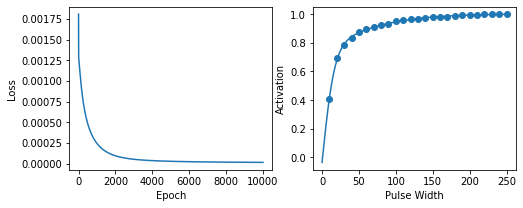

Time to fit plot:  34.76077103614807
Contact: 6, Muscle: 7
Lowest loss: 2.8e-06
a1: 0.055, a2: 0.498, a3: 0.064, a4: -0.001, a5: 1.0, a6: 0.195, a7: -0.002


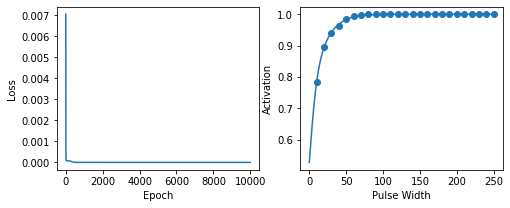

Time to fit plot:  34.63381099700928
Contact: 7, Muscle: 0
Lowest loss: 0.0
a1: 0.0, a2: 0.0, a3: 0.0, a4: 0.0, a5: 0.0, a6: 0.0, a7: 0.0


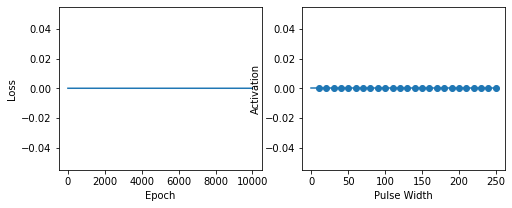

Time to fit plot:  31.826555013656616
Contact: 7, Muscle: 1
Lowest loss: 0.0
a1: 0.0, a2: 0.0, a3: 0.0, a4: 0.0, a5: 0.0, a6: 0.0, a7: 0.0


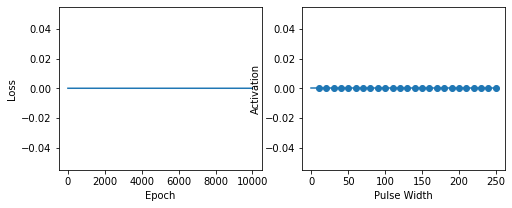

Time to fit plot:  35.07936692237854
Contact: 7, Muscle: 2
Lowest loss: 7.8e-06
a1: -0.009, a2: 0.012, a3: 0.012, a4: 118.0, a5: 0.015, a6: -0.0, a7: 118.0


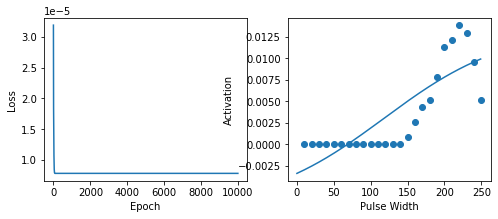

Time to fit plot:  35.09681487083435
Contact: 7, Muscle: 3
Lowest loss: 0.0008566
a1: -0.102, a2: 0.087, a3: 0.022, a4: 112.029, a5: 0.275, a6: 0.022, a7: 112.024


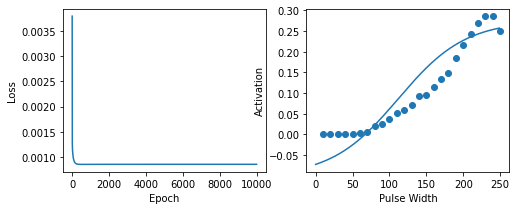

Time to fit plot:  33.712965965270996
Contact: 7, Muscle: 4
Lowest loss: 0.0007031
a1: -0.393, a2: 0.127, a3: 0.025, a4: 72.052, a5: 0.651, a6: 0.025, a7: 72.046


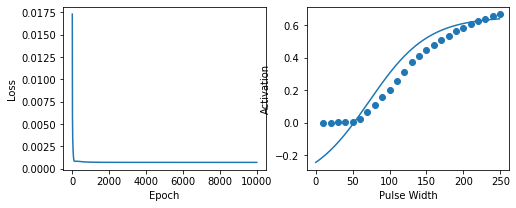

Time to fit plot:  32.45819878578186
Contact: 7, Muscle: 5
Lowest loss: 6.01e-05
a1: -0.56, a2: 0.289, a3: 0.034, a4: 33.014, a5: 0.899, a6: 0.016, a7: 33.006


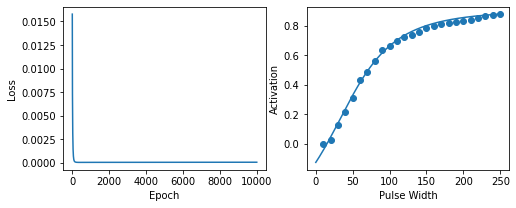

Time to fit plot:  33.29149794578552
Contact: 7, Muscle: 6
Lowest loss: 0.0004112
a1: -0.628, a2: 0.286, a3: 0.079, a4: 20.053, a5: 0.932, a6: 0.017, a7: 20.004


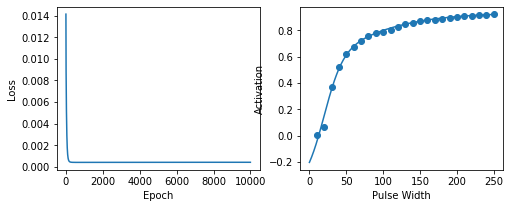

Time to fit plot:  36.00055384635925
Contact: 7, Muscle: 7
Lowest loss: 2.02e-05
a1: -1.056, a2: 0.403, a3: 0.147, a4: 7.048, a5: 0.997, a6: 0.016, a7: 7.008


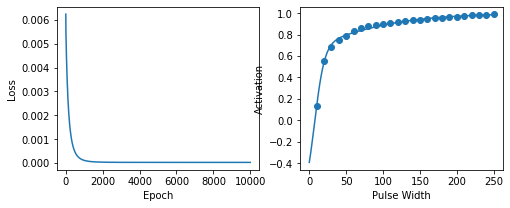

Time to fit plot:  32.78522491455078
Contact: 8, Muscle: 0
Lowest loss: 0.0
a1: 0.0, a2: 0.0, a3: 0.0, a4: 0.0, a5: 0.0, a6: 0.0, a7: 0.0


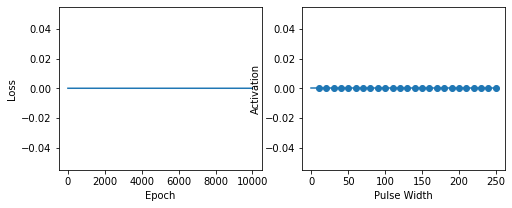

Time to fit plot:  31.849979877471924
Contact: 8, Muscle: 1
Lowest loss: 0.0
a1: 0.0, a2: 0.0, a3: 0.0, a4: 0.0, a5: 0.0, a6: 0.0, a7: 0.0


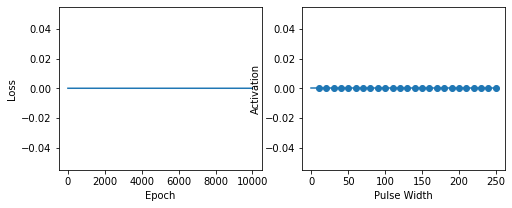

Time to fit plot:  35.80961799621582
Contact: 8, Muscle: 2
Lowest loss: 0.0001059
a1: -0.046, a2: 0.014, a3: 0.01, a4: 118.001, a5: 0.07, a6: 0.009, a7: 118.0


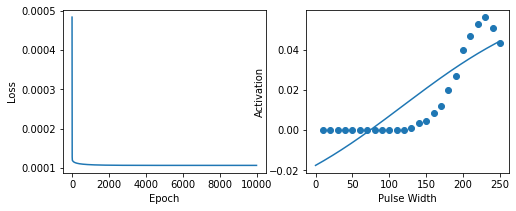

Time to fit plot:  37.015698194503784
Contact: 8, Muscle: 3
Lowest loss: 0.0015086
a1: -0.168, a2: 0.118, a3: 0.026, a4: 105.067, a5: 0.398, a6: 0.025, a7: 105.057


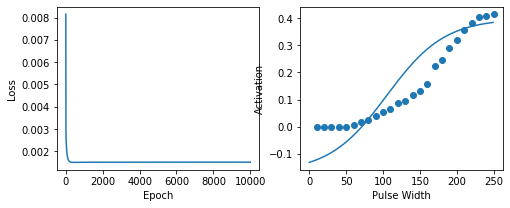

Time to fit plot:  35.26540017127991
Contact: 8, Muscle: 4
Lowest loss: 0.0006139
a1: -0.422, a2: 0.133, a3: 0.025, a4: 66.035, a5: 0.691, a6: 0.025, a7: 66.032


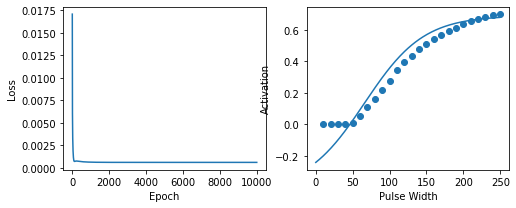

Time to fit plot:  35.66797423362732
Contact: 8, Muscle: 5
Lowest loss: 5.04e-05
a1: -0.486, a2: 0.312, a3: 0.043, a4: 33.015, a5: 0.901, a6: 0.017, a7: 33.005


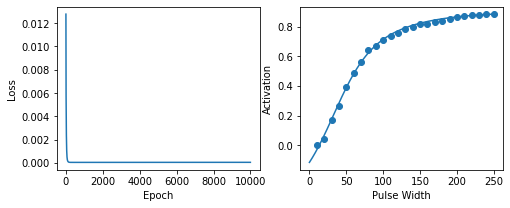

Time to fit plot:  33.25912308692932
Contact: 8, Muscle: 6
Lowest loss: 8.08e-05
a1: -0.816, a2: 0.341, a3: 0.079, a4: 13.03, a5: 0.956, a6: 0.015, a7: 13.008


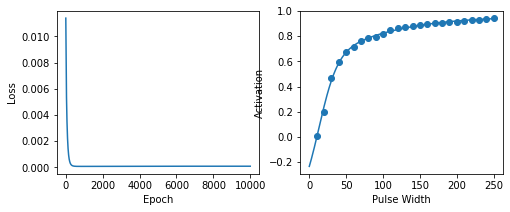

Time to fit plot:  33.104748010635376
Contact: 8, Muscle: 7
Lowest loss: 3.01e-05
a1: -0.664, a2: 0.481, a3: 0.151, a4: 7.027, a5: 1.003, a6: 0.018, a7: 7.005


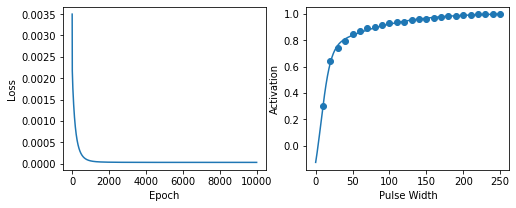

Time to fit plot:  33.648910999298096
Contact: 9, Muscle: 0
Lowest loss: 0.0
a1: 0.0, a2: 0.0, a3: 0.0, a4: 0.0, a5: 0.0, a6: 0.0, a7: 0.0


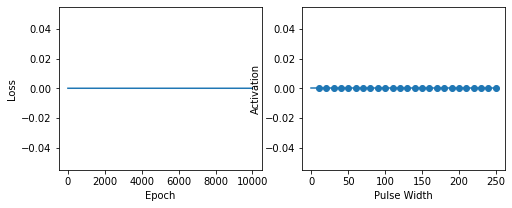

Time to fit plot:  33.95199489593506
Contact: 9, Muscle: 1
Lowest loss: 1.25e-05
a1: -0.029, a2: 0.01, a3: 0.005, a4: 118.0, a5: 0.037, a6: 0.005, a7: 118.0


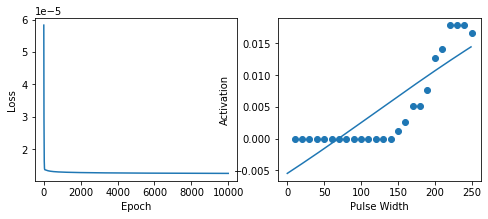

Time to fit plot:  33.691571950912476
Contact: 9, Muscle: 2
Lowest loss: 0.0011476
a1: -0.252, a2: 0.102, a3: 0.025, a4: 92.054, a5: 0.452, a6: 0.025, a7: 92.045


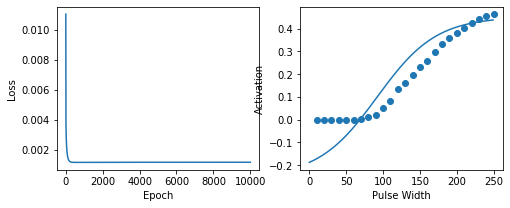

Time to fit plot:  32.9009370803833
Contact: 9, Muscle: 3
Lowest loss: 0.0007618
a1: -0.405, a2: 0.164, a3: 0.025, a4: 66.041, a5: 0.737, a6: 0.025, a7: 66.035


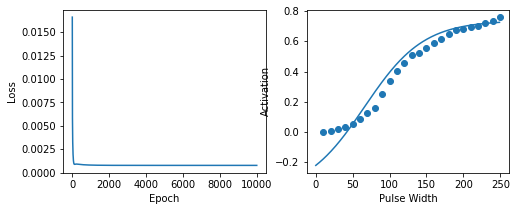

Time to fit plot:  33.57464814186096
Contact: 9, Muscle: 4
Lowest loss: 0.0001667
a1: -0.537, a2: 0.248, a3: 0.041, a4: 33.021, a5: 0.872, a6: 0.017, a7: 33.002


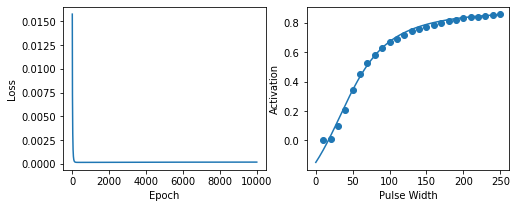

Time to fit plot:  36.55819511413574
Contact: 9, Muscle: 5
Lowest loss: 1.89e-05
a1: -0.801, a2: 0.487, a3: 0.083, a4: 7.028, a5: 0.976, a6: 0.017, a7: 7.006


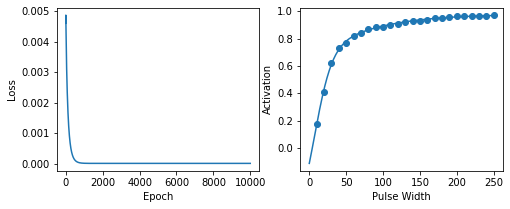

Time to fit plot:  36.801100969314575
Contact: 9, Muscle: 6
Lowest loss: 3.13e-05
a1: -0.593, a2: -0.131, a3: 0.025, a4: 0.005, a5: 1.002, a6: 0.116, a7: 0.067


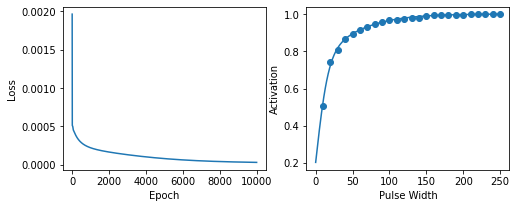

Time to fit plot:  35.15868806838989
Contact: 9, Muscle: 7
Lowest loss: 1.7e-06
a1: 0.113, a2: 0.482, a3: 0.09, a4: -0.004, a5: 1.0, a6: 0.332, a7: -0.007


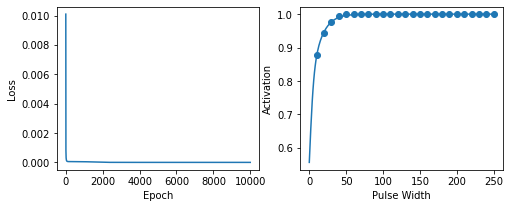

Time to fit plot:  33.15420579910278
Contact: 10, Muscle: 0
Lowest loss: 0.0036426
a1: -0.102, a2: 0.073, a3: 0.026, a4: 118.063, a5: 0.249, a6: 0.026, a7: 118.055


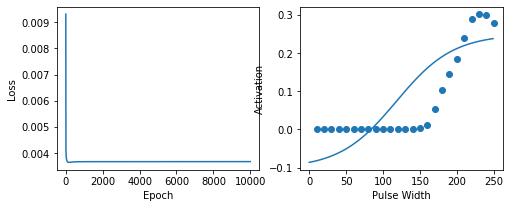

Time to fit plot:  33.47355794906616
Contact: 10, Muscle: 1
Lowest loss: 0.0007112
a1: -0.312, a2: 0.126, a3: 0.026, a4: 86.076, a5: 0.563, a6: 0.026, a7: 86.064


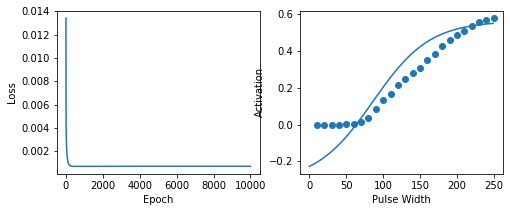

Time to fit plot:  33.40158724784851
Contact: 10, Muscle: 2
Lowest loss: 0.0001313
a1: -0.528, a2: 0.238, a3: 0.028, a4: 39.001, a5: 0.849, a6: 0.017, a7: 39.0


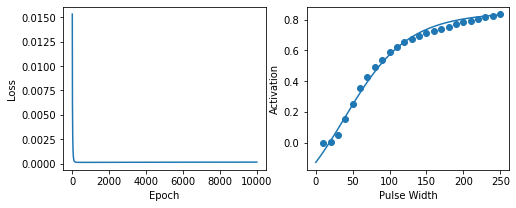

Time to fit plot:  34.644423961639404
Contact: 10, Muscle: 3
Lowest loss: 0.0001506
a1: -0.812, a2: 0.568, a3: 0.057, a4: 13.037, a5: 0.945, a6: 0.012, a7: 13.006


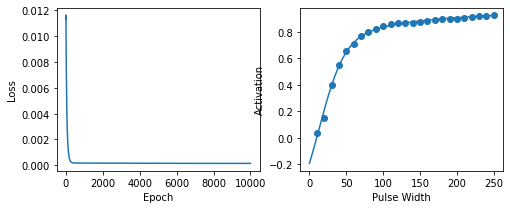

Time to fit plot:  40.939532995224
Contact: 10, Muscle: 4
Lowest loss: 1.07e-05
a1: -1.188, a2: 0.503, a3: 0.121, a4: 0.076, a5: 0.991, a6: 0.024, a7: 0.008


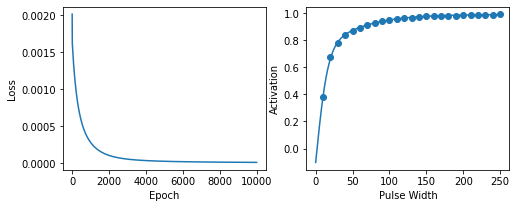

Time to fit plot:  35.622292041778564
Contact: 10, Muscle: 5
Lowest loss: 2.6e-06
a1: 0.077, a2: 0.496, a3: 0.317, a4: -0.005, a5: 1.0, a6: 0.334, a7: -0.006


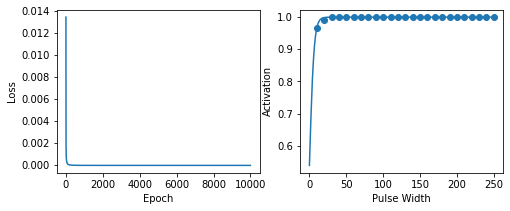

Time to fit plot:  33.11941480636597
Contact: 10, Muscle: 6
Lowest loss: 2.1e-06
a1: 0.069, a2: 0.497, a3: 0.28, a4: -0.004, a5: 1.0, a6: 0.297, a7: -0.005


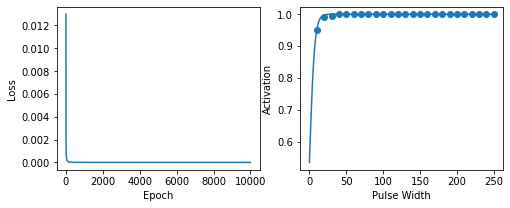

Time to fit plot:  40.309605836868286
Contact: 10, Muscle: 7
Lowest loss: 1.9e-06
a1: 0.112, a2: 0.49, a3: 0.468, a4: -0.011, a5: 1.0, a6: 0.491, a7: -0.012


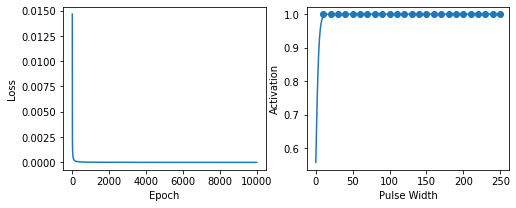

Time to fit plot:  37.7282440662384
Contact: 11, Muscle: 0
Lowest loss: 0.0008334
a1: -0.662, a2: 0.128, a3: 0.043, a4: 26.047, a5: 0.841, a6: 0.019, a7: 26.013


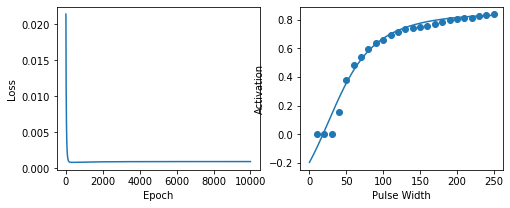

Time to fit plot:  35.955950021743774
Contact: 11, Muscle: 1
Lowest loss: 1.58e-05
a1: -0.6, a2: 0.321, a3: 0.067, a4: 20.013, a5: 0.947, a6: 0.017, a7: 20.006


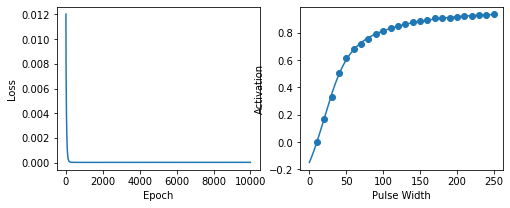

Time to fit plot:  32.606154918670654
Contact: 11, Muscle: 2
Lowest loss: 1.42e-05
a1: -0.283, a2: 0.061, a3: 0.026, a4: 0.001, a5: 0.995, a6: 0.111, a7: 0.036


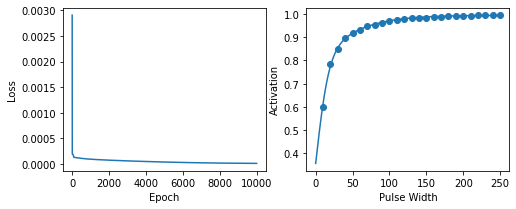

Time to fit plot:  32.62800312042236
Contact: 11, Muscle: 3
Lowest loss: 2e-07
a1: 0.099, a2: 0.492, a3: 0.42, a4: -0.009, a5: 1.0, a6: 0.44, a7: -0.009


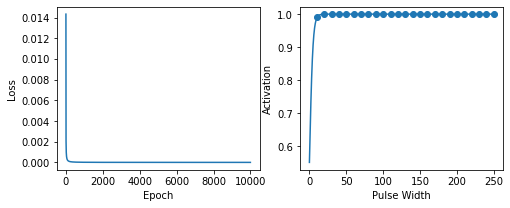

Time to fit plot:  32.70488691329956
Contact: 11, Muscle: 4
Lowest loss: 1.1e-06
a1: 0.132, a2: 0.407, a3: 0.05, a4: -0.003, a5: 1.0, a6: 0.182, a7: -0.001


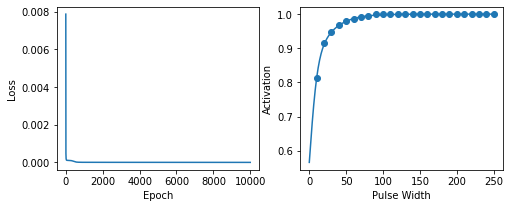

Time to fit plot:  31.76672101020813
Contact: 11, Muscle: 5
Lowest loss: 2.36e-05
a1: -0.366, a2: 0.538, a3: 0.15, a4: 0.02, a5: 0.996, a6: 0.069, a7: 0.007


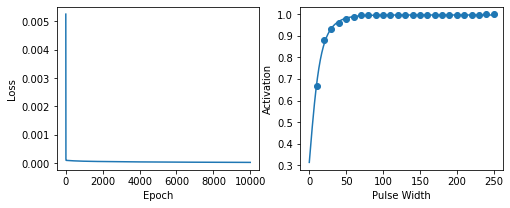

Time to fit plot:  32.07193422317505
Contact: 11, Muscle: 6
Lowest loss: 3.14e-05
a1: -0.736, a2: 0.305, a3: 0.126, a4: 12.996, a5: 0.967, a6: 0.018, a7: 13.006


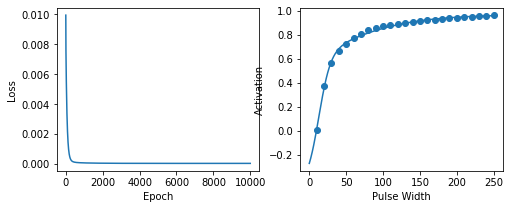

Time to fit plot:  31.967286109924316
Contact: 11, Muscle: 7
Lowest loss: 0.0002642
a1: -0.862, a2: 0.271, a3: 0.076, a4: 13.046, a5: 0.94, a6: 0.017, a7: 13.011


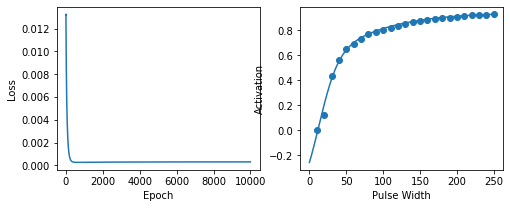

Time to fit plot:  31.872117042541504
Contact: 12, Muscle: 0
Lowest loss: 7e-07
a1: 0.104, a2: 0.478, a3: 0.1, a4: -0.004, a5: 1.0, a6: 0.289, a7: -0.006


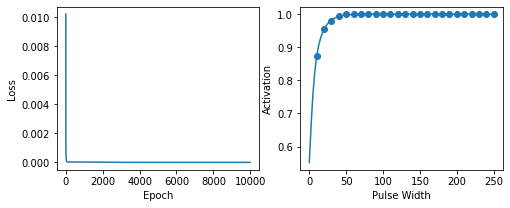

Time to fit plot:  31.654369831085205
Contact: 12, Muscle: 1
Lowest loss: 5.5e-06
a1: 0.112, a2: 0.48, a3: 0.15, a4: -0.006, a5: 1.0, a6: 0.344, a7: -0.008


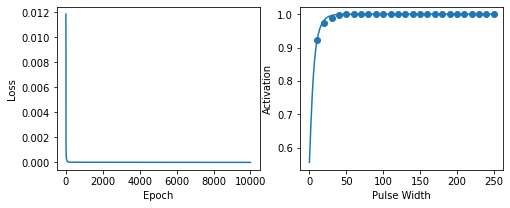

Time to fit plot:  32.72188901901245
Contact: 12, Muscle: 2
Lowest loss: 4.31e-05
a1: -0.227, a2: 0.14, a3: 0.038, a4: 0.001, a5: 0.994, a6: 0.127, a7: 0.033


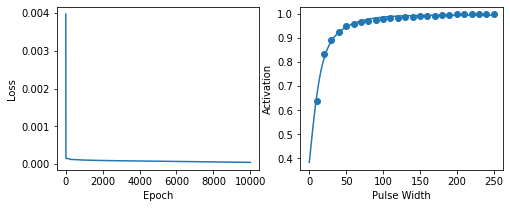

Time to fit plot:  31.971044063568115
Contact: 12, Muscle: 3
Lowest loss: 1.86e-05
a1: -1.167, a2: 0.428, a3: 0.121, a4: 7.048, a5: 1.003, a6: 0.017, a7: 7.008


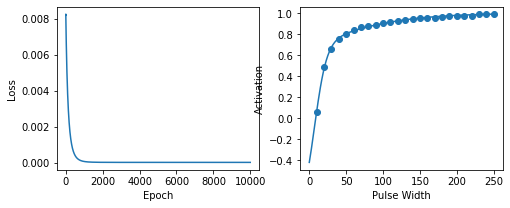

Time to fit plot:  32.64175200462341
Contact: 12, Muscle: 4
Lowest loss: 0.0001064
a1: -0.621, a2: 0.29, a3: 0.04, a4: 26.008, a5: 0.914, a6: 0.015, a7: 26.004


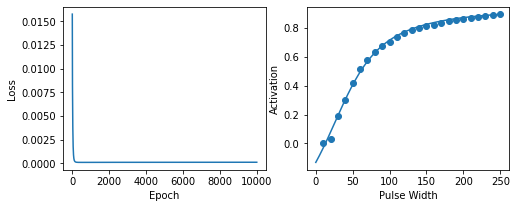

Time to fit plot:  33.808849811553955
Contact: 12, Muscle: 5
Lowest loss: 0.0010204
a1: -0.587, a2: 0.113, a3: 0.025, a4: 45.983, a5: 0.813, a6: 0.025, a7: 45.984


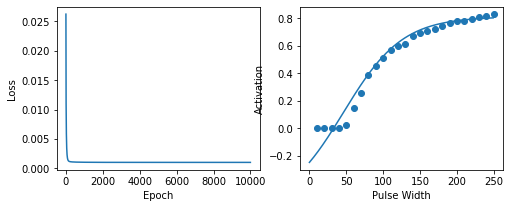

Time to fit plot:  35.13551115989685
Contact: 12, Muscle: 6
Lowest loss: 0.0014029
a1: -0.372, a2: 0.114, a3: 0.027, a4: 79.083, a5: 0.597, a6: 0.027, a7: 79.066


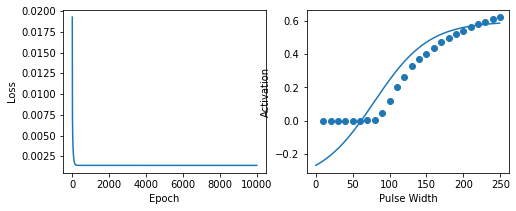

Time to fit plot:  34.36094093322754
Contact: 12, Muscle: 7
Lowest loss: 0.0035719
a1: -0.294, a2: 0.125, a3: 0.03, a4: 92.139, a5: 0.525, a6: 0.029, a7: 92.112


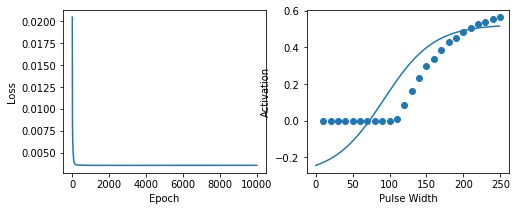

Time to fit plot:  33.15903115272522
Contact: 13, Muscle: 0
Lowest loss: 3e-06
a1: 0.073, a2: 0.452, a3: 0.047, a4: -0.001, a5: 1.001, a6: 0.16, a7: 0.0


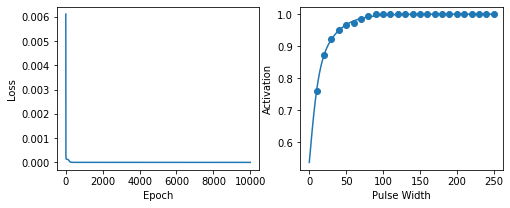

Time to fit plot:  41.84030199050903
Contact: 13, Muscle: 1
Lowest loss: 4.9e-06
a1: -1.072, a2: 0.578, a3: 0.115, a4: 0.066, a5: 0.995, a6: 0.022, a7: 0.007


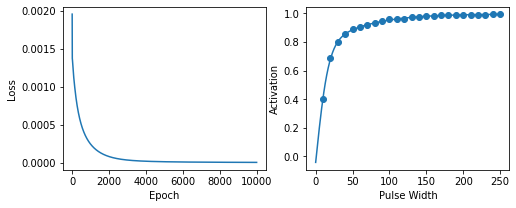

Time to fit plot:  41.418145179748535
Contact: 13, Muscle: 2
Lowest loss: 4.49e-05
a1: -0.54, a2: 0.253, a3: 0.057, a4: 26.016, a5: 0.932, a6: 0.016, a7: 26.006


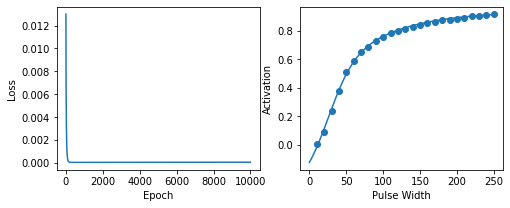

Time to fit plot:  41.26605176925659
Contact: 13, Muscle: 3
Lowest loss: 0.0005002
a1: -0.501, a2: 0.26, a3: 0.033, a4: 46.029, a5: 0.835, a6: 0.019, a7: 45.988


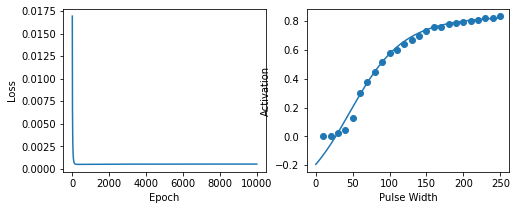

Time to fit plot:  39.03567719459534
Contact: 13, Muscle: 4
Lowest loss: 0.0005386
a1: -0.311, a2: 0.145, a3: 0.026, a4: 86.093, a5: 0.603, a6: 0.026, a7: 86.076


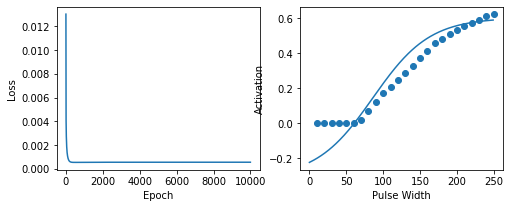

Time to fit plot:  33.095508098602295
Contact: 13, Muscle: 5
Lowest loss: 0.0027272
a1: -0.136, a2: 0.083, a3: 0.025, a4: 112.057, a5: 0.294, a6: 0.025, a7: 112.045


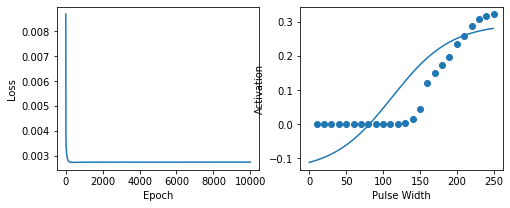

Time to fit plot:  31.94204306602478
Contact: 13, Muscle: 6
Lowest loss: 4e-07
a1: -0.004, a2: 0.008, a3: 0.002, a4: 0.0, a5: 0.002, a6: -0.002, a7: 0.0


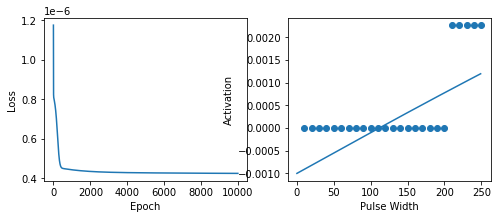

Time to fit plot:  32.0399329662323
Contact: 13, Muscle: 7
Lowest loss: 0.0
a1: 0.0, a2: 0.0, a3: 0.0, a4: 0.0, a5: 0.0, a6: 0.0, a7: 0.0


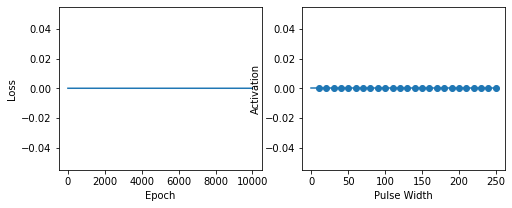

Time to fit plot:  31.8455171585083
Contact: 14, Muscle: 0
Lowest loss: 5.8e-06
a1: -1.077, a2: 0.357, a3: 0.177, a4: 7.062, a5: 0.976, a6: 0.021, a7: 7.008


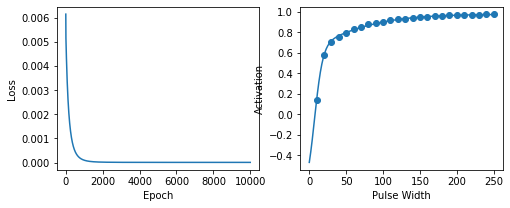

Time to fit plot:  33.56305980682373
Contact: 14, Muscle: 1
Lowest loss: 4.04e-05
a1: -0.764, a2: 0.362, a3: 0.07, a4: 13.004, a5: 0.96, a6: 0.016, a7: 13.006


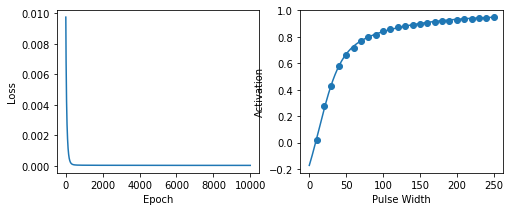

Time to fit plot:  32.668625831604004
Contact: 14, Muscle: 2
Lowest loss: 0.0001901
a1: -0.476, a2: 0.154, a3: 0.023, a4: 53.002, a5: 0.788, a6: 0.023, a7: 53.0


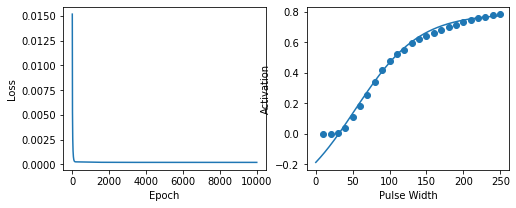

Time to fit plot:  33.45867872238159
Contact: 14, Muscle: 3
Lowest loss: 0.001257
a1: -0.394, a2: 0.119, a3: 0.026, a4: 72.065, a5: 0.632, a6: 0.026, a7: 72.055


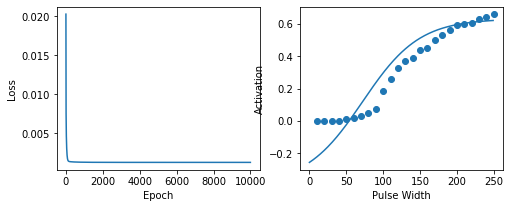

Time to fit plot:  33.179099798202515
Contact: 14, Muscle: 4
Lowest loss: 0.0014605
a1: -0.123, a2: 0.066, a3: 0.022, a4: 112.027, a5: 0.248, a6: 0.021, a7: 112.021


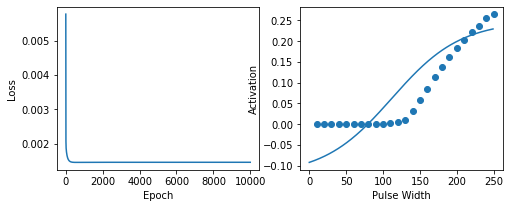

Time to fit plot:  32.93457889556885
Contact: 14, Muscle: 5
Lowest loss: 0.0
a1: 0.0, a2: 0.0, a3: 0.0, a4: 0.0, a5: 0.0, a6: 0.0, a7: 0.0


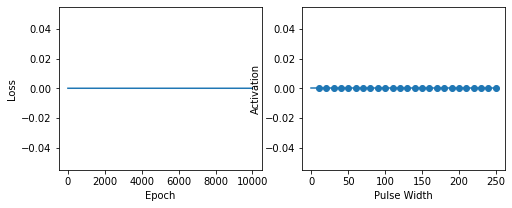

Time to fit plot:  33.679178953170776
Contact: 14, Muscle: 6
Lowest loss: 0.0
a1: 0.0, a2: 0.0, a3: 0.0, a4: 0.0, a5: 0.0, a6: 0.0, a7: 0.0


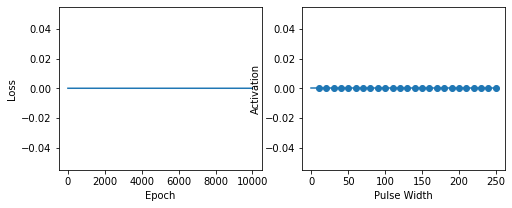

Time to fit plot:  33.84125804901123
Contact: 14, Muscle: 7
Lowest loss: 0.0
a1: 0.0, a2: 0.0, a3: 0.0, a4: 0.0, a5: 0.0, a6: 0.0, a7: 0.0


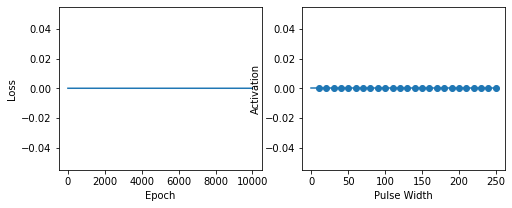

Time to fit plot:  33.0140221118927


In [132]:
pw_x = np.arange(10,260,10)
num_muscles = 8
pulse_amplitude = 1.0

print('Pulse Amplitude: {}'.format(str(pulse_amplitude)))
for contact in range(15):
    curves = get_curves(singlemuscle_singlecontact_sweeppw_8muscles,pulse_amplitude,contact)

    for muscle in range(num_muscles):
        print('Contact: {}, Muscle: {}'.format(contact, muscle))
        start = time.time()
        curve = curves[:,muscle]
        max_val = max(curve)
        halfmax = max_val*0.5
        
        arg = np.argmin(np.absolute(curve-halfmax))
        a4a7 = curve_no_negative[arg,0]
        
        fit_and_plot_double_sig(pw_x,curve, initial_theta=np.array([0.0,halfmax,0.0,a4a7,max_val,0.0,a4a7]), num_epoch = 10000)
        end = time.time()
        print("Time to fit plot: ", end - start)

In [135]:
vlad_params_8_musc = {'00': [-1.057, 0.362, 0.176, 7.061, 0.976, 0.021, 7.008],
'01': [-0.762, 0.375, 0.069, 13.004, 0.963, 0.015, 13.006],
'02': [-0.475, 0.155, 0.023, 53.003, 0.79, 0.023, 53.0],
'03': [-0.397, 0.119, 0.026, 72.062, 0.635, 0.026, 72.053],
'04': [-0.123, 0.067, 0.022, 112.027, 0.249, 0.021, 112.021],
'05': [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
'06': [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
'07': [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
'10': [0.062, 0.411, 0.036, -0.001, 1.001, 0.127, 0.002],
'11': [-0.496, 0.546, 0.118, 7.017, 0.993, 0.021, 7.003],
'12': [-0.619, 0.248, 0.041, 26.015, 0.908, 0.016, 26.006],
'13': [-0.548, 0.129, 0.024, 45.991, 0.806, 0.024, 45.993],
'14': [-0.278, 0.135, 0.027, 92.097, 0.545, 0.027, 92.084],
'15': [-0.095, 0.053, 0.021, 118.024, 0.198, 0.021, 118.019],
'16': [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
'17': [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
'20': [0.108, 0.491, 0.451, -0.01, 1.0, 0.473, -0.011],
'21': [0.147, 0.447, 0.097, -0.006, 1.0, 0.349, -0.008],
'22': [-0.548, 0.452, 0.086, 13.02, 0.975, 0.017, 13.004],
'23': [-0.6, 0.327, 0.051, 26.041, 0.918, 0.016, 26.004],
'24': [-0.49, 0.149, 0.022, 52.995, 0.792, 0.022, 52.996],
'25': [-0.393, 0.12, 0.028, 79.109, 0.629, 0.028, 79.086],
'26': [-0.143, 0.09, 0.027, 112.08, 0.318, 0.027, 112.066],
'27': [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
'30': [-1.293, 0.246, 0.142, 7.056, 0.962, 0.019, 7.011],
'31': [-0.476, -0.187, 0.024, 0.005, 0.993, 0.114, 0.071],
'32': [0.171, 0.423, 0.073, -0.006, 1.0, 0.346, -0.008],
'33': [0.09, 0.476, 0.072, -0.003, 1.0, 0.23, -0.003],
'34': [-0.37, -0.132, 0.016, 0.001, 0.997, 0.109, 0.056],
'35': [-0.761, 0.523, 0.095, 13.016, 0.99, 0.015, 13.006],
'36': [-0.581, 0.193, 0.061, 26.029, 0.921, 0.016, 26.004],
'37': [-0.62, 0.127, 0.035, 33.026, 0.829, 0.019, 32.998],
'40': [-0.538, 0.107, 0.025, 46.004, 0.746, 0.025, 45.998],
'41': [-0.497, 0.317, 0.037, 32.997, 0.909, 0.016, 33.005],
'42': [-0.745, 0.368, 0.14, 7.026, 0.991, 0.023, 7.006],
'43': [0.008, 0.443, 0.055, -0.001, 1.0, 0.162, 0.004],
'44': [0.077, 0.496, 0.299, -0.005, 0.999, 0.321, -0.006],
'45': [0.083, 0.497, 0.244, -0.005, 0.999, 0.308, -0.006],
'46': [0.134, 0.433, 0.061, -0.004, 0.999, 0.233, -0.003],
'47': [-0.595, -0.067, 0.02, 7.004, 1.004, 0.161, 7.071],
'50': [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
'51': [-0.165, 0.069, 0.021, 99.021, 0.295, 0.021, 99.016],
'52': [-0.445, 0.128, 0.023, 59.009, 0.708, 0.024, 59.008],
'53': [-0.552, 0.256, 0.034, 33.021, 0.875, 0.02, 33.004],
'54': [-0.746, 0.363, 0.092, 13.019, 0.98, 0.016, 13.006],
'55': [-0.55, -0.223, 0.022, 0.004, 1.003, 0.112, 0.076],
'56': [0.073, 0.497, 0.28, -0.005, 1.0, 0.303, -0.005],
'57': [0.109, 0.49, 0.454, -0.01, 1.0, 0.476, -0.011],
'60': [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
'61': [-0.004, 0.006, 0.007, 118.0, 0.006, 0.0, 118.0],
'62': [-0.2, 0.096, 0.025, 99.05, 0.383, 0.024, 99.041],
'63': [-0.374, 0.16, 0.025, 72.056, 0.696, 0.025, 72.049],
'64': [-0.516, 0.226, 0.037, 39.023, 0.856, 0.017, 38.996],
'65': [-0.63, 0.467, 0.074, 13.021, 0.975, 0.015, 13.005],
'66': [-1.066, 0.53, 0.119, 0.065, 1.002, 0.02, 0.006],
'67': [0.055, 0.498, 0.064, -0.001, 1.0, 0.195, -0.002],
'70': [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
'71': [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
'72': [-0.009, 0.012, 0.012, 118.0, 0.015, -0.0, 118.0],
'73': [-0.102, 0.087, 0.022, 112.029, 0.275, 0.022, 112.024],
'74': [-0.393, 0.127, 0.025, 72.052, 0.651, 0.025, 72.046],
'75': [-0.56, 0.289, 0.034, 33.014, 0.899, 0.016, 33.006],
'76': [-0.628, 0.286, 0.079, 20.053, 0.932, 0.017, 20.004],
'77': [-1.056, 0.403, 0.147, 7.048, 0.997, 0.016, 7.008],
'80': [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
'81': [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
'82': [-0.046, 0.014, 0.01, 118.001, 0.07, 0.009, 118.0],
'83': [-0.168, 0.118, 0.026, 105.067, 0.398, 0.025, 105.057],
'84': [-0.422, 0.133, 0.025, 66.035, 0.691, 0.025, 66.032],
'85': [-0.486, 0.312, 0.043, 33.015, 0.901, 0.017, 33.005],
'86': [-0.816, 0.341, 0.079, 13.03, 0.956, 0.015, 13.008],
'87': [-0.664, 0.481, 0.151, 7.027, 1.003, 0.018, 7.005],
'90': [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
'91': [-0.029, 0.01, 0.005, 118.0, 0.037, 0.005, 118.0],
'92': [-0.252, 0.102, 0.025, 92.054, 0.452, 0.025, 92.045],
'93': [-0.405, 0.164, 0.025, 66.041, 0.737, 0.025, 66.035],
'94': [-0.537, 0.248, 0.041, 33.021, 0.872, 0.017, 33.002],
'95': [-0.801, 0.487, 0.083, 7.028, 0.976, 0.017, 7.006],
'96': [-0.593, -0.131, 0.025, 0.005, 1.002, 0.116, 0.067],
'97': [0.113, 0.482, 0.09, -0.004, 1.0, 0.332, -0.007],
'100': [-0.102, 0.073, 0.026, 118.063, 0.249, 0.026, 118.055],
'101': [-0.312, 0.126, 0.026, 86.076, 0.563, 0.026, 86.064],
'102': [-0.528, 0.238, 0.028, 39.001, 0.849, 0.017, 39.0],
'103': [-0.812, 0.568, 0.057, 13.037, 0.945, 0.012, 13.006],
'104': [-1.188, 0.503, 0.121, 0.076, 0.991, 0.024, 0.008],
'105': [0.077, 0.496, 0.317, -0.005, 1.0, 0.334, -0.006],
'106': [0.069, 0.497, 0.28, -0.004, 1.0, 0.297, -0.005],
'107': [0.112, 0.49, 0.468, -0.011, 1.0, 0.491, -0.012],
'110': [-0.662, 0.128, 0.043, 26.047, 0.841, 0.019, 26.013],
'111': [-0.6, 0.321, 0.067, 20.013, 0.947, 0.017, 20.006],
'112': [-0.283, 0.061, 0.026, 0.001, 0.995, 0.111, 0.036],
'113': [0.099, 0.492, 0.42, -0.009, 1.0, 0.44, -0.009],
'114': [0.132, 0.407, 0.05, -0.003, 1.0, 0.182, -0.001],
'115': [-0.366, 0.538, 0.15, 0.02, 0.996, 0.069, 0.007],
'116': [-0.736, 0.305, 0.126, 12.996, 0.967, 0.018, 13.006],
'117': [-0.862, 0.271, 0.076, 13.046, 0.94, 0.017, 13.011],
'120': [0.104, 0.478, 0.1, -0.004, 1.0, 0.289, -0.006],
'121': [0.112, 0.48, 0.15, -0.006, 1.0, 0.344, -0.008],
'122': [-0.227, 0.14, 0.038, 0.001, 0.994, 0.127, 0.033],
'123': [-1.167, 0.428, 0.121, 7.048, 1.003, 0.017, 7.008],
'124': [-0.621, 0.29, 0.04, 26.008, 0.914, 0.015, 26.004],
'125': [-0.587, 0.113, 0.025, 45.983, 0.813, 0.025, 45.984],
'126': [-0.372, 0.114, 0.027, 79.083, 0.597, 0.027, 79.066],
'127': [-0.294, 0.125, 0.03, 92.139, 0.525, 0.029, 92.112],
'130': [0.073, 0.452, 0.047, -0.001, 1.001, 0.16, 0.0],
'131': [-1.072, 0.578, 0.115, 0.066, 0.995, 0.022, 0.007],
'132': [-0.54, 0.253, 0.057, 26.016, 0.932, 0.016, 26.006],
'133': [-0.501, 0.26, 0.033, 46.029, 0.835, 0.019, 45.988],
'134': [-0.311, 0.145, 0.026, 86.093, 0.603, 0.026, 86.076],
'135': [-0.136, 0.083, 0.025, 112.057, 0.294, 0.025, 112.045],
'136': [-0.004, 0.008, 0.002, 0.0, 0.002, -0.002, 0.0],
'137': [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
'140': [-1.077, 0.357, 0.177, 7.062, 0.976, 0.021, 7.008],
'141': [-0.764, 0.362, 0.07, 13.004, 0.96, 0.016, 13.006],
'142': [-0.476, 0.154, 0.023, 53.002, 0.788, 0.023, 53.0],
'143': [-0.394, 0.119, 0.026, 72.065, 0.632, 0.026, 72.055],
'144': [-0.123, 0.066, 0.022, 112.027, 0.248, 0.021, 112.021],
'145': [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
'146': [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
'147': [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]}

ben_params_8_musc = {'101': [-0.005, 0.072, 0.049, 147.996, 0.136, 0.049, 147.997],
'102': [-0.035, 0.062, 0.022, 62.008, 0.149, 0.02, 62.008],
'103': [-0.027, 0.061, 0.157, 111.002, 0.13, 0.007, 111.001],
'104': [-0.008, 0.518, 0.089, 198.83, 0.855, 0.087, 198.681],
'105': [-0.001, 0.008, 0.035, 148.0, 0.018, 0.035, 148.0],
'106': [-0.009, 0.239, 0.063, 148.291, 0.422, 0.063, 148.246],
'107': [-0.004, 0.111, 0.036, 160.969, 0.232, 0.036, 160.965],
'108': [-0.006, 0.12, 0.053, 124.011, 0.234, 0.053, 124.01],
'111': [-0.0, 0.078, 0.068, 68.977, 0.153, 0.069, 68.978],
'112': [-0.034, 0.049, 0.007, 165.0, 0.133, 0.007, 164.999],
'113': [-0.078, 0.083, 0.039, 43.017, 0.188, 0.015, 43.001],
'114': [0.003, 0.013, 0.042, 96.0, 0.001, 0.013, 96.0],
'115': [-0.002, 0.026, 0.05, 96.0, 0.046, 0.05, 96.0],
'116': [-0.072, 0.374, 0.226, 61.795, 0.551, 0.013, 61.04],
'117': [-0.019, 0.167, 0.058, 86.958, 0.257, 0.023, 86.999],
'118': [0.046, 0.14, 0.033, 77.566, 0.536, 0.171, 76.773],
'121': [-0.061, 0.203, 0.017, 91.976, 0.465, 0.017, 91.977],
'122': [0.027, 0.335, 0.02, 104.936, 0.574, 0.327, 105.574],
'123': [-0.016, 0.485, 0.023, 85.938, 0.725, 0.159, 87.233],
'124': [-0.015, 0.003, 0.003, 112.0, 0.024, 0.003, 112.0],
'125': [-0.069, 0.037, 0.011, 72.0, 0.144, 0.011, 72.0],
'126': [-0.19, 0.035, 0.232, 44.577, 0.819, 0.036, 46.094],
'127': [-0.008, 0.284, 0.025, 91.993, 0.834, 0.06, 92.568],
'128': [-0.271, 0.304, 0.041, 39.255, 0.878, 0.04, 39.258],
'132': [0.034, 0.001, 0.135, 44.067, 0.783, 0.145, 43.471],
'133': [0.034, 0.547, 0.031, 106.973, 1.06, 0.031, 106.976],
'134': [-0.003, 0.002, 0.005, 98.0, 0.004, 0.002, 98.0],
'135': [-0.026, 0.135, 0.017, 142.996, 0.297, 0.017, 142.995],
'136': [-0.022, 0.359, 1.57, 43.413, 0.864, 0.127, 45.018],
'137': [-0.074, 0.431, 0.062, 53.53, 0.918, 0.061, 53.597],
'138': [-0.013, 1.95, 0.158, 42.721, 0.839, 0.189, 44.822],
'141': [0.04, 0.096, 0.111, 52.776, 0.341, 0.116, 52.641],
'142': [-0.002, 0.373, 0.908, 38.061, 0.77, 0.129, 38.661],
'143': [-0.023, 0.295, 0.63, 38.341, 0.413, 0.008, 38.818],
'144': [-0.138, 0.132, 2.332, 36.717, 0.325, -0.028, 40.205],
'145': [-0.023, 0.015, 0.019, 52.999, 0.057, 0.011, 53.0],
'146': [-0.065, 0.49, 0.184, 49.34, 0.876, 0.019, 52.885],
'147': [0.02, 0.474, 0.961, 37.974, 0.694, 0.109, 38.358],
'148': [0.014, 0.617, 0.121, 38.226, 0.832, 0.065, 38.618],
'151': [0.001, 0.21, 0.211, 45.216, 0.292, 0.208, 45.13],
'152': [0.014, 0.422, 0.332, 40.562, 0.673, 0.284, 40.359],
'153': [-0.038, 0.25, 0.253, 39.896, 0.387, 0.025, 39.985],
'154': [-0.001, 0.199, 0.269, 84.512, 0.75, 0.319, 84.196],
'155': [0.0, 0.003, 0.051, 50.0, 0.024, 0.191, 49.998],
'156': [-0.106, 0.241, 0.562, 45.153, 0.577, 0.034, 45.099],
'157': [0.007, 0.446, 0.328, 39.338, 0.7, 0.33, 39.465],
'158': [-0.11, 0.489, 0.22, 39.871, 0.795, 0.023, 40.018],
'161': [0.01, 0.172, 0.19, 76.819, 0.27, 0.171, 76.867],
'162': [-0.017, 0.468, 0.666, 65.385, 0.713, 0.017, 65.875],
'163': [0.011, 0.165, 0.124, 65.838, 0.335, 0.126, 65.827],
'164': [0.0, 0.122, 0.05, 188.0, 0.285, 0.115, 188.012],
'165': [0.003, -0.006, 0.089, 77.001, 0.026, 0.169, 76.992],
'166': [-0.133, 0.246, 0.812, 66.737, 0.613, 0.017, 66.029],
'167': [0.012, 0.296, 0.115, 65.297, 0.704, 1.716, 64.209],
'168': [-0.072, 0.413, 0.973, 64.997, 0.762, 0.025, 66.015],
'171': [-0.009, 0.055, 0.01, 157.968, 0.321, 0.079, 157.794],
'172': [-0.023, 0.37, 0.109, 118.95, 0.632, 0.116, 118.843],
'173': [-0.005, 0.189, 0.306, 132.525, 0.327, 0.028, 132.032],
'174': [0.002, 0.008, 0.02, 158.0, 0.0, 0.006, 158.0],
'175': [0.001, 0.034, 0.091, 145.002, 0.022, 0.053, 145.0],
'176': [-0.008, 0.054, 0.014, 131.833, 0.496, 0.12, 130.928],
'177': [-0.04, 0.479, 0.047, 119.104, 0.71, 1.079, 119.006],
'78': [-0.021, 0.156, 0.013, 131.911, 0.707, 0.099, 130.66],
'41': [-0.085, 0.195, 0.155, 61.973, 0.469, 0.013, 62.988],
'42': [0.007, 0.229, 0.954, 52.179, 0.509, 0.066, 52.799],
'43': [-0.1, 0.235, 0.411, 52.73, 0.513, 0.011, 53.004],
'44': [-0.093, 0.51, 0.813, 52.236, 0.777, 0.019, 52.88],
'45': [0.013, -0.012, 0.004, 63.0, 0.031, 0.126, 62.985],
'46': [-0.137, 0.238, 1.042, 53.974, 0.612, 0.013, 53.006],
'47': [-0.016, 0.554, 0.794, 52.239, 0.751, 0.091, 52.804],
'48': [-0.084, 0.486, 0.308, 52.931, 0.703, 0.015, 53.033],
'51': [-0.107, 0.114, 0.414, 36.458, 0.44, 0.026, 37.99],
'52': [0.138, 0.974, 0.376, 33.228, 0.41, 0.067, 34.82],
'53': [-0.062, 0.28, 0.471, 33.302, 0.483, 0.022, 33.835],
'54': [-0.21, 0.221, 1.532, 32.986, 0.93, 0.053, 35.053],
'55': [-0.001, -0.01, 0.1, 33.999, 0.038, 0.253, 34.016],
'56': [-0.038, 0.58, 0.026, 65.948, 1.203, 0.026, 65.936],
'57': [-0.003, 0.832, 0.254, 32.675, 0.723, 0.153, 33.321],
'58': [-0.07, 0.455, 0.387, 34.604, 0.702, 0.04, 34.08],
'61': [0.002, 0.764, 0.237, 46.009, 0.375, 0.283, 46.81],
'62': [0.053, 0.121, 0.293, 42.706, 0.591, 0.294, 42.993],
'63': [-0.048, 0.276, 0.489, 42.504, 0.485, 0.039, 42.032],
'64': [-0.071, 0.678, 0.942, 32.117, 0.953, 0.056, 32.287],
'65': [0.002, 0.005, 0.091, 47.001, 0.058, 0.289, 46.957],
'66': [-0.031, 0.443, 1.017, 36.244, 0.872, 0.093, 37.159],
'67': [-0.039, 0.162, 1.117, 41.359, 0.746, 0.133, 43.676],
'68': [-0.025, 0.088, 0.03, 41.636, 0.722, 0.343, 40.542],
'71': [-0.11, -0.027, 0.47, 32.728, 0.243, 0.016, 33.002],
'72': [-0.019, 0.209, 0.023, 65.948, 0.436, 0.023, 65.952],
'73': [-0.035, 0.312, 0.017, 80.944, 0.444, 0.399, 81.588],
'74': [-0.011, 0.467, 1.889, 27.034, 0.981, 0.379, 29.4],
'75': [-0.007, 0.017, 0.043, 47.0, 0.036, 0.037, 47.0],
'76': [-0.123, 0.336, 0.063, 43.434, 0.749, 0.059, 43.364],
'77': [-0.07, 0.481, 0.02, 75.949, 0.617, 0.766, 77.055],
'78': [-0.11, 0.304, 0.028, 65.951, 0.718, 0.028, 65.953],
'81': [-0.092, -0.015, 0.483, 50.962, 0.212, 0.009, 51.001],
'82': [0.059, 0.153, 0.016, 92.972, 0.247, 0.016, 92.976],
'83': [0.004, 0.547, 0.522, 42.524, 0.126, 0.441, 41.818],
'84': [-0.001, 0.525, 0.219, 57.693, 0.973, 0.197, 57.763],
'85': [-0.011, 0.003, 0.063, 76.0, 0.041, 0.013, 76.0],
'86': [-0.061, 0.222, 0.293, 65.312, 0.543, 0.023, 66.939],
'87': [-0.12, -0.05, 0.616, 50.778, 0.265, 0.011, 51.003],
'88': [-0.036, 0.152, 0.225, 50.431, 0.268, 0.011, 50.985],
'91': [-0.002, 0.073, 0.053, 157.99, 0.142, 0.053, 157.991],
'92': [-1.509, 0.071, 0.093, 143.058, 1.619, -0.063, 146.437],
'93': [-0.004, 0.245, 0.065, 118.135, 0.098, 0.037, 117.971],
'94': [-0.008, 0.021, 0.006, 157.33, 0.992, 0.14, 154.969],
'95': [-0.0, 0.008, 0.045, 171.0, 0.019, 0.045, 171.0],
'96': [0.001, 0.212, 0.055, 171.023, 0.432, 0.055, 171.024],
'97': [-0.22, 0.023, 0.081, 131.973, 0.268, -0.045, 132.031],
'98': [0.007, 0.112, 0.058, 144.961, 0.223, 0.059, 144.958]}

In [144]:
all_diffs = []
for keyben, valueben in ben_params_8_musc.items():
    for keyvlad, valuevlad in vlad_params_8_musc.items():
        diff_list = []
        for paramben, paramvlad in zip(valueben,valuevlad):
            if paramben ==0.000:
                diff = (paramben-paramvlad)/(paramben+0.001)
            else:
                diff = (paramben-paramvlad)/(paramben)
            diff_list.append(diff)
        all_diffs.append(diff_list)

In [146]:
all_diffs_arr = np.array(all_diffs).T

In [148]:
all_diffs_arr.shape

(7, 13200)

### Boxplots - Comparing Vlad's curves to Ben's Data

Percentage difference between Ben and Vlad plots
a1 parameter


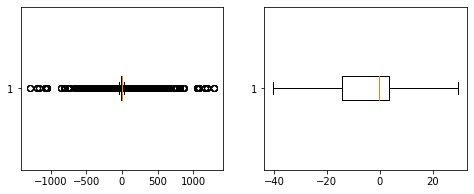

a2 parameter


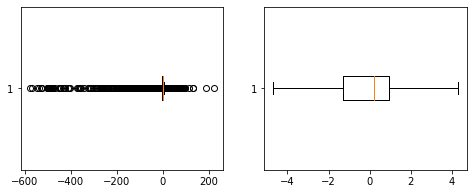

a3 parameter


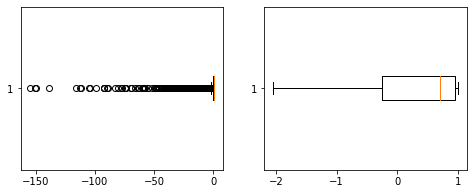

a4 parameter


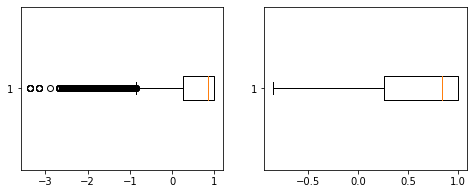

a5 parameter


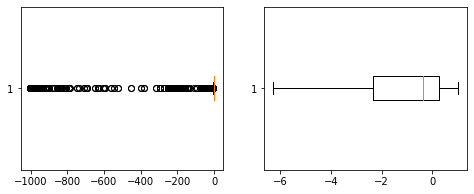

a6 parameter


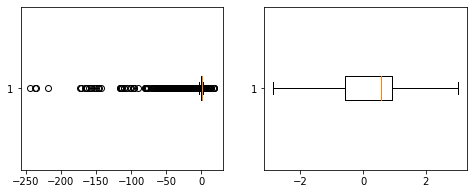

a7 parameter


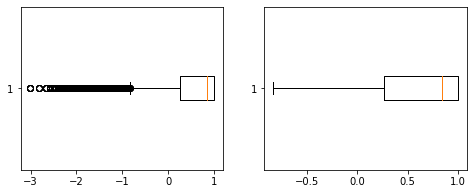

In [154]:
print('Percentage difference between Ben and Vlad plots')
for i in range(all_diffs_arr.shape[0]):
    print('a{} parameter'.format(i+1))
    fig, ax = plt.subplots(nrows = 1, ncols = 2)
    fig.set_size_inches(8, 3)
    ax[0].boxplot(all_diffs_arr[i,:], vert = False)
    ax[1].boxplot(all_diffs_arr[i,:], vert = False, showfliers=False)
    plt.show()

## Ulnar Cuff - 5 Muscles

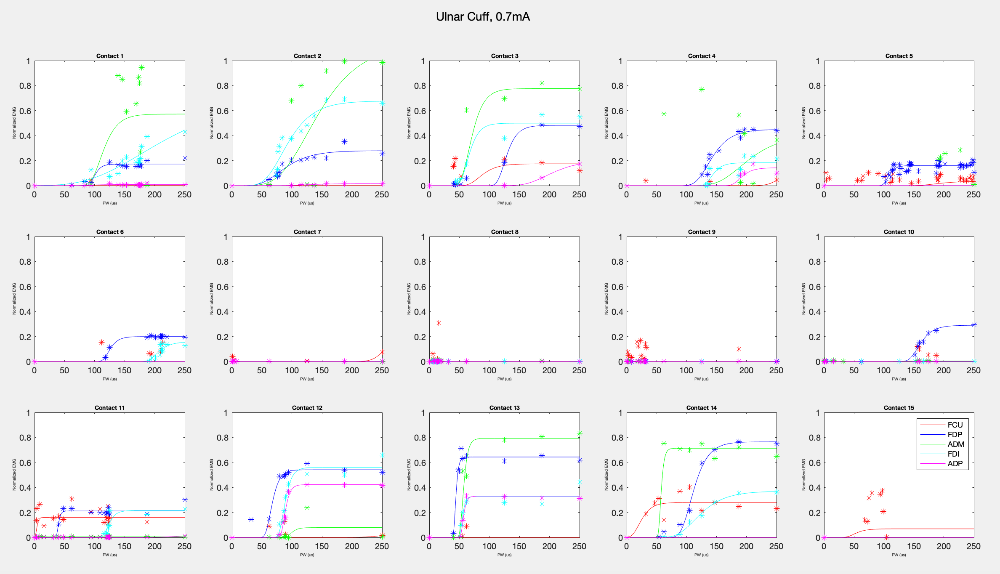

## Replotting Ulnar Cuff Data Overlayed with Ben's Single Sigmoids

Ulnar700uA_10_1.csv


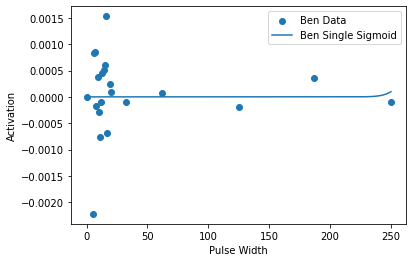

Ulnar700uA_10_2.csv


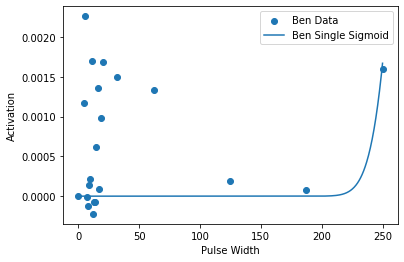

Ulnar700uA_10_3.csv


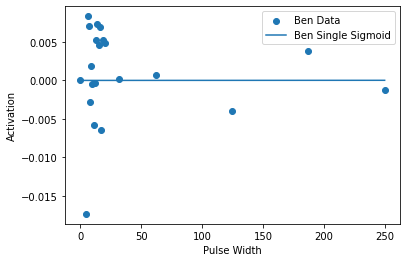

Ulnar700uA_10_4.csv


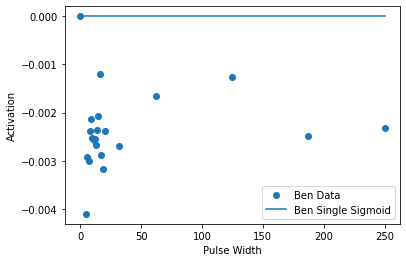

Ulnar700uA_10_5.csv


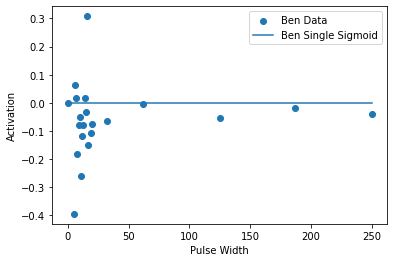

Ulnar700uA_11_1.csv


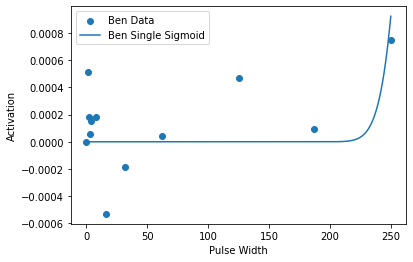

Ulnar700uA_11_2.csv


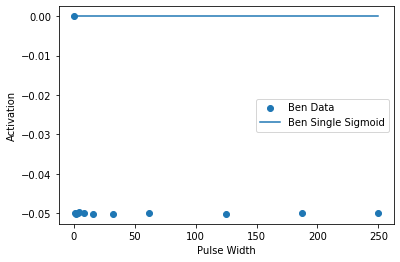

Ulnar700uA_11_3.csv


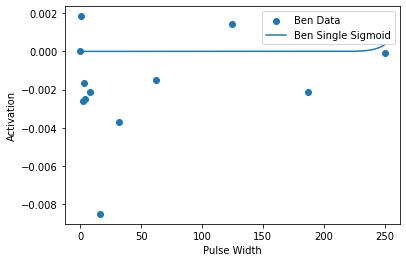

Ulnar700uA_11_4.csv


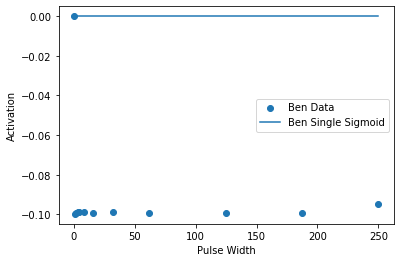

Ulnar700uA_11_5.csv


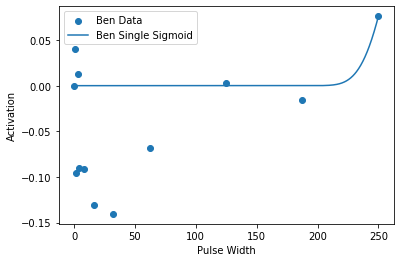

Ulnar700uA_12_1.csv


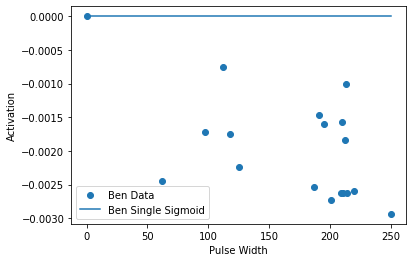

Ulnar700uA_12_2.csv


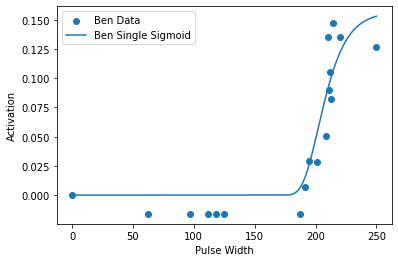

Ulnar700uA_12_3.csv


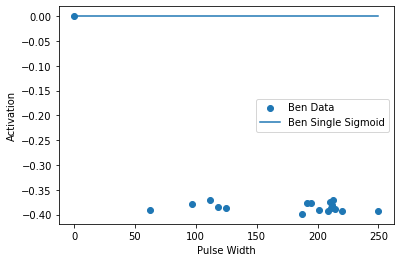

Ulnar700uA_12_4.csv


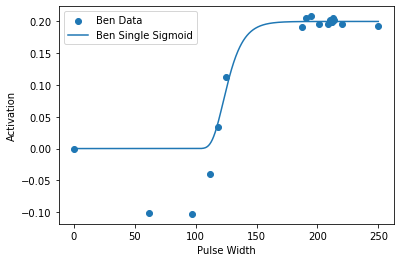

Ulnar700uA_12_5.csv


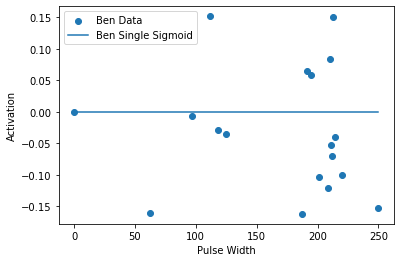

Ulnar700uA_13_1.csv


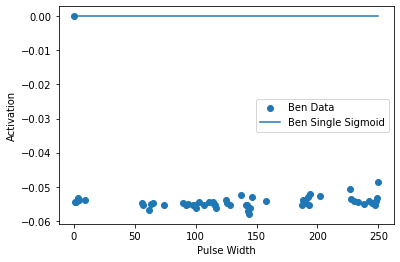

Ulnar700uA_13_2.csv


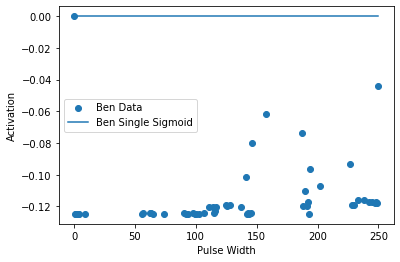

Ulnar700uA_13_3.csv


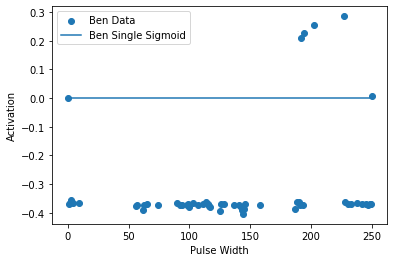

Ulnar700uA_13_4.csv


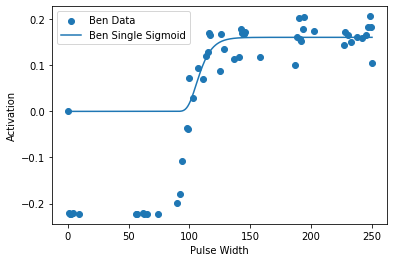

Ulnar700uA_13_5.csv


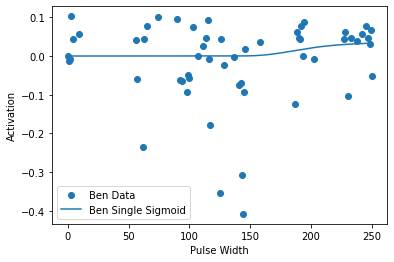

Ulnar700uA_14_1.csv


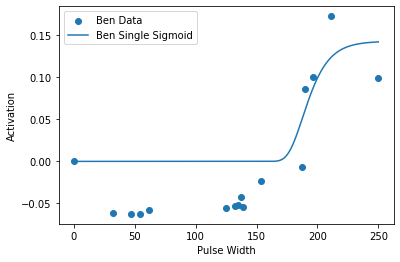

Ulnar700uA_14_2.csv


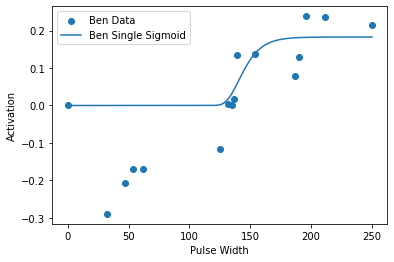

Ulnar700uA_14_3.csv


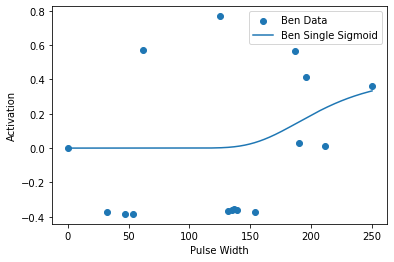

Ulnar700uA_14_4.csv


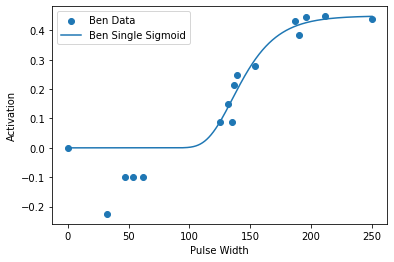

Ulnar700uA_14_5.csv


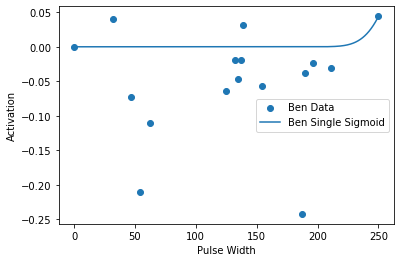

Ulnar700uA_15_1.csv


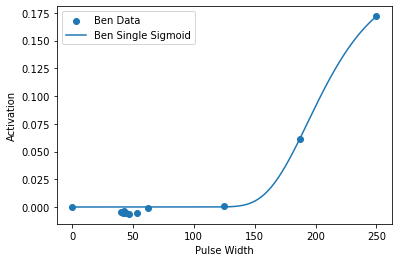

Ulnar700uA_15_2.csv


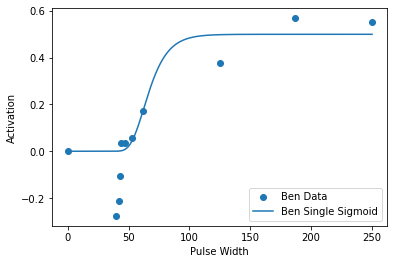

Ulnar700uA_15_3.csv


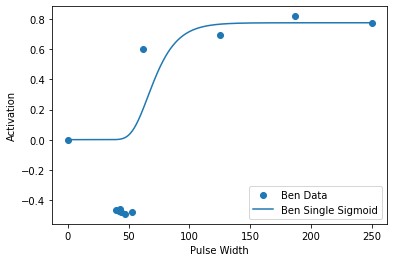

Ulnar700uA_15_4.csv


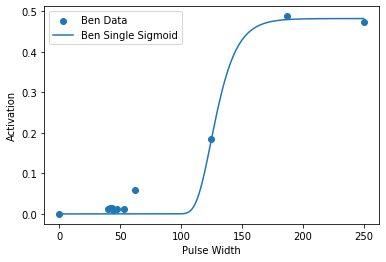

Ulnar700uA_15_5.csv


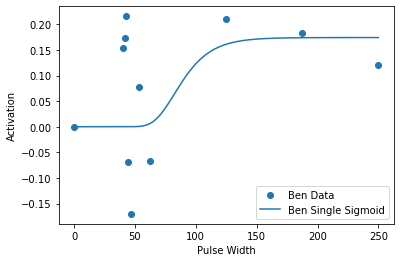

Ulnar700uA_16_1.csv


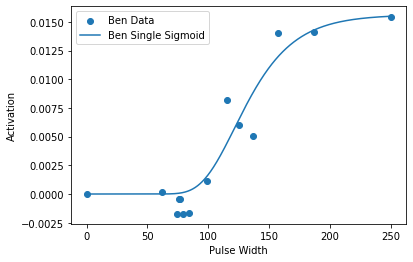

Ulnar700uA_16_2.csv


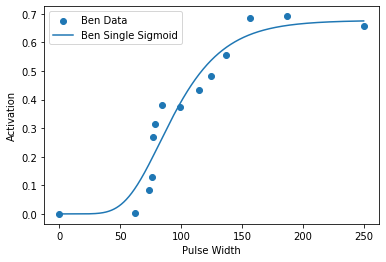

Ulnar700uA_16_3.csv


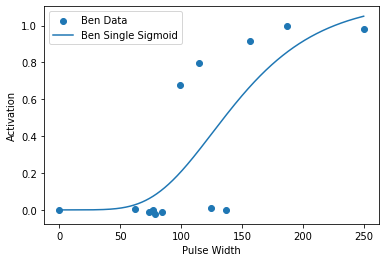

Ulnar700uA_16_4.csv


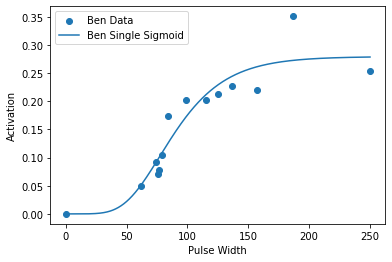

Ulnar700uA_16_5.csv


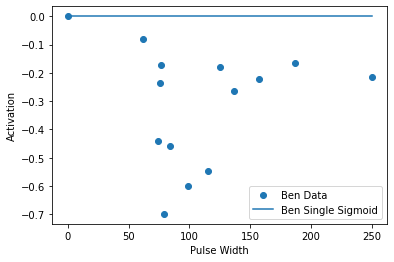

Ulnar700uA_17_1.csv


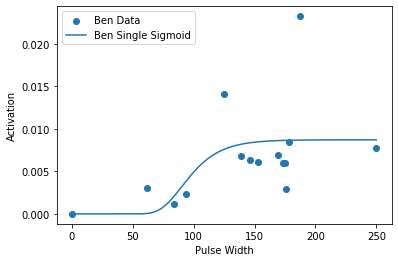

Ulnar700uA_17_2.csv


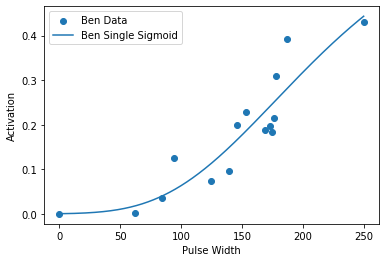

Ulnar700uA_17_3.csv


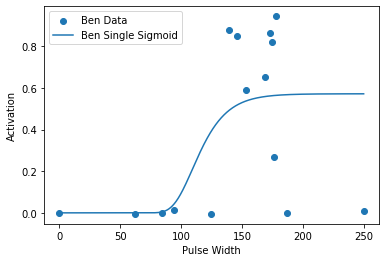

Ulnar700uA_17_4.csv


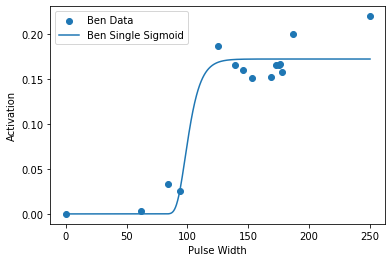

Ulnar700uA_17_5.csv


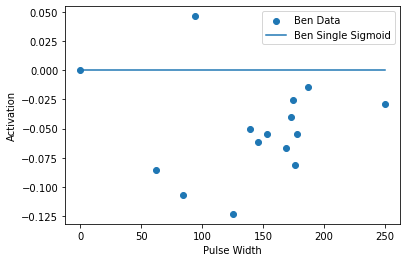

Ulnar700uA_4_1.csv


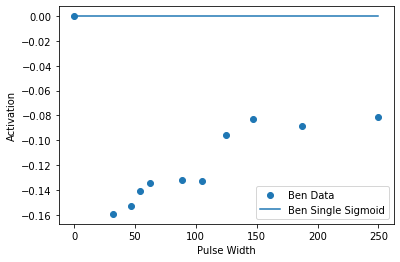

Ulnar700uA_4_2.csv


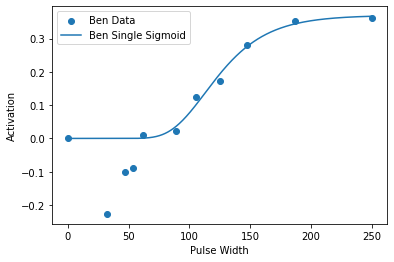

Ulnar700uA_4_3.csv


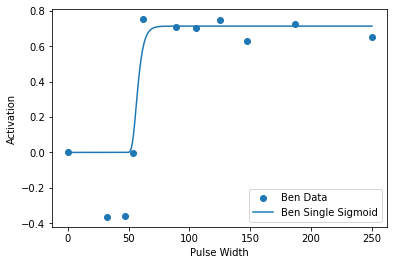

Ulnar700uA_4_4.csv


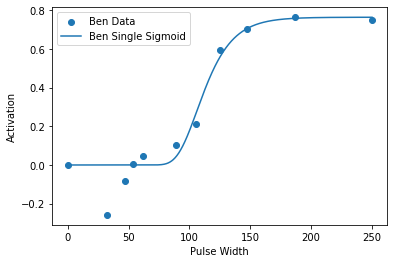

Ulnar700uA_4_5.csv


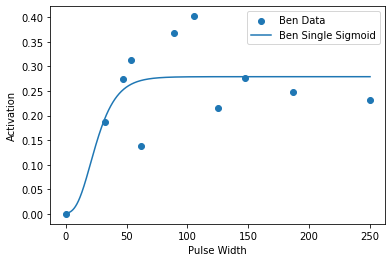

Ulnar700uA_5_1.csv


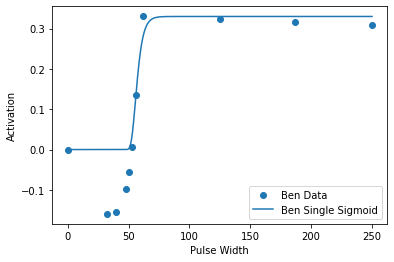

Ulnar700uA_5_2.csv


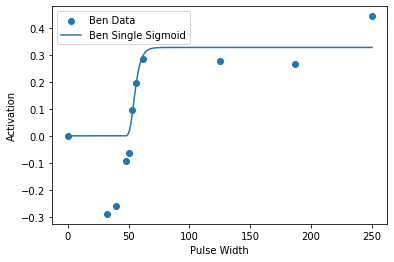

Ulnar700uA_5_3.csv


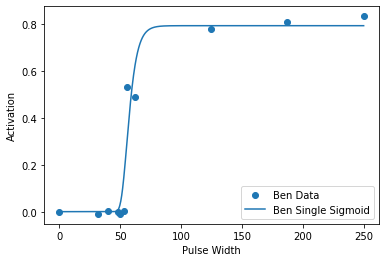

Ulnar700uA_5_4.csv


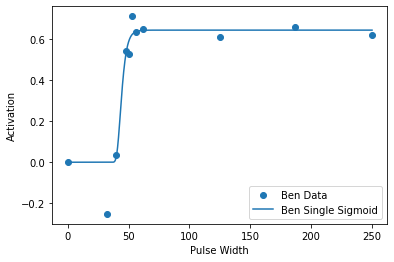

Ulnar700uA_5_5.csv


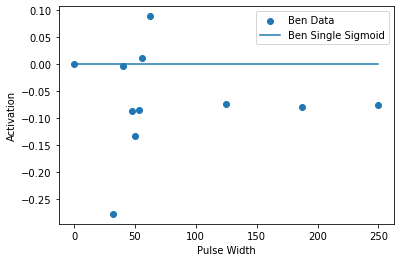

Ulnar700uA_6_1.csv


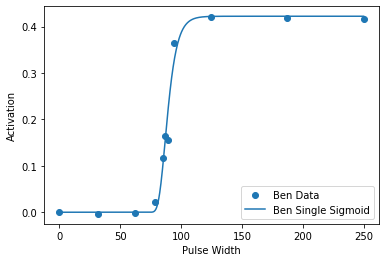

Ulnar700uA_6_2.csv


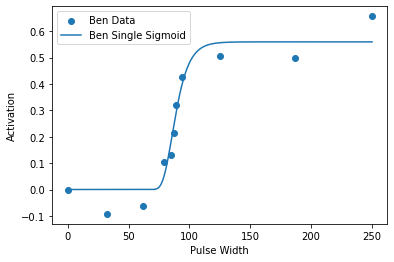

Ulnar700uA_6_3.csv


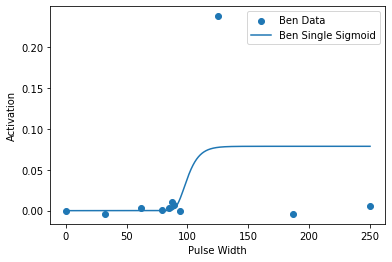

Ulnar700uA_6_4.csv


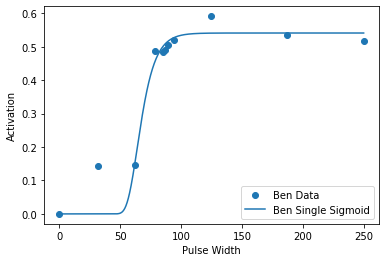

Ulnar700uA_6_5.csv


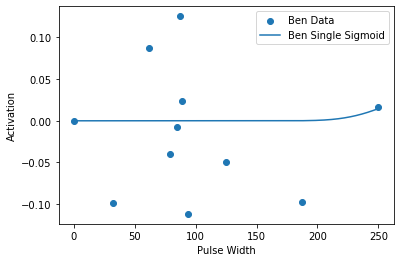

Ulnar700uA_7_1.csv


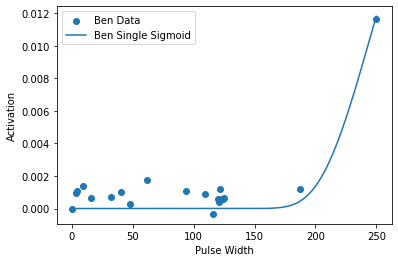

Ulnar700uA_7_2.csv


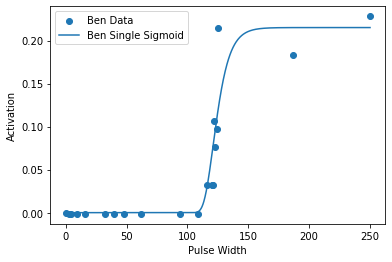

Ulnar700uA_7_3.csv


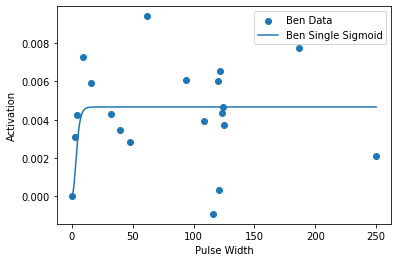

Ulnar700uA_7_4.csv


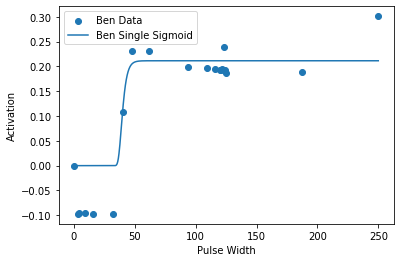

Ulnar700uA_7_5.csv


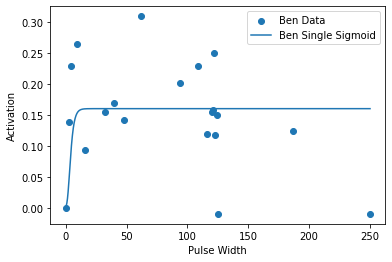

Ulnar700uA_8_1.csv


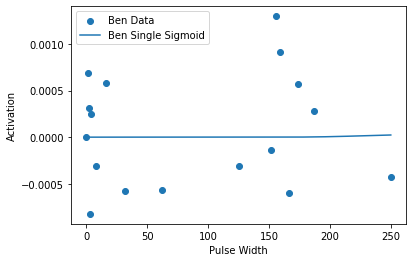

Ulnar700uA_8_2.csv


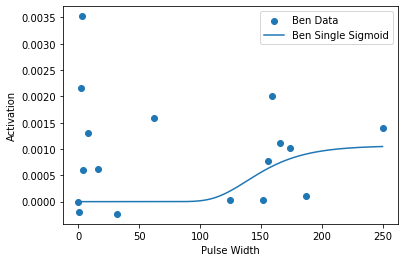

Ulnar700uA_8_3.csv


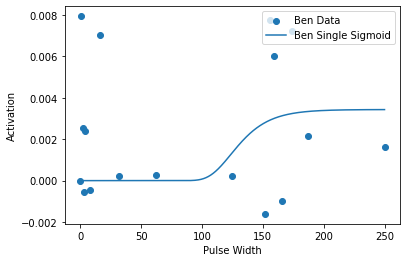

Ulnar700uA_8_4.csv


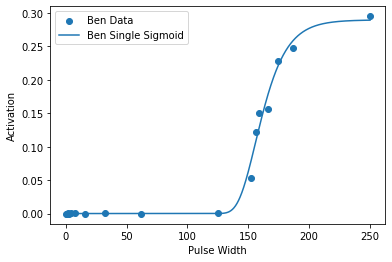

Ulnar700uA_8_5.csv


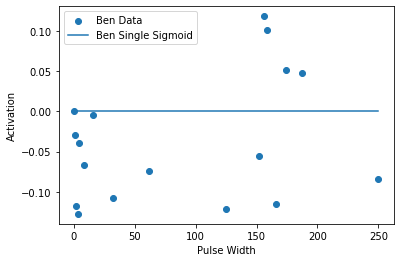

Ulnar700uA_9_1.csv


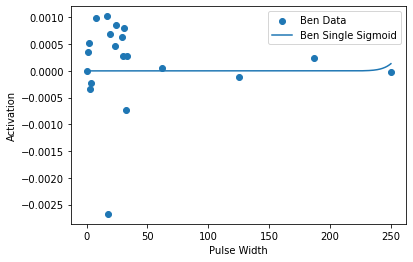

Ulnar700uA_9_2.csv


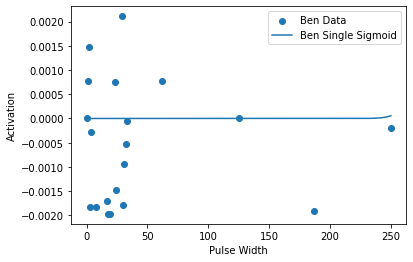

Ulnar700uA_9_3.csv


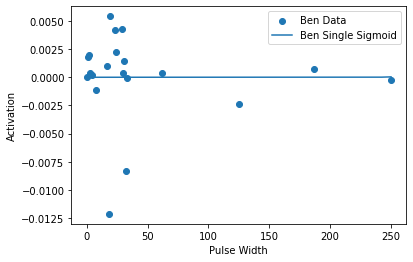

Ulnar700uA_9_4.csv


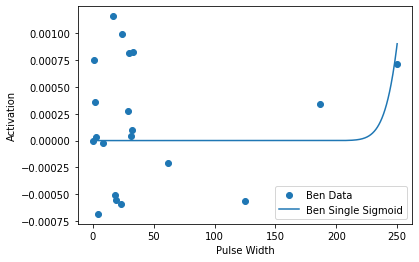

Ulnar700uA_9_5.csv


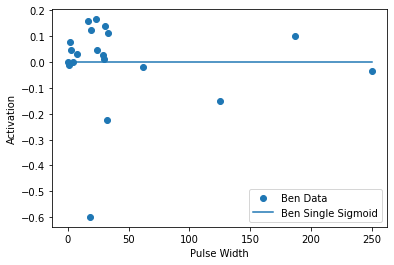

In [118]:
import os
path = '/Volumes/L_MillerLab/limblab/User_folders/Aajan/RecruitmentCurveFigures/Ulnar700uA'
filenames = sorted([filename for filename in os.listdir(path)])
for filename in filenames:
    if 'sigmoid' not in filename:
        print(filename)
        f = os.path.join(path,filename)
        f2 = os.path.join(path,filename[:-4]+'_sigmoid.csv')
        curve = np.genfromtxt(f, delimiter = ',')
        sigmoid = np.genfromtxt(f2, delimiter = ',')
        plt.scatter(curve[:,0],curve[:,1], label = 'Ben Data')
        plt.plot(sigmoid[:,0],sigmoid[:,1], label = 'Ben Single Sigmoid')
        plt.xlabel('Pulse Width')
        plt.ylabel('Activation')
        plt.legend()
        plt.show()

# 5 Drawn Muscles - 250 pw points

In [2]:
singlemuscle_singlecontact_sweeppw_5muscles_250pts = np.genfromtxt('/Volumes/L_MillerLab/limblab/User_folders/Aajan/PNS_Modeling_Toolbox-main/COMSOL_Modeling/mmActivationMatrix_SweepPW_5muscles_250pts.csv', delimiter=',')

In [5]:
singlemuscle_singlecontact_sweeppw_5muscles_250pts.shape

(18750, 5)

In [ ]:
curves = get_curves_2(singlemuscle_singlecontact_sweeppw_5muscles_250pts, pulse_amplitude,contact)

In [19]:
def get_curves_2(data, pulse_amplitude, contact):
    #this function returns the muscle activation as a function of pulse width for all muscles for a particular 
        #contact at a particular pulse amplitude
    #pulse amp values range between 1.5 and 3 mA (500 to 3000 uA) at an increment of 0.5mA
    #pulse width values range between 1 and 250 at an increment of 1
    contact_start, contact_finish = (contact)*(5*250), (contact+1)*(5*250)
    curves_contact = data[contact_start:contact_finish,:]
    i = (pulse_amplitude-0.5)/0.5
    pa_start, pa_finish = int((i-1)*250), int(i*250)
    curves_contact_amp = curves_contact[pa_start:pa_finish,:]
    return(curves_contact_amp)

Pulse Amplitude: 1.0


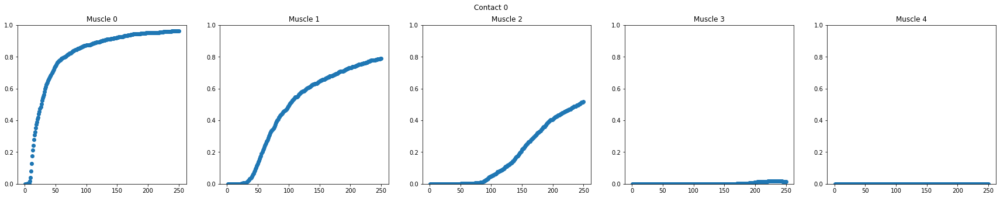

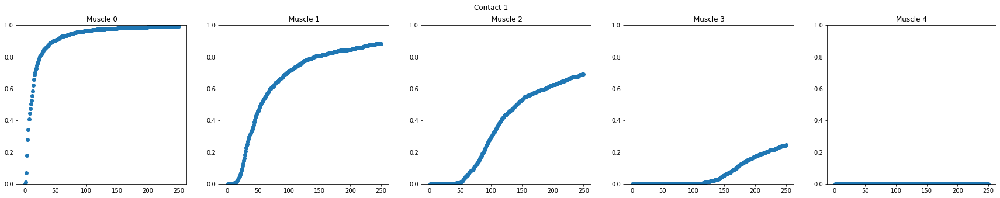

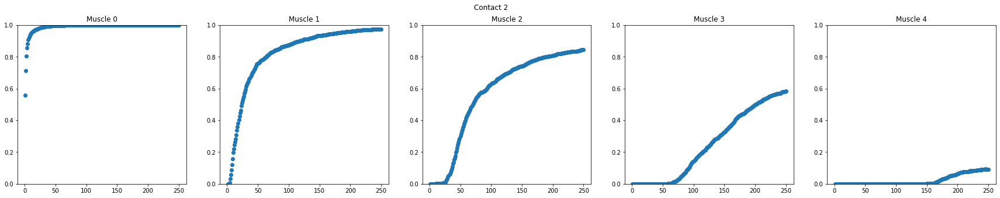

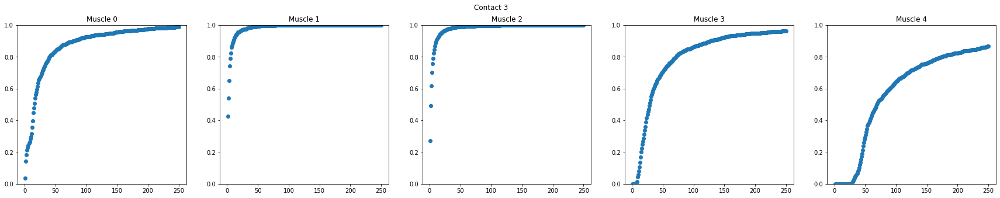

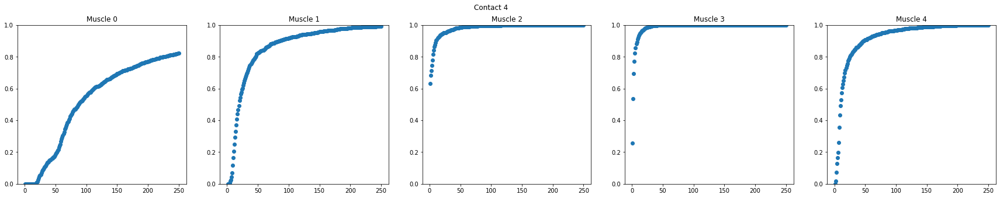

...

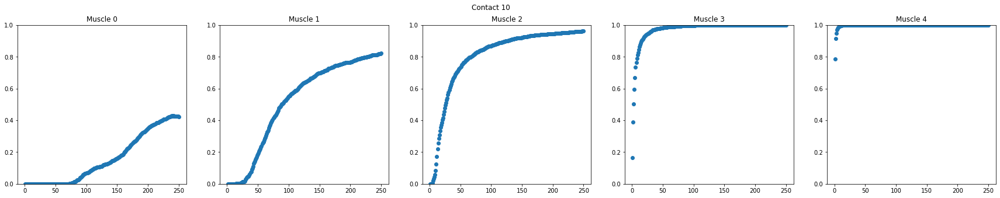

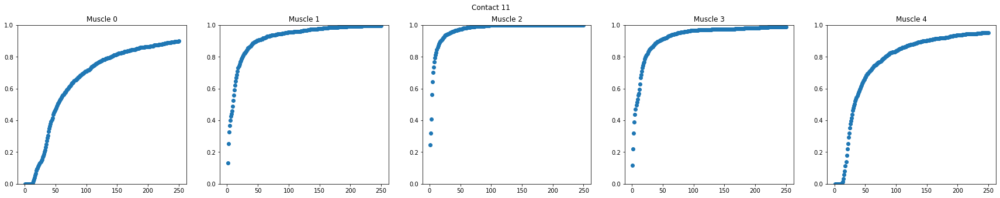

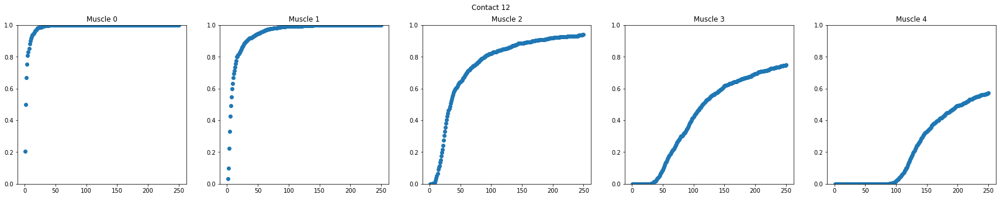

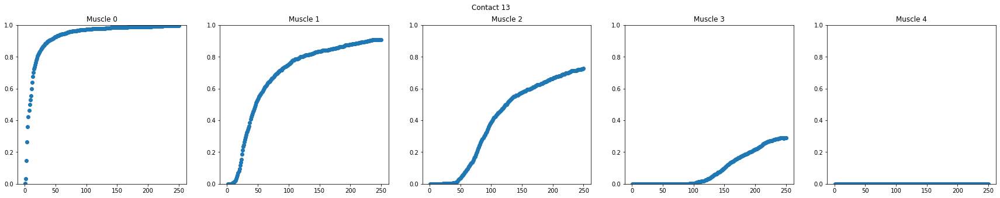

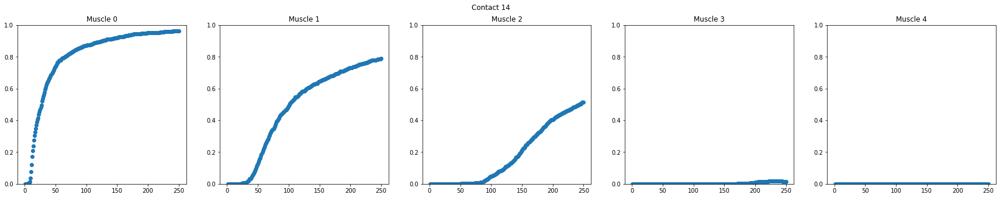

Pulse Amplitude: 1.5


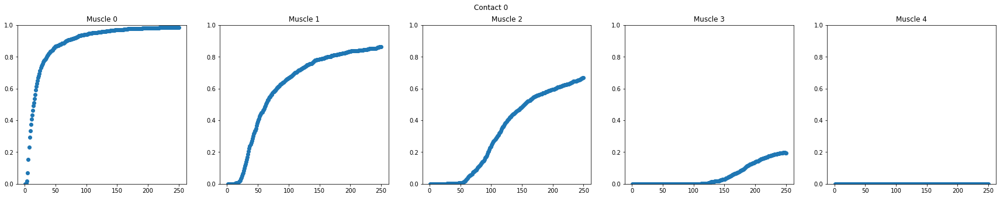

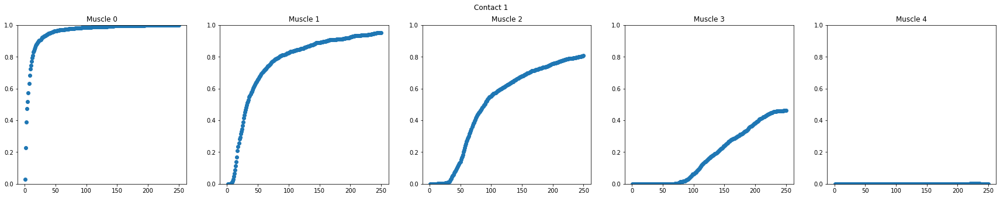

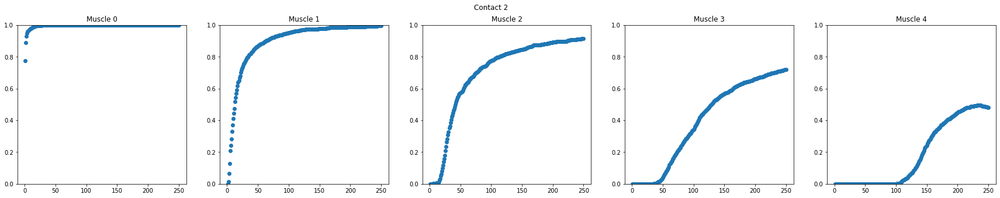

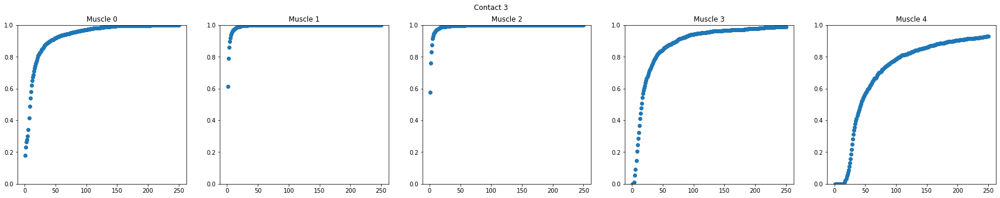

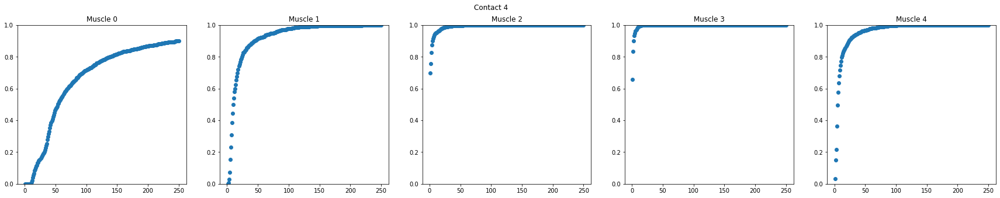

...

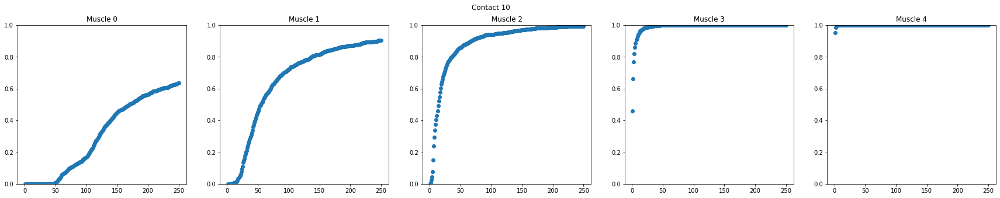

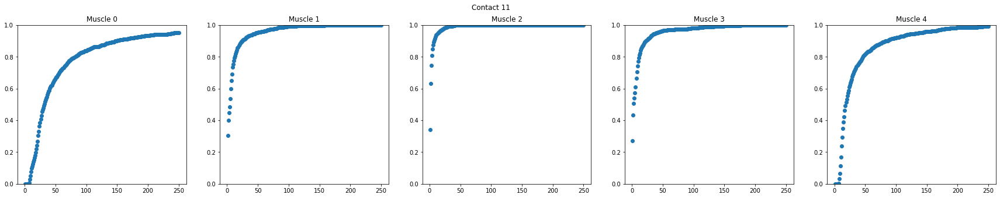

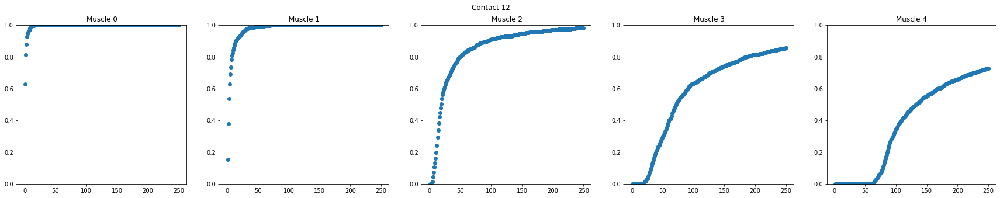

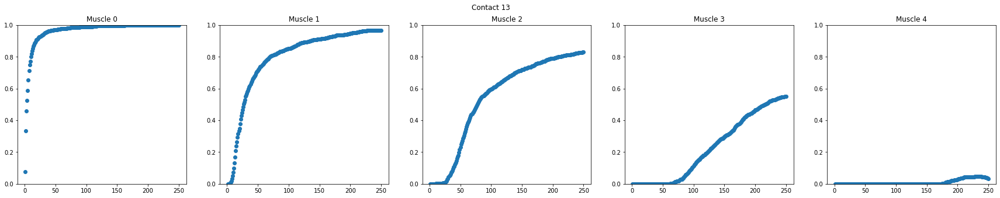

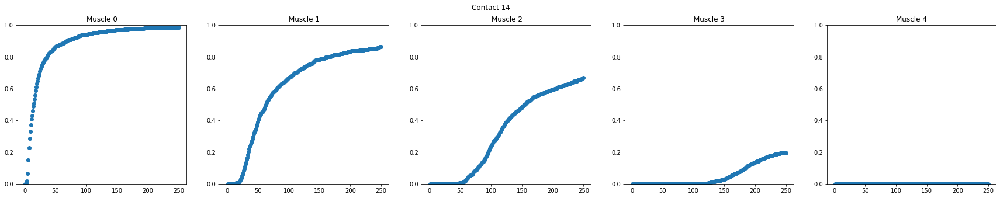

Pulse Amplitude: 2.0


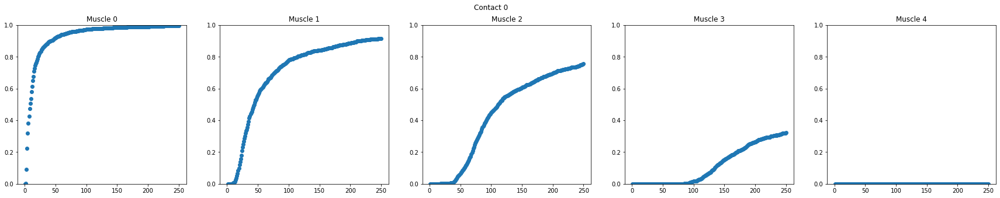

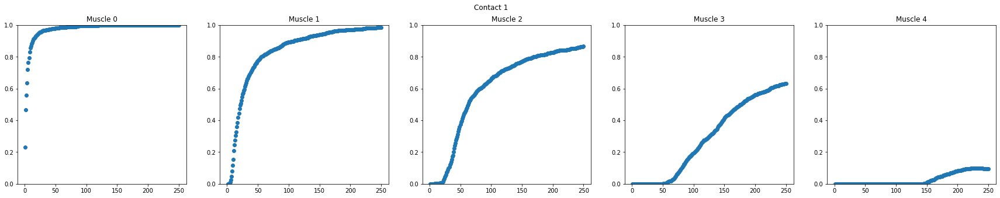

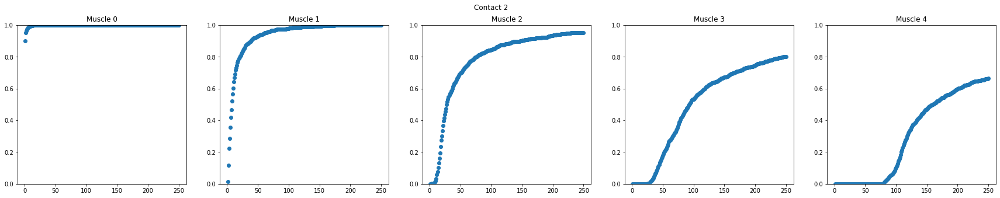

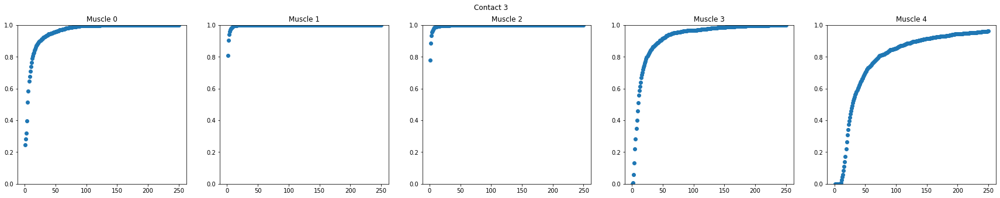

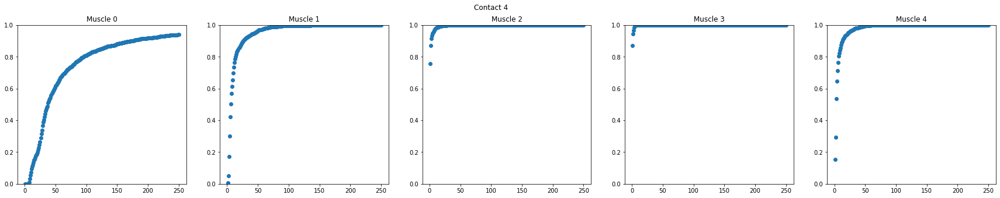

...

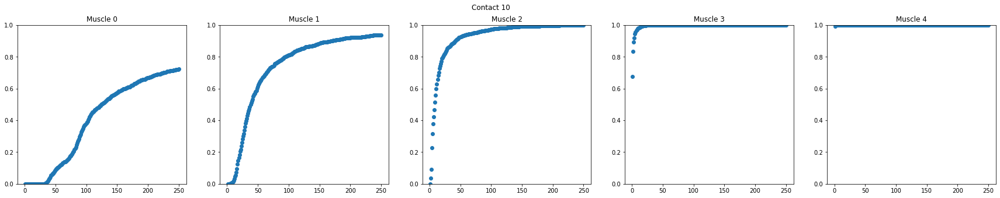

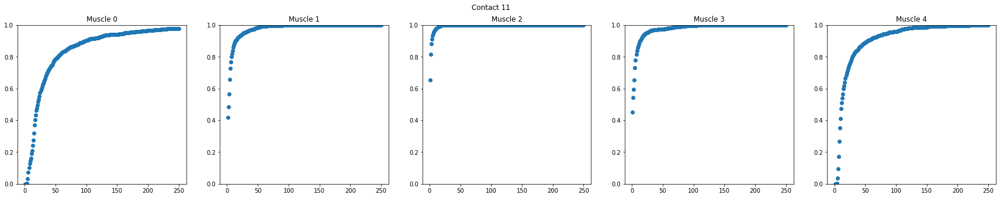

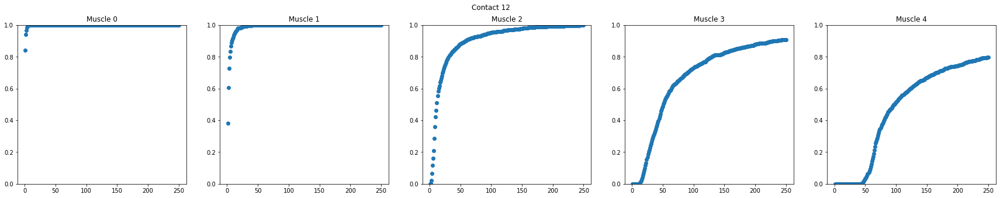

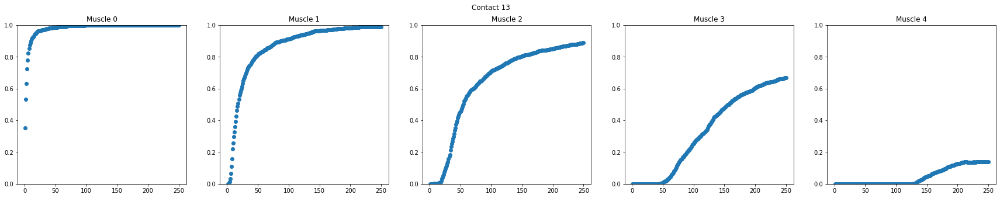

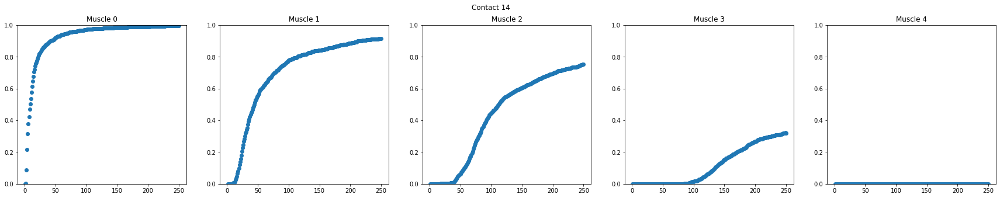

Pulse Amplitude: 2.5


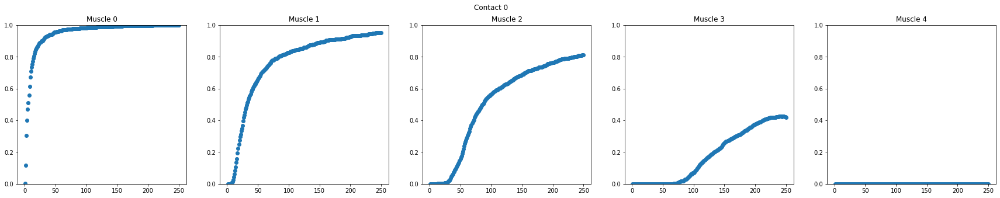

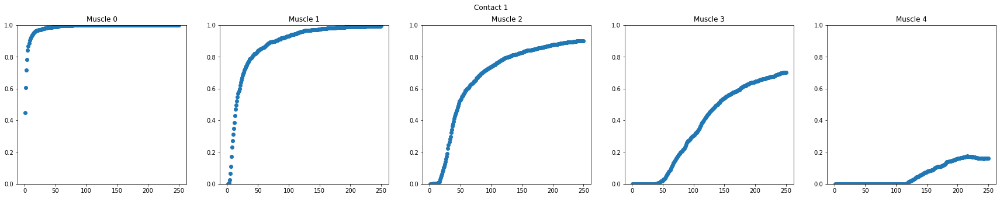

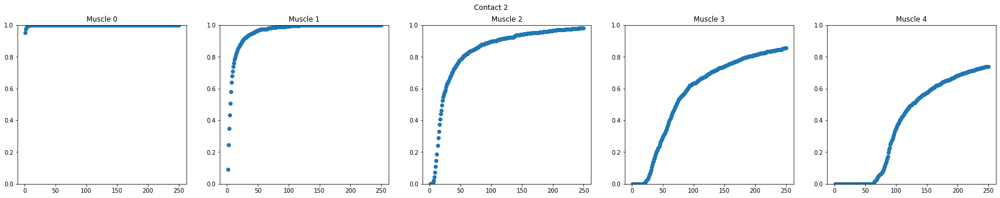

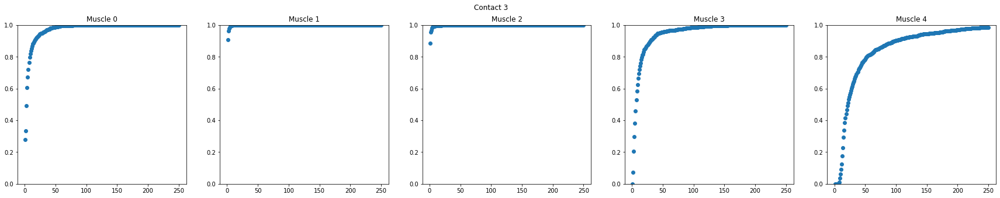

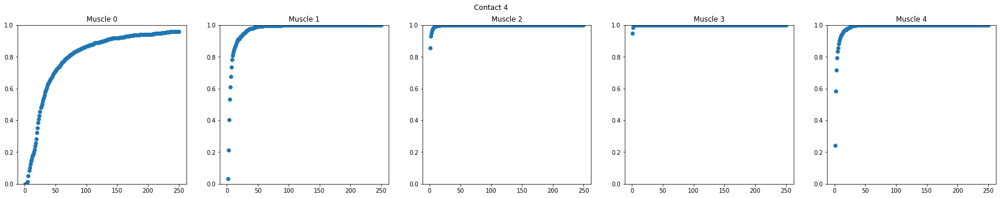

...

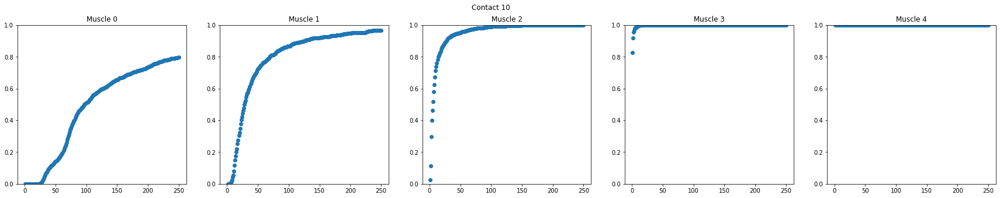

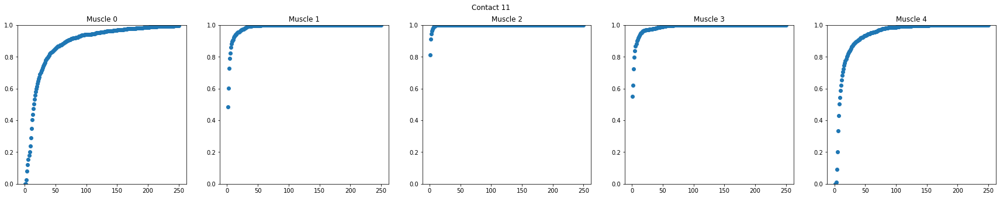

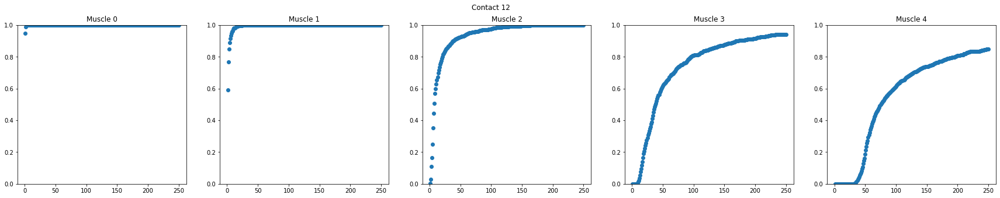

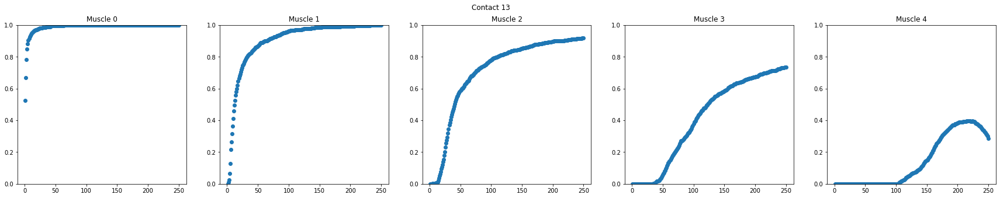

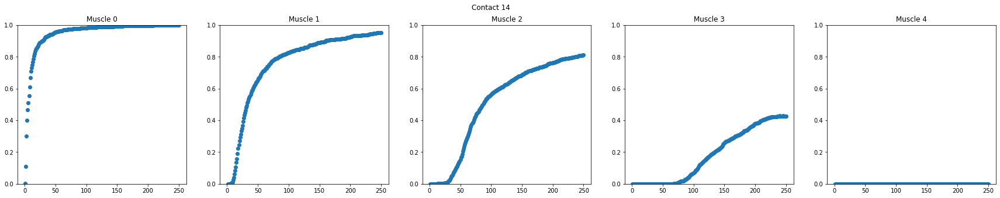

Pulse Amplitude: 3.0


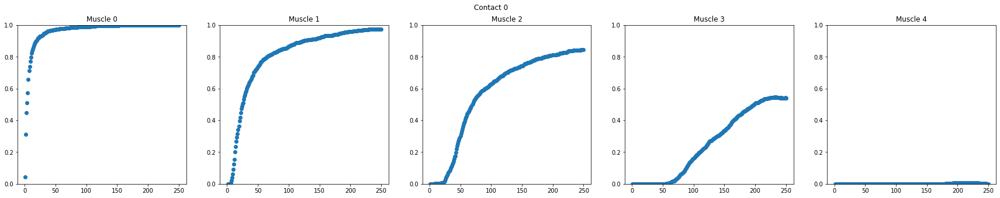

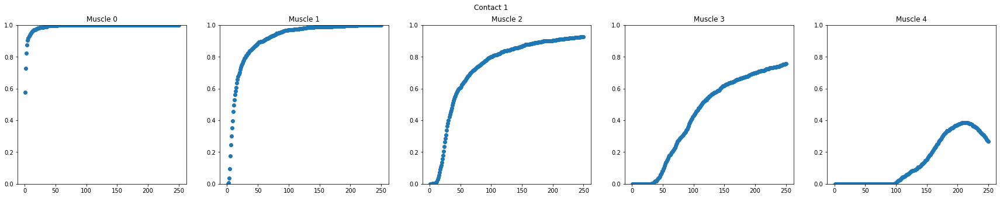

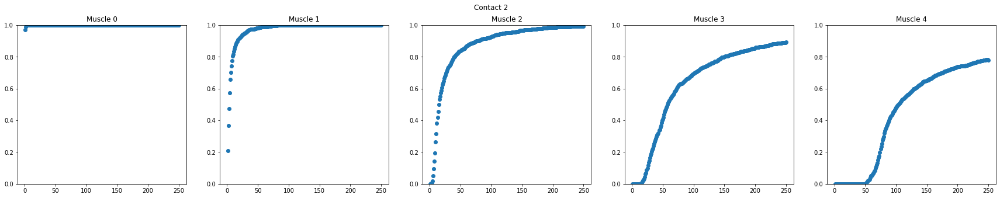

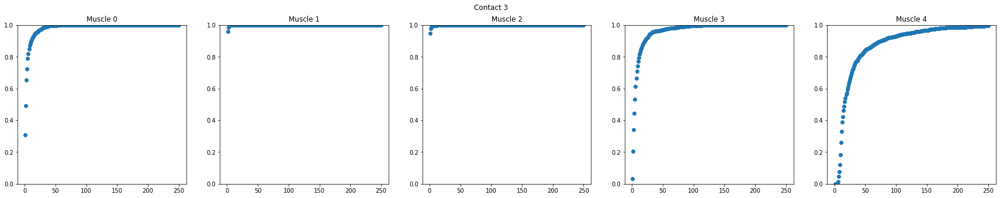

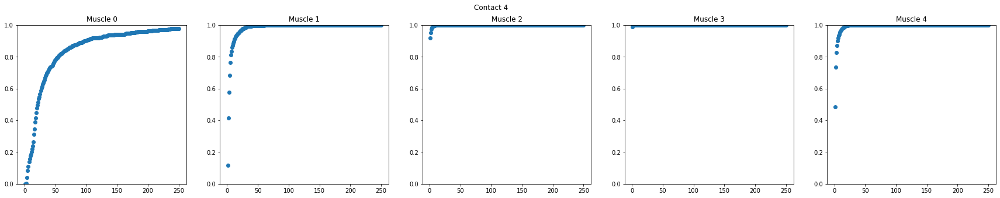

...

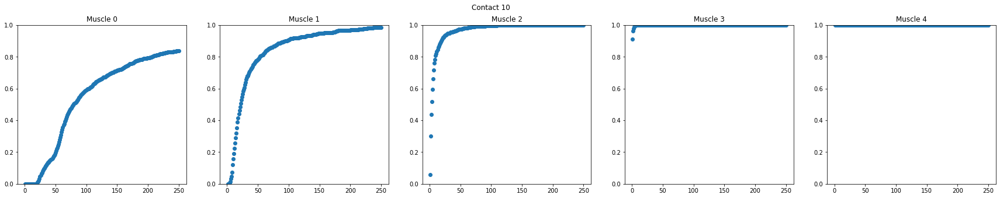

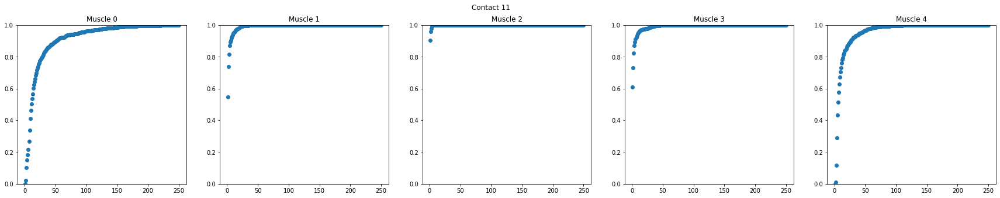

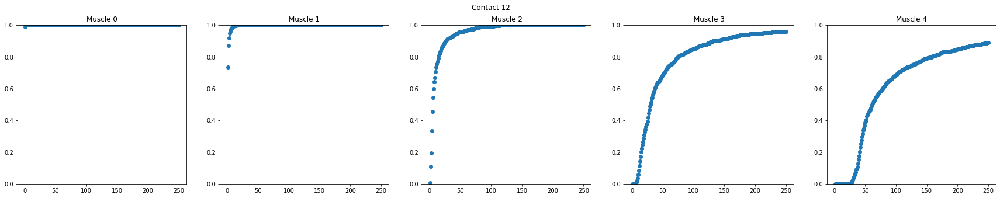

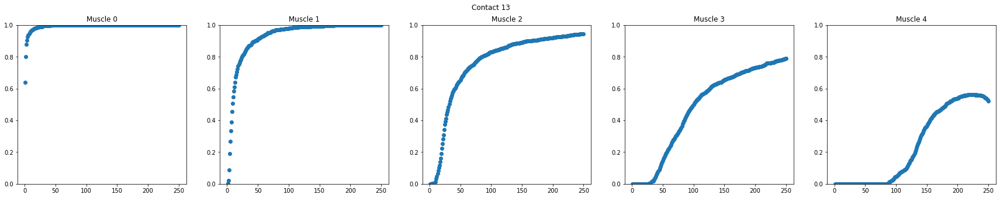

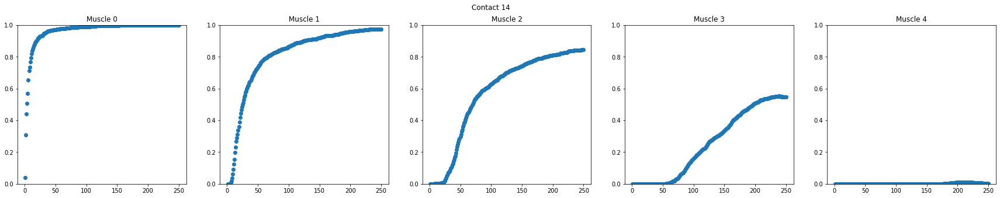

In [20]:
pw_x = np.arange(1,251)
pulse_amplitudes = np.arange(1.0,3.5,0.5)
for pulse_amplitude in pulse_amplitudes:
    print('Pulse Amplitude: {}'.format(str(pulse_amplitude)))
    for contact in range(15):
        curves = get_curves_2(singlemuscle_singlecontact_sweeppw_5muscles_250pts, pulse_amplitude,contact)
        fig, ax = plt.subplots(nrows = 1, ncols = 5)
        fig.set_size_inches(30, 5)
        fig.suptitle('Contact {}'.format(contact))

        for muscle in range(5):
            ax[muscle].set_title('Muscle {}'.format(muscle))
            ax[muscle].set_ylim(0, 1)
            ax[muscle].scatter(pw_x,curves[:,muscle])
        plt.show()